##Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##Instaling Dependencies

In [ ]:
!pip install hdf5storage

In [ ]:
!pip install -U scikit-fuzzy

## Importing Required Libraries

In [ ]:
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt
from tempfile import TemporaryFile
import scipy
import scipy.misc
from scipy.io import loadmat, savemat
import datetime
import h5py
import hdf5storage
import skfuzzy as fuzz
from glob import glob
import  random
import time


##Configuring

In [ ]:
os.chdir("/content/drive/MyDrive/Colab Notebooks/Project_DL_WC/cGAN_output/generated_img")

In [ ]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
tf.compat.v1.enable_eager_execution(config=config)
layers = tf.keras.layers

##Image Train and Test Functions

In [ ]:
def load_image_train(path, batch_size = 1):
    """load, jitter, and normalize"""
    with h5py.File(path, 'r') as file:
        real_image = np.transpose(np.array(file['output_da']))


    with h5py.File(path, 'r') as file:
        input_image = np.transpose(np.array(file['input_da']))

    SIZE_IN= real_image.shape
    list_im=list(range(0, SIZE_IN[0]))

    batch_im = random.sample(list_im,SIZE_IN[0])
    real_image = real_image[batch_im,:,:,:]
    input_image = input_image[batch_im,:,:,:]

    n_batches = int(SIZE_IN[0] / batch_size)

    for i in range(n_batches-1):
        imgs_A = real_image[i*batch_size:(i+1)*batch_size]
        imgs_B = input_image[i*batch_size:(i+1)*batch_size]


        yield imgs_A, imgs_B




def load_image_test(path, batch_size = 1):

    with h5py.File(path, 'r') as file:
        real_image = np.transpose(np.array(file['output_da_test']))


    with h5py.File(path, 'r') as file:
        input_image = np.transpose(np.array(file['input_da_test']))

    SIZE_IN= real_image.shape


    n_batches = int(SIZE_IN[0] / batch_size)

    for i in range(n_batches-1):
        imgs_A = real_image[i*batch_size:(i+1)*batch_size]
        imgs_B = input_image[i*batch_size:(i+1)*batch_size]


        yield imgs_A, imgs_B

def load_image_test_y(path):

    with h5py.File(path, 'r') as file:
        real_image = np.transpose(np.array(file['output_da_test']))


    with h5py.File(path, 'r') as file:
        input_image = np.transpose(np.array(file['input_da_test']))



    return real_image, input_image

## Architecture of the Generator used in the cGAN

The architecture of generator is a modified U-Net.
There are skip connections between the encoder and decoder (as in U-Net).

In [ ]:
class EncoderLayer(tf.keras.Model):
    def __init__(self, filters, kernel_size, strides_s = 2, apply_batchnorm=True, add = False, padding_s = 'same'):
        super(EncoderLayer, self).__init__()
        initializer = tf.random_normal_initializer(mean=0., stddev=0.02)
        conv = layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides_s,
                             padding=padding_s, kernel_initializer=initializer, use_bias=False)
        ac = layers.LeakyReLU()
        self.encoder_layer = None
        if add:
            self.encoder_layer = tf.keras.Sequential([conv])
        elif apply_batchnorm:
            bn = layers.BatchNormalization()
            self.encoder_layer = tf.keras.Sequential([conv, bn, ac])
        else:
            self.encoder_layer = tf.keras.Sequential([conv, ac])

    def call(self, x):
        return self.encoder_layer(x)


class DecoderLayer(tf.keras.Model):
    def __init__(self, filters, kernel_size, strides_s = 2, apply_dropout=False, add = False):
        super(DecoderLayer, self).__init__()
        initializer = tf.random_normal_initializer(mean=0., stddev=0.02)
        dconv = layers.Conv2DTranspose(filters=filters, kernel_size=kernel_size, strides=strides_s,
                                       padding='same', kernel_initializer=initializer, use_bias=False)
        bn = layers.BatchNormalization()
        ac = layers.ReLU()
        self.decoder_layer = None

        if add:
            self.decoder_layer = tf.keras.Sequential([dconv])
        elif apply_dropout:
            drop = layers.Dropout(rate=0.5)
            self.decoder_layer = tf.keras.Sequential([dconv, bn, drop, ac])
        else:
            self.decoder_layer = tf.keras.Sequential([dconv, bn, ac])




    def call(self, x):
        return self.decoder_layer(x)




class Generator(tf.keras.Model):
    def __init__(self):
        super(Generator, self).__init__()

        # Resize Input
        p_layer_1 = DecoderLayer(filters=2, kernel_size=4, strides_s = 2, apply_dropout=False, add = True)
        p_layer_2  = DecoderLayer(filters=2, kernel_size=4, strides_s = 2, apply_dropout=False, add = True)
        p_layer_3  = EncoderLayer(filters=2, kernel_size=(6,1),strides_s = (4,1), apply_batchnorm=False, add = True)

        self.p_layers = [p_layer_1,p_layer_2,p_layer_3]



        #encoder
        encoder_layer_1 = EncoderLayer(filters=64*1,  kernel_size=4,apply_batchnorm=False)
        encoder_layer_2 = EncoderLayer(filters=64*2, kernel_size=4)
        encoder_layer_3 = EncoderLayer(filters=64*4, kernel_size=4)
        encoder_layer_4 = EncoderLayer(filters=64*8, kernel_size=4)
        encoder_layer_5 = EncoderLayer(filters=64*8, kernel_size=4)
        self.encoder_layers = [encoder_layer_1, encoder_layer_2, encoder_layer_3, encoder_layer_4,
                               encoder_layer_5]

        # decoder
        decoder_layer_1 = DecoderLayer(filters=64*8, kernel_size=4, apply_dropout=True)
        decoder_layer_2 = DecoderLayer(filters=64*8, kernel_size=4,apply_dropout=True)
        decoder_layer_3 = DecoderLayer(filters=64*8, kernel_size=4, apply_dropout=True)
        decoder_layer_4 = DecoderLayer(filters=64*4, kernel_size=4)
        self.decoder_layers = [decoder_layer_1, decoder_layer_2, decoder_layer_3, decoder_layer_4]


        initializer = tf.random_normal_initializer(mean=0., stddev=0.02)
        self.last = layers.Conv2DTranspose(filters=2, kernel_size=4, strides=2, padding='same',
                                           kernel_initializer=initializer, activation='tanh')

    def call(self, x):
        # pass the encoder and record xs
        for p_layer in self.p_layers:
            x = p_layer(x)

        encoder_xs = []
        for encoder_layer in self.encoder_layers:
            x = encoder_layer(x)
            encoder_xs.append(x)
        encoder_xs = encoder_xs[:-1][::-1]    # reverse
        assert len(encoder_xs) == 4

        # pass the decoder and apply skip connection
        for i, decoder_layer in enumerate(self.decoder_layers):
            x = decoder_layer(x)
            x = tf.concat([x, encoder_xs[i]], axis=-1)     # skip connect

        return self.last(x)        # last



##Architecture of the Discriminator used in the cGAN

The Discriminator is a PatchGAN

In [ ]:
class Discriminator(tf.keras.Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        initializer = tf.random_normal_initializer(0., 0.02)
        # downsample
        self.encoder_layer_1 = EncoderLayer(filters=64, kernel_size=4, apply_batchnorm=False)
        self.encoder_layer_2 = EncoderLayer(filters=128, kernel_size=4)
        self.encoder_layer_3 = EncoderLayer(filters=128, kernel_size=4)

        # conv block1
        self.zero_pad1 = layers.ZeroPadding2D()
        self.conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)
        self.bn1 = layers.BatchNormalization()
        self.ac = layers.LeakyReLU()

        # block2
        self.zero_pad2 = tf.keras.layers.ZeroPadding2D()
        self.last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)

    def call(self, y):
        """inputs can be generated image. """
        target = y
        x = target
        x = self.encoder_layer_1(x)
        x = self.encoder_layer_2(x)
        x = self.encoder_layer_3(x)

        x = self.zero_pad1(x)
        x = self.conv(x)
        x = self.bn1(x)
        x = self.ac(x)

        x = self.zero_pad2(x)
        x = self.last(x)
        return x

##Setting Test and Train with parameters

In [ ]:
# GPU Setting
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# batch = 1 produces good results on U-NET
BATCH_SIZE = 1

# model
generator = Generator()
discriminator = Discriminator()
# optimizer
generator_optimizer = tf.compat.v1.train.AdamOptimizer(2e-4, beta1=0.5)
discriminator_optimizer = tf.compat.v1.train.RMSPropOptimizer(2e-5)
#discriminator_optimizer = tf.compat.v1.train.AdamOptimizer(2e-4, beta1=0.5)



##Generator and Discriminator Loss Functions

Discriminator loss:
The discriminator loss function takes 2 inputs; real images, generated images
real_loss is a sigmoid cross entropy loss of the real images and an array of ones(since the real images)
generated_loss is a sigmoid cross entropy loss of the generated images and an array of zeros(since the fake images)
Then the total_loss is the sum of real_loss and the generated_loss


Generator loss:
It is a sigmoid cross entropy loss of the generated images and an array of ones.
The paper also includes L2 loss between the generated image and the target image.
This allows the generated image to become structurally similar to the target image.
The formula to calculate the total generator loss = gan_loss + LAMBDA * l2_loss, where LAMBDA = 100.
This value was decided by the authors of the paper.

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
    """disc_real_output = [real_target]
       disc_generated_output = [generated_target]
    """
    real_loss = tf.nn.sigmoid_cross_entropy_with_logits(
        labels=tf.ones_like(disc_real_output), logits=disc_real_output)  # label=1
    generated_loss = tf.nn.sigmoid_cross_entropy_with_logits(
        labels=tf.zeros_like(disc_generated_output), logits=disc_generated_output)  # label=0
    total_disc_loss = tf.reduce_mean(real_loss) + tf.reduce_mean(generated_loss)
    return total_disc_loss


def generator_loss(disc_generated_output, gen_output, target, l2_weight=100):
    """
        disc_generated_output: output of Discriminator when input is from Generator
        gen_output:  output of Generator (i.e., estimated H)
        target:  target image
        l2_weight: weight of L2 loss
    """
    # GAN loss
    gen_loss = tf.nn.sigmoid_cross_entropy_with_logits(
        labels=tf.ones_like(disc_generated_output), logits=disc_generated_output)
    # L2 loss
    l2_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = tf.reduce_mean(gen_loss) + l2_weight * l2_loss
    return total_gen_loss


def generated_image(model, test_input, tar, t=0):
    """Dispaly  the results of Generator"""
    prediction = model(test_input)
    # plt.figure(figsize=(15, 15))
    display_list = [np.squeeze(test_input[:, :, :, 0]), np.squeeze(tar[:, :, :, 0]), np.squeeze(prediction[:, :, :, 0])]

    title = ['Input Y', 'Target H', 'Prediction H']

    for i in range(3):
        plt.subplot(1, 3, i + 1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis("off")
        path = "/content/drive/MyDrive/Colab Notebooks/Project_DL_WC/cGAN_output"
        # print(path)
    plt.savefig(os.path.join(path, "generated_img", "img_" + str(t) + ".png"))


def train_step(input_image, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image)  # input -> generated_target
        disc_real_output = discriminator(target)  # [input, target] -> disc output
        disc_generated_output = discriminator(gen_output)  # [input, generated_target] -> disc output

        # calculate loss
        gen_loss = generator_loss(disc_generated_output, gen_output, target)  # gen loss
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)  # disc loss

    # gradient
    generator_gradient = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    # apply gradient
    generator_optimizer.apply_gradients(zip(generator_gradient, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradient, discriminator.trainable_variables))
    return gen_loss, disc_loss




##Training Function

In [ ]:
def train(epochs, snr_list, bs_ant_list):
    avg_nmse = []
    for bs_ant in bs_ant_list:
        for snr in snr_list:
            nm = []
            ep = []
            path = "/content/drive/MyDrive/Colab Notebooks/Project_DL_WC/Data_Generation_matlab/Gan_Data/Gan_" + str(snr)+"_dBIndoor2p4_"+str(bs_ant)+"ant_32users_8pilot.mat"
            start_time = datetime.datetime.now()
            for epoch in range(epochs):
                print("-----\nEPOCH:", epoch)
                # train
                for bi, (target, input_image) in enumerate(load_image_train(path)):
                    elapsed_time = datetime.datetime.now() - start_time
                    gen_loss, disc_loss = train_step(input_image, target)
                    if (bi%103 == 0):
                        print("B/E:", bi, '/' , epoch, ", Generator loss:", gen_loss.numpy(), ", Discriminator loss:", disc_loss.numpy(), ', time:',  elapsed_time)
                # generated and see the progress
                for bii, (tar, inp) in enumerate(load_image_test(path)):
                    if bii == 100:
                        generated_image(generator, inp, tar, t=epoch+1  )

                # save checkpoint
                ep.append(epoch + 1)
                realim, inpuim = load_image_test_y(path)
                prediction = generator(inpuim)

                nm.append(fuzz.nmse(np.squeeze(realim), np.squeeze(prediction)))

                if epoch == epochs-1:
                    nmse_epoch = TemporaryFile()
                    np.save(nmse_epoch, nm)

                # Save the predicted Channel
                matfiledata = {}  # make a dictionary to store the MAT data in
                matfiledata[u'predict_Gan_' + str(snr) + '_dB_Indoor2p4_' + str(bs_ant) + 'ant_32users_8pilot'] = np.array(
                    prediction)  # *** u prefix for variable name = unicode format, no issues thru Python 3.5; advise keeping u prefix indicator format based on feedback despite docs ***
                hdf5storage.write(matfiledata, '.', 'Results\Eest_cGAN_' + str(epoch + 1) + '_' + str(snr) + 'db_Indoor2p4_' +
                                                    str(bs_ant) + 'ant_32users_8pilot.mat', matlab_compatible=True)

                plt.figure()
                plt.plot(ep, nm, '^-r')
                plt.xlabel('Epoch')
                plt.ylabel('NMSE')
                # Add text annotations for NMSE values
                for i in range(len(ep)):
                    plt.text(ep[i], nm[i], f'{nm[i]:.4f}', fontsize=8, ha='right', va='bottom', color='blue')
                plt.show();

            avg_nmse.append(np.mean(nm))
    return avg_nmse



##Main Function

For 64 antennas at the Base Station(BS)

For each set of antennas, we vary the SNR ranging from -5 to 20. We can test over higher SNR values too.

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 59.377407 , Discriminator loss: 1.3847711 , time: 0:00:08.183979
B/E: 103 / 0 , Generator loss: 33.693687 , Discriminator loss: 1.3855429 , time: 0:00:46.226702
B/E: 206 / 0 , Generator loss: 34.102165 , Discriminator loss: 1.300167 , time: 0:01:02.618871
B/E: 309 / 0 , Generator loss: 40.087803 , Discriminator loss: 0.22019966 , time: 0:01:16.480526
B/E: 412 / 0 , Generator loss: 38.016575 , Discriminator loss: 1.0069156 , time: 0:01:30.260169
B/E: 515 / 0 , Generator loss: 39.60241 , Discriminator loss: 0.2726801 , time: 0:01:44.431205
B/E: 618 / 0 , Generator loss: 42.370686 , Discriminator loss: 0.4594274 , time: 0:01:58.405883
B/E: 721 / 0 , Generator loss: 30.454311 , Discriminator loss: 0.68616176 , time: 0:02:13.228676
B/E: 824 / 0 , Generator loss: 32.454586 , Discriminator loss: 1.7654096 , time: 0:02:27.218604
B/E: 927 / 0 , Generator loss: 36.182842 , Discriminator loss: 0.41291177 , time: 0:02:41.380485
B/E: 1030 / 0 , Generator 

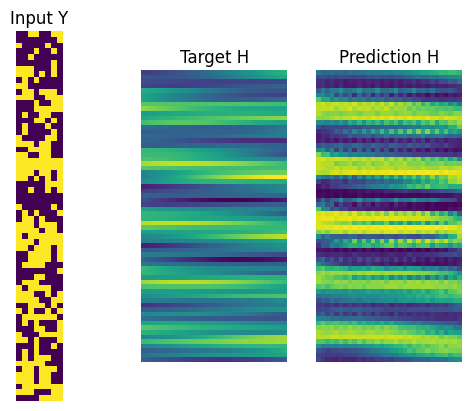

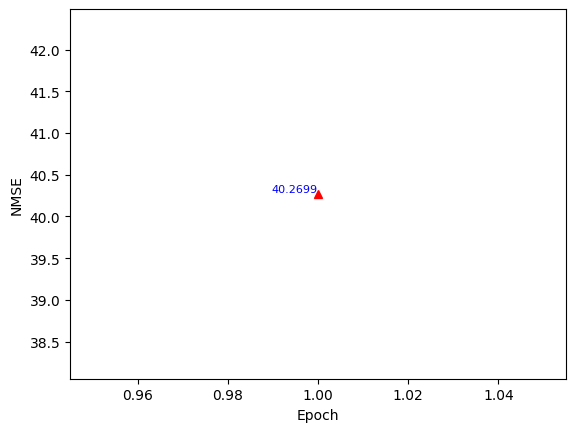

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 35.659393 , Discriminator loss: 1.0861982 , time: 0:04:32.855082
B/E: 103 / 1 , Generator loss: 34.10465 , Discriminator loss: 0.29019806 , time: 0:04:46.973415
B/E: 206 / 1 , Generator loss: 36.7471 , Discriminator loss: 1.1542525 , time: 0:05:01.016308
B/E: 309 / 1 , Generator loss: 40.24048 , Discriminator loss: 1.0192604 , time: 0:05:15.023961
B/E: 412 / 1 , Generator loss: 38.25957 , Discriminator loss: 0.47326583 , time: 0:05:28.978578
B/E: 515 / 1 , Generator loss: 31.607372 , Discriminator loss: 0.4701829 , time: 0:05:43.085674
B/E: 618 / 1 , Generator loss: 31.038372 , Discriminator loss: 0.8200903 , time: 0:05:56.951436
B/E: 721 / 1 , Generator loss: 34.48651 , Discriminator loss: 1.208911 , time: 0:06:10.857850
B/E: 824 / 1 , Generator loss: 31.511017 , Discriminator loss: 1.1932815 , time: 0:06:24.263542
B/E: 927 / 1 , Generator loss: 36.39091 , Discriminator loss: 0.47791594 , time: 0:06:37.754865
B/E: 1030 / 1 , Generator loss: 

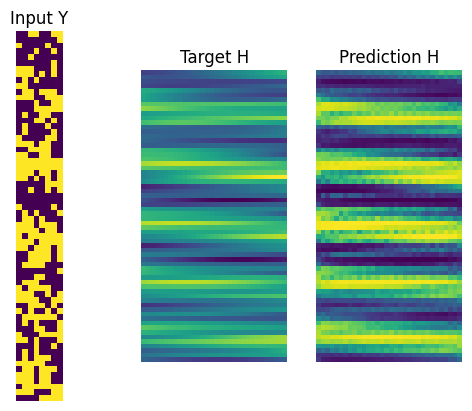

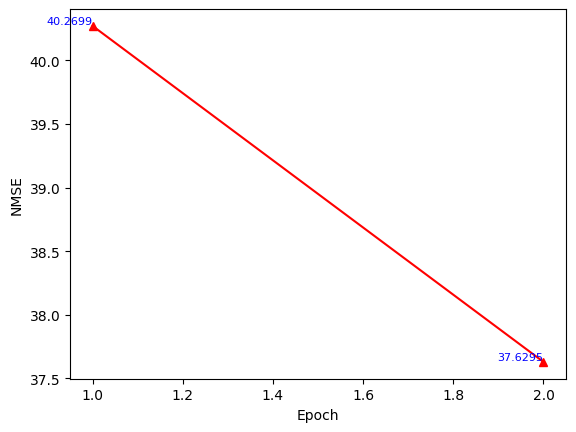

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 42.326897 , Discriminator loss: 0.61573243 , time: 0:08:01.881930
B/E: 103 / 2 , Generator loss: 37.814587 , Discriminator loss: 0.275185 , time: 0:08:15.218859
B/E: 206 / 2 , Generator loss: 33.027813 , Discriminator loss: 1.1125038 , time: 0:08:28.546852
B/E: 309 / 2 , Generator loss: 23.755001 , Discriminator loss: 1.6192441 , time: 0:08:41.715234
B/E: 412 / 2 , Generator loss: 28.39054 , Discriminator loss: 0.62222594 , time: 0:08:54.614797
B/E: 515 / 2 , Generator loss: 22.451797 , Discriminator loss: 1.2255164 , time: 0:09:07.376690
B/E: 618 / 2 , Generator loss: 22.343824 , Discriminator loss: 1.5905617 , time: 0:09:20.485665
B/E: 721 / 2 , Generator loss: 22.529642 , Discriminator loss: 1.5684367 , time: 0:09:33.305942
B/E: 824 / 2 , Generator loss: 21.341925 , Discriminator loss: 1.4644474 , time: 0:09:46.337456
B/E: 927 / 2 , Generator loss: 21.324287 , Discriminator loss: 1.581859 , time: 0:09:59.161256
B/E: 1030 / 2 , Generator lo

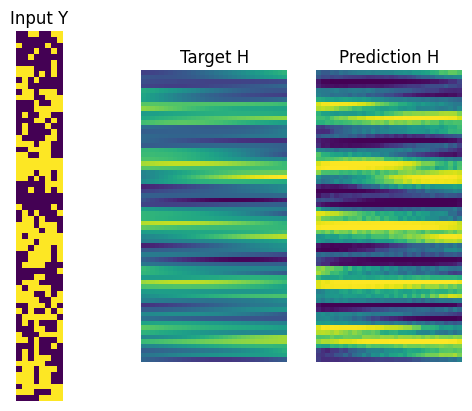

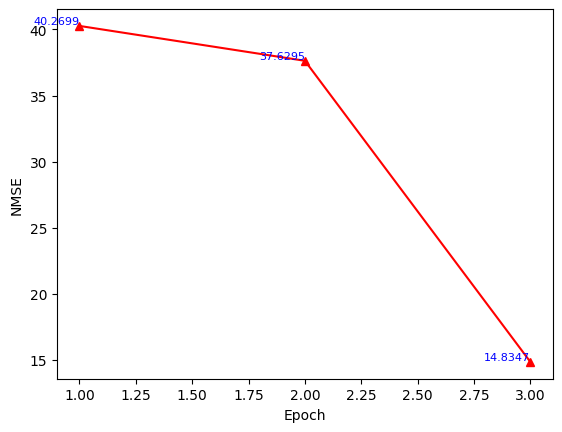

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 23.847246 , Discriminator loss: 0.74855757 , time: 0:11:21.846665
B/E: 103 / 3 , Generator loss: 24.169352 , Discriminator loss: 1.2056168 , time: 0:11:34.813096
B/E: 206 / 3 , Generator loss: 18.347408 , Discriminator loss: 1.1939716 , time: 0:11:48.015225
B/E: 309 / 3 , Generator loss: 22.418516 , Discriminator loss: 1.1736538 , time: 0:12:00.995838
B/E: 412 / 3 , Generator loss: 25.197989 , Discriminator loss: 0.61438394 , time: 0:12:14.110928
B/E: 515 / 3 , Generator loss: 20.9813 , Discriminator loss: 0.9516829 , time: 0:12:27.007957
B/E: 618 / 3 , Generator loss: 16.257408 , Discriminator loss: 0.8277601 , time: 0:12:39.597862
B/E: 721 / 3 , Generator loss: 15.086537 , Discriminator loss: 1.1339949 , time: 0:12:52.342060
B/E: 824 / 3 , Generator loss: 22.172768 , Discriminator loss: 0.4719805 , time: 0:13:05.003262
B/E: 927 / 3 , Generator loss: 14.191931 , Discriminator loss: 0.74868965 , time: 0:13:17.717751
B/E: 1030 / 3 , Generator 

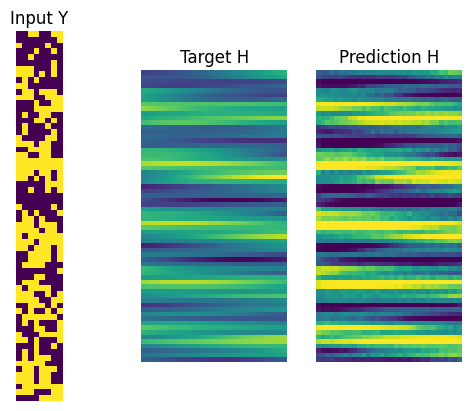

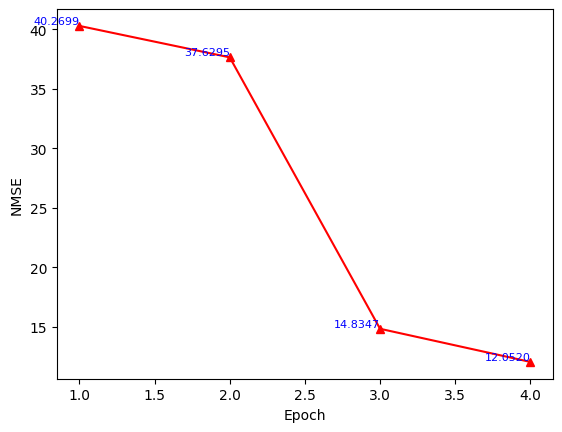

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 13.5074415 , Discriminator loss: 0.66912526 , time: 0:14:37.754373
B/E: 103 / 4 , Generator loss: 17.678432 , Discriminator loss: 0.6154597 , time: 0:14:50.682038
B/E: 206 / 4 , Generator loss: 20.84667 , Discriminator loss: 0.52524656 , time: 0:15:03.485856
B/E: 309 / 4 , Generator loss: 18.214825 , Discriminator loss: 1.3564711 , time: 0:15:15.902090
B/E: 412 / 4 , Generator loss: 14.621416 , Discriminator loss: 0.705914 , time: 0:15:28.609231
B/E: 515 / 4 , Generator loss: 15.481005 , Discriminator loss: 0.46052292 , time: 0:15:41.098099
B/E: 618 / 4 , Generator loss: 16.477077 , Discriminator loss: 0.44119817 , time: 0:15:53.933018
B/E: 721 / 4 , Generator loss: 20.67597 , Discriminator loss: 0.8260008 , time: 0:16:07.048287
B/E: 824 / 4 , Generator loss: 20.797447 , Discriminator loss: 0.27514583 , time: 0:16:20.132531
B/E: 927 / 4 , Generator loss: 15.378022 , Discriminator loss: 0.78574514 , time: 0:16:33.535166
B/E: 1030 / 4 , Generat

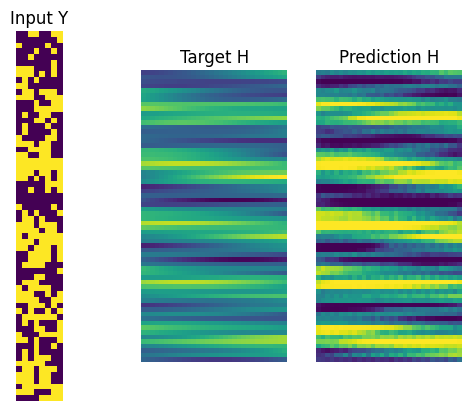

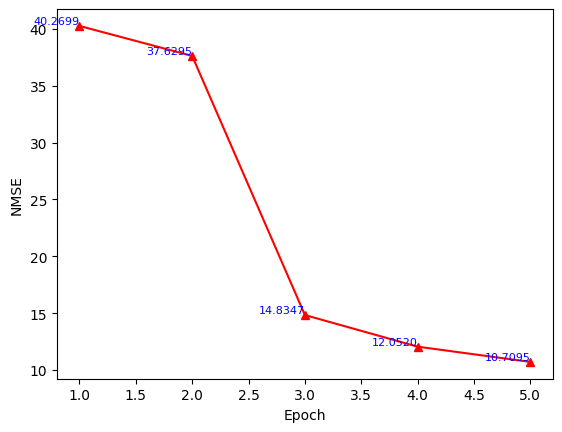

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 20.652922 , Discriminator loss: 1.1635383 , time: 0:17:54.976420
B/E: 103 / 5 , Generator loss: 14.327014 , Discriminator loss: 0.8103413 , time: 0:18:08.038789
B/E: 206 / 5 , Generator loss: 20.55018 , Discriminator loss: 0.16548634 , time: 0:18:21.036059
B/E: 309 / 5 , Generator loss: 20.880129 , Discriminator loss: 2.1603668 , time: 0:18:34.031549
B/E: 412 / 5 , Generator loss: 19.578426 , Discriminator loss: 0.1968584 , time: 0:18:46.948415
B/E: 515 / 5 , Generator loss: 17.835514 , Discriminator loss: 0.2893425 , time: 0:19:00.002290
B/E: 618 / 5 , Generator loss: 18.605755 , Discriminator loss: 2.1334386 , time: 0:19:13.034352
B/E: 721 / 5 , Generator loss: 17.167086 , Discriminator loss: 0.5711205 , time: 0:19:25.940161
B/E: 824 / 5 , Generator loss: 13.830627 , Discriminator loss: 0.85832226 , time: 0:19:39.029266
B/E: 927 / 5 , Generator loss: 19.737917 , Discriminator loss: 0.39331225 , time: 0:19:52.164118
B/E: 1030 / 5 , Generator

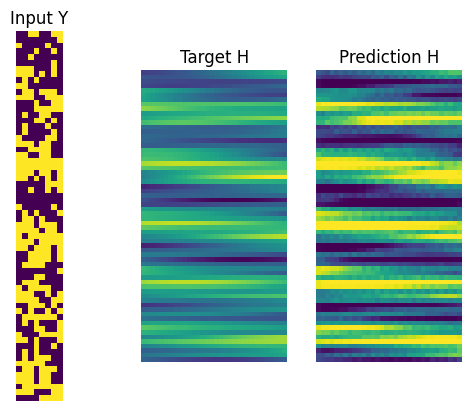

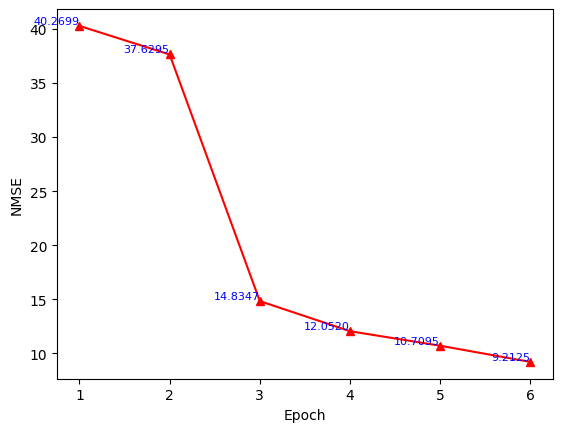

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 15.470248 , Discriminator loss: 0.8287424 , time: 0:21:12.388312
B/E: 103 / 6 , Generator loss: 15.136871 , Discriminator loss: 1.7879895 , time: 0:21:25.288286
B/E: 206 / 6 , Generator loss: 15.233719 , Discriminator loss: 0.64899373 , time: 0:21:38.210759
B/E: 309 / 6 , Generator loss: 14.322997 , Discriminator loss: 0.7790472 , time: 0:21:51.350939
B/E: 412 / 6 , Generator loss: 17.55201 , Discriminator loss: 0.083643496 , time: 0:22:04.505249
B/E: 515 / 6 , Generator loss: 18.29381 , Discriminator loss: 1.3362136 , time: 0:22:17.427540
B/E: 618 / 6 , Generator loss: 18.359194 , Discriminator loss: 0.27025193 , time: 0:22:30.363902
B/E: 721 / 6 , Generator loss: 28.157846 , Discriminator loss: 0.09723815 , time: 0:22:43.264166
B/E: 824 / 6 , Generator loss: 16.885681 , Discriminator loss: 0.4735504 , time: 0:22:56.445648
B/E: 927 / 6 , Generator loss: 14.234288 , Discriminator loss: 0.71265614 , time: 0:23:09.266066
B/E: 1030 / 6 , Generat

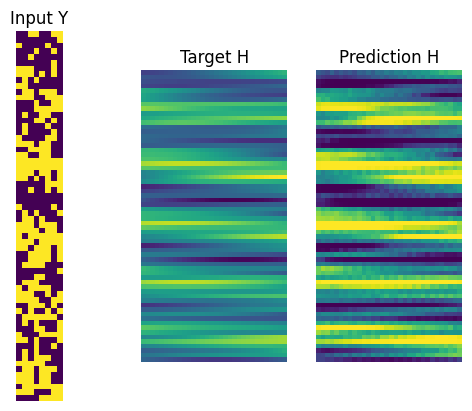

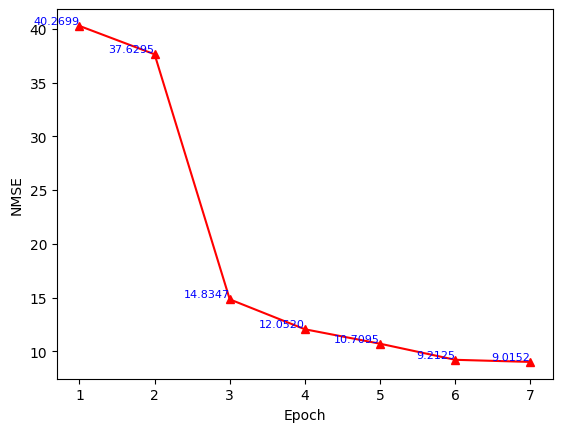

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 18.002361 , Discriminator loss: 0.10272532 , time: 0:00:06.070193
B/E: 103 / 0 , Generator loss: 21.55755 , Discriminator loss: 0.052524544 , time: 0:00:19.191989
B/E: 206 / 0 , Generator loss: 18.561295 , Discriminator loss: 0.10316269 , time: 0:00:32.317471
B/E: 309 / 0 , Generator loss: 21.631268 , Discriminator loss: 0.2692714 , time: 0:00:45.185259
B/E: 412 / 0 , Generator loss: 16.727097 , Discriminator loss: 0.05514334 , time: 0:00:58.191866
B/E: 515 / 0 , Generator loss: 14.578058 , Discriminator loss: 0.22363749 , time: 0:01:11.097188
B/E: 618 / 0 , Generator loss: 16.615358 , Discriminator loss: 0.41283977 , time: 0:01:24.242473
B/E: 721 / 0 , Generator loss: 20.733004 , Discriminator loss: 0.06059468 , time: 0:01:37.375302
B/E: 824 / 0 , Generator loss: 19.832857 , Discriminator loss: 0.17303205 , time: 0:01:50.401609
B/E: 927 / 0 , Generator loss: 17.02326 , Discriminator loss: 0.9955004 , time: 0:02:03.278409
B/E: 1030 / 0 , Gene

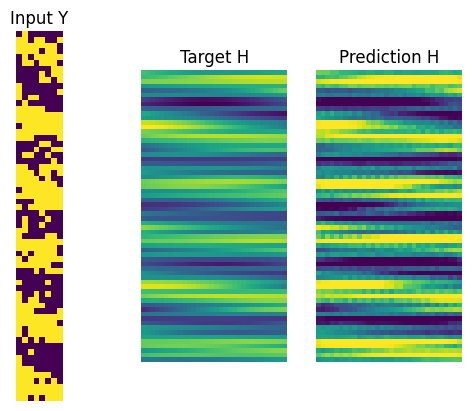

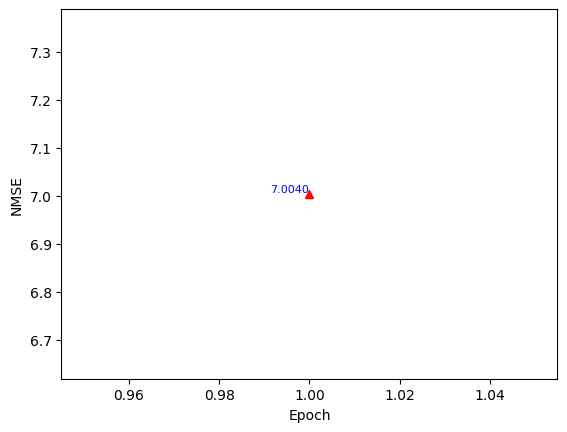

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 11.881678 , Discriminator loss: 1.2586622 , time: 0:03:25.179354
B/E: 103 / 1 , Generator loss: 19.12923 , Discriminator loss: 0.23229024 , time: 0:03:38.325097
B/E: 206 / 1 , Generator loss: 14.652144 , Discriminator loss: 0.96499324 , time: 0:03:51.345422
B/E: 309 / 1 , Generator loss: 14.223962 , Discriminator loss: 0.25396776 , time: 0:04:04.305512
B/E: 412 / 1 , Generator loss: 12.215911 , Discriminator loss: 0.85629976 , time: 0:04:17.218191
B/E: 515 / 1 , Generator loss: 13.844612 , Discriminator loss: 0.84107774 , time: 0:04:30.016522
B/E: 618 / 1 , Generator loss: 21.91013 , Discriminator loss: 0.30618823 , time: 0:04:42.582402
B/E: 721 / 1 , Generator loss: 14.121676 , Discriminator loss: 0.145122 , time: 0:04:55.316294
B/E: 824 / 1 , Generator loss: 13.145559 , Discriminator loss: 2.5837998 , time: 0:05:07.867807
B/E: 927 / 1 , Generator loss: 15.183507 , Discriminator loss: 0.48651648 , time: 0:05:20.569469
B/E: 1030 / 1 , Generat

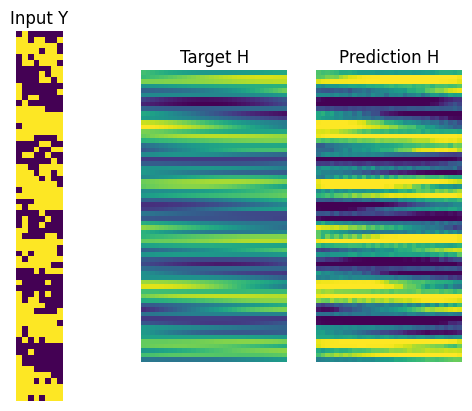

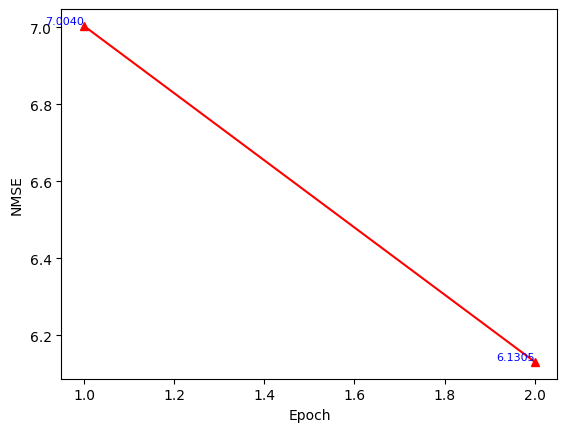

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 13.2410755 , Discriminator loss: 0.20989797 , time: 0:06:40.925550
B/E: 103 / 2 , Generator loss: 14.999075 , Discriminator loss: 0.18022305 , time: 0:06:53.892439
B/E: 206 / 2 , Generator loss: 14.326918 , Discriminator loss: 0.11916816 , time: 0:07:06.993755
B/E: 309 / 2 , Generator loss: 11.752593 , Discriminator loss: 0.84494275 , time: 0:07:19.942733
B/E: 412 / 2 , Generator loss: 11.966001 , Discriminator loss: 0.11329532 , time: 0:07:32.915697
B/E: 515 / 2 , Generator loss: 14.731911 , Discriminator loss: 1.0671656 , time: 0:07:46.312937
B/E: 618 / 2 , Generator loss: 11.912053 , Discriminator loss: 2.747999 , time: 0:07:59.586369
B/E: 721 / 2 , Generator loss: 13.691326 , Discriminator loss: 0.30079377 , time: 0:08:12.807439
B/E: 824 / 2 , Generator loss: 17.31676 , Discriminator loss: 0.2933093 , time: 0:08:25.700951
B/E: 927 / 2 , Generator loss: 14.8516035 , Discriminator loss: 0.067060955 , time: 0:08:38.559244
B/E: 1030 / 2 , Gen

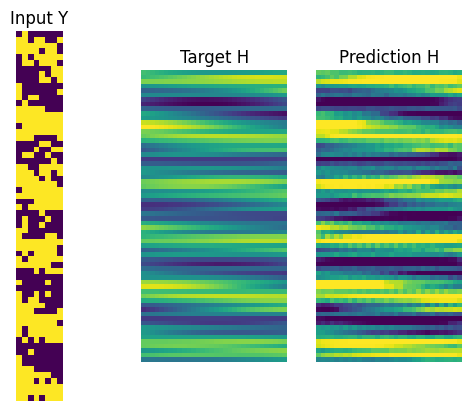

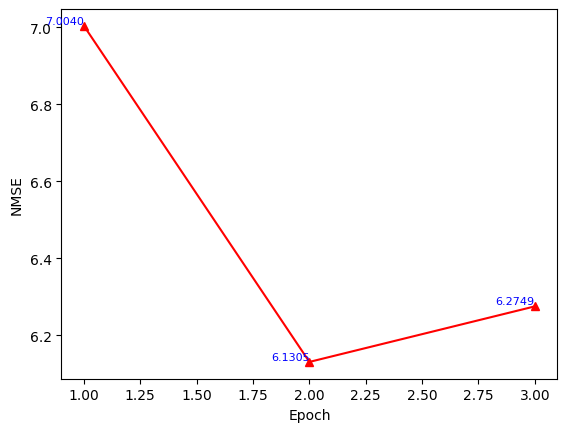

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 14.125636 , Discriminator loss: 2.1081588 , time: 0:09:58.738216
B/E: 103 / 3 , Generator loss: 18.142536 , Discriminator loss: 0.23951198 , time: 0:10:11.543680
B/E: 206 / 3 , Generator loss: 13.883973 , Discriminator loss: 0.08402462 , time: 0:10:23.976870
B/E: 309 / 3 , Generator loss: 12.752192 , Discriminator loss: 0.61086845 , time: 0:10:36.682315
B/E: 412 / 3 , Generator loss: 12.984471 , Discriminator loss: 0.23553535 , time: 0:10:49.405967
B/E: 515 / 3 , Generator loss: 13.878298 , Discriminator loss: 2.31848 , time: 0:11:02.165431
B/E: 618 / 3 , Generator loss: 14.60111 , Discriminator loss: 1.1110048 , time: 0:11:15.082551
B/E: 721 / 3 , Generator loss: 16.642757 , Discriminator loss: 0.051530667 , time: 0:11:27.990020
B/E: 824 / 3 , Generator loss: 12.037228 , Discriminator loss: 1.0983065 , time: 0:11:41.019528
B/E: 927 / 3 , Generator loss: 12.679284 , Discriminator loss: 0.7166815 , time: 0:11:54.064541
B/E: 1030 / 3 , Generato

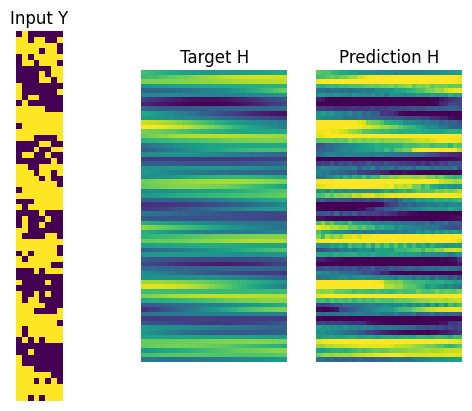

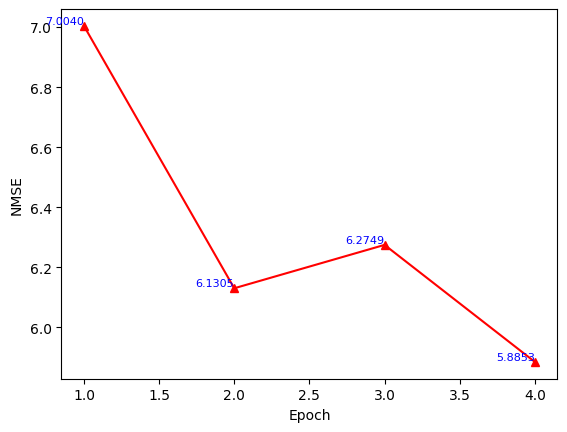

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 16.507875 , Discriminator loss: 0.016767157 , time: 0:13:14.693479
B/E: 103 / 4 , Generator loss: 12.762858 , Discriminator loss: 0.8623243 , time: 0:13:27.633857
B/E: 206 / 4 , Generator loss: 15.502129 , Discriminator loss: 0.10760976 , time: 0:13:40.515071
B/E: 309 / 4 , Generator loss: 12.706586 , Discriminator loss: 1.9068179 , time: 0:13:53.353959
B/E: 412 / 4 , Generator loss: 13.886901 , Discriminator loss: 0.07235168 , time: 0:14:06.235940
B/E: 515 / 4 , Generator loss: 13.44892 , Discriminator loss: 0.5590848 , time: 0:14:19.165399
B/E: 618 / 4 , Generator loss: 14.843383 , Discriminator loss: 0.07491467 , time: 0:14:32.017869
B/E: 721 / 4 , Generator loss: 16.274935 , Discriminator loss: 0.030756721 , time: 0:14:44.522485
B/E: 824 / 4 , Generator loss: 15.736984 , Discriminator loss: 0.017357199 , time: 0:14:57.083790
B/E: 927 / 4 , Generator loss: 13.337976 , Discriminator loss: 0.051665198 , time: 0:15:09.544999
B/E: 1030 / 4 , G

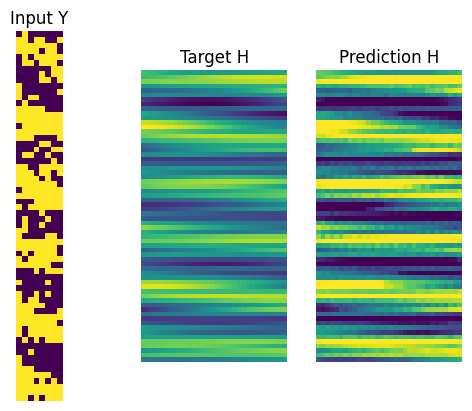

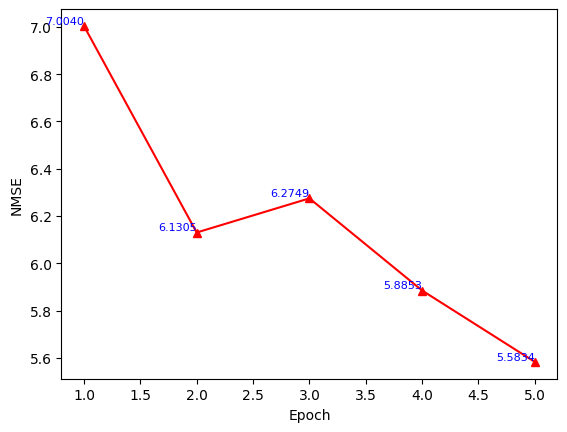

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 13.617001 , Discriminator loss: 0.35459027 , time: 0:16:29.321257
B/E: 103 / 5 , Generator loss: 14.871248 , Discriminator loss: 0.045227725 , time: 0:16:42.366896
B/E: 206 / 5 , Generator loss: 15.297492 , Discriminator loss: 0.29493845 , time: 0:16:55.199358
B/E: 309 / 5 , Generator loss: 15.29017 , Discriminator loss: 0.0638263 , time: 0:17:08.172996
B/E: 412 / 5 , Generator loss: 12.438891 , Discriminator loss: 1.0651064 , time: 0:17:21.064405
B/E: 515 / 5 , Generator loss: 12.013711 , Discriminator loss: 0.2136384 , time: 0:17:33.846875
B/E: 618 / 5 , Generator loss: 13.790731 , Discriminator loss: 0.51414555 , time: 0:17:46.857959
B/E: 721 / 5 , Generator loss: 13.878797 , Discriminator loss: 0.078833096 , time: 0:17:59.653242
B/E: 824 / 5 , Generator loss: 18.544876 , Discriminator loss: 0.045831926 , time: 0:18:12.572382
B/E: 927 / 5 , Generator loss: 11.944402 , Discriminator loss: 0.112619564 , time: 0:18:25.356639
B/E: 1030 / 5 , G

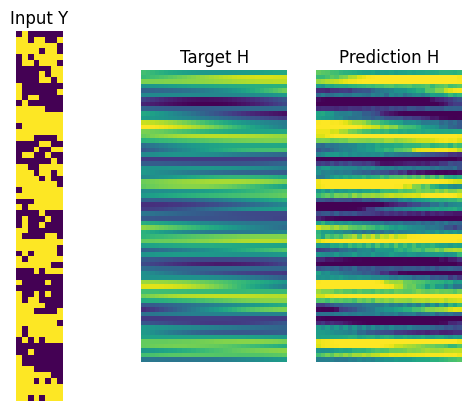

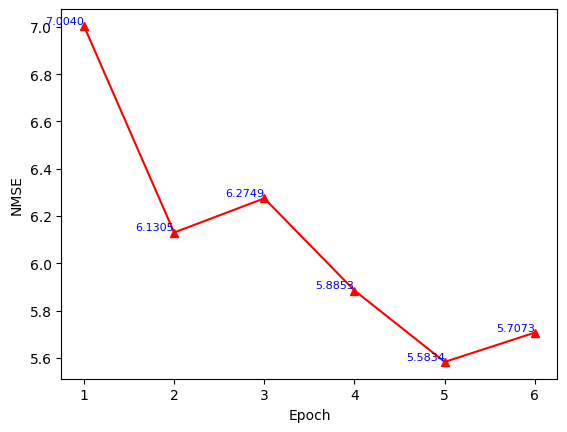

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 15.712413 , Discriminator loss: 0.117629446 , time: 0:19:47.015121
B/E: 103 / 6 , Generator loss: 15.344208 , Discriminator loss: 0.050064016 , time: 0:19:59.781180
B/E: 206 / 6 , Generator loss: 17.801437 , Discriminator loss: 0.009902808 , time: 0:20:12.682121
B/E: 309 / 6 , Generator loss: 18.346619 , Discriminator loss: 0.024074692 , time: 0:20:25.567467
B/E: 412 / 6 , Generator loss: 11.39674 , Discriminator loss: 0.9071884 , time: 0:20:38.406887
B/E: 515 / 6 , Generator loss: 11.276898 , Discriminator loss: 0.5491601 , time: 0:20:51.362959
B/E: 618 / 6 , Generator loss: 12.966789 , Discriminator loss: 0.19398248 , time: 0:21:04.252656
B/E: 721 / 6 , Generator loss: 11.351924 , Discriminator loss: 2.673503 , time: 0:21:17.214614
B/E: 824 / 6 , Generator loss: 16.273605 , Discriminator loss: 0.04003527 , time: 0:21:30.135353
B/E: 927 / 6 , Generator loss: 17.041054 , Discriminator loss: 0.024988525 , time: 0:21:43.049016
B/E: 1030 / 6 , G

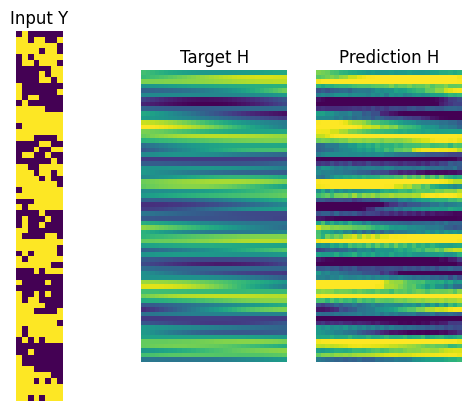

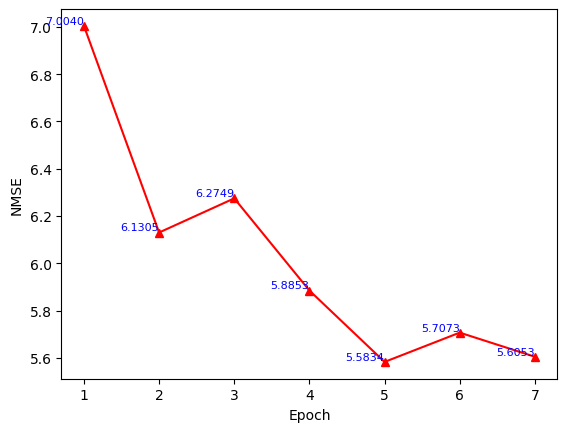

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 13.25792 , Discriminator loss: 0.41527387 , time: 0:00:07.703732
B/E: 103 / 0 , Generator loss: 17.962076 , Discriminator loss: 0.059081454 , time: 0:00:20.298759
B/E: 206 / 0 , Generator loss: 17.71832 , Discriminator loss: 0.08163635 , time: 0:00:32.912555
B/E: 309 / 0 , Generator loss: 14.872614 , Discriminator loss: 0.060688265 , time: 0:00:45.976282
B/E: 412 / 0 , Generator loss: 22.320414 , Discriminator loss: 0.2515447 , time: 0:00:58.644086
B/E: 515 / 0 , Generator loss: 18.064484 , Discriminator loss: 0.020395681 , time: 0:01:11.351611
B/E: 618 / 0 , Generator loss: 14.505751 , Discriminator loss: 1.0044125 , time: 0:01:24.099047
B/E: 721 / 0 , Generator loss: 18.907642 , Discriminator loss: 0.040444892 , time: 0:01:36.894828
B/E: 824 / 0 , Generator loss: 19.96019 , Discriminator loss: 0.010913097 , time: 0:01:49.789451
B/E: 927 / 0 , Generator loss: 19.919168 , Discriminator loss: 1.9711964 , time: 0:02:02.753076
B/E: 1030 / 0 , Ge

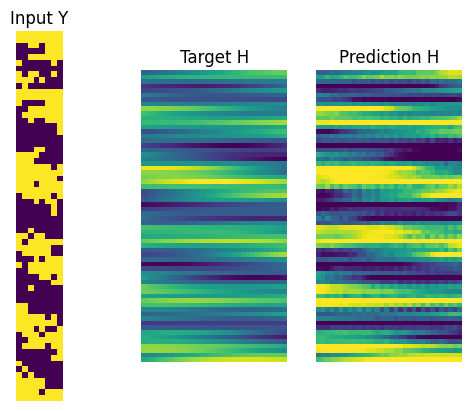

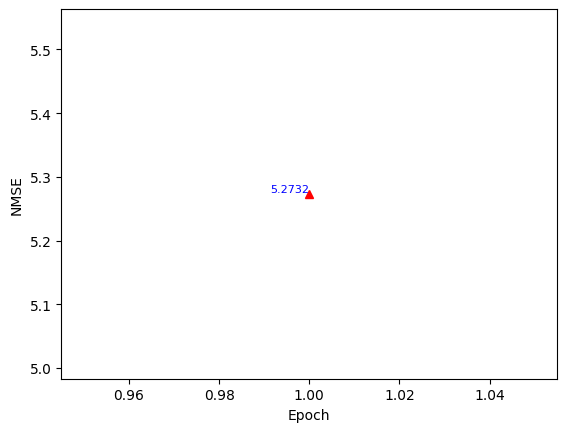

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 15.087207 , Discriminator loss: 0.27590436 , time: 0:03:25.594020
B/E: 103 / 1 , Generator loss: 14.198541 , Discriminator loss: 0.09006221 , time: 0:03:38.363888
B/E: 206 / 1 , Generator loss: 14.233567 , Discriminator loss: 0.055854205 , time: 0:03:51.131890
B/E: 309 / 1 , Generator loss: 15.494417 , Discriminator loss: 0.06973633 , time: 0:04:04.171859
B/E: 412 / 1 , Generator loss: 15.018703 , Discriminator loss: 0.17579296 , time: 0:04:16.999500
B/E: 515 / 1 , Generator loss: 15.973495 , Discriminator loss: 0.097608425 , time: 0:04:29.713042
B/E: 618 / 1 , Generator loss: 13.968965 , Discriminator loss: 0.1308523 , time: 0:04:42.478051
B/E: 721 / 1 , Generator loss: 12.327757 , Discriminator loss: 0.49401438 , time: 0:04:55.035273
B/E: 824 / 1 , Generator loss: 18.457535 , Discriminator loss: 0.0074200053 , time: 0:05:07.669346
B/E: 927 / 1 , Generator loss: 16.040674 , Discriminator loss: 0.07015912 , time: 0:05:20.250457
B/E: 1030 / 1 

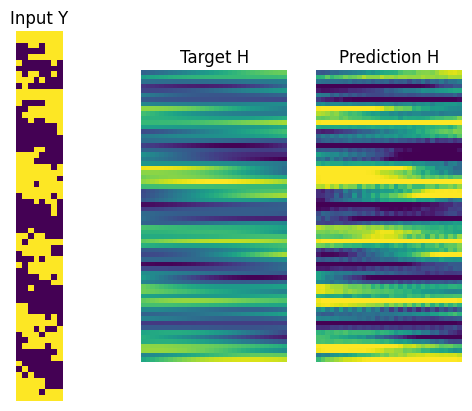

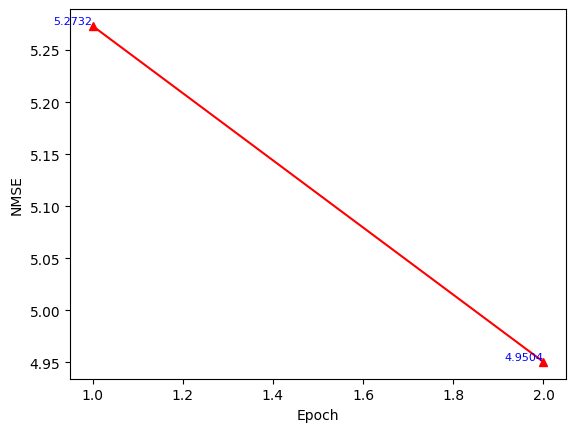

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 11.901394 , Discriminator loss: 0.8012392 , time: 0:06:39.836068
B/E: 103 / 2 , Generator loss: 17.068592 , Discriminator loss: 0.010879961 , time: 0:06:52.841980
B/E: 206 / 2 , Generator loss: 12.062044 , Discriminator loss: 0.62855256 , time: 0:07:06.089929
B/E: 309 / 2 , Generator loss: 14.906488 , Discriminator loss: 0.35356906 , time: 0:07:19.342707
B/E: 412 / 2 , Generator loss: 13.979306 , Discriminator loss: 0.051841795 , time: 0:07:32.313259
B/E: 515 / 2 , Generator loss: 11.948687 , Discriminator loss: 0.30076548 , time: 0:07:45.306969
B/E: 618 / 2 , Generator loss: 14.594929 , Discriminator loss: 0.028846845 , time: 0:07:58.255898
B/E: 721 / 2 , Generator loss: 15.491089 , Discriminator loss: 0.24412858 , time: 0:08:11.149538
B/E: 824 / 2 , Generator loss: 18.276314 , Discriminator loss: 0.123632506 , time: 0:08:24.103462
B/E: 927 / 2 , Generator loss: 15.668451 , Discriminator loss: 0.013629033 , time: 0:08:37.055746
B/E: 1030 / 2

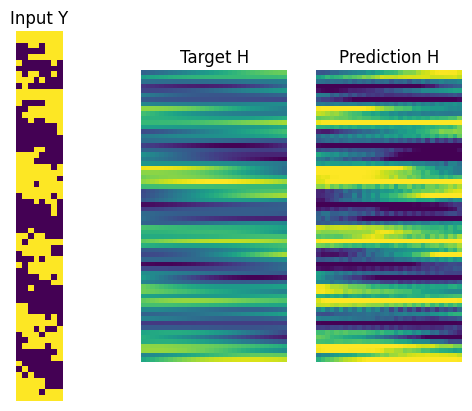

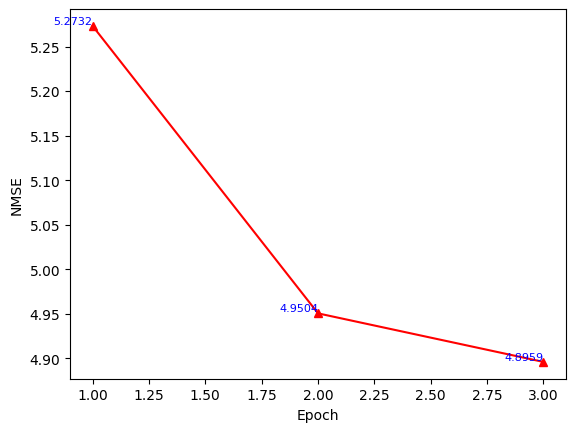

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 18.681961 , Discriminator loss: 0.04171239 , time: 0:09:57.931996
B/E: 103 / 3 , Generator loss: 17.502073 , Discriminator loss: 0.086883 , time: 0:10:10.793393
B/E: 206 / 3 , Generator loss: 14.156455 , Discriminator loss: 0.027938755 , time: 0:10:23.689316
B/E: 309 / 3 , Generator loss: 12.013835 , Discriminator loss: 0.112531245 , time: 0:10:36.821563
B/E: 412 / 3 , Generator loss: 15.333531 , Discriminator loss: 0.06282346 , time: 0:10:49.666209
B/E: 515 / 3 , Generator loss: 15.751146 , Discriminator loss: 0.04829392 , time: 0:11:02.193282
B/E: 618 / 3 , Generator loss: 13.437934 , Discriminator loss: 0.8009057 , time: 0:11:14.716607
B/E: 721 / 3 , Generator loss: 16.390333 , Discriminator loss: 0.12462737 , time: 0:11:27.266440
B/E: 824 / 3 , Generator loss: 14.544084 , Discriminator loss: 0.17399631 , time: 0:11:39.882173
B/E: 927 / 3 , Generator loss: 10.729467 , Discriminator loss: 0.45430717 , time: 0:11:52.727900
B/E: 1030 / 3 , Ge

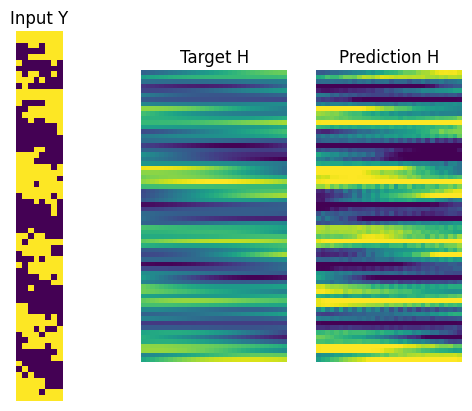

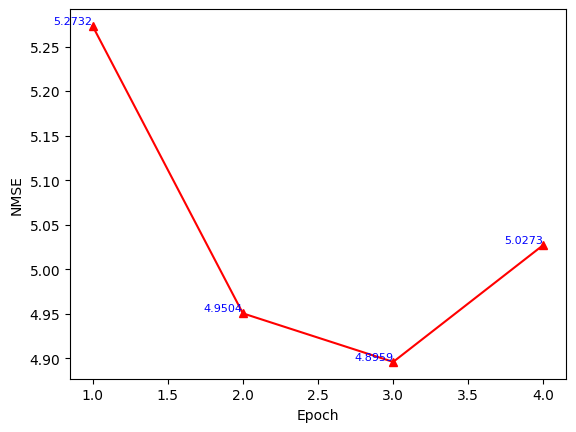

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 18.463669 , Discriminator loss: 0.011476237 , time: 0:13:12.939329
B/E: 103 / 4 , Generator loss: 11.879382 , Discriminator loss: 0.14617437 , time: 0:13:26.276676
B/E: 206 / 4 , Generator loss: 14.12178 , Discriminator loss: 0.085471705 , time: 0:13:39.718326
B/E: 309 / 4 , Generator loss: 12.98755 , Discriminator loss: 0.31167868 , time: 0:13:53.185262
B/E: 412 / 4 , Generator loss: 16.96032 , Discriminator loss: 1.0068932 , time: 0:14:06.790991
B/E: 515 / 4 , Generator loss: 12.154017 , Discriminator loss: 0.19126557 , time: 0:14:20.365361
B/E: 618 / 4 , Generator loss: 12.3695965 , Discriminator loss: 0.095521666 , time: 0:14:33.903453
B/E: 721 / 4 , Generator loss: 16.827515 , Discriminator loss: 0.0053552072 , time: 0:14:47.378301
B/E: 824 / 4 , Generator loss: 13.605476 , Discriminator loss: 0.04794863 , time: 0:15:00.434399
B/E: 927 / 4 , Generator loss: 16.69342 , Discriminator loss: 0.002894524 , time: 0:15:13.366900
B/E: 1030 / 4 ,

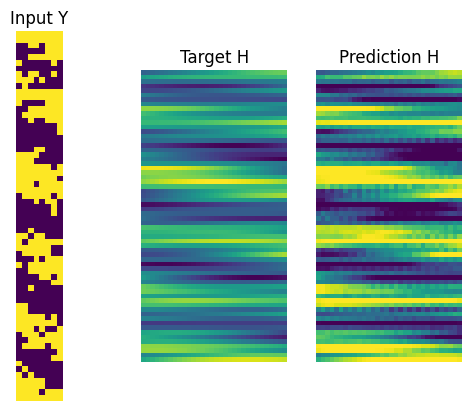

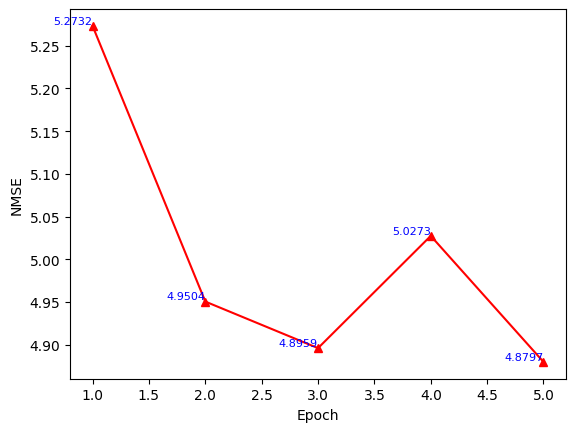

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 14.231583 , Discriminator loss: 0.1964298 , time: 0:16:34.086830
B/E: 103 / 5 , Generator loss: 15.528099 , Discriminator loss: 0.11420451 , time: 0:16:47.031447
B/E: 206 / 5 , Generator loss: 16.714602 , Discriminator loss: 0.0063362326 , time: 0:16:59.920781
B/E: 309 / 5 , Generator loss: 15.706008 , Discriminator loss: 0.1661007 , time: 0:17:12.861357
B/E: 412 / 5 , Generator loss: 14.012623 , Discriminator loss: 0.16067114 , time: 0:17:25.355179
B/E: 515 / 5 , Generator loss: 14.569509 , Discriminator loss: 0.18271974 , time: 0:17:38.040819
B/E: 618 / 5 , Generator loss: 14.401908 , Discriminator loss: 0.11889333 , time: 0:17:50.734149
B/E: 721 / 5 , Generator loss: 22.29606 , Discriminator loss: 0.008618716 , time: 0:18:03.620594
B/E: 824 / 5 , Generator loss: 17.278824 , Discriminator loss: 0.36077845 , time: 0:18:16.588269
B/E: 927 / 5 , Generator loss: 16.087852 , Discriminator loss: 0.016871816 , time: 0:18:29.485213
B/E: 1030 / 5 , 

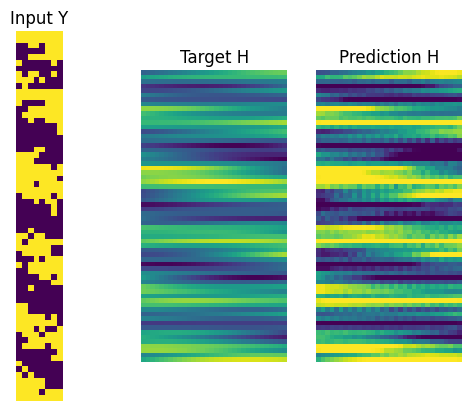

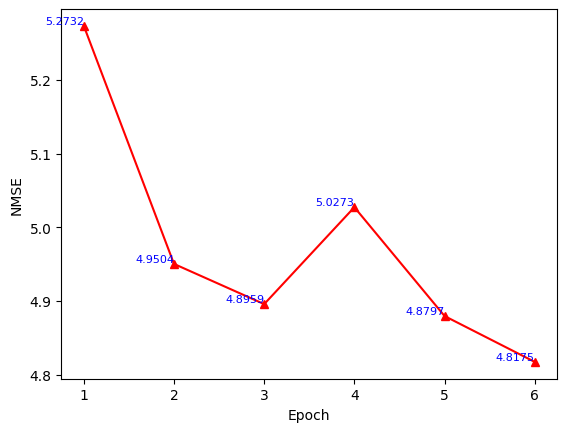

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 17.101465 , Discriminator loss: 0.019725118 , time: 0:19:51.616438
B/E: 103 / 6 , Generator loss: 17.462181 , Discriminator loss: 0.04420325 , time: 0:20:04.862022
B/E: 206 / 6 , Generator loss: 15.025753 , Discriminator loss: 1.8470855 , time: 0:20:18.145526
B/E: 309 / 6 , Generator loss: 16.160345 , Discriminator loss: 0.0045792367 , time: 0:20:31.423212
B/E: 412 / 6 , Generator loss: 12.248014 , Discriminator loss: 1.4414093 , time: 0:20:44.560122
B/E: 515 / 6 , Generator loss: 15.778767 , Discriminator loss: 0.16521826 , time: 0:20:57.791996
B/E: 618 / 6 , Generator loss: 16.418121 , Discriminator loss: 0.014969906 , time: 0:21:11.033950
B/E: 721 / 6 , Generator loss: 16.481915 , Discriminator loss: 0.002518069 , time: 0:21:24.093805
B/E: 824 / 6 , Generator loss: 20.96654 , Discriminator loss: 0.08411725 , time: 0:21:37.386853
B/E: 927 / 6 , Generator loss: 17.601822 , Discriminator loss: 0.017851891 , time: 0:21:50.402042
B/E: 1030 / 6 

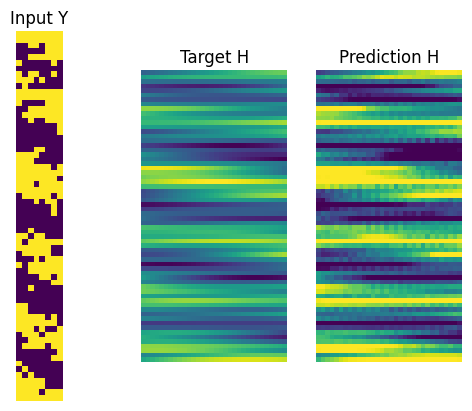

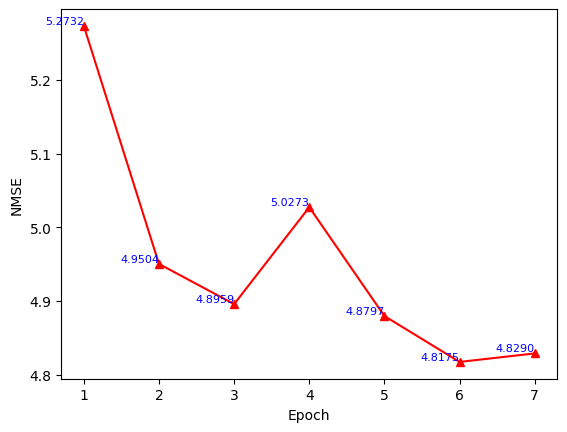

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 12.105357 , Discriminator loss: 0.3141315 , time: 0:00:05.411925
B/E: 103 / 0 , Generator loss: 19.14465 , Discriminator loss: 0.016696515 , time: 0:00:18.719184
B/E: 206 / 0 , Generator loss: 12.681064 , Discriminator loss: 0.19914433 , time: 0:00:32.026849
B/E: 309 / 0 , Generator loss: 14.651703 , Discriminator loss: 0.15765011 , time: 0:00:45.636836
B/E: 412 / 0 , Generator loss: 17.09597 , Discriminator loss: 0.14916798 , time: 0:00:58.845441
B/E: 515 / 0 , Generator loss: 17.135609 , Discriminator loss: 0.0036105628 , time: 0:01:12.055910
B/E: 618 / 0 , Generator loss: 15.922701 , Discriminator loss: 0.04749693 , time: 0:01:25.241176
B/E: 721 / 0 , Generator loss: 13.257129 , Discriminator loss: 0.035793275 , time: 0:01:38.354016
B/E: 824 / 0 , Generator loss: 11.081644 , Discriminator loss: 1.052377 , time: 0:01:51.211251
B/E: 927 / 0 , Generator loss: 17.962364 , Discriminator loss: 0.001839187 , time: 0:02:04.042777
B/E: 1030 / 0 , G

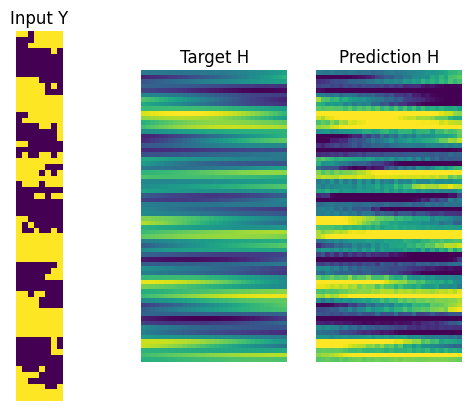

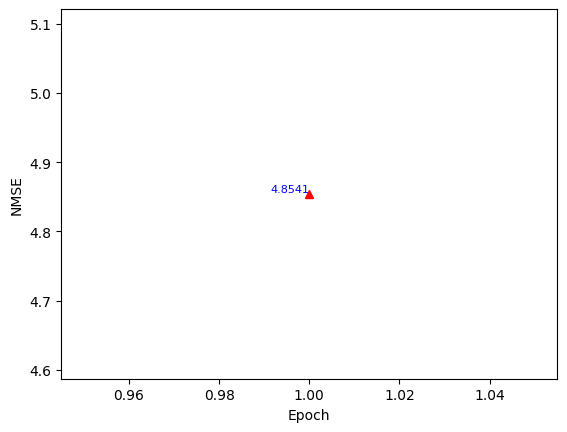

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 17.149456 , Discriminator loss: 0.094446994 , time: 0:03:28.244047
B/E: 103 / 1 , Generator loss: 19.37503 , Discriminator loss: 0.0026919497 , time: 0:03:41.597208
B/E: 206 / 1 , Generator loss: 15.913929 , Discriminator loss: 0.010992051 , time: 0:03:54.795618
B/E: 309 / 1 , Generator loss: 17.203684 , Discriminator loss: 0.0077374103 , time: 0:04:07.834391
B/E: 412 / 1 , Generator loss: 18.4104 , Discriminator loss: 0.001182942 , time: 0:04:20.483822
B/E: 515 / 1 , Generator loss: 11.064959 , Discriminator loss: 2.0768228 , time: 0:04:33.310025
B/E: 618 / 1 , Generator loss: 16.260313 , Discriminator loss: 0.033118557 , time: 0:04:45.957008
B/E: 721 / 1 , Generator loss: 12.983785 , Discriminator loss: 0.08742471 , time: 0:04:58.552420
B/E: 824 / 1 , Generator loss: 18.709373 , Discriminator loss: 0.0019325437 , time: 0:05:11.193764
B/E: 927 / 1 , Generator loss: 17.671015 , Discriminator loss: 0.0021665732 , time: 0:05:23.747697
B/E: 1030

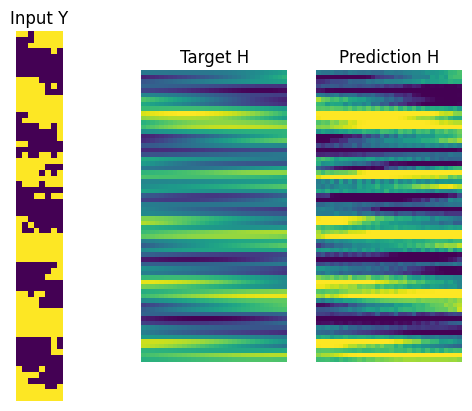

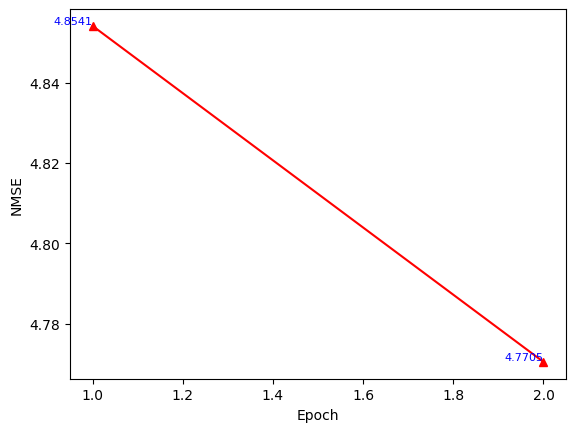

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 16.635818 , Discriminator loss: 0.026873264 , time: 0:06:43.730722
B/E: 103 / 2 , Generator loss: 17.293198 , Discriminator loss: 0.03056177 , time: 0:06:56.069289
B/E: 206 / 2 , Generator loss: 16.409414 , Discriminator loss: 0.0047812117 , time: 0:07:08.837157
B/E: 309 / 2 , Generator loss: 17.945826 , Discriminator loss: 0.16647418 , time: 0:07:21.484989
B/E: 412 / 2 , Generator loss: 15.303749 , Discriminator loss: 0.044938583 , time: 0:07:34.185251
B/E: 515 / 2 , Generator loss: 15.70031 , Discriminator loss: 0.031100236 , time: 0:07:46.912841
B/E: 618 / 2 , Generator loss: 17.813532 , Discriminator loss: 0.06983427 , time: 0:07:59.561273
B/E: 721 / 2 , Generator loss: 19.642368 , Discriminator loss: 0.0034761617 , time: 0:08:12.267552
B/E: 824 / 2 , Generator loss: 16.873444 , Discriminator loss: 0.0063872803 , time: 0:08:24.855108
B/E: 927 / 2 , Generator loss: 16.871618 , Discriminator loss: 0.009204894 , time: 0:08:37.439621
B/E: 103

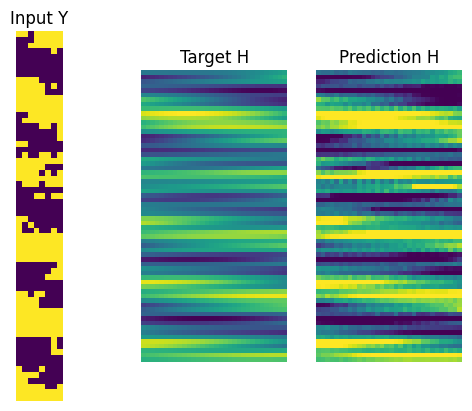

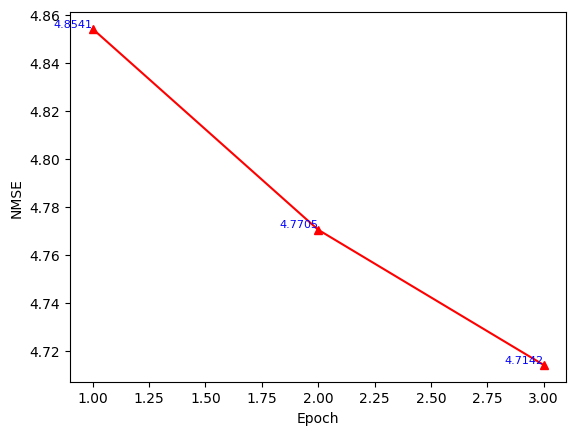

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 18.484875 , Discriminator loss: 0.06453366 , time: 0:09:56.445756
B/E: 103 / 3 , Generator loss: 19.942421 , Discriminator loss: 0.00041687128 , time: 0:10:09.227010
B/E: 206 / 3 , Generator loss: 16.663383 , Discriminator loss: 0.0032261373 , time: 0:10:21.737389
B/E: 309 / 3 , Generator loss: 19.456562 , Discriminator loss: 0.000638289 , time: 0:10:34.020096
B/E: 412 / 3 , Generator loss: 15.002459 , Discriminator loss: 0.01794665 , time: 0:10:46.562628
B/E: 515 / 3 , Generator loss: 16.770823 , Discriminator loss: 0.01582768 , time: 0:10:59.382800
B/E: 618 / 3 , Generator loss: 18.472002 , Discriminator loss: 0.003670602 , time: 0:11:12.163308
B/E: 721 / 3 , Generator loss: 13.116145 , Discriminator loss: 0.2379404 , time: 0:11:24.972770
B/E: 824 / 3 , Generator loss: 20.390356 , Discriminator loss: 3.1380527 , time: 0:11:37.860448
B/E: 927 / 3 , Generator loss: 19.349655 , Discriminator loss: 0.011539522 , time: 0:11:50.496963
B/E: 1030 /

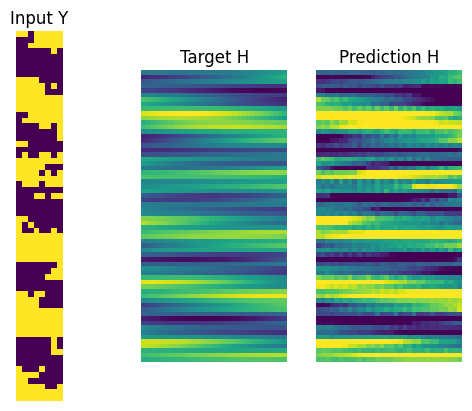

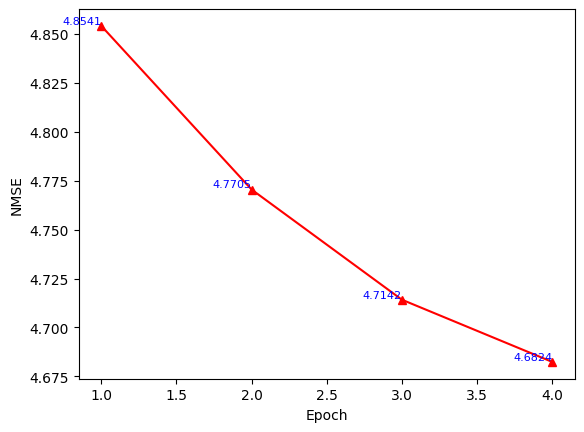

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 19.336206 , Discriminator loss: 0.36912447 , time: 0:13:09.593718
B/E: 309 / 4 , Generator loss: 16.320858 , Discriminator loss: 0.026901066 , time: 0:13:47.730676
B/E: 412 / 4 , Generator loss: 17.12857 , Discriminator loss: 0.001342086 , time: 0:14:00.324906
B/E: 515 / 4 , Generator loss: 16.71987 , Discriminator loss: 0.0017673452 , time: 0:14:12.974851
B/E: 618 / 4 , Generator loss: 14.094808 , Discriminator loss: 0.06253566 , time: 0:14:25.628180
B/E: 721 / 4 , Generator loss: 17.731323 , Discriminator loss: 0.0017475912 , time: 0:14:38.304705
B/E: 824 / 4 , Generator loss: 19.361336 , Discriminator loss: 0.002185 , time: 0:14:50.698185
B/E: 927 / 4 , Generator loss: 21.508015 , Discriminator loss: 0.0005752221 , time: 0:15:03.021766
B/E: 1030 / 4 , Generator loss: 16.009724 , Discriminator loss: 0.03082682 , time: 0:15:15.410899
B/E: 1133 / 4 , Generator loss: 18.87091 , Discriminator loss: 3.0745487 , time: 0:15:28.075360
B/E: 1236 / 4

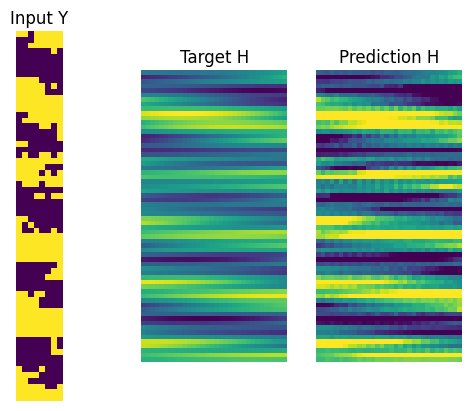

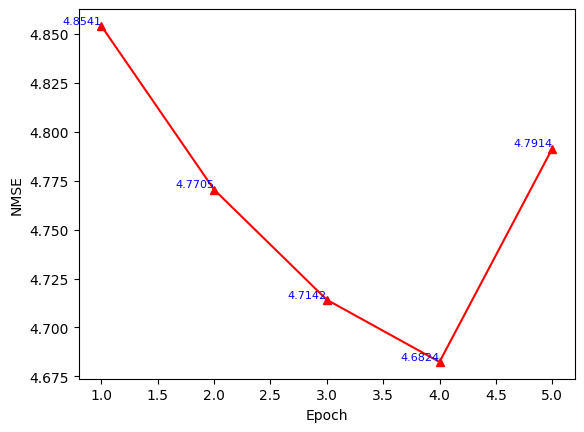

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 16.842567 , Discriminator loss: 0.0027099426 , time: 0:16:23.257002
B/E: 103 / 5 , Generator loss: 17.231186 , Discriminator loss: 0.0007816303 , time: 0:16:36.465352
B/E: 206 / 5 , Generator loss: 15.002798 , Discriminator loss: 0.048505504 , time: 0:16:49.609035
B/E: 309 / 5 , Generator loss: 12.7617855 , Discriminator loss: 0.17164424 , time: 0:17:02.629938
B/E: 412 / 5 , Generator loss: 17.871098 , Discriminator loss: 0.00097328494 , time: 0:17:15.460661
B/E: 515 / 5 , Generator loss: 16.119413 , Discriminator loss: 0.00782229 , time: 0:17:28.333705
B/E: 618 / 5 , Generator loss: 18.089113 , Discriminator loss: 0.005824903 , time: 0:17:41.043981
B/E: 721 / 5 , Generator loss: 17.793762 , Discriminator loss: 0.0016354646 , time: 0:17:53.717559
B/E: 824 / 5 , Generator loss: 12.114953 , Discriminator loss: 0.09706554 , time: 0:18:06.253152
B/E: 927 / 5 , Generator loss: 15.596071 , Discriminator loss: 0.039689396 , time: 0:18:18.986769
B/E:

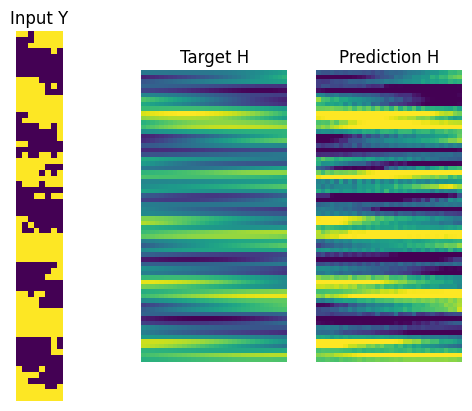

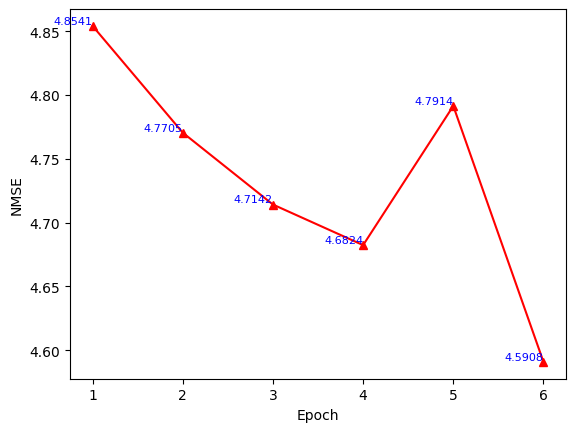

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 17.920383 , Discriminator loss: 0.0009302676 , time: 0:19:38.186224
B/E: 103 / 6 , Generator loss: 17.243076 , Discriminator loss: 0.028079372 , time: 0:19:50.844129
B/E: 206 / 6 , Generator loss: 17.25169 , Discriminator loss: 0.11100769 , time: 0:20:03.386892
B/E: 309 / 6 , Generator loss: 16.098015 , Discriminator loss: 0.0038307577 , time: 0:20:15.903741
B/E: 412 / 6 , Generator loss: 19.96928 , Discriminator loss: 0.019044984 , time: 0:20:28.252035
B/E: 515 / 6 , Generator loss: 18.234964 , Discriminator loss: 0.0069910306 , time: 0:20:40.414824
B/E: 618 / 6 , Generator loss: 20.676464 , Discriminator loss: 0.00043481225 , time: 0:20:52.905725
B/E: 721 / 6 , Generator loss: 18.447865 , Discriminator loss: 0.06240133 , time: 0:21:05.444855
B/E: 824 / 6 , Generator loss: 15.178278 , Discriminator loss: 0.08625642 , time: 0:21:18.152084
B/E: 927 / 6 , Generator loss: 19.891582 , Discriminator loss: 0.00072938536 , time: 0:21:30.809731
B/E: 

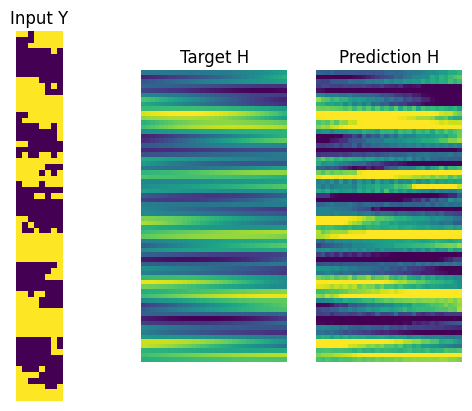

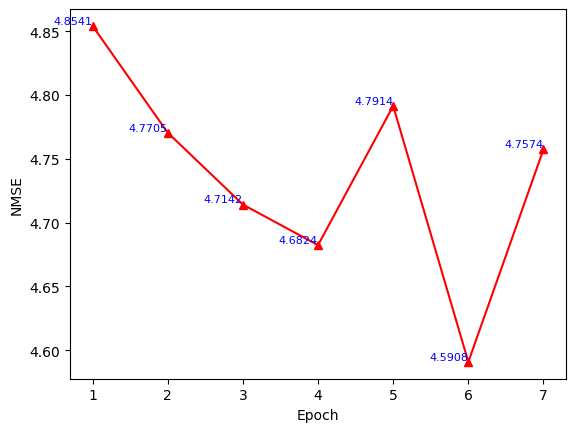

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 21.925388 , Discriminator loss: 0.002815832 , time: 0:00:08.269066
B/E: 103 / 0 , Generator loss: 16.318811 , Discriminator loss: 0.006651581 , time: 0:00:21.197666
B/E: 206 / 0 , Generator loss: 18.388935 , Discriminator loss: 0.0034692853 , time: 0:00:34.338149
B/E: 309 / 0 , Generator loss: 20.354382 , Discriminator loss: 0.00031152947 , time: 0:00:47.278207
B/E: 412 / 0 , Generator loss: 19.02565 , Discriminator loss: 0.0007479811 , time: 0:01:00.381568
B/E: 515 / 0 , Generator loss: 20.402554 , Discriminator loss: 0.005509995 , time: 0:01:13.442616
B/E: 618 / 0 , Generator loss: 15.876668 , Discriminator loss: 0.58087474 , time: 0:01:26.394181
B/E: 721 / 0 , Generator loss: 20.745207 , Discriminator loss: 0.0011840963 , time: 0:01:39.260022
B/E: 824 / 0 , Generator loss: 16.435219 , Discriminator loss: 0.006681748 , time: 0:01:52.158254
B/E: 927 / 0 , Generator loss: 15.981264 , Discriminator loss: 0.01052863 , time: 0:02:05.091247
B/E: 

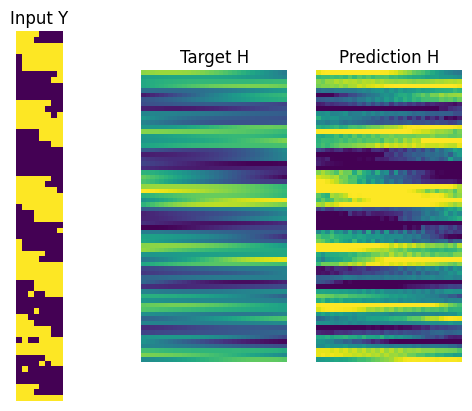

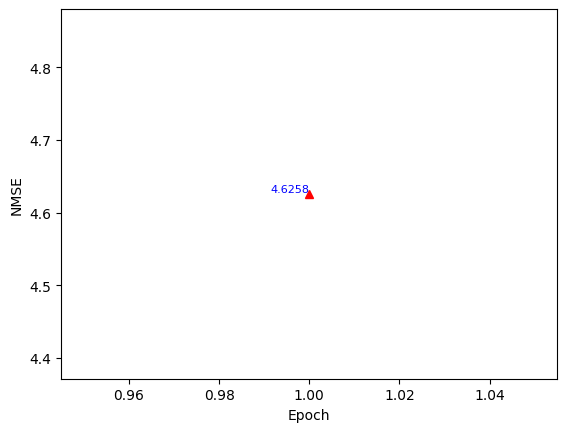

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 17.418774 , Discriminator loss: 0.20632695 , time: 0:03:27.379153
B/E: 103 / 1 , Generator loss: 20.742315 , Discriminator loss: 3.9412615 , time: 0:03:40.130659
B/E: 206 / 1 , Generator loss: 17.673477 , Discriminator loss: 0.0014250518 , time: 0:03:52.410074
B/E: 309 / 1 , Generator loss: 18.641254 , Discriminator loss: 0.003454249 , time: 0:04:04.906613
B/E: 412 / 1 , Generator loss: 16.051268 , Discriminator loss: 0.018688066 , time: 0:04:17.458529
B/E: 515 / 1 , Generator loss: 18.904896 , Discriminator loss: 0.004609906 , time: 0:04:29.964871
B/E: 618 / 1 , Generator loss: 16.108171 , Discriminator loss: 0.01893096 , time: 0:04:42.665757
B/E: 721 / 1 , Generator loss: 19.25256 , Discriminator loss: 0.0004893499 , time: 0:04:55.158078
B/E: 824 / 1 , Generator loss: 18.423147 , Discriminator loss: 0.0016426964 , time: 0:05:07.780530
B/E: 927 / 1 , Generator loss: 20.333351 , Discriminator loss: 0.0021680912 , time: 0:05:20.329686
B/E: 103

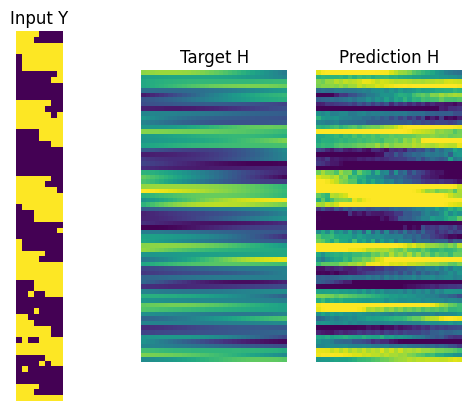

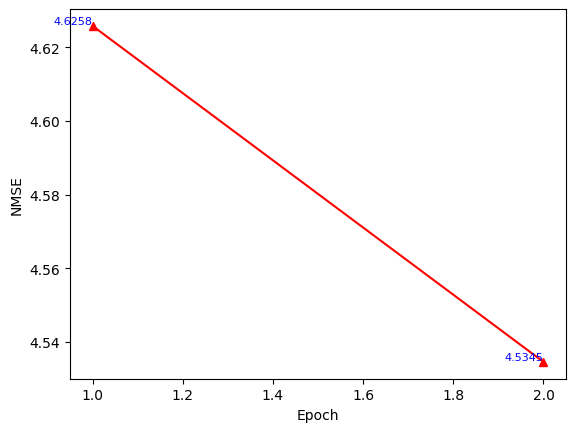

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 20.423527 , Discriminator loss: 0.0006068225 , time: 0:06:38.201800
B/E: 103 / 2 , Generator loss: 18.184996 , Discriminator loss: 0.002319083 , time: 0:06:50.717909
B/E: 206 / 2 , Generator loss: 15.807449 , Discriminator loss: 0.7923653 , time: 0:07:03.014814
B/E: 309 / 2 , Generator loss: 19.279274 , Discriminator loss: 0.0006707753 , time: 0:07:15.341338
B/E: 412 / 2 , Generator loss: 16.007847 , Discriminator loss: 0.0037918775 , time: 0:07:28.111436
B/E: 515 / 2 , Generator loss: 14.847368 , Discriminator loss: 1.6300595 , time: 0:07:42.257763
B/E: 618 / 2 , Generator loss: 17.343224 , Discriminator loss: 0.0046912413 , time: 0:07:56.200923
B/E: 721 / 2 , Generator loss: 16.94435 , Discriminator loss: 0.0036068875 , time: 0:08:09.549427
B/E: 824 / 2 , Generator loss: 20.418129 , Discriminator loss: 0.0031666113 , time: 0:08:22.718268
B/E: 927 / 2 , Generator loss: 18.574066 , Discriminator loss: 0.00069730787 , time: 0:08:35.914921
B/E:

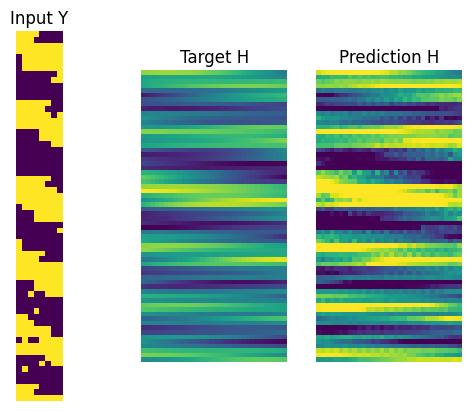

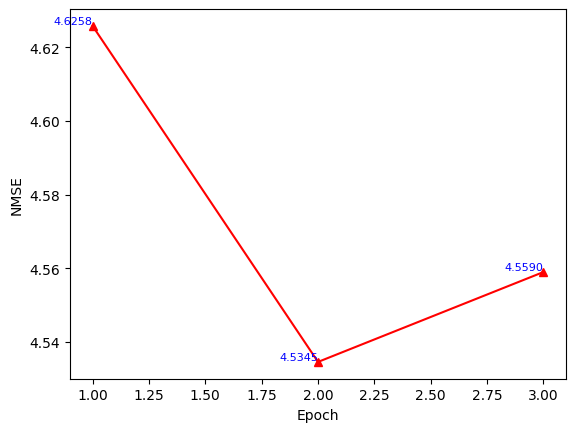

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 13.072269 , Discriminator loss: 0.25309747 , time: 0:09:56.810856
B/E: 103 / 3 , Generator loss: 22.143246 , Discriminator loss: 0.4551096 , time: 0:10:10.129671
B/E: 206 / 3 , Generator loss: 19.766727 , Discriminator loss: 0.040422775 , time: 0:10:23.006023
B/E: 309 / 3 , Generator loss: 11.949651 , Discriminator loss: 0.15234391 , time: 0:10:35.892756
B/E: 412 / 3 , Generator loss: 14.849066 , Discriminator loss: 0.029372422 , time: 0:10:48.996338
B/E: 515 / 3 , Generator loss: 19.143744 , Discriminator loss: 0.00081895397 , time: 0:11:01.998486
B/E: 618 / 3 , Generator loss: 20.15997 , Discriminator loss: 0.00025188483 , time: 0:11:15.045532
B/E: 721 / 3 , Generator loss: 13.801591 , Discriminator loss: 0.02768193 , time: 0:11:27.929699
B/E: 824 / 3 , Generator loss: 15.250717 , Discriminator loss: 0.0046614525 , time: 0:11:40.820037
B/E: 927 / 3 , Generator loss: 20.10347 , Discriminator loss: 0.00021385841 , time: 0:11:53.604549
B/E: 10

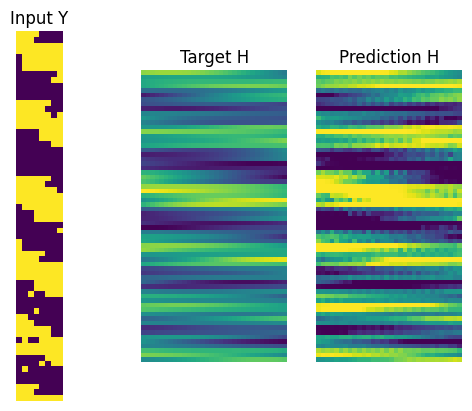

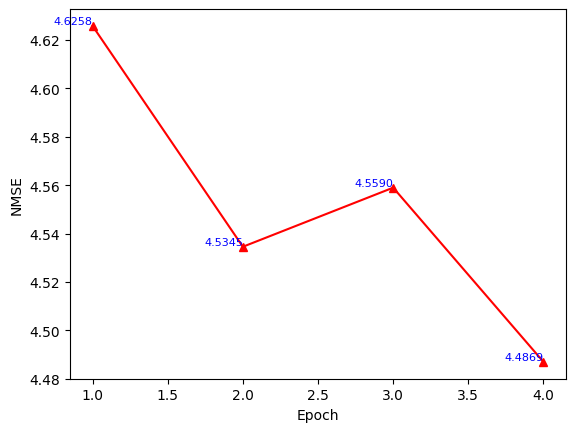

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 18.626144 , Discriminator loss: 0.0029337306 , time: 0:13:14.021987
B/E: 103 / 4 , Generator loss: 16.844694 , Discriminator loss: 0.004247062 , time: 0:13:27.180487
B/E: 206 / 4 , Generator loss: 16.998266 , Discriminator loss: 0.0026708231 , time: 0:13:40.390045
B/E: 309 / 4 , Generator loss: 18.645912 , Discriminator loss: 0.028398 , time: 0:13:53.440815
B/E: 412 / 4 , Generator loss: 16.400978 , Discriminator loss: 0.0035611377 , time: 0:14:06.863721
B/E: 515 / 4 , Generator loss: 15.977022 , Discriminator loss: 0.012735508 , time: 0:14:20.080212
B/E: 618 / 4 , Generator loss: 12.984531 , Discriminator loss: 0.051033646 , time: 0:14:32.950114
B/E: 721 / 4 , Generator loss: 19.934168 , Discriminator loss: 0.0037680045 , time: 0:14:45.480202
B/E: 824 / 4 , Generator loss: 20.991024 , Discriminator loss: 0.46221915 , time: 0:14:57.871309
B/E: 927 / 4 , Generator loss: 15.169809 , Discriminator loss: 0.021301044 , time: 0:15:10.262244
B/E: 10

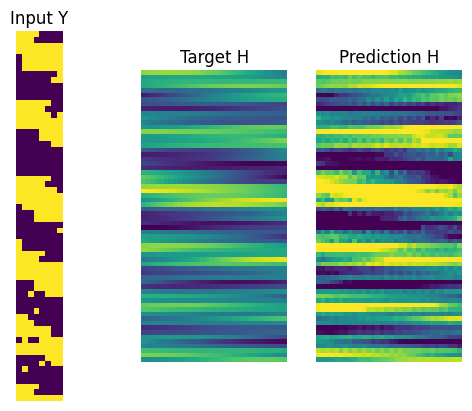

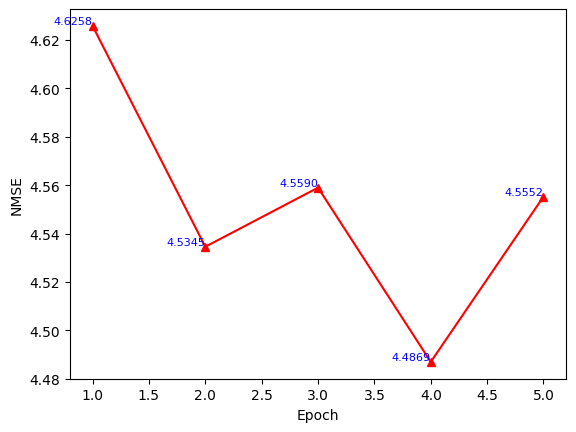

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 17.103 , Discriminator loss: 0.036535174 , time: 0:16:30.040555
B/E: 103 / 5 , Generator loss: 14.232986 , Discriminator loss: 0.07179162 , time: 0:16:42.825177
B/E: 206 / 5 , Generator loss: 19.889051 , Discriminator loss: 0.0006463466 , time: 0:16:55.493091
B/E: 309 / 5 , Generator loss: 18.693798 , Discriminator loss: 0.001683922 , time: 0:17:08.150077
B/E: 412 / 5 , Generator loss: 14.792793 , Discriminator loss: 0.012321129 , time: 0:17:20.782267
B/E: 515 / 5 , Generator loss: 19.129257 , Discriminator loss: 0.010023825 , time: 0:17:33.508028
B/E: 618 / 5 , Generator loss: 20.557968 , Discriminator loss: 0.00036715026 , time: 0:17:46.359884
B/E: 721 / 5 , Generator loss: 18.57199 , Discriminator loss: 0.00041007382 , time: 0:17:59.247692
B/E: 824 / 5 , Generator loss: 19.970411 , Discriminator loss: 0.013348826 , time: 0:18:12.243184
B/E: 927 / 5 , Generator loss: 17.087101 , Discriminator loss: 0.0052097957 , time: 0:18:25.153063
B/E: 1

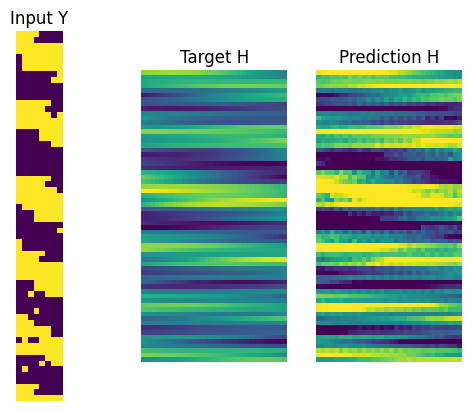

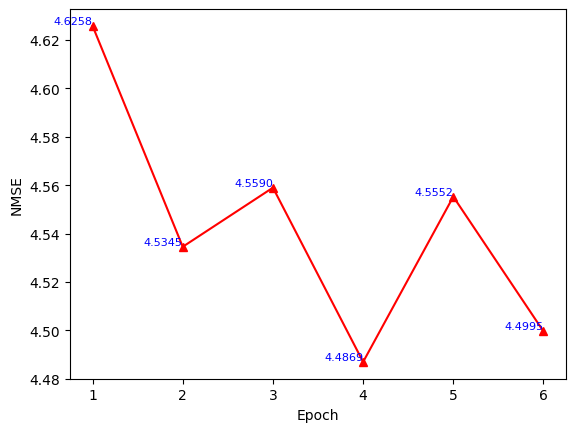

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 8.531578 , Discriminator loss: 5.2194076 , time: 0:19:43.022775
B/E: 103 / 6 , Generator loss: 18.858852 , Discriminator loss: 0.010384527 , time: 0:19:55.325712
B/E: 206 / 6 , Generator loss: 13.571618 , Discriminator loss: 0.054571122 , time: 0:20:07.235042
B/E: 309 / 6 , Generator loss: 14.846405 , Discriminator loss: 0.01451986 , time: 0:20:19.330664
B/E: 412 / 6 , Generator loss: 12.34175 , Discriminator loss: 0.07507205 , time: 0:20:31.580579
B/E: 515 / 6 , Generator loss: 15.245331 , Discriminator loss: 0.051721863 , time: 0:20:44.004937
B/E: 618 / 6 , Generator loss: 17.669962 , Discriminator loss: 0.010973203 , time: 0:20:56.501560
B/E: 721 / 6 , Generator loss: 18.327087 , Discriminator loss: 0.009593344 , time: 0:21:08.935143
B/E: 824 / 6 , Generator loss: 15.840227 , Discriminator loss: 0.004476042 , time: 0:21:21.387943
B/E: 927 / 6 , Generator loss: 21.850264 , Discriminator loss: 0.29349968 , time: 0:21:33.605909
B/E: 1030 / 6 

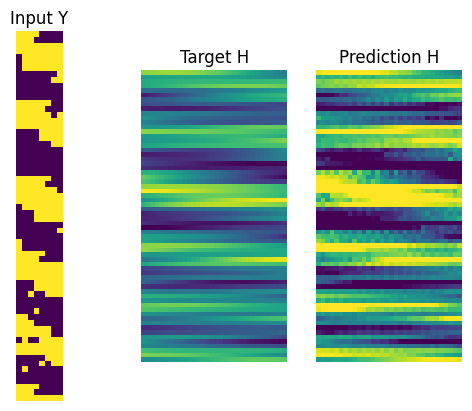

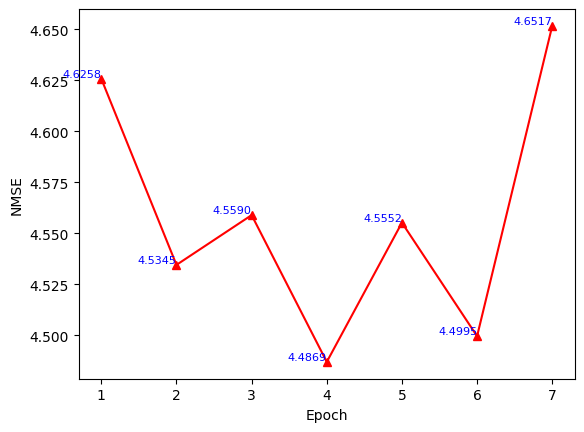

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 20.583061 , Discriminator loss: 0.00014734687 , time: 0:00:05.190154
B/E: 103 / 0 , Generator loss: 18.169403 , Discriminator loss: 0.010205729 , time: 0:00:18.048021
B/E: 206 / 0 , Generator loss: 18.835098 , Discriminator loss: 0.015772285 , time: 0:00:30.782525
B/E: 309 / 0 , Generator loss: 17.320427 , Discriminator loss: 0.0017394872 , time: 0:00:43.450917
B/E: 412 / 0 , Generator loss: 17.60435 , Discriminator loss: 0.0062511684 , time: 0:00:56.035928
B/E: 515 / 0 , Generator loss: 16.968294 , Discriminator loss: 0.005533144 , time: 0:01:08.691683
B/E: 618 / 0 , Generator loss: 22.32174 , Discriminator loss: 0.00033336325 , time: 0:01:21.361429
B/E: 721 / 0 , Generator loss: 20.223146 , Discriminator loss: 0.008856165 , time: 0:01:34.207711
B/E: 824 / 0 , Generator loss: 16.746664 , Discriminator loss: 0.0063607274 , time: 0:01:47.069111
B/E: 927 / 0 , Generator loss: 21.020145 , Discriminator loss: 4.2646145e-05 , time: 0:01:59.785136


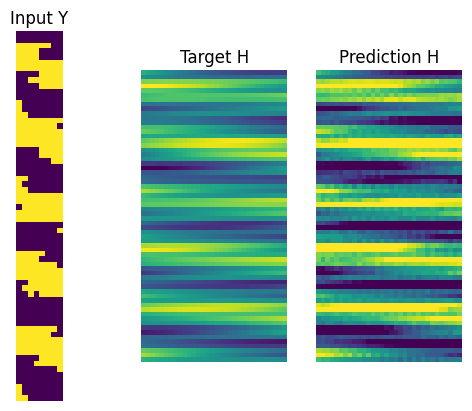

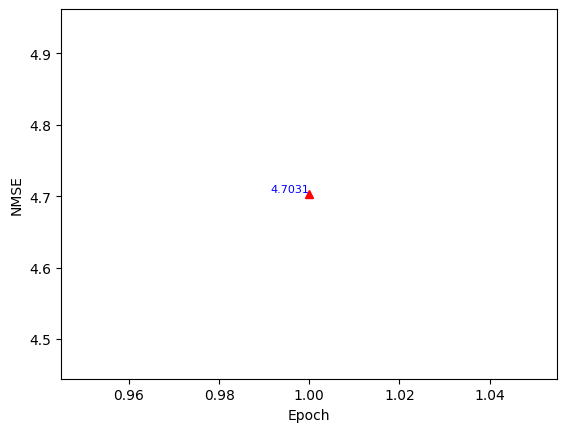

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 20.690325 , Discriminator loss: 0.00023145103 , time: 0:03:19.871656
B/E: 103 / 1 , Generator loss: 19.817135 , Discriminator loss: 0.0002290446 , time: 0:03:32.799541
B/E: 206 / 1 , Generator loss: 12.852681 , Discriminator loss: 0.12210146 , time: 0:03:45.622778
B/E: 309 / 1 , Generator loss: 18.839893 , Discriminator loss: 0.0018782904 , time: 0:03:58.005234
B/E: 412 / 1 , Generator loss: 18.480196 , Discriminator loss: 0.0005091456 , time: 0:04:10.851211
B/E: 515 / 1 , Generator loss: 18.164951 , Discriminator loss: 0.0051535186 , time: 0:04:23.518186
B/E: 618 / 1 , Generator loss: 19.142971 , Discriminator loss: 0.039925784 , time: 0:04:36.114761
B/E: 721 / 1 , Generator loss: 17.284615 , Discriminator loss: 0.002709117 , time: 0:04:48.799530
B/E: 824 / 1 , Generator loss: 20.525433 , Discriminator loss: 0.00020170968 , time: 0:05:01.515854
B/E: 927 / 1 , Generator loss: 20.110266 , Discriminator loss: 0.002369932 , time: 0:05:14.667692


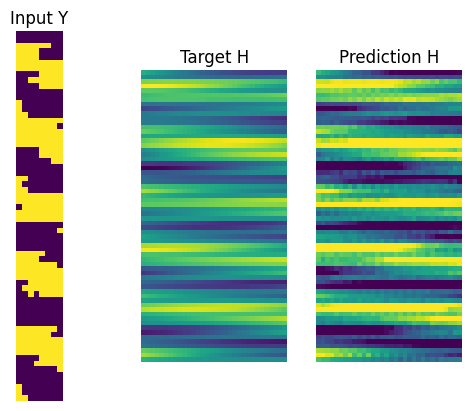

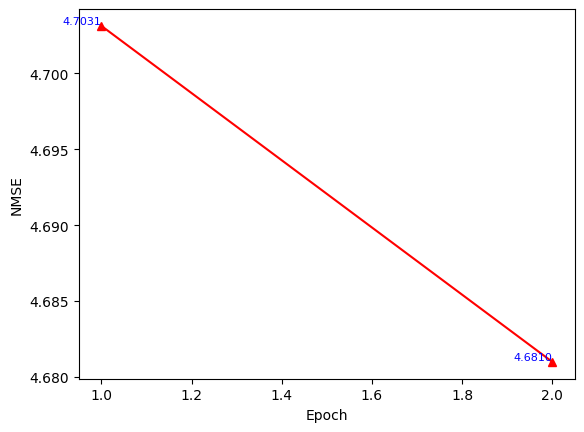

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 11.410781 , Discriminator loss: 0.55588156 , time: 0:06:36.323617
B/E: 103 / 2 , Generator loss: 15.793808 , Discriminator loss: 0.0075291856 , time: 0:06:49.301064
B/E: 206 / 2 , Generator loss: 18.837475 , Discriminator loss: 0.0021448762 , time: 0:07:02.176396
B/E: 309 / 2 , Generator loss: 16.03905 , Discriminator loss: 0.04507644 , time: 0:07:15.125595
B/E: 412 / 2 , Generator loss: 23.397877 , Discriminator loss: 0.007335927 , time: 0:07:27.842314
B/E: 515 / 2 , Generator loss: 14.517296 , Discriminator loss: 0.026117362 , time: 0:07:40.642172
B/E: 618 / 2 , Generator loss: 17.938332 , Discriminator loss: 0.002284843 , time: 0:07:53.755402
B/E: 721 / 2 , Generator loss: 18.132925 , Discriminator loss: 0.0016798961 , time: 0:08:06.973821
B/E: 824 / 2 , Generator loss: 20.274551 , Discriminator loss: 0.0003966062 , time: 0:08:20.093311
B/E: 927 / 2 , Generator loss: 21.317694 , Discriminator loss: 4.8176356e-05 , time: 0:08:33.100018
B/E:

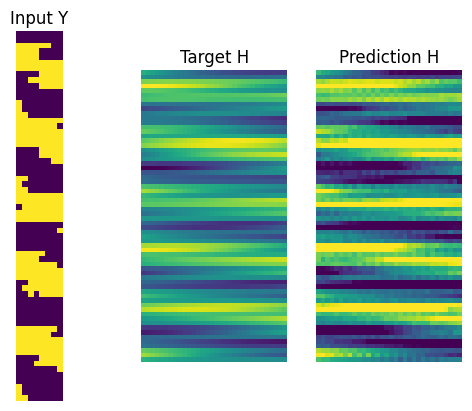

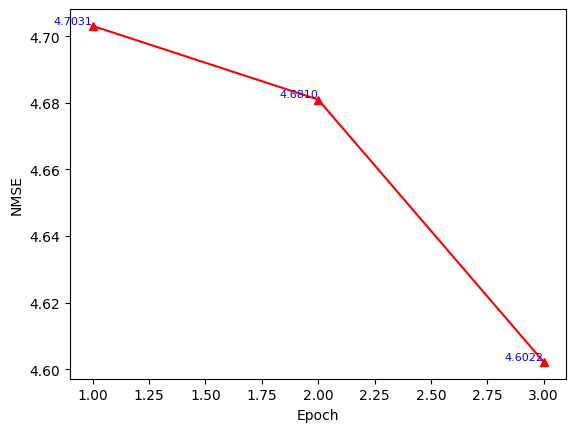

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 16.027536 , Discriminator loss: 0.0056814537 , time: 0:09:52.874976
B/E: 103 / 3 , Generator loss: 14.9458275 , Discriminator loss: 0.021791482 , time: 0:10:05.674564
B/E: 206 / 3 , Generator loss: 16.359764 , Discriminator loss: 0.008899694 , time: 0:10:18.629273
B/E: 309 / 3 , Generator loss: 20.390453 , Discriminator loss: 0.0009720601 , time: 0:10:31.512600
B/E: 412 / 3 , Generator loss: 19.476452 , Discriminator loss: 0.00055692944 , time: 0:10:44.318747
B/E: 515 / 3 , Generator loss: 18.758057 , Discriminator loss: 0.0006915053 , time: 0:10:56.903915
B/E: 618 / 3 , Generator loss: 20.867172 , Discriminator loss: 0.00016344537 , time: 0:11:09.721521
B/E: 721 / 3 , Generator loss: 18.890419 , Discriminator loss: 0.00021983504 , time: 0:11:22.445409
B/E: 824 / 3 , Generator loss: 18.054337 , Discriminator loss: 0.00054207916 , time: 0:11:35.238288
B/E: 927 / 3 , Generator loss: 21.941814 , Discriminator loss: 0.00012721794 , time: 0:11:48.

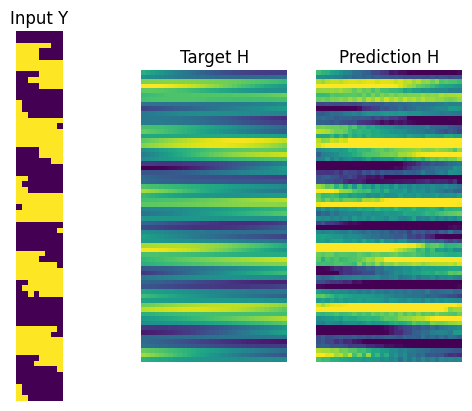

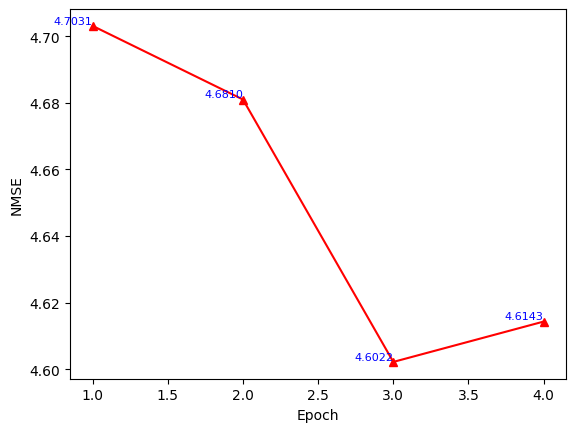

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 15.518464 , Discriminator loss: 0.010511488 , time: 0:13:07.465215
B/E: 103 / 4 , Generator loss: 16.413387 , Discriminator loss: 0.012769757 , time: 0:13:20.444934
B/E: 206 / 4 , Generator loss: 15.194066 , Discriminator loss: 0.155823 , time: 0:13:33.138939
B/E: 309 / 4 , Generator loss: 21.223335 , Discriminator loss: 1.0870742 , time: 0:13:46.045172
B/E: 412 / 4 , Generator loss: 18.654402 , Discriminator loss: 0.00032809962 , time: 0:13:58.673767
B/E: 515 / 4 , Generator loss: 18.607134 , Discriminator loss: 0.0005988183 , time: 0:14:11.770608
B/E: 618 / 4 , Generator loss: 18.560469 , Discriminator loss: 0.00032862043 , time: 0:14:24.793416
B/E: 721 / 4 , Generator loss: 16.99424 , Discriminator loss: 0.0005852339 , time: 0:14:37.742405
B/E: 824 / 4 , Generator loss: 15.14651 , Discriminator loss: 0.03623222 , time: 0:14:50.558959
B/E: 927 / 4 , Generator loss: 14.197393 , Discriminator loss: 0.057929948 , time: 0:15:03.224619
B/E: 1030

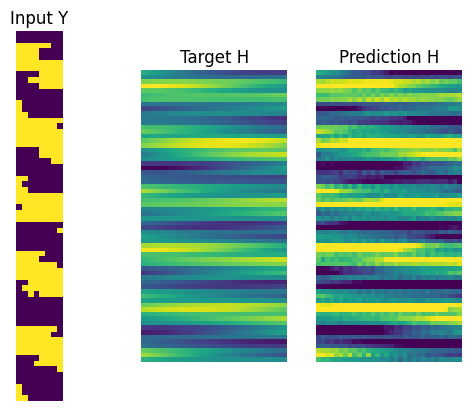

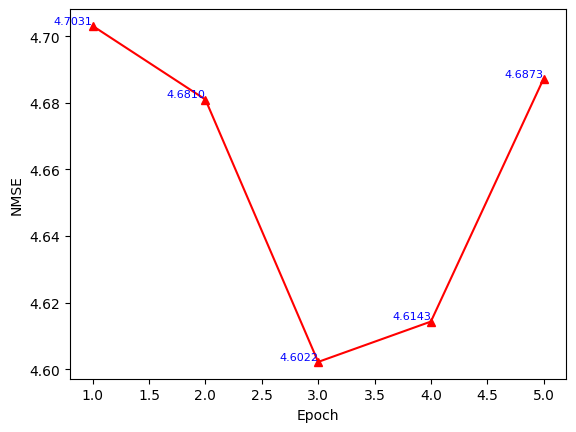

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 17.35699 , Discriminator loss: 0.0028077685 , time: 0:16:22.520891
B/E: 103 / 5 , Generator loss: 14.607603 , Discriminator loss: 0.014415151 , time: 0:16:34.923100
B/E: 206 / 5 , Generator loss: 14.00332 , Discriminator loss: 0.057162087 , time: 0:16:47.605794
B/E: 309 / 5 , Generator loss: 21.889645 , Discriminator loss: 7.692318e-05 , time: 0:17:00.293662
B/E: 412 / 5 , Generator loss: 18.275528 , Discriminator loss: 0.0033780248 , time: 0:17:13.133384
B/E: 515 / 5 , Generator loss: 19.352139 , Discriminator loss: 0.0016549372 , time: 0:17:25.922563
B/E: 618 / 5 , Generator loss: 20.218842 , Discriminator loss: 0.0014895314 , time: 0:17:38.577944
B/E: 721 / 5 , Generator loss: 13.636491 , Discriminator loss: 0.06891544 , time: 0:17:51.331318
B/E: 824 / 5 , Generator loss: 24.549994 , Discriminator loss: 0.001353881 , time: 0:18:04.041926
B/E: 927 / 5 , Generator loss: 21.041962 , Discriminator loss: 0.17927624 , time: 0:18:16.840066
B/E: 1

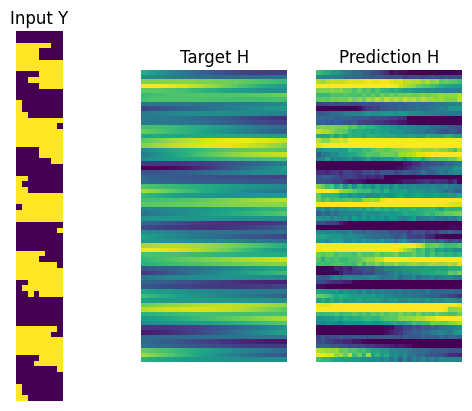

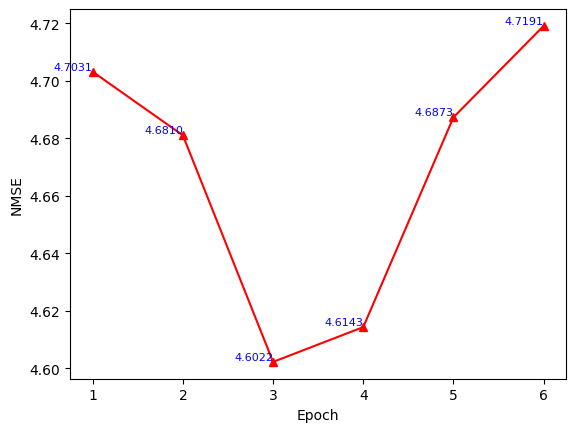

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 21.039509 , Discriminator loss: 0.0007815755 , time: 0:19:35.763992
B/E: 103 / 6 , Generator loss: 17.126368 , Discriminator loss: 0.006517064 , time: 0:19:48.560969
B/E: 206 / 6 , Generator loss: 16.989893 , Discriminator loss: 0.0053129927 , time: 0:20:01.254792
B/E: 309 / 6 , Generator loss: 20.590725 , Discriminator loss: 0.00021901882 , time: 0:20:14.184596
B/E: 412 / 6 , Generator loss: 21.238451 , Discriminator loss: 0.0005998226 , time: 0:20:27.072347
B/E: 515 / 6 , Generator loss: 22.628838 , Discriminator loss: 0.41718298 , time: 0:20:39.644369
B/E: 618 / 6 , Generator loss: 21.536272 , Discriminator loss: 5.140841e-05 , time: 0:20:52.097831
B/E: 721 / 6 , Generator loss: 17.248411 , Discriminator loss: 0.009227743 , time: 0:21:04.372417
B/E: 824 / 6 , Generator loss: 19.495607 , Discriminator loss: 0.0013326567 , time: 0:21:16.934758
B/E: 927 / 6 , Generator loss: 19.453903 , Discriminator loss: 0.6593495 , time: 0:21:29.592193
B/E

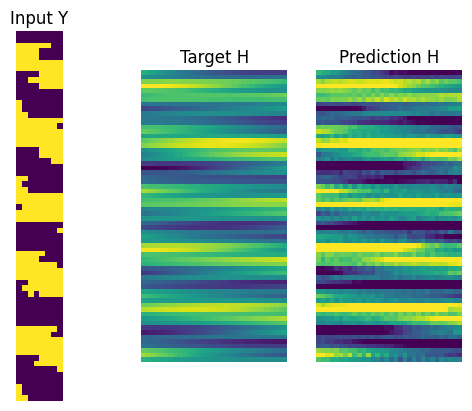

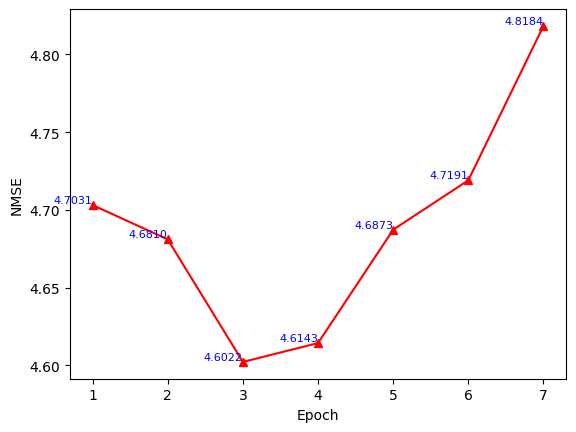

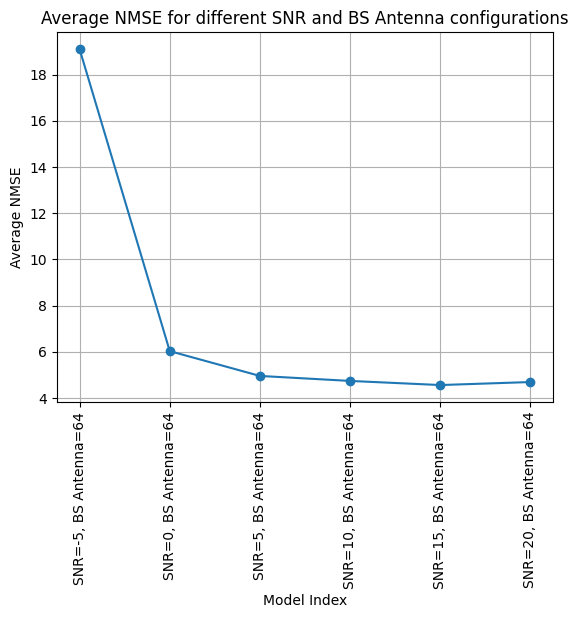

In [ ]:
if __name__ == "__main__":
    snr_list = [-5, 0, 5, 10, 15, 20]
    bs_ant_list = [64]
    avg_nmse = train(epochs=7, snr_list=snr_list, bs_ant_list=bs_ant_list)

    plt.plot(avg_nmse, marker='o')
    plt.xlabel('Model Index')
    plt.ylabel('Average NMSE')
    plt.title('Average NMSE for different SNR and BS Antenna configurations')
    plt.xticks(ticks=range(len(avg_nmse)), labels=[f'SNR={snr}, BS Antenna={bs_ant}' for snr in snr_list for bs_ant in bs_ant_list])
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()


##Main Function

For 128 antennas at the Base Station(BS)

For each set of antennas, we vary the SNR ranging from -5 to 20. We can test over higher SNR values too.


-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 60.05313 , Discriminator loss: 1.3883235 , time: 0:00:06.939466
B/E: 103 / 0 , Generator loss: 35.401157 , Discriminator loss: 1.3850483 , time: 0:00:29.845203
B/E: 206 / 0 , Generator loss: 30.893806 , Discriminator loss: 1.3155278 , time: 0:00:44.064428
B/E: 309 / 0 , Generator loss: 34.960815 , Discriminator loss: 0.20565018 , time: 0:00:58.338364
B/E: 412 / 0 , Generator loss: 36.209724 , Discriminator loss: 0.25482458 , time: 0:01:12.776921
B/E: 515 / 0 , Generator loss: 35.040485 , Discriminator loss: 0.7361933 , time: 0:01:30.088984
B/E: 618 / 0 , Generator loss: 36.319954 , Discriminator loss: 0.73199266 , time: 0:01:44.215000
B/E: 721 / 0 , Generator loss: 38.119347 , Discriminator loss: 0.17905644 , time: 0:01:58.324496
B/E: 824 / 0 , Generator loss: 36.519012 , Discriminator loss: 0.19371445 , time: 0:02:12.661414
B/E: 927 / 0 , Generator loss: 34.065865 , Discriminator loss: 1.9376363 , time: 0:02:26.923173
B/E: 1030 / 0 , Generat

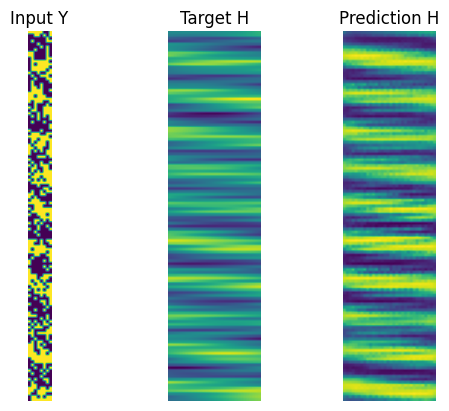

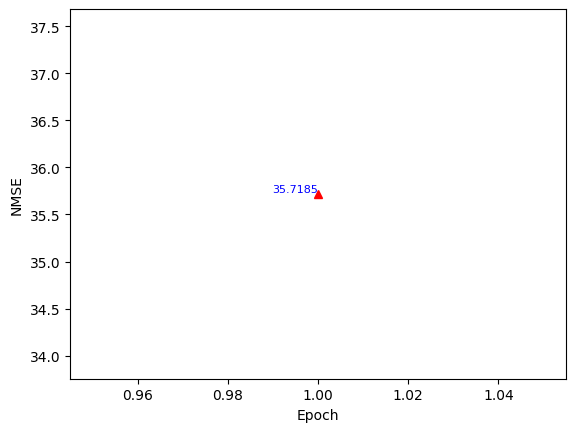

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 36.008934 , Discriminator loss: 0.14112838 , time: 0:04:18.607002
B/E: 103 / 1 , Generator loss: 34.08877 , Discriminator loss: 0.56243676 , time: 0:04:33.408004
B/E: 206 / 1 , Generator loss: 37.81464 , Discriminator loss: 1.0785804 , time: 0:04:47.928832
B/E: 309 / 1 , Generator loss: 36.898613 , Discriminator loss: 0.21174091 , time: 0:05:02.257726
B/E: 412 / 1 , Generator loss: 44.33004 , Discriminator loss: 0.6691624 , time: 0:05:16.673374
B/E: 515 / 1 , Generator loss: 31.113194 , Discriminator loss: 0.65929997 , time: 0:05:31.054459
B/E: 618 / 1 , Generator loss: 40.5985 , Discriminator loss: 0.5259044 , time: 0:05:45.417750
B/E: 721 / 1 , Generator loss: 34.58285 , Discriminator loss: 1.5634177 , time: 0:05:59.853369
B/E: 824 / 1 , Generator loss: 33.991035 , Discriminator loss: 1.1084626 , time: 0:06:14.225983
B/E: 927 / 1 , Generator loss: 28.480005 , Discriminator loss: 0.7637496 , time: 0:06:28.748501
B/E: 1030 / 1 , Generator los

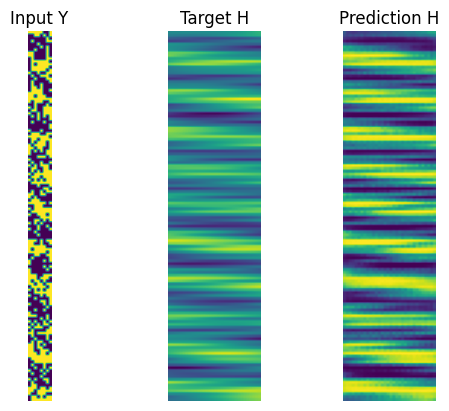

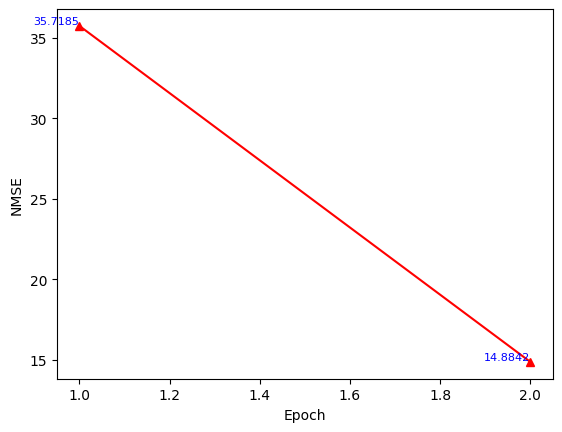

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 20.982677 , Discriminator loss: 1.1233816 , time: 0:08:02.030390
B/E: 103 / 2 , Generator loss: 24.381533 , Discriminator loss: 1.3280221 , time: 0:08:16.597450
B/E: 206 / 2 , Generator loss: 22.401175 , Discriminator loss: 1.0768391 , time: 0:08:30.903529
B/E: 309 / 2 , Generator loss: 21.747904 , Discriminator loss: 1.1778662 , time: 0:08:45.235652
B/E: 412 / 2 , Generator loss: 20.928974 , Discriminator loss: 0.7029257 , time: 0:08:59.529002
B/E: 515 / 2 , Generator loss: 18.974064 , Discriminator loss: 1.2771031 , time: 0:09:13.828207
B/E: 618 / 2 , Generator loss: 24.388412 , Discriminator loss: 0.4668263 , time: 0:09:28.184722
B/E: 721 / 2 , Generator loss: 20.393536 , Discriminator loss: 0.65490526 , time: 0:09:42.511010
B/E: 824 / 2 , Generator loss: 19.692564 , Discriminator loss: 1.0928843 , time: 0:09:56.969845
B/E: 927 / 2 , Generator loss: 19.321146 , Discriminator loss: 0.47200876 , time: 0:10:11.379463
B/E: 1030 / 2 , Generator

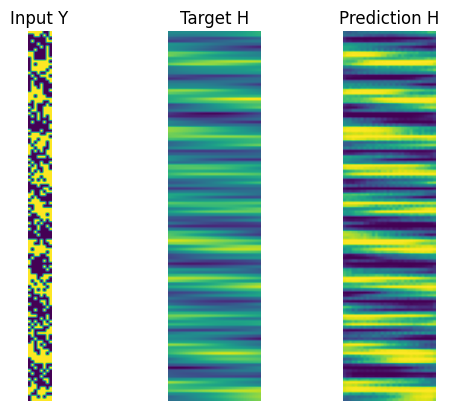

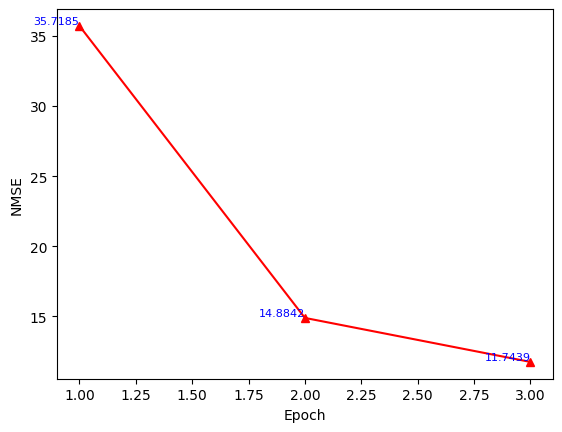

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 21.66841 , Discriminator loss: 1.391291 , time: 0:11:43.950103
B/E: 103 / 3 , Generator loss: 19.812752 , Discriminator loss: 0.4181332 , time: 0:11:58.506434
B/E: 206 / 3 , Generator loss: 16.314867 , Discriminator loss: 0.81405926 , time: 0:12:12.926818
B/E: 309 / 3 , Generator loss: 21.390036 , Discriminator loss: 1.298256 , time: 0:12:27.405023
B/E: 412 / 3 , Generator loss: 17.42206 , Discriminator loss: 0.60262674 , time: 0:12:41.856193
B/E: 515 / 3 , Generator loss: 19.461918 , Discriminator loss: 1.1404461 , time: 0:12:56.303793
B/E: 618 / 3 , Generator loss: 23.293997 , Discriminator loss: 0.63229394 , time: 0:13:10.859931
B/E: 721 / 3 , Generator loss: 16.625063 , Discriminator loss: 1.1818056 , time: 0:13:25.257867
B/E: 824 / 3 , Generator loss: 19.650948 , Discriminator loss: 0.59954804 , time: 0:13:39.800316
B/E: 927 / 3 , Generator loss: 19.803747 , Discriminator loss: 0.6289362 , time: 0:13:54.266986
B/E: 1030 / 3 , Generator l

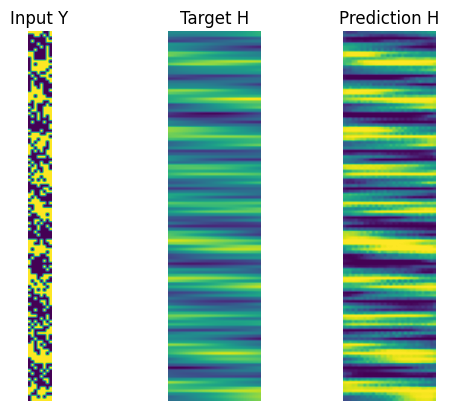

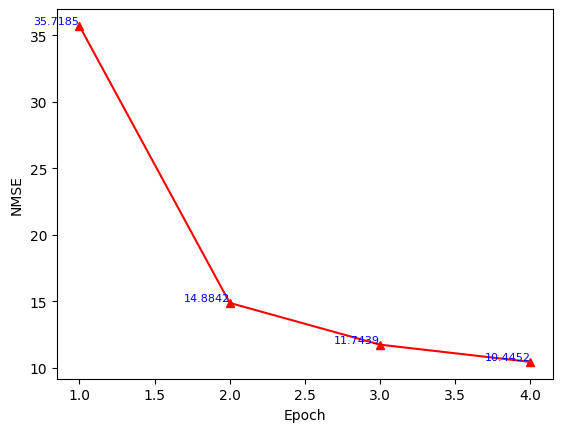

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 15.011344 , Discriminator loss: 0.4945897 , time: 0:15:27.254756
B/E: 103 / 4 , Generator loss: 18.47101 , Discriminator loss: 0.7088331 , time: 0:15:42.047936
B/E: 206 / 4 , Generator loss: 17.553814 , Discriminator loss: 0.29665643 , time: 0:15:56.685587
B/E: 309 / 4 , Generator loss: 14.811098 , Discriminator loss: 0.4417832 , time: 0:16:11.266361
B/E: 412 / 4 , Generator loss: 16.543627 , Discriminator loss: 0.7932226 , time: 0:16:25.783910
B/E: 515 / 4 , Generator loss: 17.710348 , Discriminator loss: 0.5321306 , time: 0:16:40.251386
B/E: 618 / 4 , Generator loss: 18.285778 , Discriminator loss: 0.64899844 , time: 0:16:54.619470
B/E: 721 / 4 , Generator loss: 15.786483 , Discriminator loss: 0.29896522 , time: 0:17:09.105689
B/E: 824 / 4 , Generator loss: 19.736708 , Discriminator loss: 0.50175357 , time: 0:17:23.411389
B/E: 927 / 4 , Generator loss: 12.035915 , Discriminator loss: 1.2320662 , time: 0:17:37.807083
B/E: 1030 / 4 , Generato

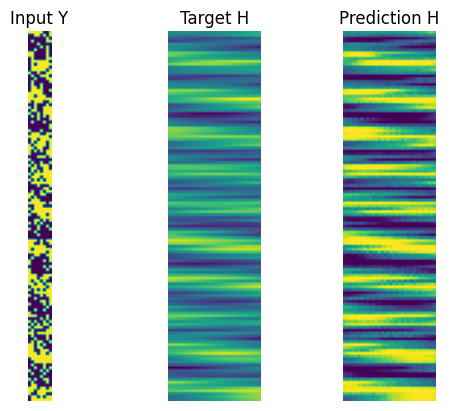

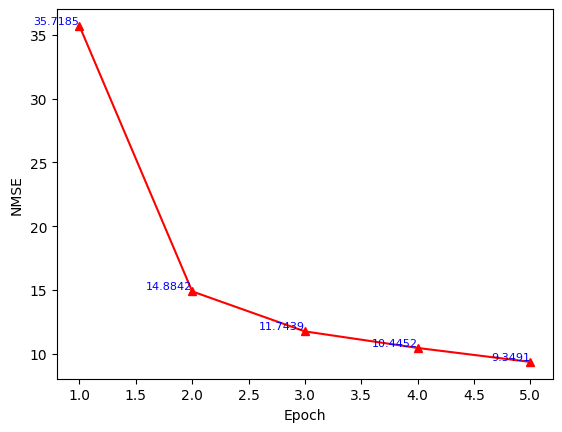

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 16.768688 , Discriminator loss: 0.4811639 , time: 0:19:10.214556
B/E: 103 / 5 , Generator loss: 14.051496 , Discriminator loss: 0.72833294 , time: 0:19:24.514361
B/E: 206 / 5 , Generator loss: 15.827815 , Discriminator loss: 0.7194737 , time: 0:19:38.856521
B/E: 309 / 5 , Generator loss: 19.540268 , Discriminator loss: 0.543022 , time: 0:19:53.253551
B/E: 412 / 5 , Generator loss: 16.889986 , Discriminator loss: 0.27170107 , time: 0:20:07.663655
B/E: 515 / 5 , Generator loss: 16.69395 , Discriminator loss: 0.38683084 , time: 0:20:22.087251
B/E: 618 / 5 , Generator loss: 14.590282 , Discriminator loss: 0.42700297 , time: 0:20:36.598724
B/E: 721 / 5 , Generator loss: 13.852533 , Discriminator loss: 0.3043116 , time: 0:20:50.931436
B/E: 824 / 5 , Generator loss: 18.439133 , Discriminator loss: 0.60976374 , time: 0:21:05.473304
B/E: 927 / 5 , Generator loss: 14.672187 , Discriminator loss: 0.3196955 , time: 0:21:19.846826
B/E: 1030 / 5 , Generato

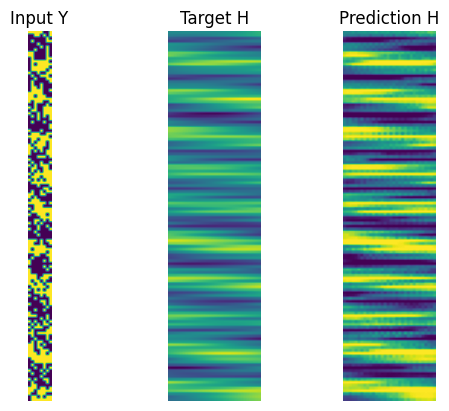

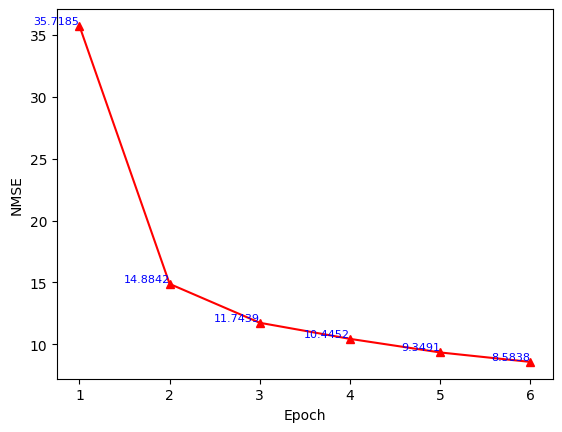

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 16.494314 , Discriminator loss: 0.49125397 , time: 0:22:52.453536
B/E: 103 / 6 , Generator loss: 17.940903 , Discriminator loss: 0.95309997 , time: 0:23:06.887319
B/E: 206 / 6 , Generator loss: 15.681322 , Discriminator loss: 0.17950034 , time: 0:23:21.420297
B/E: 309 / 6 , Generator loss: 14.342816 , Discriminator loss: 0.16223949 , time: 0:23:35.818706
B/E: 412 / 6 , Generator loss: 12.8393 , Discriminator loss: 0.73148715 , time: 0:23:50.360070
B/E: 515 / 6 , Generator loss: 15.954171 , Discriminator loss: 0.18666786 , time: 0:24:04.870189
B/E: 618 / 6 , Generator loss: 15.639453 , Discriminator loss: 0.082933255 , time: 0:24:19.179439
B/E: 721 / 6 , Generator loss: 18.39162 , Discriminator loss: 0.6699841 , time: 0:24:33.555374
B/E: 824 / 6 , Generator loss: 18.038937 , Discriminator loss: 0.5564023 , time: 0:24:47.804346
B/E: 927 / 6 , Generator loss: 16.8359 , Discriminator loss: 1.3324258 , time: 0:25:02.115490
B/E: 1030 / 6 , Generato

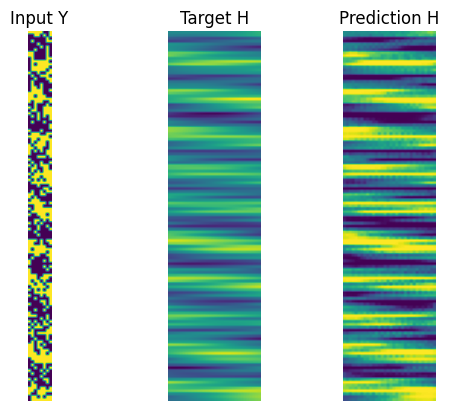

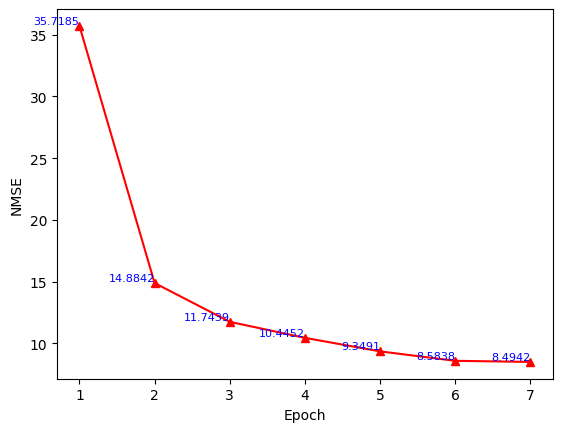

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 18.756939 , Discriminator loss: 0.2098193 , time: 0:00:03.034843
B/E: 103 / 0 , Generator loss: 18.016794 , Discriminator loss: 0.25931814 , time: 0:00:17.580444
B/E: 206 / 0 , Generator loss: 16.713331 , Discriminator loss: 0.30744356 , time: 0:00:31.983405
B/E: 309 / 0 , Generator loss: 16.820581 , Discriminator loss: 0.70938116 , time: 0:00:46.365035
B/E: 412 / 0 , Generator loss: 19.034172 , Discriminator loss: 0.31290424 , time: 0:01:00.709499
B/E: 515 / 0 , Generator loss: 17.373932 , Discriminator loss: 0.13512683 , time: 0:01:15.200634
B/E: 618 / 0 , Generator loss: 18.979536 , Discriminator loss: 0.12076977 , time: 0:01:29.499966
B/E: 721 / 0 , Generator loss: 18.100748 , Discriminator loss: 1.0708627 , time: 0:01:43.843424
B/E: 824 / 0 , Generator loss: 20.914635 , Discriminator loss: 1.8949782 , time: 0:01:58.253234
B/E: 927 / 0 , Generator loss: 14.81678 , Discriminator loss: 0.47949305 , time: 0:02:12.641421
B/E: 1030 / 0 , Gener

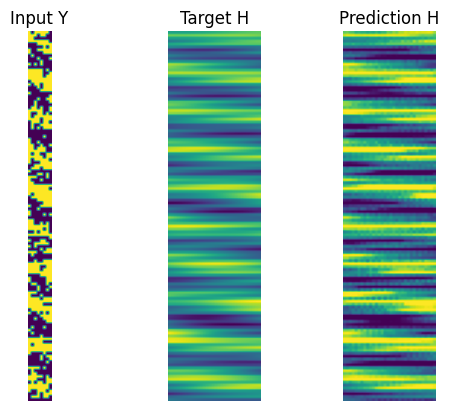

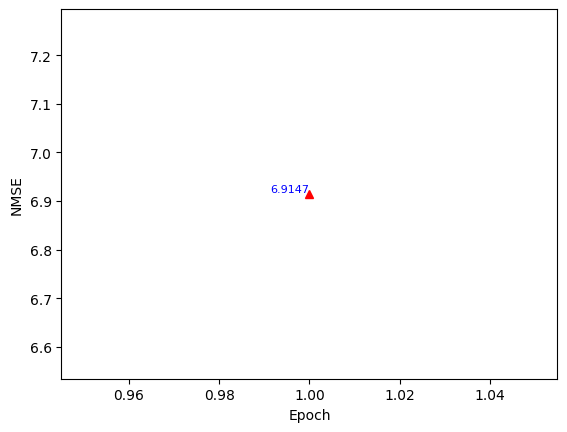

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 15.719331 , Discriminator loss: 0.14113481 , time: 0:03:45.110676
B/E: 103 / 1 , Generator loss: 15.410913 , Discriminator loss: 0.2395246 , time: 0:03:59.405344
B/E: 206 / 1 , Generator loss: 19.864462 , Discriminator loss: 0.09275523 , time: 0:04:13.687501
B/E: 309 / 1 , Generator loss: 19.58722 , Discriminator loss: 0.2526865 , time: 0:04:28.067257
B/E: 412 / 1 , Generator loss: 14.206735 , Discriminator loss: 0.28300115 , time: 0:04:42.258974
B/E: 515 / 1 , Generator loss: 16.63812 , Discriminator loss: 0.2195188 , time: 0:04:56.492352
B/E: 618 / 1 , Generator loss: 18.683102 , Discriminator loss: 0.05770437 , time: 0:05:10.764440
B/E: 721 / 1 , Generator loss: 22.053858 , Discriminator loss: 0.4251259 , time: 0:05:24.980052
B/E: 824 / 1 , Generator loss: 14.31259 , Discriminator loss: 0.14546558 , time: 0:05:39.331380
B/E: 927 / 1 , Generator loss: 18.472628 , Discriminator loss: 0.03713513 , time: 0:05:53.526347
B/E: 1030 / 1 , Generato

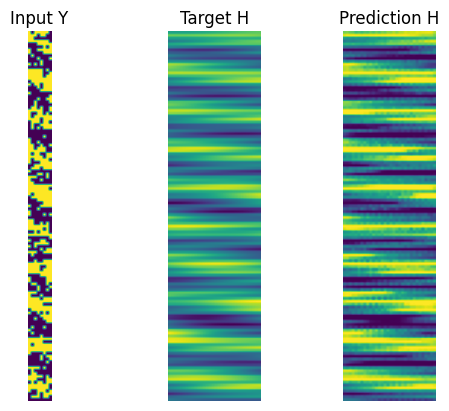

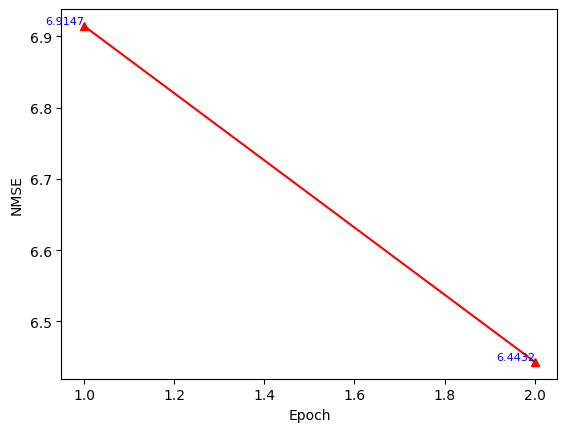

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 16.744621 , Discriminator loss: 1.1110553 , time: 0:07:24.054786
B/E: 103 / 2 , Generator loss: 17.18496 , Discriminator loss: 0.20073982 , time: 0:07:38.356481
B/E: 206 / 2 , Generator loss: 16.185738 , Discriminator loss: 0.27170762 , time: 0:07:52.502960
B/E: 309 / 2 , Generator loss: 14.218163 , Discriminator loss: 0.14175189 , time: 0:08:06.587422
B/E: 412 / 2 , Generator loss: 18.13301 , Discriminator loss: 0.072726436 , time: 0:08:20.847846
B/E: 515 / 2 , Generator loss: 17.53327 , Discriminator loss: 0.11624886 , time: 0:08:35.042237
B/E: 618 / 2 , Generator loss: 15.606159 , Discriminator loss: 0.115053646 , time: 0:08:49.226563
B/E: 721 / 2 , Generator loss: 17.655602 , Discriminator loss: 0.5802919 , time: 0:09:03.533356
B/E: 824 / 2 , Generator loss: 13.723759 , Discriminator loss: 0.33039626 , time: 0:09:17.832132
B/E: 927 / 2 , Generator loss: 13.627978 , Discriminator loss: 0.7898296 , time: 0:09:32.088449
B/E: 1030 / 2 , Gener

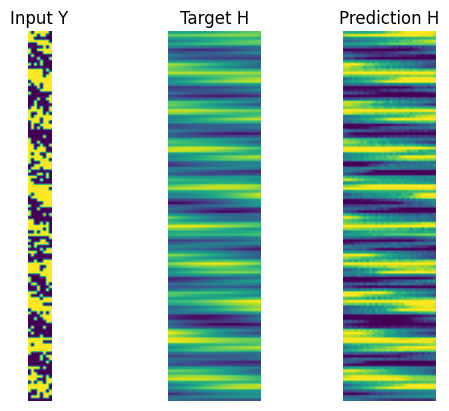

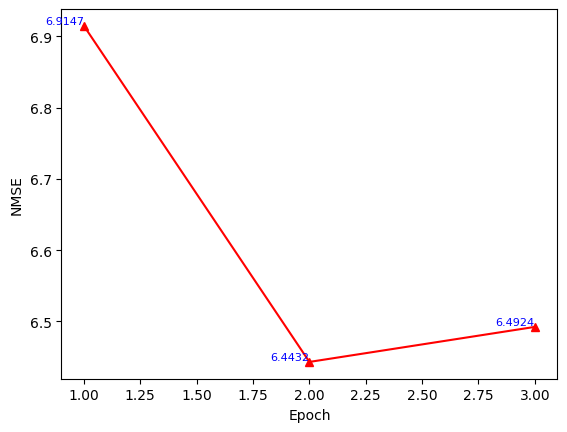

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 21.32881 , Discriminator loss: 4.262914 , time: 0:11:03.268974
B/E: 103 / 3 , Generator loss: 16.247688 , Discriminator loss: 0.030650124 , time: 0:11:17.406871
B/E: 206 / 3 , Generator loss: 18.159946 , Discriminator loss: 0.3475954 , time: 0:11:31.481100
B/E: 309 / 3 , Generator loss: 15.159288 , Discriminator loss: 0.07006472 , time: 0:11:45.742754
B/E: 412 / 3 , Generator loss: 13.120765 , Discriminator loss: 0.96617043 , time: 0:12:00.014985
B/E: 515 / 3 , Generator loss: 15.000108 , Discriminator loss: 0.11570312 , time: 0:12:14.235896
B/E: 618 / 3 , Generator loss: 12.042009 , Discriminator loss: 0.41601634 , time: 0:12:28.603801
B/E: 721 / 3 , Generator loss: 13.147807 , Discriminator loss: 0.15807995 , time: 0:12:42.791388
B/E: 824 / 3 , Generator loss: 13.422111 , Discriminator loss: 0.28669095 , time: 0:12:57.029994
B/E: 927 / 3 , Generator loss: 14.77642 , Discriminator loss: 0.8427663 , time: 0:13:11.329198
B/E: 1030 / 3 , Genera

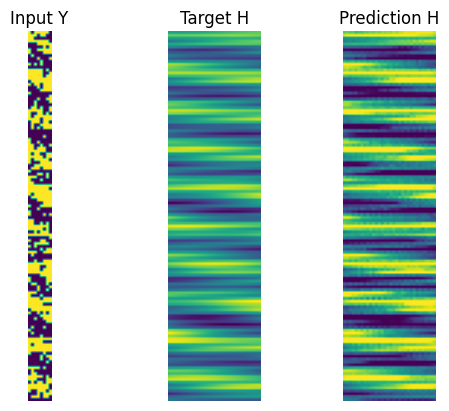

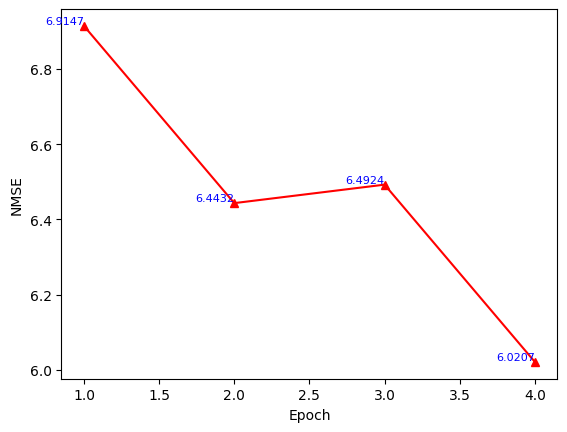

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 12.4349 , Discriminator loss: 0.4637086 , time: 0:14:42.062151
B/E: 103 / 4 , Generator loss: 15.266954 , Discriminator loss: 0.084902324 , time: 0:14:56.245063
B/E: 206 / 4 , Generator loss: 14.522511 , Discriminator loss: 0.029051457 , time: 0:15:10.601010
B/E: 309 / 4 , Generator loss: 14.822501 , Discriminator loss: 0.073247954 , time: 0:15:24.843068
B/E: 412 / 4 , Generator loss: 13.644247 , Discriminator loss: 1.6232932 , time: 0:15:38.922436
B/E: 515 / 4 , Generator loss: 15.813133 , Discriminator loss: 0.8215099 , time: 0:15:53.103071
B/E: 618 / 4 , Generator loss: 16.940937 , Discriminator loss: 0.17893748 , time: 0:16:07.299963
B/E: 721 / 4 , Generator loss: 21.609283 , Discriminator loss: 0.8698161 , time: 0:16:21.404737
B/E: 824 / 4 , Generator loss: 14.1341305 , Discriminator loss: 0.24284935 , time: 0:16:35.603845
B/E: 927 / 4 , Generator loss: 12.458435 , Discriminator loss: 1.4967773 , time: 0:16:49.636151
B/E: 1030 / 4 , Gene

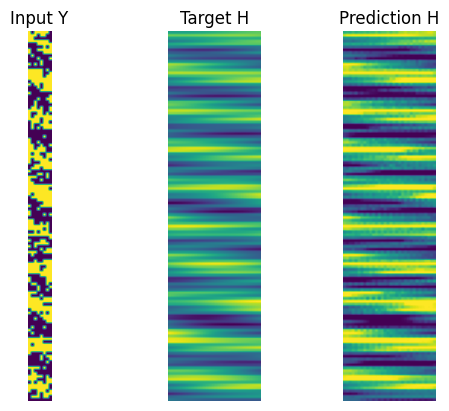

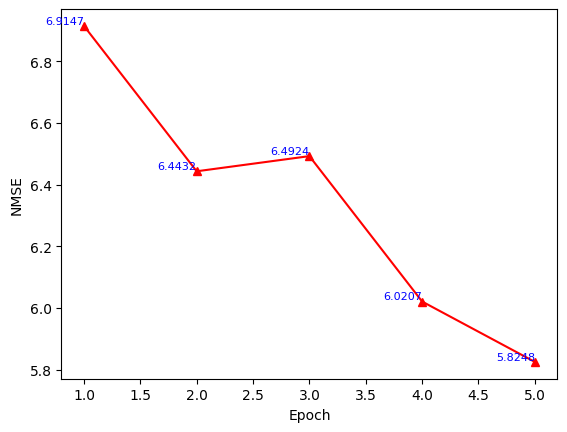

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 15.078137 , Discriminator loss: 0.074749775 , time: 0:18:21.327427
B/E: 103 / 5 , Generator loss: 15.565939 , Discriminator loss: 0.07872249 , time: 0:18:35.715747
B/E: 206 / 5 , Generator loss: 17.173113 , Discriminator loss: 0.05568207 , time: 0:18:49.959389
B/E: 309 / 5 , Generator loss: 16.423088 , Discriminator loss: 0.09128462 , time: 0:19:04.433812
B/E: 412 / 5 , Generator loss: 14.828844 , Discriminator loss: 0.04355287 , time: 0:19:18.800636
B/E: 515 / 5 , Generator loss: 15.251125 , Discriminator loss: 0.0262786 , time: 0:19:33.018922
B/E: 618 / 5 , Generator loss: 15.773109 , Discriminator loss: 0.086240724 , time: 0:19:47.299469
B/E: 721 / 5 , Generator loss: 18.471172 , Discriminator loss: 0.053766664 , time: 0:20:01.551942
B/E: 824 / 5 , Generator loss: 12.341846 , Discriminator loss: 0.25824884 , time: 0:20:15.880867
B/E: 927 / 5 , Generator loss: 12.189004 , Discriminator loss: 7.104637 , time: 0:20:29.979620
B/E: 1030 / 5 , G

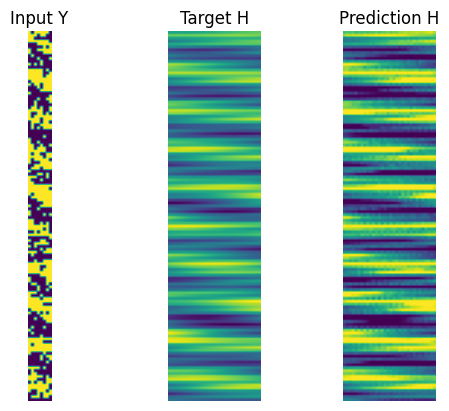

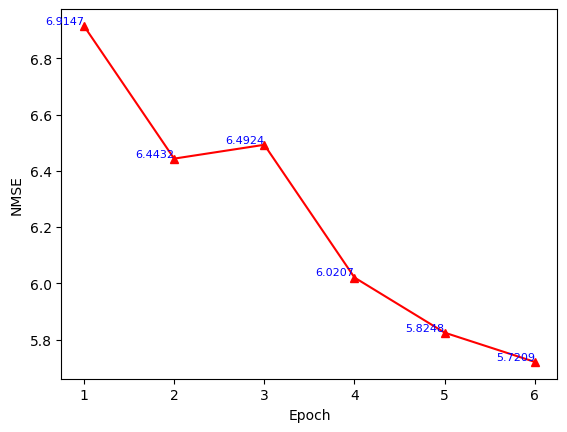

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 17.213682 , Discriminator loss: 0.04623678 , time: 0:22:00.233932
B/E: 103 / 6 , Generator loss: 15.48519 , Discriminator loss: 0.06182401 , time: 0:22:14.763485
B/E: 206 / 6 , Generator loss: 13.765926 , Discriminator loss: 0.11472717 , time: 0:22:28.818077
B/E: 309 / 6 , Generator loss: 16.185877 , Discriminator loss: 0.006265851 , time: 0:22:43.276114
B/E: 412 / 6 , Generator loss: 14.437507 , Discriminator loss: 0.07906036 , time: 0:22:57.524885
B/E: 515 / 6 , Generator loss: 15.494026 , Discriminator loss: 0.048648834 , time: 0:23:11.845623
B/E: 618 / 6 , Generator loss: 13.766617 , Discriminator loss: 0.18278565 , time: 0:23:26.098819
B/E: 721 / 6 , Generator loss: 13.926359 , Discriminator loss: 0.14095876 , time: 0:23:40.395890
B/E: 824 / 6 , Generator loss: 12.983425 , Discriminator loss: 0.119888104 , time: 0:23:54.622127
B/E: 927 / 6 , Generator loss: 17.349453 , Discriminator loss: 0.048185192 , time: 0:24:09.088663
B/E: 1030 / 6 

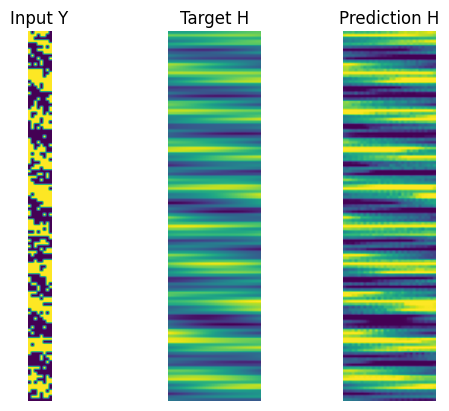

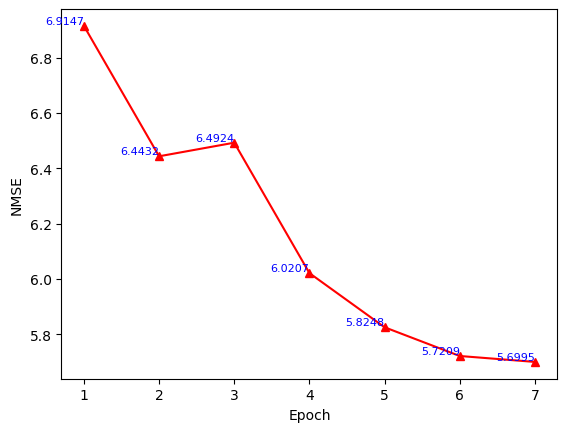

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 18.311958 , Discriminator loss: 0.019199058 , time: 0:00:04.594490
B/E: 103 / 0 , Generator loss: 16.43001 , Discriminator loss: 0.060381416 , time: 0:00:18.919772
B/E: 206 / 0 , Generator loss: 18.880878 , Discriminator loss: 0.04050153 , time: 0:00:33.176467
B/E: 309 / 0 , Generator loss: 17.751656 , Discriminator loss: 0.035592914 , time: 0:00:47.405361
B/E: 412 / 0 , Generator loss: 17.522367 , Discriminator loss: 0.014264548 , time: 0:01:01.847337
B/E: 515 / 0 , Generator loss: 17.751272 , Discriminator loss: 0.00762492 , time: 0:01:16.181043
B/E: 618 / 0 , Generator loss: 17.229538 , Discriminator loss: 0.01978611 , time: 0:01:30.520672
B/E: 721 / 0 , Generator loss: 16.321194 , Discriminator loss: 0.13682956 , time: 0:01:44.763183
B/E: 824 / 0 , Generator loss: 22.455536 , Discriminator loss: 0.05457838 , time: 0:01:59.023528
B/E: 927 / 0 , Generator loss: 17.85167 , Discriminator loss: 0.09182887 , time: 0:02:13.452334
B/E: 1030 / 0 ,

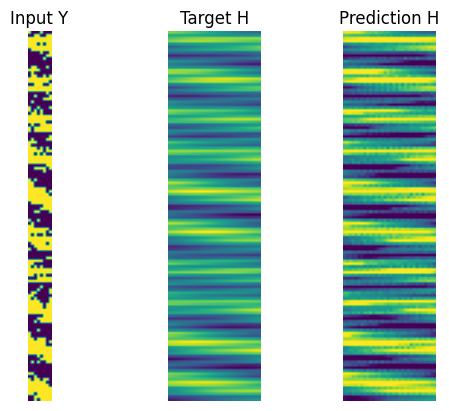

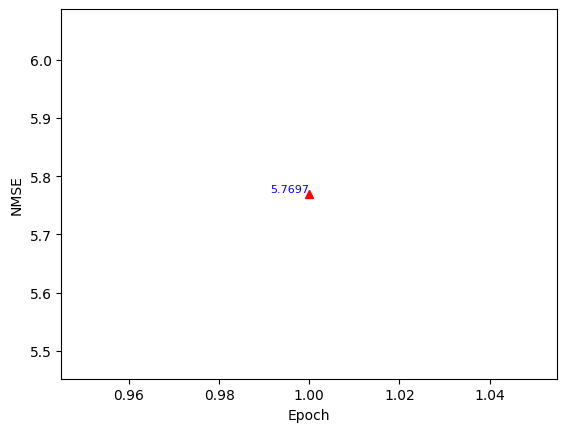

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 16.995867 , Discriminator loss: 0.19121662 , time: 0:03:46.111600
B/E: 103 / 1 , Generator loss: 19.304752 , Discriminator loss: 0.010019375 , time: 0:04:00.515948
B/E: 206 / 1 , Generator loss: 15.018841 , Discriminator loss: 0.49265626 , time: 0:04:14.781142
B/E: 309 / 1 , Generator loss: 17.034946 , Discriminator loss: 0.0057287933 , time: 0:04:29.140788
B/E: 412 / 1 , Generator loss: 14.441245 , Discriminator loss: 0.16170716 , time: 0:04:43.427640
B/E: 515 / 1 , Generator loss: 18.17082 , Discriminator loss: 0.013959579 , time: 0:04:57.782022
B/E: 618 / 1 , Generator loss: 15.406915 , Discriminator loss: 0.18424782 , time: 0:05:12.001826
B/E: 721 / 1 , Generator loss: 16.118652 , Discriminator loss: 0.024468584 , time: 0:05:26.334429
B/E: 824 / 1 , Generator loss: 20.836113 , Discriminator loss: 0.07633835 , time: 0:05:40.556140
B/E: 927 / 1 , Generator loss: 17.980846 , Discriminator loss: 0.00972286 , time: 0:05:54.758215
B/E: 1030 / 1

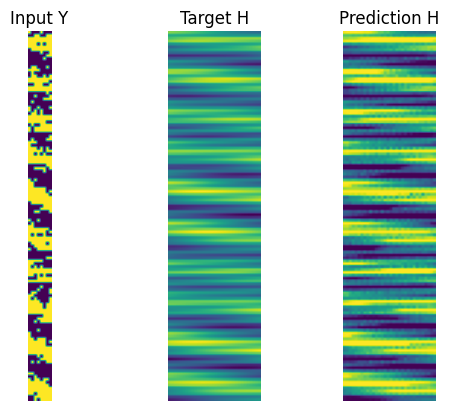

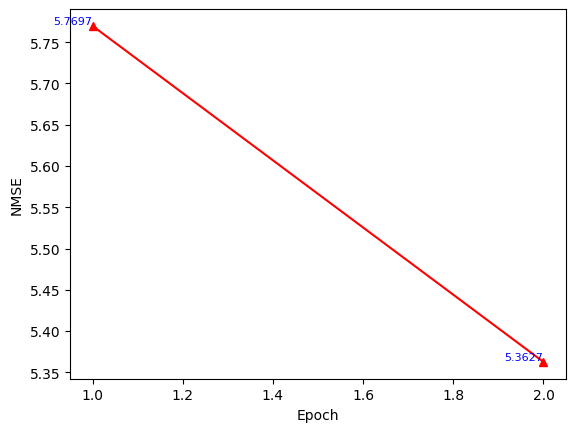

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 17.106909 , Discriminator loss: 0.009472739 , time: 0:07:27.533163
B/E: 103 / 2 , Generator loss: 14.630038 , Discriminator loss: 0.036386088 , time: 0:07:42.140125
B/E: 206 / 2 , Generator loss: 15.726501 , Discriminator loss: 0.019986391 , time: 0:07:56.666765
B/E: 309 / 2 , Generator loss: 16.954407 , Discriminator loss: 0.017877068 , time: 0:08:10.947552
B/E: 412 / 2 , Generator loss: 12.5201435 , Discriminator loss: 1.2629293 , time: 0:08:25.276609
B/E: 515 / 2 , Generator loss: 21.105198 , Discriminator loss: 0.03644782 , time: 0:08:39.558502
B/E: 618 / 2 , Generator loss: 18.576073 , Discriminator loss: 0.0055062505 , time: 0:08:53.875654
B/E: 721 / 2 , Generator loss: 20.0998 , Discriminator loss: 0.12506483 , time: 0:09:08.129667
B/E: 824 / 2 , Generator loss: 17.82517 , Discriminator loss: 0.03273284 , time: 0:09:22.431045
B/E: 927 / 2 , Generator loss: 11.931488 , Discriminator loss: 1.5225482 , time: 0:09:36.687583
B/E: 1030 / 2 ,

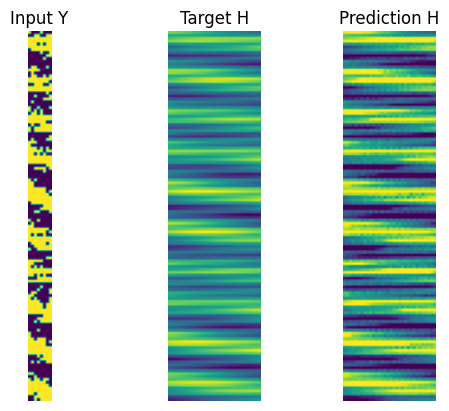

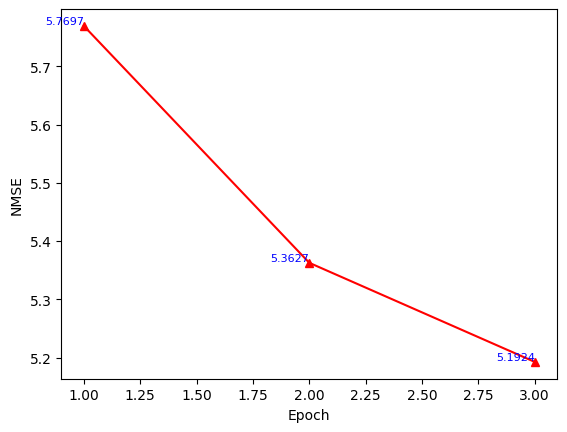

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 19.1706 , Discriminator loss: 1.3660592 , time: 0:11:07.965832
B/E: 103 / 3 , Generator loss: 21.808727 , Discriminator loss: 0.28547236 , time: 0:11:22.398966
B/E: 206 / 3 , Generator loss: 16.522762 , Discriminator loss: 1.8196082 , time: 0:11:36.802271
B/E: 309 / 3 , Generator loss: 12.129257 , Discriminator loss: 0.61629134 , time: 0:11:51.140824
B/E: 412 / 3 , Generator loss: 16.14315 , Discriminator loss: 0.009331459 , time: 0:12:05.417078
B/E: 515 / 3 , Generator loss: 16.526192 , Discriminator loss: 0.0037846772 , time: 0:12:19.628987
B/E: 618 / 3 , Generator loss: 15.039383 , Discriminator loss: 0.4038938 , time: 0:12:33.992708
B/E: 721 / 3 , Generator loss: 17.480251 , Discriminator loss: 0.004399877 , time: 0:12:48.312461
B/E: 824 / 3 , Generator loss: 17.057102 , Discriminator loss: 0.009716747 , time: 0:13:02.715133
B/E: 927 / 3 , Generator loss: 13.019684 , Discriminator loss: 0.07957892 , time: 0:13:17.233307
B/E: 1030 / 3 , Ge

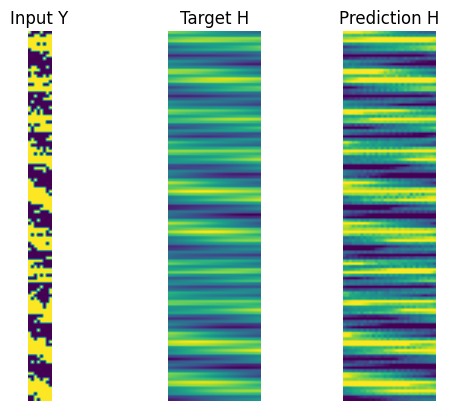

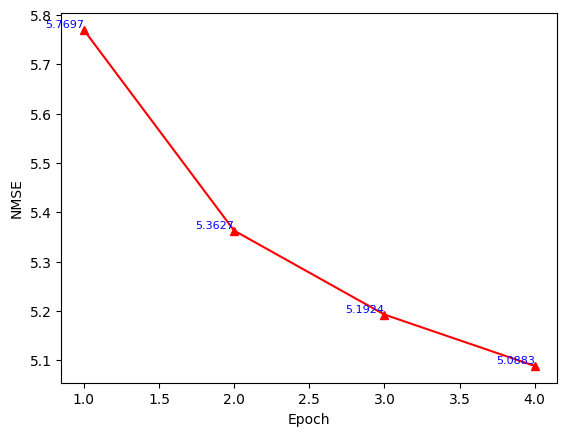

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 17.840988 , Discriminator loss: 0.002554565 , time: 0:14:50.504511
B/E: 103 / 4 , Generator loss: 15.959534 , Discriminator loss: 0.012091937 , time: 0:15:05.148306
B/E: 206 / 4 , Generator loss: 12.808357 , Discriminator loss: 0.16384062 , time: 0:15:19.663231
B/E: 309 / 4 , Generator loss: 17.10625 , Discriminator loss: 0.030313246 , time: 0:15:34.236028
B/E: 412 / 4 , Generator loss: 25.115574 , Discriminator loss: 1.8719074 , time: 0:15:48.728145
B/E: 515 / 4 , Generator loss: 18.199549 , Discriminator loss: 0.011963099 , time: 0:16:03.060000
B/E: 618 / 4 , Generator loss: 13.689781 , Discriminator loss: 0.116060115 , time: 0:16:17.534658
B/E: 721 / 4 , Generator loss: 16.262157 , Discriminator loss: 0.012070012 , time: 0:16:32.013502
B/E: 824 / 4 , Generator loss: 15.447609 , Discriminator loss: 0.10808517 , time: 0:16:46.376729
B/E: 927 / 4 , Generator loss: 16.229763 , Discriminator loss: 0.014496876 , time: 0:17:00.841280
B/E: 1030 / 

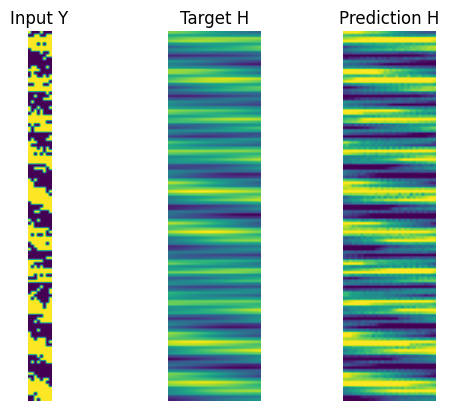

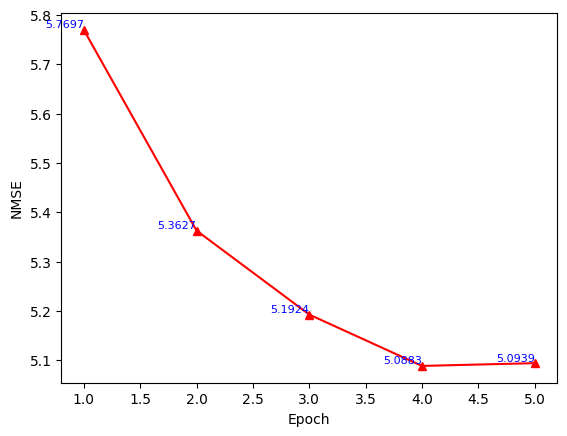

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 13.832481 , Discriminator loss: 0.3349176 , time: 0:18:34.153373
B/E: 103 / 5 , Generator loss: 15.754385 , Discriminator loss: 0.015998948 , time: 0:18:48.651013
B/E: 206 / 5 , Generator loss: 15.511087 , Discriminator loss: 0.055865917 , time: 0:19:03.011614
B/E: 309 / 5 , Generator loss: 11.028456 , Discriminator loss: 6.0895815 , time: 0:19:17.448420
B/E: 412 / 5 , Generator loss: 16.774971 , Discriminator loss: 0.008263385 , time: 0:19:31.889018
B/E: 515 / 5 , Generator loss: 14.60165 , Discriminator loss: 0.2825081 , time: 0:19:46.179248
B/E: 618 / 5 , Generator loss: 16.867369 , Discriminator loss: 0.04557636 , time: 0:20:00.664636
B/E: 721 / 5 , Generator loss: 18.85563 , Discriminator loss: 0.010934733 , time: 0:20:15.119930
B/E: 824 / 5 , Generator loss: 21.66269 , Discriminator loss: 1.1947163 , time: 0:20:29.451490
B/E: 927 / 5 , Generator loss: 18.519203 , Discriminator loss: 0.24080664 , time: 0:20:43.764088
B/E: 1030 / 5 , Gene

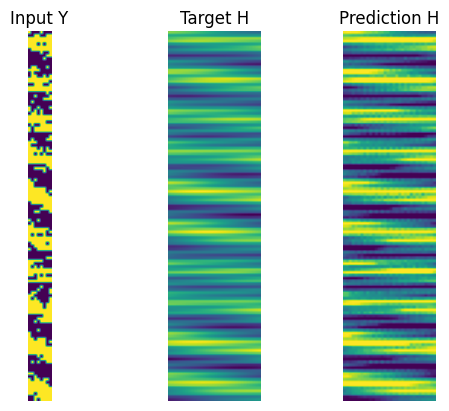

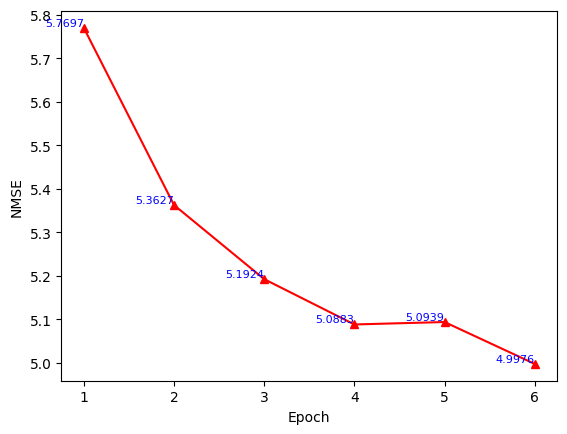

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 21.194977 , Discriminator loss: 0.10776902 , time: 0:22:15.393462
B/E: 103 / 6 , Generator loss: 14.746206 , Discriminator loss: 0.10875052 , time: 0:22:30.120045
B/E: 206 / 6 , Generator loss: 17.525396 , Discriminator loss: 0.056042038 , time: 0:22:44.573905
B/E: 309 / 6 , Generator loss: 15.602093 , Discriminator loss: 0.08294217 , time: 0:22:59.325680
B/E: 412 / 6 , Generator loss: 19.870003 , Discriminator loss: 0.055118155 , time: 0:23:13.856940
B/E: 515 / 6 , Generator loss: 19.791023 , Discriminator loss: 0.17440818 , time: 0:23:28.565180
B/E: 618 / 6 , Generator loss: 15.299802 , Discriminator loss: 0.01088616 , time: 0:23:43.010034
B/E: 721 / 6 , Generator loss: 15.728185 , Discriminator loss: 0.031117316 , time: 0:23:57.407733
B/E: 824 / 6 , Generator loss: 17.656443 , Discriminator loss: 0.0016767734 , time: 0:24:11.929965
B/E: 927 / 6 , Generator loss: 15.640892 , Discriminator loss: 0.026729587 , time: 0:24:26.395299
B/E: 1030 /

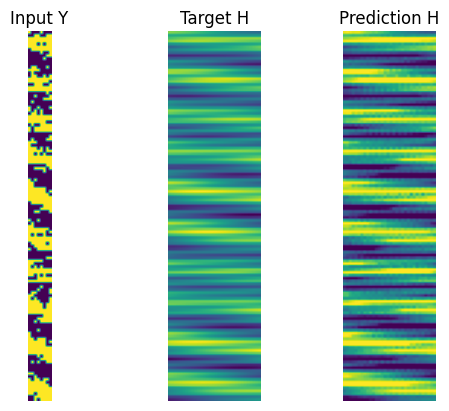

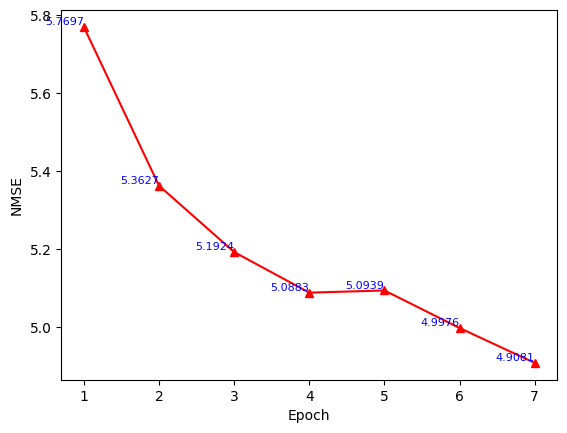

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 19.471275 , Discriminator loss: 0.0053216633 , time: 0:00:05.390832
B/E: 103 / 0 , Generator loss: 17.500427 , Discriminator loss: 0.04590072 , time: 0:00:20.115519
B/E: 206 / 0 , Generator loss: 17.268906 , Discriminator loss: 0.26041478 , time: 0:00:34.708327
B/E: 309 / 0 , Generator loss: 17.057896 , Discriminator loss: 0.01796756 , time: 0:00:49.073495
B/E: 412 / 0 , Generator loss: 18.632412 , Discriminator loss: 0.0027831753 , time: 0:01:03.552521
B/E: 515 / 0 , Generator loss: 17.038528 , Discriminator loss: 0.29721797 , time: 0:01:17.911520
B/E: 618 / 0 , Generator loss: 11.880082 , Discriminator loss: 2.8591783 , time: 0:01:32.294994
B/E: 721 / 0 , Generator loss: 20.765759 , Discriminator loss: 0.034118406 , time: 0:01:46.675970
B/E: 824 / 0 , Generator loss: 17.886097 , Discriminator loss: 0.003163782 , time: 0:02:00.913809
B/E: 927 / 0 , Generator loss: 16.638084 , Discriminator loss: 0.0034212722 , time: 0:02:15.332563
B/E: 1030 

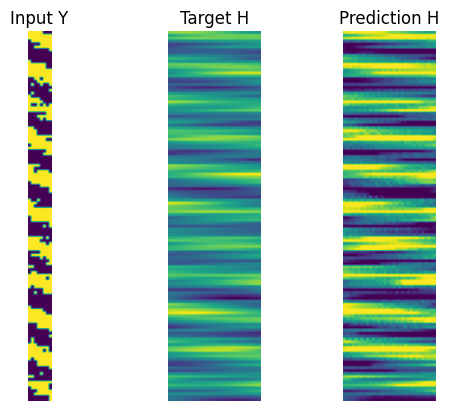

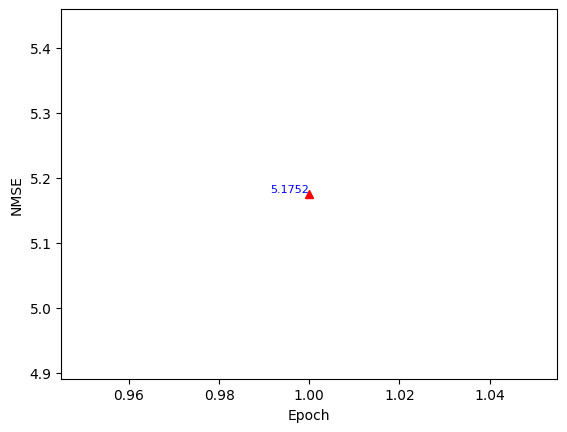

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 18.878939 , Discriminator loss: 0.0011933446 , time: 0:03:49.082058
B/E: 103 / 1 , Generator loss: 12.2444725 , Discriminator loss: 0.7569897 , time: 0:04:03.516692
B/E: 206 / 1 , Generator loss: 20.170864 , Discriminator loss: 0.004575697 , time: 0:04:17.747208
B/E: 309 / 1 , Generator loss: 16.819057 , Discriminator loss: 0.120298274 , time: 0:04:32.178177
B/E: 412 / 1 , Generator loss: 16.354279 , Discriminator loss: 0.01803737 , time: 0:04:46.654664
B/E: 515 / 1 , Generator loss: 20.530926 , Discriminator loss: 0.45499238 , time: 0:05:00.960207
B/E: 618 / 1 , Generator loss: 16.269798 , Discriminator loss: 0.4160838 , time: 0:05:15.484900
B/E: 721 / 1 , Generator loss: 17.229446 , Discriminator loss: 0.004702308 , time: 0:05:29.833266
B/E: 824 / 1 , Generator loss: 18.027966 , Discriminator loss: 0.061351042 , time: 0:05:44.110602
B/E: 927 / 1 , Generator loss: 13.622811 , Discriminator loss: 0.16551515 , time: 0:05:58.347108
B/E: 1030 / 

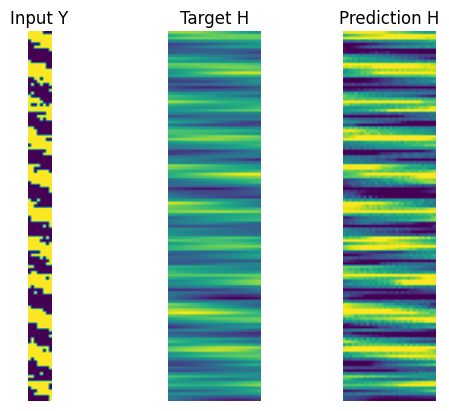

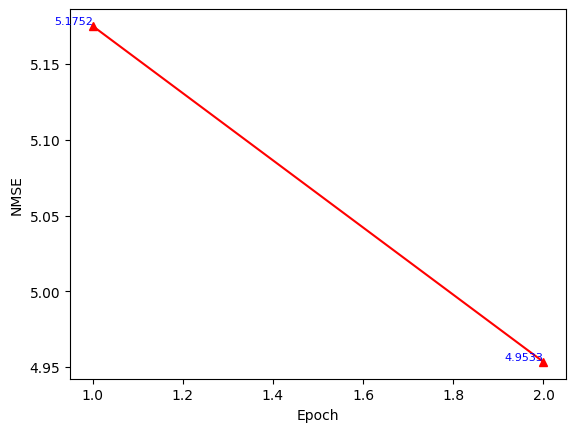

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 14.159385 , Discriminator loss: 0.053149723 , time: 0:07:30.672627
B/E: 103 / 2 , Generator loss: 18.308573 , Discriminator loss: 0.0013998841 , time: 0:07:45.192291
B/E: 206 / 2 , Generator loss: 16.64473 , Discriminator loss: 0.011373455 , time: 0:07:59.717682
B/E: 309 / 2 , Generator loss: 19.320087 , Discriminator loss: 0.08411543 , time: 0:08:14.258544
B/E: 412 / 2 , Generator loss: 18.251947 , Discriminator loss: 0.028259898 , time: 0:08:28.681602
B/E: 515 / 2 , Generator loss: 16.342016 , Discriminator loss: 0.004808837 , time: 0:08:43.282187
B/E: 618 / 2 , Generator loss: 16.680344 , Discriminator loss: 0.0038433522 , time: 0:08:57.866492
B/E: 721 / 2 , Generator loss: 16.926949 , Discriminator loss: 0.62247616 , time: 0:09:12.403626
B/E: 824 / 2 , Generator loss: 14.112721 , Discriminator loss: 0.04994811 , time: 0:09:26.861432
B/E: 927 / 2 , Generator loss: 13.989525 , Discriminator loss: 0.040257204 , time: 0:09:41.302171
B/E: 1030

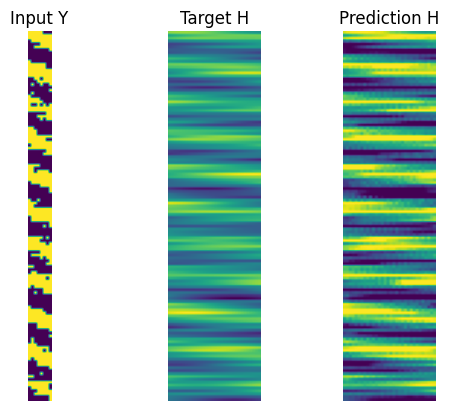

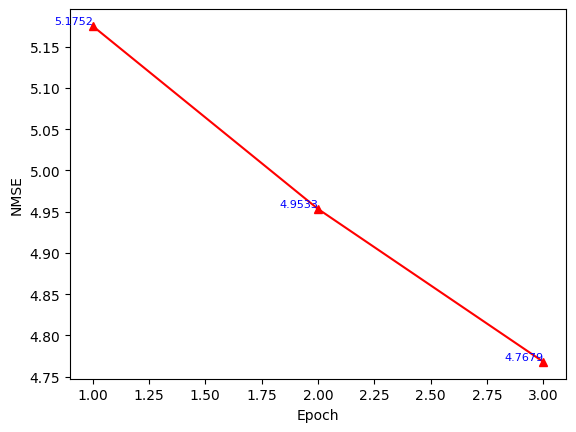

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 19.18613 , Discriminator loss: 0.0054252204 , time: 0:11:14.408818
B/E: 103 / 3 , Generator loss: 17.946995 , Discriminator loss: 0.0024772175 , time: 0:11:28.882479
B/E: 206 / 3 , Generator loss: 17.393688 , Discriminator loss: 0.0020037408 , time: 0:11:43.234863
B/E: 309 / 3 , Generator loss: 14.835058 , Discriminator loss: 0.044227164 , time: 0:11:57.667423
B/E: 412 / 3 , Generator loss: 17.163515 , Discriminator loss: 0.004138961 , time: 0:12:12.070662
B/E: 515 / 3 , Generator loss: 15.845253 , Discriminator loss: 0.026015408 , time: 0:12:26.490481
B/E: 618 / 3 , Generator loss: 15.471042 , Discriminator loss: 0.055443764 , time: 0:12:40.929636
B/E: 721 / 3 , Generator loss: 15.45011 , Discriminator loss: 0.009503845 , time: 0:12:55.310776
B/E: 824 / 3 , Generator loss: 15.0412655 , Discriminator loss: 0.08797957 , time: 0:13:09.551018
B/E: 927 / 3 , Generator loss: 17.913654 , Discriminator loss: 0.0023917742 , time: 0:13:24.005651
B/E: 

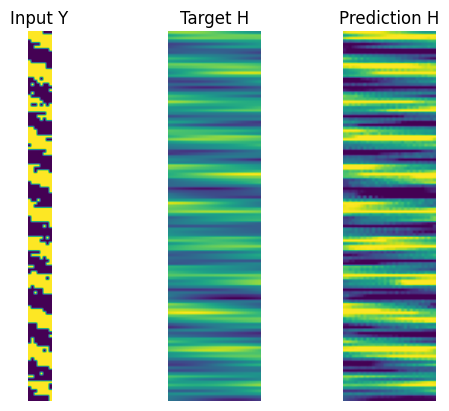

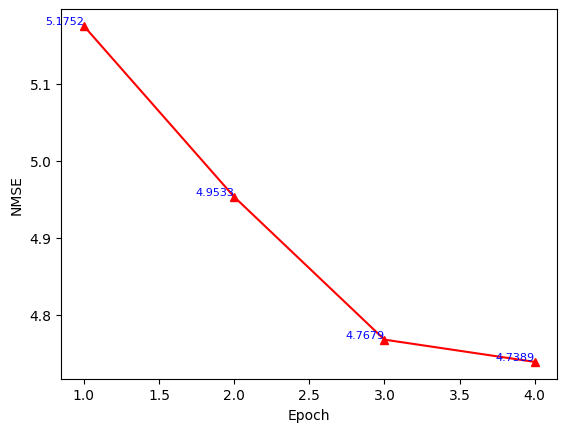

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 15.871435 , Discriminator loss: 0.00838503 , time: 0:14:56.281152
B/E: 103 / 4 , Generator loss: 14.37696 , Discriminator loss: 0.022569137 , time: 0:15:11.041049
B/E: 206 / 4 , Generator loss: 16.64178 , Discriminator loss: 0.019567734 , time: 0:15:25.576829
B/E: 309 / 4 , Generator loss: 19.119923 , Discriminator loss: 0.002184308 , time: 0:15:40.006061
B/E: 412 / 4 , Generator loss: 17.65578 , Discriminator loss: 0.0046241395 , time: 0:15:54.571626
B/E: 515 / 4 , Generator loss: 11.541917 , Discriminator loss: 0.3252834 , time: 0:16:09.094043
B/E: 618 / 4 , Generator loss: 15.654195 , Discriminator loss: 0.01848657 , time: 0:16:23.504001
B/E: 721 / 4 , Generator loss: 15.355886 , Discriminator loss: 0.05894505 , time: 0:16:37.936946
B/E: 824 / 4 , Generator loss: 12.0808935 , Discriminator loss: 0.25909805 , time: 0:16:52.346410
B/E: 927 / 4 , Generator loss: 17.887451 , Discriminator loss: 0.0031280522 , time: 0:17:06.613252
B/E: 1030 / 4

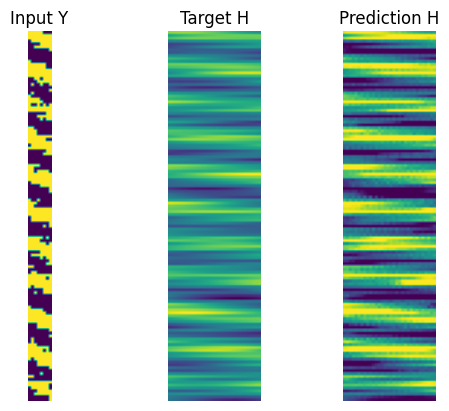

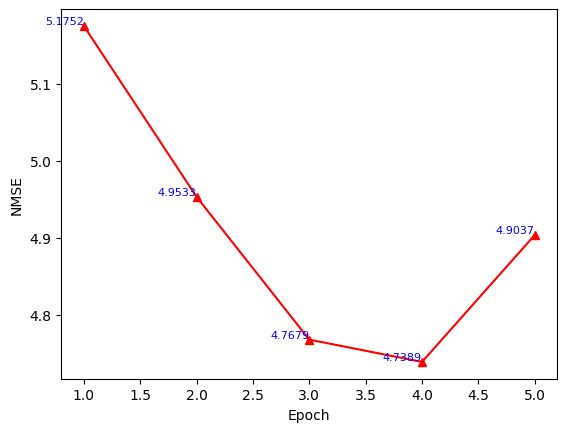

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 19.916927 , Discriminator loss: 0.0050362344 , time: 0:18:37.040077
B/E: 103 / 5 , Generator loss: 16.350885 , Discriminator loss: 0.0054263445 , time: 0:18:51.113213
B/E: 206 / 5 , Generator loss: 15.03862 , Discriminator loss: 0.07386029 , time: 0:19:05.224354
B/E: 309 / 5 , Generator loss: 14.844233 , Discriminator loss: 0.014178151 , time: 0:19:19.011160
B/E: 412 / 5 , Generator loss: 19.553843 , Discriminator loss: 0.03042806 , time: 0:19:32.996695
B/E: 515 / 5 , Generator loss: 19.399807 , Discriminator loss: 0.0018749882 , time: 0:19:47.056338
B/E: 618 / 5 , Generator loss: 19.33702 , Discriminator loss: 0.0037782425 , time: 0:20:01.075345
B/E: 721 / 5 , Generator loss: 23.706669 , Discriminator loss: 5.4082303 , time: 0:20:15.150946
B/E: 824 / 5 , Generator loss: 14.969742 , Discriminator loss: 0.0654876 , time: 0:20:29.234771
B/E: 927 / 5 , Generator loss: 19.33926 , Discriminator loss: 0.0035493826 , time: 0:20:43.081703
B/E: 1030 /

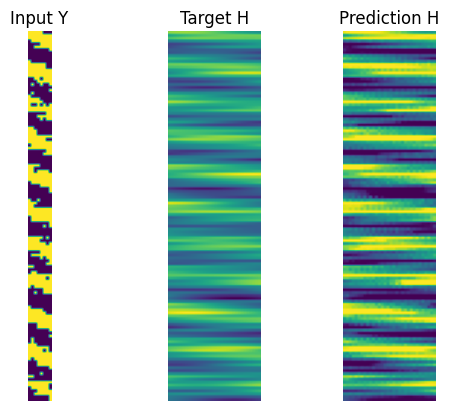

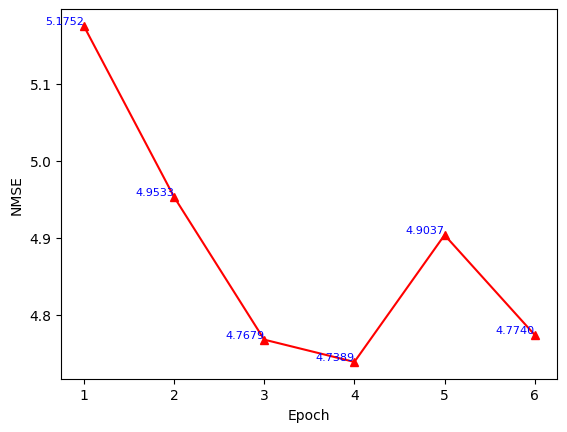

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 13.839667 , Discriminator loss: 0.062361125 , time: 0:22:13.471209
B/E: 103 / 6 , Generator loss: 17.42532 , Discriminator loss: 0.0026291774 , time: 0:22:27.763299
B/E: 206 / 6 , Generator loss: 20.30142 , Discriminator loss: 0.09100156 , time: 0:22:41.925682
B/E: 309 / 6 , Generator loss: 18.88254 , Discriminator loss: 0.0018132565 , time: 0:22:56.222542
B/E: 412 / 6 , Generator loss: 18.614582 , Discriminator loss: 0.0069223032 , time: 0:23:10.304012
B/E: 515 / 6 , Generator loss: 15.570648 , Discriminator loss: 0.028431736 , time: 0:23:24.384815
B/E: 618 / 6 , Generator loss: 20.30643 , Discriminator loss: 0.039800532 , time: 0:23:38.472845
B/E: 721 / 6 , Generator loss: 22.810276 , Discriminator loss: 0.5059075 , time: 0:23:52.363678
B/E: 824 / 6 , Generator loss: 18.092102 , Discriminator loss: 0.0068894657 , time: 0:24:06.311423
B/E: 927 / 6 , Generator loss: 17.447884 , Discriminator loss: 0.017424453 , time: 0:24:20.298454
B/E: 1030 

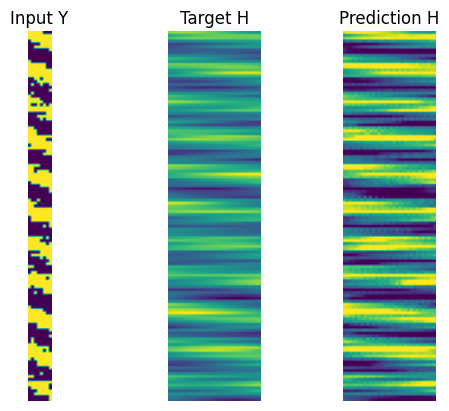

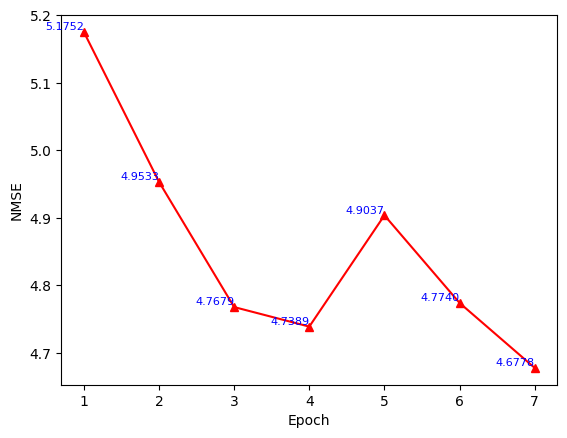

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 18.217655 , Discriminator loss: 0.0069682207 , time: 0:00:05.438651
B/E: 103 / 0 , Generator loss: 19.903835 , Discriminator loss: 0.0058920514 , time: 0:00:19.351443
B/E: 206 / 0 , Generator loss: 17.434381 , Discriminator loss: 0.0036253312 , time: 0:00:33.248917
B/E: 309 / 0 , Generator loss: 19.43863 , Discriminator loss: 0.0006696695 , time: 0:00:47.113444
B/E: 412 / 0 , Generator loss: 18.974512 , Discriminator loss: 0.0034595304 , time: 0:01:01.013768
B/E: 515 / 0 , Generator loss: 19.02914 , Discriminator loss: 0.0018149926 , time: 0:01:14.857759
B/E: 618 / 0 , Generator loss: 20.11308 , Discriminator loss: 0.009898111 , time: 0:01:28.705475
B/E: 721 / 0 , Generator loss: 21.742496 , Discriminator loss: 0.016381599 , time: 0:01:42.491521
B/E: 824 / 0 , Generator loss: 20.121067 , Discriminator loss: 0.00064197514 , time: 0:01:56.410705
B/E: 927 / 0 , Generator loss: 21.905933 , Discriminator loss: 0.013589071 , time: 0:02:10.190755
B/

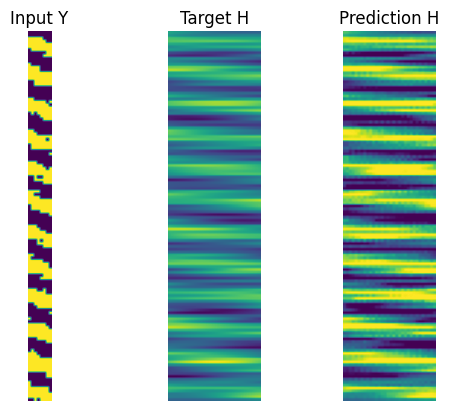

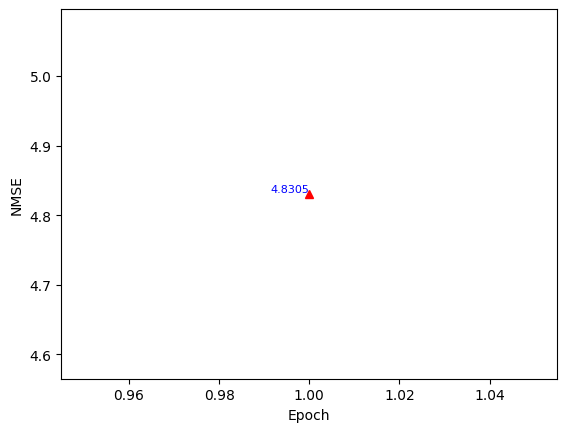

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 17.60222 , Discriminator loss: 0.0015923067 , time: 0:03:39.159053
B/E: 103 / 1 , Generator loss: 16.780327 , Discriminator loss: 0.013086274 , time: 0:03:53.260801
B/E: 206 / 1 , Generator loss: 16.46456 , Discriminator loss: 0.25010285 , time: 0:04:07.211317
B/E: 309 / 1 , Generator loss: 15.693112 , Discriminator loss: 0.01089697 , time: 0:04:21.191970
B/E: 412 / 1 , Generator loss: 15.7224655 , Discriminator loss: 0.017980428 , time: 0:04:35.103643
B/E: 515 / 1 , Generator loss: 18.751759 , Discriminator loss: 0.22669993 , time: 0:04:49.055498
B/E: 618 / 1 , Generator loss: 20.486704 , Discriminator loss: 0.0008680946 , time: 0:05:02.927156
B/E: 721 / 1 , Generator loss: 11.943005 , Discriminator loss: 0.6472235 , time: 0:05:16.844614
B/E: 824 / 1 , Generator loss: 18.473831 , Discriminator loss: 0.00075110217 , time: 0:05:30.746156
B/E: 927 / 1 , Generator loss: 17.524958 , Discriminator loss: 0.0032165407 , time: 0:05:44.611280
B/E: 103

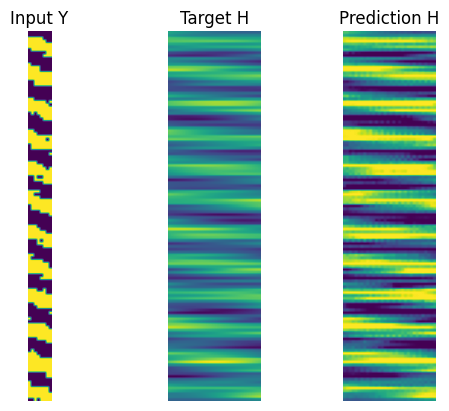

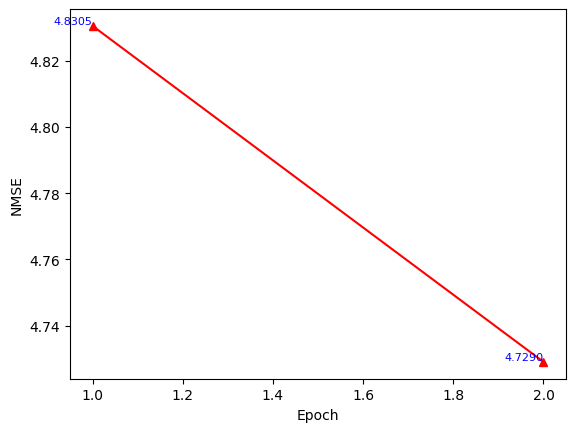

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 20.127184 , Discriminator loss: 0.0010596664 , time: 0:07:14.378935
B/E: 103 / 2 , Generator loss: 18.177212 , Discriminator loss: 0.0018777804 , time: 0:07:28.609511
B/E: 206 / 2 , Generator loss: 19.317726 , Discriminator loss: 0.0016014961 , time: 0:07:42.554281
B/E: 309 / 2 , Generator loss: 21.524878 , Discriminator loss: 0.0011756001 , time: 0:07:56.542686
B/E: 412 / 2 , Generator loss: 17.284487 , Discriminator loss: 0.0012383312 , time: 0:08:10.552388
B/E: 515 / 2 , Generator loss: 18.859337 , Discriminator loss: 0.00047232799 , time: 0:08:24.477404
B/E: 618 / 2 , Generator loss: 15.62759 , Discriminator loss: 0.043899287 , time: 0:08:38.465077
B/E: 721 / 2 , Generator loss: 21.000896 , Discriminator loss: 0.0019325189 , time: 0:08:52.399986
B/E: 824 / 2 , Generator loss: 19.148018 , Discriminator loss: 0.0019365539 , time: 0:09:06.236999
B/E: 927 / 2 , Generator loss: 18.103935 , Discriminator loss: 0.0020407643 , time: 0:09:20.28526

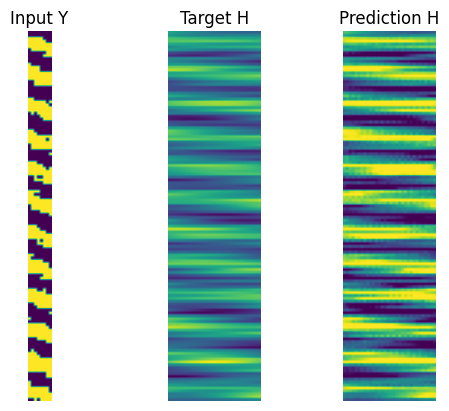

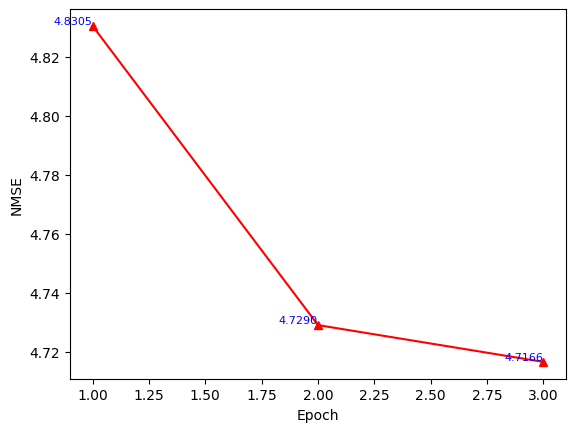

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 19.107769 , Discriminator loss: 0.00072870037 , time: 0:10:49.175554
B/E: 103 / 3 , Generator loss: 22.497828 , Discriminator loss: 0.008518975 , time: 0:11:03.202236
B/E: 206 / 3 , Generator loss: 16.824955 , Discriminator loss: 0.020566164 , time: 0:11:17.122038
B/E: 309 / 3 , Generator loss: 11.566554 , Discriminator loss: 0.63946146 , time: 0:11:31.010852
B/E: 412 / 3 , Generator loss: 19.341352 , Discriminator loss: 0.30509427 , time: 0:11:45.045555
B/E: 515 / 3 , Generator loss: 19.506832 , Discriminator loss: 0.0013261738 , time: 0:11:59.045294
B/E: 618 / 3 , Generator loss: 21.642618 , Discriminator loss: 0.45543316 , time: 0:12:13.002918
B/E: 721 / 3 , Generator loss: 24.953703 , Discriminator loss: 0.5505477 , time: 0:12:27.126865
B/E: 824 / 3 , Generator loss: 17.75659 , Discriminator loss: 0.009160993 , time: 0:12:41.070323
B/E: 927 / 3 , Generator loss: 16.148247 , Discriminator loss: 0.13585058 , time: 0:12:55.069927
B/E: 1030 /

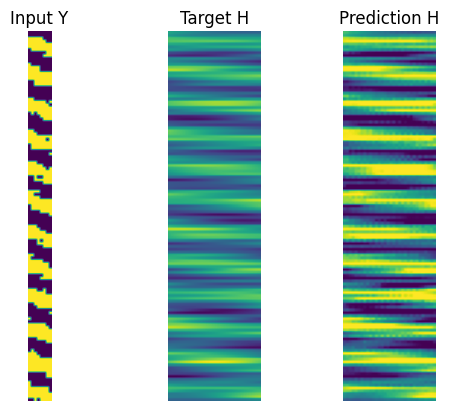

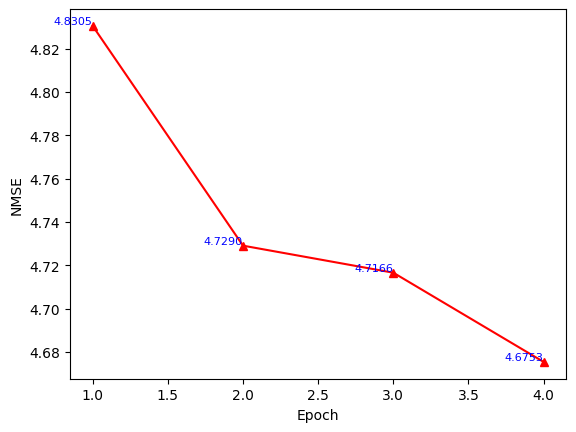

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 21.281967 , Discriminator loss: 0.013797794 , time: 0:14:24.829552
B/E: 103 / 4 , Generator loss: 16.187214 , Discriminator loss: 0.06440783 , time: 0:14:38.985473
B/E: 206 / 4 , Generator loss: 28.198362 , Discriminator loss: 5.6851077 , time: 0:14:52.867451
B/E: 309 / 4 , Generator loss: 19.286915 , Discriminator loss: 0.0053723995 , time: 0:15:06.645830
B/E: 412 / 4 , Generator loss: 21.363468 , Discriminator loss: 0.029500913 , time: 0:15:20.410548
B/E: 515 / 4 , Generator loss: 20.731691 , Discriminator loss: 0.008823103 , time: 0:15:34.416666
B/E: 618 / 4 , Generator loss: 19.75182 , Discriminator loss: 0.0014819538 , time: 0:15:48.287598
B/E: 721 / 4 , Generator loss: 20.181072 , Discriminator loss: 0.00022438828 , time: 0:16:02.135743
B/E: 824 / 4 , Generator loss: 20.298826 , Discriminator loss: 0.0378362 , time: 0:16:16.007825
B/E: 927 / 4 , Generator loss: 20.129269 , Discriminator loss: 0.0005341094 , time: 0:16:29.867942
B/E: 103

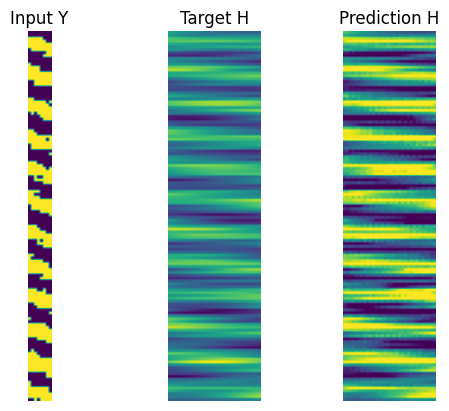

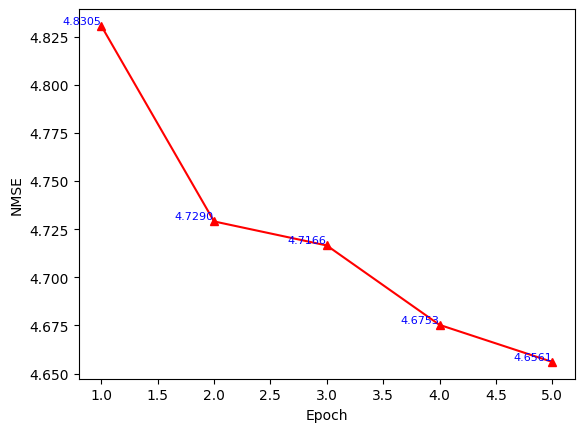

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 19.394741 , Discriminator loss: 0.02186882 , time: 0:17:58.476138
B/E: 103 / 5 , Generator loss: 19.125685 , Discriminator loss: 0.0013163299 , time: 0:18:12.489344
B/E: 206 / 5 , Generator loss: 16.311962 , Discriminator loss: 0.008582831 , time: 0:18:26.377103
B/E: 309 / 5 , Generator loss: 22.507664 , Discriminator loss: 0.0021113234 , time: 0:18:40.232322
B/E: 412 / 5 , Generator loss: 18.931131 , Discriminator loss: 0.3024004 , time: 0:18:54.005635
B/E: 515 / 5 , Generator loss: 20.417576 , Discriminator loss: 0.047781672 , time: 0:19:07.797903
B/E: 618 / 5 , Generator loss: 18.143764 , Discriminator loss: 0.004083591 , time: 0:19:21.655261
B/E: 721 / 5 , Generator loss: 13.881893 , Discriminator loss: 0.057869382 , time: 0:19:35.452946
B/E: 824 / 5 , Generator loss: 16.679306 , Discriminator loss: 0.0032002714 , time: 0:19:49.152307
B/E: 927 / 5 , Generator loss: 20.77303 , Discriminator loss: 0.00029804598 , time: 0:20:02.992168
B/E: 1

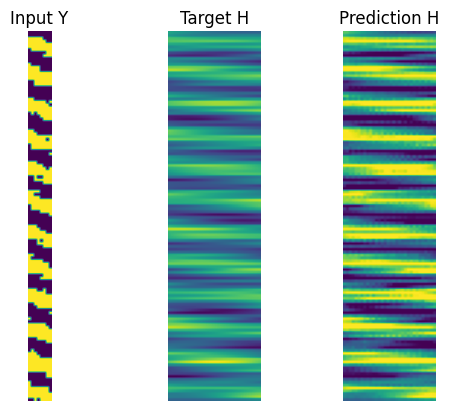

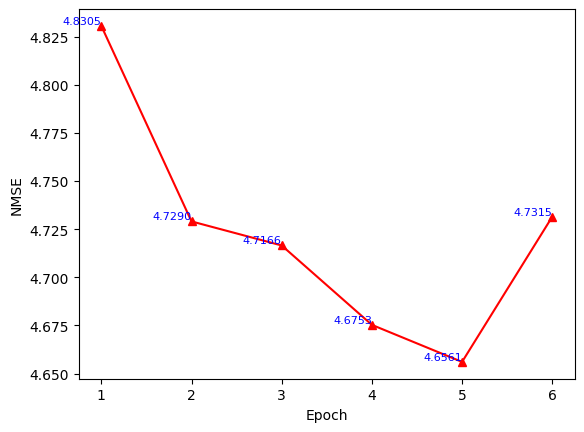

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 20.01096 , Discriminator loss: 0.00039572624 , time: 0:21:31.763946
B/E: 103 / 6 , Generator loss: 17.49476 , Discriminator loss: 0.007935652 , time: 0:21:45.681321
B/E: 206 / 6 , Generator loss: 16.935707 , Discriminator loss: 0.003195117 , time: 0:21:59.536534
B/E: 309 / 6 , Generator loss: 16.084475 , Discriminator loss: 0.0043268004 , time: 0:22:13.252692
B/E: 412 / 6 , Generator loss: 17.354038 , Discriminator loss: 0.0017524817 , time: 0:22:27.025904
B/E: 515 / 6 , Generator loss: 21.312134 , Discriminator loss: 0.0046125227 , time: 0:22:40.899586
B/E: 618 / 6 , Generator loss: 12.090844 , Discriminator loss: 0.175718 , time: 0:22:54.870925
B/E: 721 / 6 , Generator loss: 20.9622 , Discriminator loss: 0.0038045454 , time: 0:23:08.646126
B/E: 824 / 6 , Generator loss: 21.81211 , Discriminator loss: 0.0005580957 , time: 0:23:22.479857
B/E: 927 / 6 , Generator loss: 19.479431 , Discriminator loss: 0.15035401 , time: 0:23:36.282778
B/E: 1030

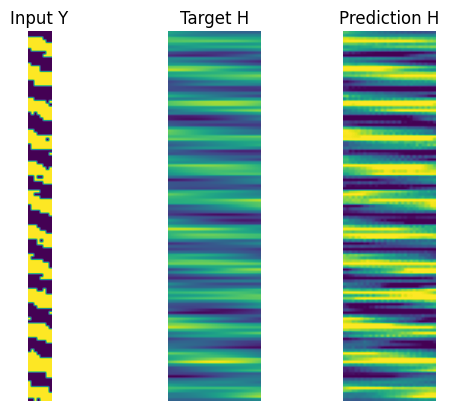

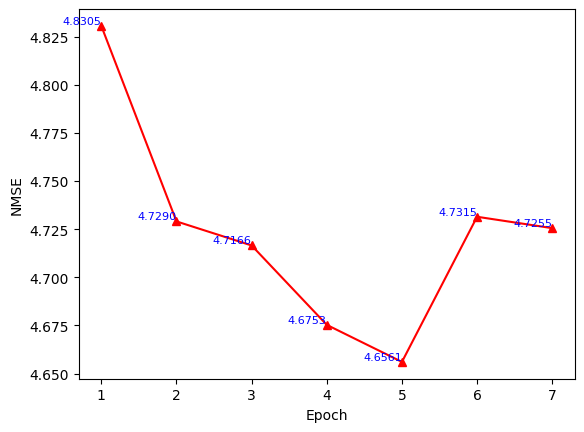

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 26.262716 , Discriminator loss: 0.0833206 , time: 0:00:04.447875
B/E: 103 / 0 , Generator loss: 22.167614 , Discriminator loss: 0.00036916483 , time: 0:00:18.452125
B/E: 206 / 0 , Generator loss: 28.08326 , Discriminator loss: 0.35526726 , time: 0:00:32.316380
B/E: 309 / 0 , Generator loss: 18.396366 , Discriminator loss: 0.0010792012 , time: 0:00:46.134997
B/E: 412 / 0 , Generator loss: 20.498604 , Discriminator loss: 0.00035523088 , time: 0:00:59.973910
B/E: 515 / 0 , Generator loss: 18.104336 , Discriminator loss: 0.007091872 , time: 0:01:13.827265
B/E: 618 / 0 , Generator loss: 20.812366 , Discriminator loss: 0.00020248635 , time: 0:01:27.782149
B/E: 721 / 0 , Generator loss: 20.318806 , Discriminator loss: 0.00036573687 , time: 0:01:41.657176
B/E: 824 / 0 , Generator loss: 22.230518 , Discriminator loss: 0.0012565269 , time: 0:01:55.592195
B/E: 927 / 0 , Generator loss: 15.216037 , Discriminator loss: 0.026567098 , time: 0:02:09.555324
B

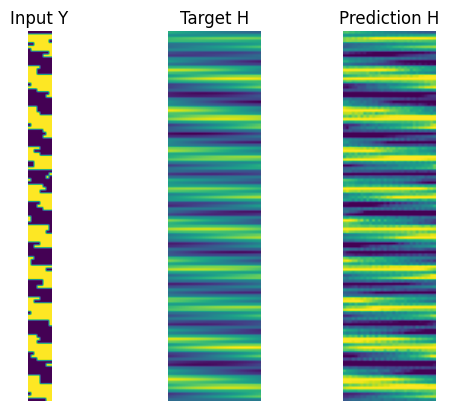

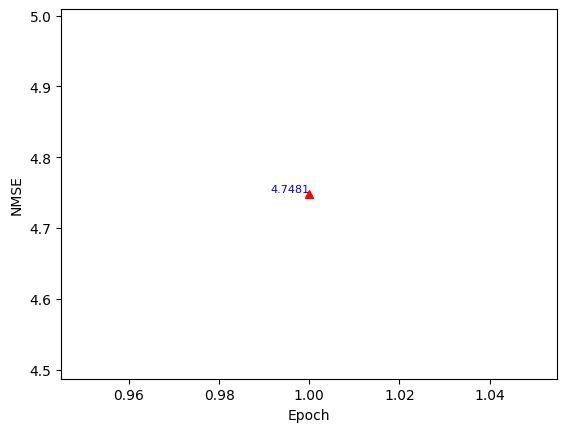

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 22.040768 , Discriminator loss: 0.0011116102 , time: 0:03:40.577517
B/E: 103 / 1 , Generator loss: 16.72303 , Discriminator loss: 0.006583691 , time: 0:03:54.865176
B/E: 206 / 1 , Generator loss: 21.013273 , Discriminator loss: 0.0012666574 , time: 0:04:08.841519
B/E: 309 / 1 , Generator loss: 17.624989 , Discriminator loss: 0.004895722 , time: 0:04:22.819492
B/E: 412 / 1 , Generator loss: 20.464884 , Discriminator loss: 0.00043973373 , time: 0:04:36.798621
B/E: 515 / 1 , Generator loss: 24.1841 , Discriminator loss: 0.053798176 , time: 0:04:50.824640
B/E: 618 / 1 , Generator loss: 23.40747 , Discriminator loss: 0.014316748 , time: 0:05:04.842379
B/E: 721 / 1 , Generator loss: 22.299015 , Discriminator loss: 0.00018262563 , time: 0:05:18.857121
B/E: 824 / 1 , Generator loss: 24.549715 , Discriminator loss: 0.28789088 , time: 0:05:33.032063
B/E: 927 / 1 , Generator loss: 19.864307 , Discriminator loss: 0.0008019678 , time: 0:05:48.093589
B/E: 

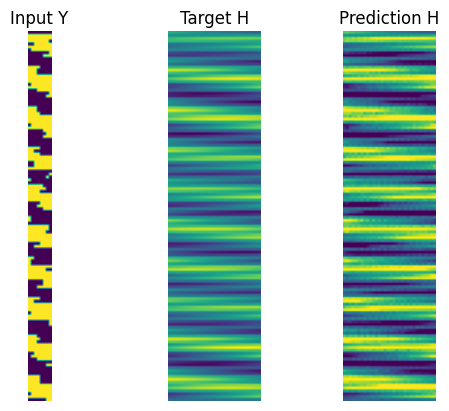

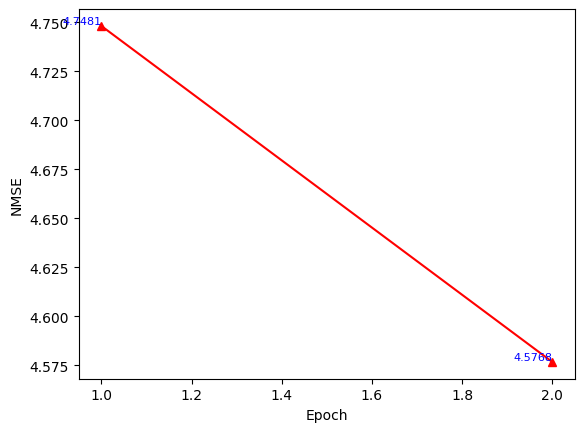

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 19.808186 , Discriminator loss: 0.00035307583 , time: 0:07:18.061745
B/E: 103 / 2 , Generator loss: 14.839822 , Discriminator loss: 0.3801549 , time: 0:07:32.123238
B/E: 206 / 2 , Generator loss: 18.70919 , Discriminator loss: 0.0008427306 , time: 0:07:46.101782
B/E: 309 / 2 , Generator loss: 19.911549 , Discriminator loss: 0.0005971281 , time: 0:08:00.119436
B/E: 412 / 2 , Generator loss: 16.037626 , Discriminator loss: 0.01254638 , time: 0:08:14.165154
B/E: 515 / 2 , Generator loss: 21.96901 , Discriminator loss: 0.015981684 , time: 0:08:28.272218
B/E: 618 / 2 , Generator loss: 14.457588 , Discriminator loss: 0.11707359 , time: 0:08:42.228903
B/E: 721 / 2 , Generator loss: 16.609728 , Discriminator loss: 0.018335842 , time: 0:08:56.195364
B/E: 824 / 2 , Generator loss: 10.932114 , Discriminator loss: 0.59401697 , time: 0:09:10.225187
B/E: 927 / 2 , Generator loss: 22.921207 , Discriminator loss: 0.0056166355 , time: 0:09:24.258488
B/E: 1030

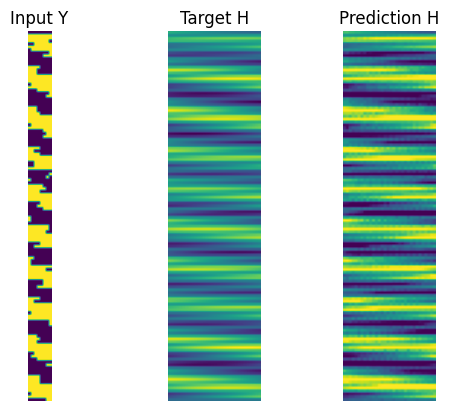

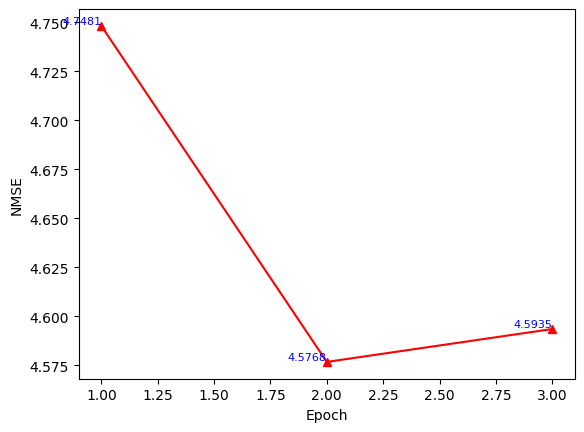

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 16.78673 , Discriminator loss: 0.0044373935 , time: 0:10:53.725191
B/E: 103 / 3 , Generator loss: 19.126844 , Discriminator loss: 0.0007950652 , time: 0:11:07.794960
B/E: 206 / 3 , Generator loss: 21.777351 , Discriminator loss: 0.00079745054 , time: 0:11:21.828141
B/E: 309 / 3 , Generator loss: 18.903309 , Discriminator loss: 0.00074336457 , time: 0:11:35.849625
B/E: 412 / 3 , Generator loss: 21.029152 , Discriminator loss: 0.0015576273 , time: 0:11:49.783658
B/E: 515 / 3 , Generator loss: 16.113585 , Discriminator loss: 0.016211512 , time: 0:12:03.688342
B/E: 618 / 3 , Generator loss: 17.203129 , Discriminator loss: 0.003951284 , time: 0:12:17.649829
B/E: 721 / 3 , Generator loss: 18.875095 , Discriminator loss: 0.0020919945 , time: 0:12:31.669515
B/E: 824 / 3 , Generator loss: 21.8031 , Discriminator loss: 0.0010866175 , time: 0:12:45.536528
B/E: 927 / 3 , Generator loss: 15.786667 , Discriminator loss: 0.007242625 , time: 0:12:59.317002
B

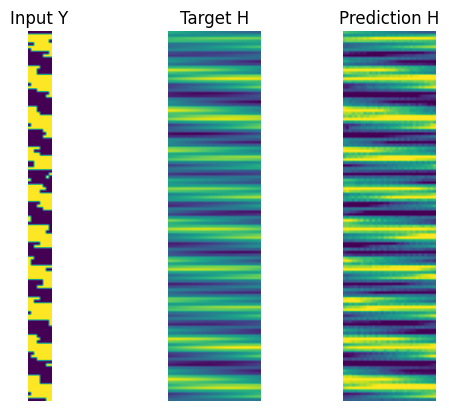

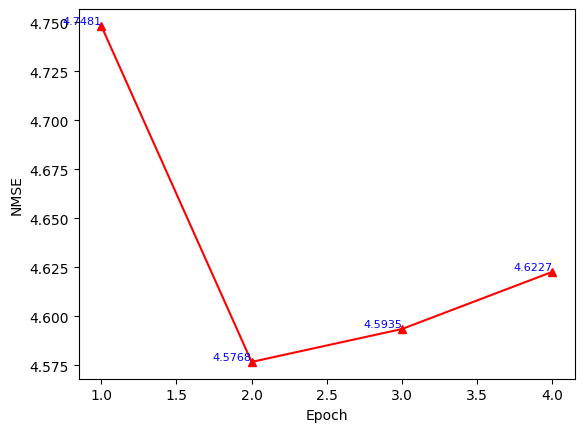

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 18.812923 , Discriminator loss: 0.00056334917 , time: 0:14:28.795667
B/E: 103 / 4 , Generator loss: 12.168496 , Discriminator loss: 0.3680594 , time: 0:14:42.791855
B/E: 206 / 4 , Generator loss: 18.29708 , Discriminator loss: 0.0017151424 , time: 0:14:56.825356
B/E: 309 / 4 , Generator loss: 18.656471 , Discriminator loss: 0.0029442613 , time: 0:15:10.799583
B/E: 412 / 4 , Generator loss: 27.529045 , Discriminator loss: 0.1725001 , time: 0:15:24.706659
B/E: 515 / 4 , Generator loss: 19.105927 , Discriminator loss: 0.0003277971 , time: 0:15:38.732853
B/E: 618 / 4 , Generator loss: 18.451767 , Discriminator loss: 0.0006119395 , time: 0:15:52.592059
B/E: 721 / 4 , Generator loss: 20.788843 , Discriminator loss: 0.0017394822 , time: 0:16:06.483932
B/E: 824 / 4 , Generator loss: 21.156424 , Discriminator loss: 0.0010229558 , time: 0:16:20.365555
B/E: 927 / 4 , Generator loss: 19.989708 , Discriminator loss: 0.0016975468 , time: 0:16:34.268206
B/E

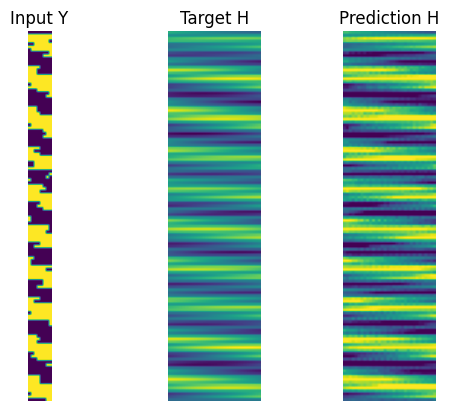

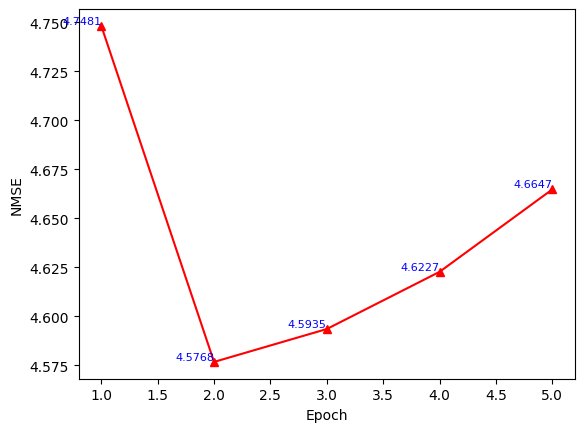

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 16.572844 , Discriminator loss: 0.0034322296 , time: 0:18:02.465947
B/E: 103 / 5 , Generator loss: 18.367817 , Discriminator loss: 0.0028112696 , time: 0:18:16.362504
B/E: 206 / 5 , Generator loss: 20.5526 , Discriminator loss: 0.00034003108 , time: 0:18:30.535087
B/E: 309 / 5 , Generator loss: 13.59595 , Discriminator loss: 0.031015784 , time: 0:18:44.324184
B/E: 412 / 5 , Generator loss: 17.275215 , Discriminator loss: 0.0049376995 , time: 0:18:58.136185
B/E: 515 / 5 , Generator loss: 18.377571 , Discriminator loss: 0.00089673843 , time: 0:19:11.809487
B/E: 618 / 5 , Generator loss: 17.365547 , Discriminator loss: 0.005689286 , time: 0:19:25.470764
B/E: 721 / 5 , Generator loss: 16.610516 , Discriminator loss: 0.0068813106 , time: 0:19:39.164417
B/E: 824 / 5 , Generator loss: 20.586214 , Discriminator loss: 0.00041965256 , time: 0:19:53.206182
B/E: 927 / 5 , Generator loss: 17.455523 , Discriminator loss: 0.0012476157 , time: 0:20:06.866587

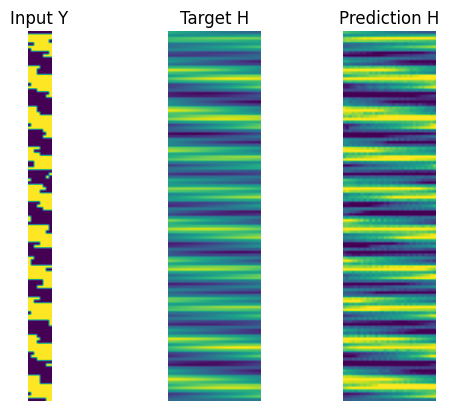

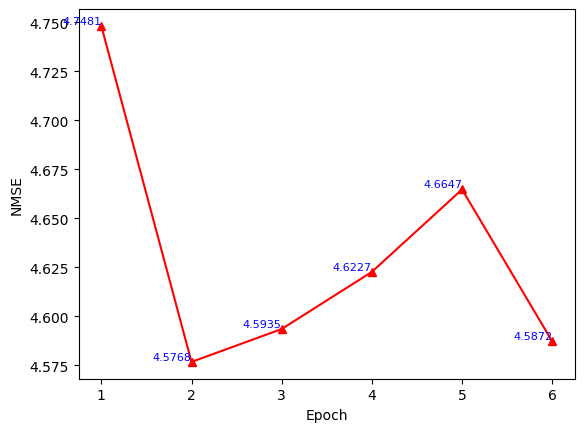

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 15.270934 , Discriminator loss: 0.023286758 , time: 0:21:34.551754
B/E: 103 / 6 , Generator loss: 19.758415 , Discriminator loss: 0.00043783317 , time: 0:21:48.356014
B/E: 206 / 6 , Generator loss: 17.292917 , Discriminator loss: 0.0012512429 , time: 0:22:02.195538
B/E: 309 / 6 , Generator loss: 16.340807 , Discriminator loss: 0.0075387284 , time: 0:22:15.894786
B/E: 412 / 6 , Generator loss: 15.292905 , Discriminator loss: 0.028319174 , time: 0:22:29.659058
B/E: 515 / 6 , Generator loss: 19.20558 , Discriminator loss: 0.00049045053 , time: 0:22:43.540452
B/E: 618 / 6 , Generator loss: 20.418175 , Discriminator loss: 0.00085982715 , time: 0:22:57.363115
B/E: 721 / 6 , Generator loss: 12.480051 , Discriminator loss: 0.37616372 , time: 0:23:11.089172
B/E: 824 / 6 , Generator loss: 18.663605 , Discriminator loss: 0.00073543086 , time: 0:23:24.889633
B/E: 927 / 6 , Generator loss: 23.432308 , Discriminator loss: 0.0023855057 , time: 0:23:38.61357

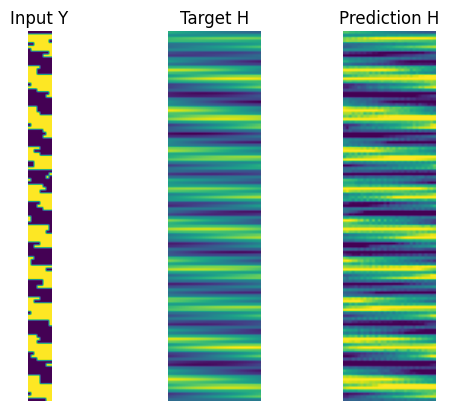

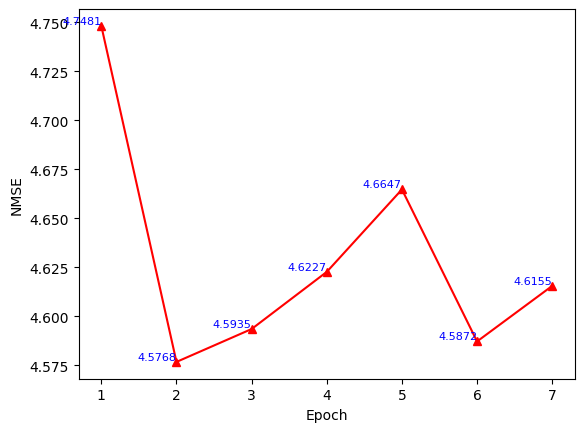

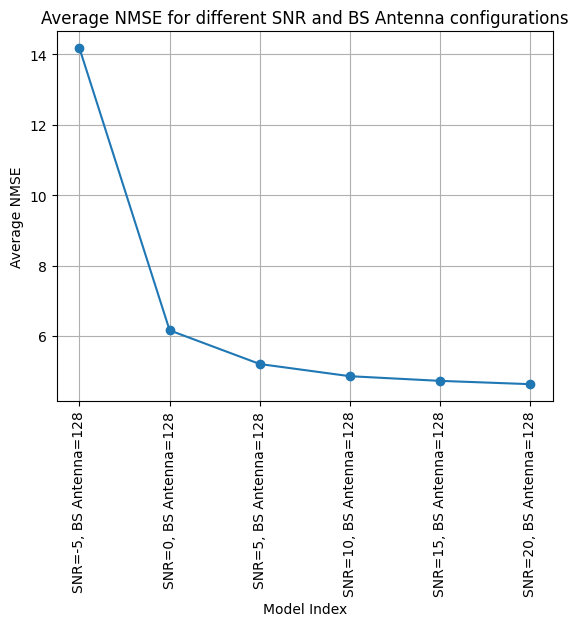

In [ ]:
if __name__ == "__main__":
    snr_list = [-5, 0, 5, 10, 15, 20]
    bs_ant_list = [128]
    avg_nmse = train(epochs=7, snr_list=snr_list, bs_ant_list=bs_ant_list)

    plt.plot(avg_nmse, marker='o')
    plt.xlabel('Model Index')
    plt.ylabel('Average NMSE')
    plt.title('Average NMSE for different SNR and BS Antenna configurations')
    plt.xticks(ticks=range(len(avg_nmse)), labels=[f'SNR={snr}, BS Antenna={bs_ant}' for snr in snr_list for bs_ant in bs_ant_list])
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()

##Main Function

For 192 antennas at the Base Station(BS)

For each set of antennas, we vary the SNR ranging from -5 to 20. We can test over higher SNR values too.

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 60.089146 , Discriminator loss: 1.3863349 , time: 0:00:08.000223
B/E: 103 / 0 , Generator loss: 33.493683 , Discriminator loss: 1.3854706 , time: 0:00:35.738876
B/E: 206 / 0 , Generator loss: 31.774382 , Discriminator loss: 1.2597895 , time: 0:00:48.508904
B/E: 309 / 0 , Generator loss: 31.91373 , Discriminator loss: 0.19206852 , time: 0:01:00.909888
B/E: 412 / 0 , Generator loss: 33.41801 , Discriminator loss: 1.5010403 , time: 0:01:13.501289
B/E: 515 / 0 , Generator loss: 37.424156 , Discriminator loss: 0.42169195 , time: 0:01:27.833443
B/E: 618 / 0 , Generator loss: 33.81129 , Discriminator loss: 1.1260197 , time: 0:01:40.729458
B/E: 721 / 0 , Generator loss: 34.878616 , Discriminator loss: 0.7131831 , time: 0:01:53.763127
B/E: 824 / 0 , Generator loss: 39.02204 , Discriminator loss: 0.18129343 , time: 0:02:07.152083
B/E: 927 / 0 , Generator loss: 34.53664 , Discriminator loss: 0.99052274 , time: 0:02:19.914780
B/E: 1030 / 0 , Generator lo

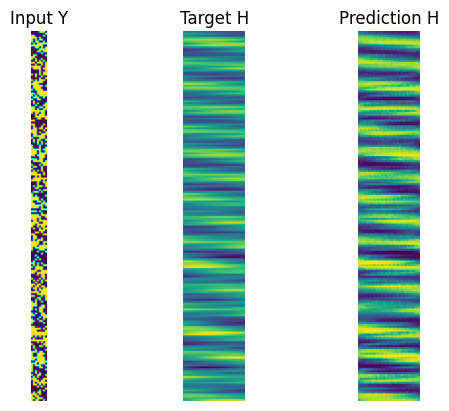

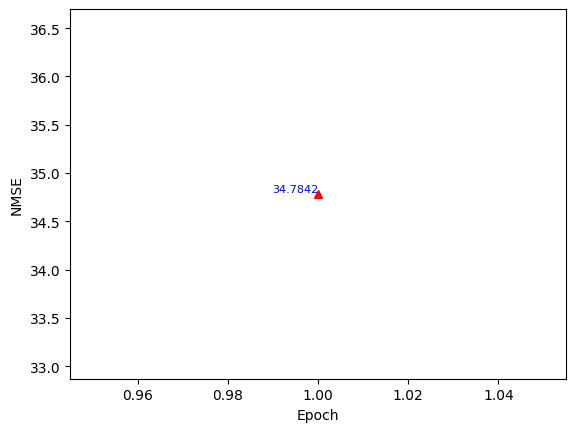

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 36.781384 , Discriminator loss: 1.6721976 , time: 0:04:09.414194
B/E: 103 / 1 , Generator loss: 34.54044 , Discriminator loss: 0.5400623 , time: 0:04:22.703591
B/E: 206 / 1 , Generator loss: 22.950706 , Discriminator loss: 1.0232365 , time: 0:04:35.888821
B/E: 309 / 1 , Generator loss: 25.393814 , Discriminator loss: 0.8568975 , time: 0:04:49.053494
B/E: 412 / 1 , Generator loss: 23.4596 , Discriminator loss: 0.68909717 , time: 0:05:02.223123
B/E: 515 / 1 , Generator loss: 21.885443 , Discriminator loss: 0.5048797 , time: 0:05:15.370078
B/E: 618 / 1 , Generator loss: 22.827143 , Discriminator loss: 1.3356012 , time: 0:05:28.484721
B/E: 721 / 1 , Generator loss: 22.550941 , Discriminator loss: 0.9427678 , time: 0:05:41.429932
B/E: 824 / 1 , Generator loss: 21.999779 , Discriminator loss: 1.0370528 , time: 0:05:54.517891
B/E: 927 / 1 , Generator loss: 21.729963 , Discriminator loss: 1.5248841 , time: 0:06:08.942083
B/E: 1030 / 1 , Generator los

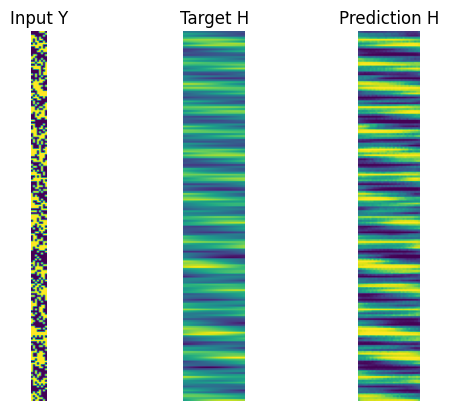

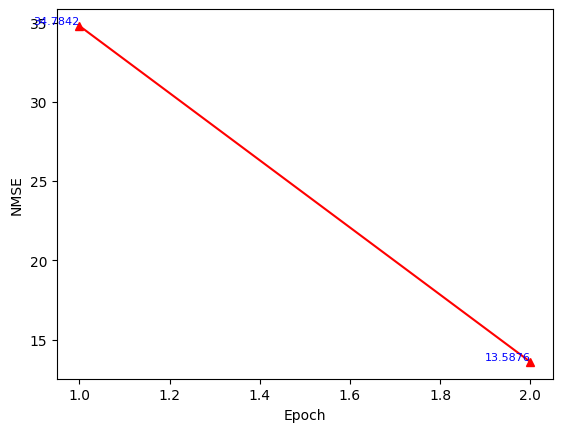

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 21.305288 , Discriminator loss: 1.1131514 , time: 0:07:34.264235
B/E: 103 / 2 , Generator loss: 16.20286 , Discriminator loss: 1.4454504 , time: 0:07:47.463888
B/E: 206 / 2 , Generator loss: 19.577917 , Discriminator loss: 0.7778847 , time: 0:08:00.514821
B/E: 309 / 2 , Generator loss: 22.547274 , Discriminator loss: 0.77739215 , time: 0:08:13.768138
B/E: 412 / 2 , Generator loss: 15.9596 , Discriminator loss: 0.7982466 , time: 0:08:28.153613
B/E: 515 / 2 , Generator loss: 22.194567 , Discriminator loss: 0.39137715 , time: 0:08:41.332316
B/E: 618 / 2 , Generator loss: 22.748236 , Discriminator loss: 0.49104923 , time: 0:08:54.562895
B/E: 721 / 2 , Generator loss: 14.516769 , Discriminator loss: 1.8656251 , time: 0:09:07.730527
B/E: 824 / 2 , Generator loss: 15.928205 , Discriminator loss: 0.91437733 , time: 0:09:20.773220
B/E: 927 / 2 , Generator loss: 20.140795 , Discriminator loss: 0.65282565 , time: 0:09:33.986714
B/E: 1030 / 2 , Generator

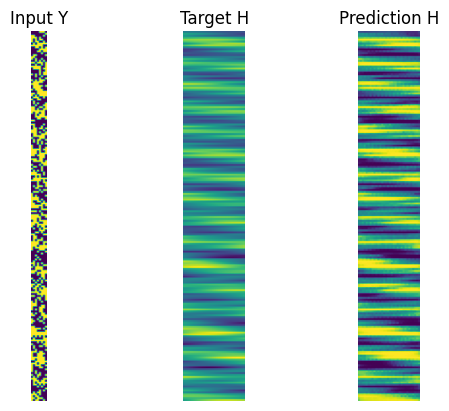

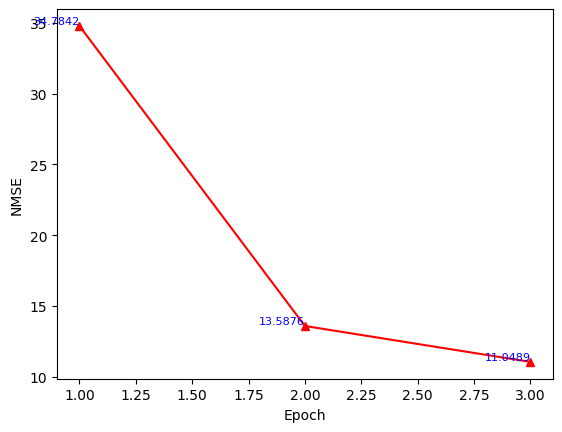

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 16.867582 , Discriminator loss: 0.67329746 , time: 0:10:59.773300
B/E: 103 / 3 , Generator loss: 17.795036 , Discriminator loss: 2.0641103 , time: 0:11:13.072769
B/E: 206 / 3 , Generator loss: 22.516727 , Discriminator loss: 0.83682024 , time: 0:11:26.221088
B/E: 309 / 3 , Generator loss: 17.731632 , Discriminator loss: 1.261547 , time: 0:11:38.955009
B/E: 412 / 3 , Generator loss: 14.966138 , Discriminator loss: 0.51166713 , time: 0:11:51.616626
B/E: 515 / 3 , Generator loss: 18.411112 , Discriminator loss: 0.98449564 , time: 0:12:04.460977
B/E: 618 / 3 , Generator loss: 15.649164 , Discriminator loss: 0.49901956 , time: 0:12:17.640241
B/E: 721 / 3 , Generator loss: 19.314096 , Discriminator loss: 0.52718234 , time: 0:12:30.829377
B/E: 824 / 3 , Generator loss: 18.728346 , Discriminator loss: 0.34993365 , time: 0:12:43.993437
B/E: 927 / 3 , Generator loss: 19.123243 , Discriminator loss: 0.6804527 , time: 0:12:57.049365
B/E: 1030 / 3 , Gener

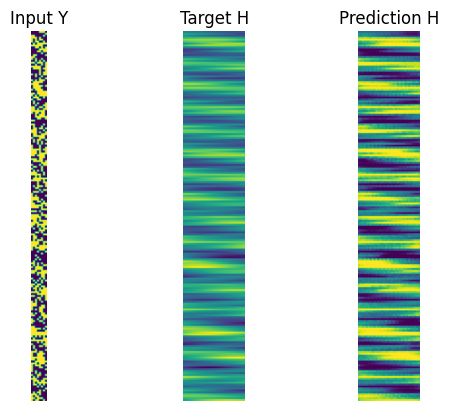

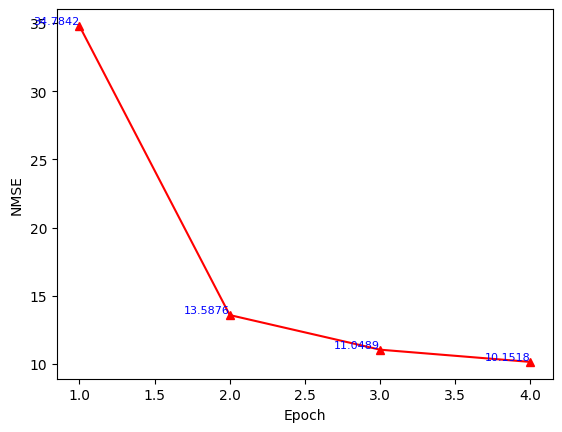

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 19.26736 , Discriminator loss: 0.1539877 , time: 0:14:25.307604
B/E: 103 / 4 , Generator loss: 18.066305 , Discriminator loss: 0.5748834 , time: 0:14:38.441333
B/E: 206 / 4 , Generator loss: 20.339024 , Discriminator loss: 0.3674511 , time: 0:14:51.456339
B/E: 309 / 4 , Generator loss: 17.301289 , Discriminator loss: 0.2222579 , time: 0:15:04.512073
B/E: 412 / 4 , Generator loss: 18.1911 , Discriminator loss: 0.933316 , time: 0:15:17.382444
B/E: 515 / 4 , Generator loss: 16.309872 , Discriminator loss: 0.34057635 , time: 0:15:31.334730
B/E: 618 / 4 , Generator loss: 18.183073 , Discriminator loss: 1.1356356 , time: 0:15:44.780269
B/E: 721 / 4 , Generator loss: 23.811817 , Discriminator loss: 0.95762026 , time: 0:15:58.050913
B/E: 824 / 4 , Generator loss: 17.240406 , Discriminator loss: 0.58252275 , time: 0:16:11.080725
B/E: 927 / 4 , Generator loss: 14.890358 , Discriminator loss: 0.660336 , time: 0:16:24.164610
B/E: 1030 / 4 , Generator los

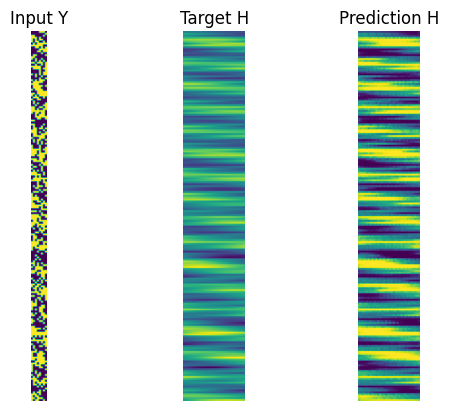

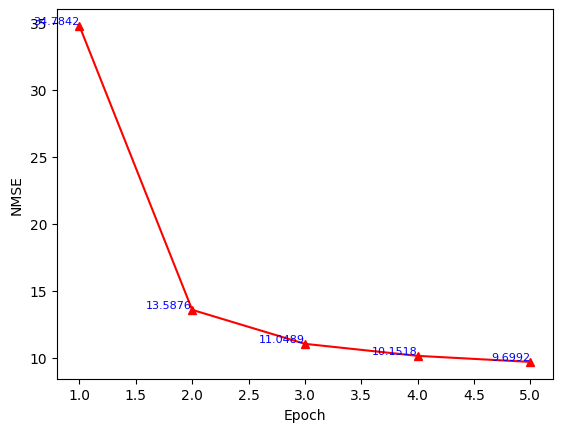

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 17.341486 , Discriminator loss: 1.0483909 , time: 0:17:49.952693
B/E: 103 / 5 , Generator loss: 15.104805 , Discriminator loss: 0.19962771 , time: 0:18:04.338882
B/E: 206 / 5 , Generator loss: 14.466652 , Discriminator loss: 0.18781841 , time: 0:18:17.162723
B/E: 309 / 5 , Generator loss: 16.102207 , Discriminator loss: 0.5484296 , time: 0:18:30.184118
B/E: 412 / 5 , Generator loss: 22.015106 , Discriminator loss: 0.3813699 , time: 0:18:42.943109
B/E: 515 / 5 , Generator loss: 15.7899065 , Discriminator loss: 0.31922472 , time: 0:18:55.752261
B/E: 618 / 5 , Generator loss: 15.6366005 , Discriminator loss: 0.61217535 , time: 0:19:08.448455
B/E: 721 / 5 , Generator loss: 14.598461 , Discriminator loss: 0.16852134 , time: 0:19:21.189364
B/E: 824 / 5 , Generator loss: 17.799204 , Discriminator loss: 0.559903 , time: 0:19:34.512771
B/E: 927 / 5 , Generator loss: 16.291218 , Discriminator loss: 0.18127958 , time: 0:19:47.543075
B/E: 1030 / 5 , Gene

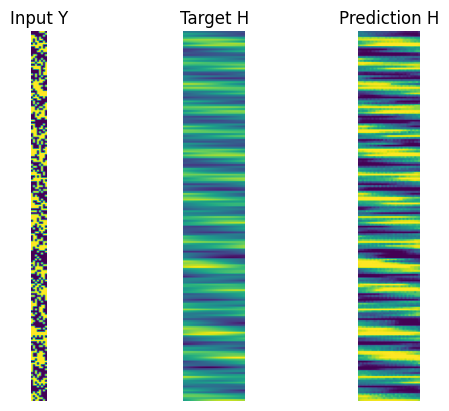

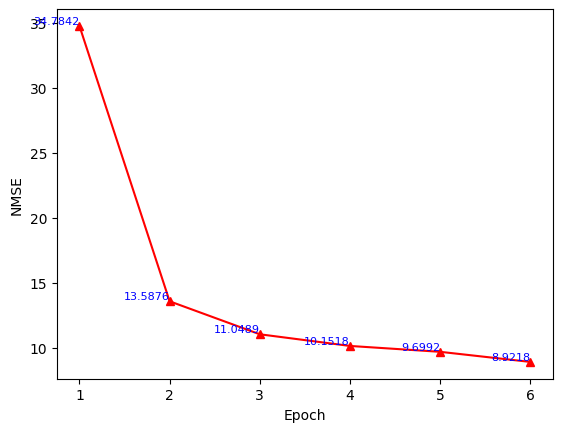

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 18.296656 , Discriminator loss: 0.35606682 , time: 0:21:14.881868
B/E: 103 / 6 , Generator loss: 15.701168 , Discriminator loss: 0.2140153 , time: 0:21:27.919677
B/E: 206 / 6 , Generator loss: 18.347584 , Discriminator loss: 1.3209392 , time: 0:21:40.974541
B/E: 309 / 6 , Generator loss: 15.016059 , Discriminator loss: 0.28250203 , time: 0:21:53.841534
B/E: 412 / 6 , Generator loss: 16.236156 , Discriminator loss: 0.14022726 , time: 0:22:06.608430
B/E: 515 / 6 , Generator loss: 19.95482 , Discriminator loss: 0.75719714 , time: 0:22:19.692780
B/E: 618 / 6 , Generator loss: 11.739647 , Discriminator loss: 0.96899533 , time: 0:22:32.832042
B/E: 721 / 6 , Generator loss: 16.067062 , Discriminator loss: 0.2472063 , time: 0:22:47.154342
B/E: 824 / 6 , Generator loss: 16.153957 , Discriminator loss: 0.28420523 , time: 0:23:00.259153
B/E: 927 / 6 , Generator loss: 14.352418 , Discriminator loss: 0.24033014 , time: 0:23:13.599875
B/E: 1030 / 6 , Gener

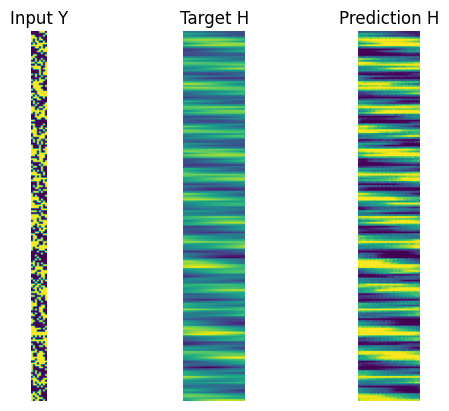

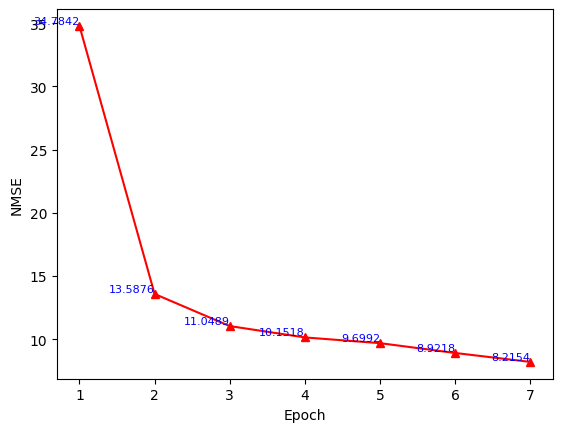

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 17.780575 , Discriminator loss: 0.11191951 , time: 0:00:05.079996
B/E: 103 / 0 , Generator loss: 21.98235 , Discriminator loss: 0.9234076 , time: 0:00:18.191497
B/E: 206 / 0 , Generator loss: 19.725533 , Discriminator loss: 0.22596794 , time: 0:00:32.033665
B/E: 309 / 0 , Generator loss: 21.604967 , Discriminator loss: 0.58727324 , time: 0:00:44.869834
B/E: 412 / 0 , Generator loss: 17.240364 , Discriminator loss: 0.31617516 , time: 0:00:57.877838
B/E: 515 / 0 , Generator loss: 20.125547 , Discriminator loss: 0.5902358 , time: 0:01:11.252338
B/E: 618 / 0 , Generator loss: 19.648142 , Discriminator loss: 0.15247825 , time: 0:01:24.390352
B/E: 721 / 0 , Generator loss: 21.024254 , Discriminator loss: 0.14369377 , time: 0:01:37.601286
B/E: 824 / 0 , Generator loss: 17.10209 , Discriminator loss: 0.396689 , time: 0:01:50.566978
B/E: 927 / 0 , Generator loss: 20.378628 , Discriminator loss: 0.5521698 , time: 0:02:03.358169
B/E: 1030 / 0 , Generato

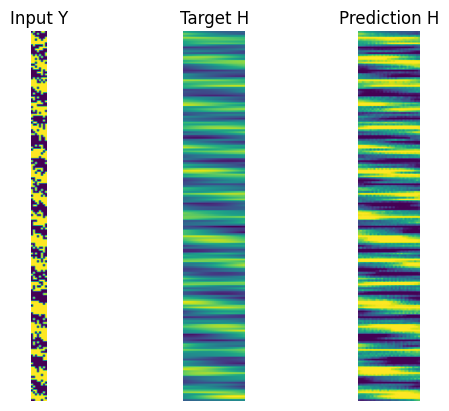

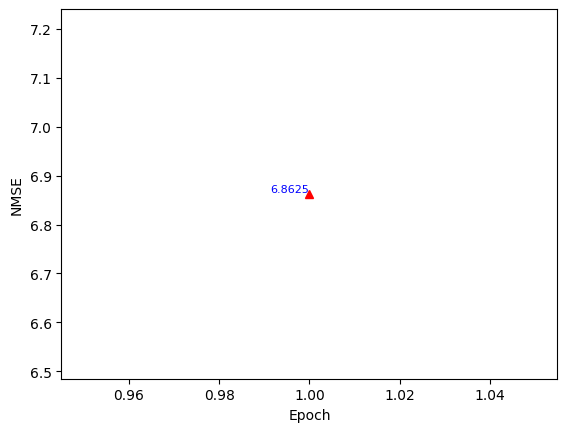

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 18.554935 , Discriminator loss: 0.73890775 , time: 0:03:29.488203
B/E: 103 / 1 , Generator loss: 15.24419 , Discriminator loss: 0.5395348 , time: 0:03:42.431330
B/E: 206 / 1 , Generator loss: 13.733803 , Discriminator loss: 0.38777888 , time: 0:03:55.362167
B/E: 309 / 1 , Generator loss: 14.005766 , Discriminator loss: 2.5966787 , time: 0:04:08.241963
B/E: 412 / 1 , Generator loss: 14.712684 , Discriminator loss: 0.18303761 , time: 0:04:21.244981
B/E: 515 / 1 , Generator loss: 13.655373 , Discriminator loss: 0.19226001 , time: 0:04:34.185480
B/E: 618 / 1 , Generator loss: 19.328962 , Discriminator loss: 1.1373117 , time: 0:04:47.135000
B/E: 721 / 1 , Generator loss: 17.509312 , Discriminator loss: 0.13464043 , time: 0:05:00.201861
B/E: 824 / 1 , Generator loss: 19.977325 , Discriminator loss: 0.12173954 , time: 0:05:13.644681
B/E: 927 / 1 , Generator loss: 17.490084 , Discriminator loss: 0.13480316 , time: 0:05:26.214801
B/E: 1030 / 1 , Gener

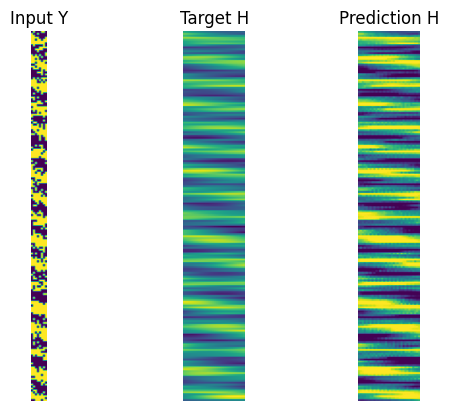

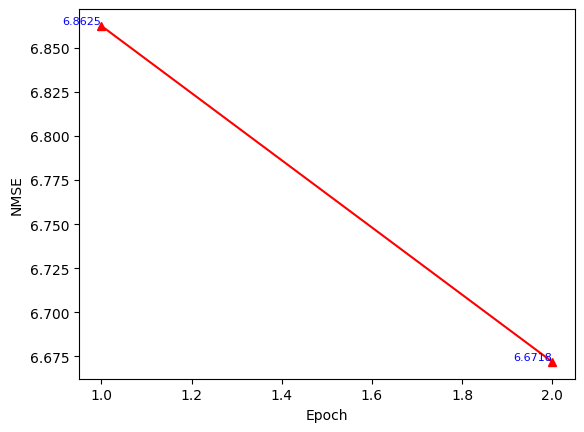

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 14.666651 , Discriminator loss: 0.17496784 , time: 0:06:50.507532
B/E: 103 / 2 , Generator loss: 15.852225 , Discriminator loss: 0.07558308 , time: 0:07:03.080047
B/E: 206 / 2 , Generator loss: 16.821045 , Discriminator loss: 0.21479812 , time: 0:07:15.773480
B/E: 309 / 2 , Generator loss: 16.664639 , Discriminator loss: 0.044920065 , time: 0:07:29.482103
B/E: 412 / 2 , Generator loss: 16.389147 , Discriminator loss: 0.27876955 , time: 0:07:42.260086
B/E: 515 / 2 , Generator loss: 13.35127 , Discriminator loss: 3.4720302 , time: 0:07:55.069781
B/E: 618 / 2 , Generator loss: 16.821732 , Discriminator loss: 0.04914999 , time: 0:08:07.419664
B/E: 721 / 2 , Generator loss: 14.456162 , Discriminator loss: 0.60963637 , time: 0:08:19.635766
B/E: 824 / 2 , Generator loss: 17.634218 , Discriminator loss: 0.05486199 , time: 0:08:31.985172
B/E: 927 / 2 , Generator loss: 15.170428 , Discriminator loss: 0.11774397 , time: 0:08:44.578666
B/E: 1030 / 2 , Ge

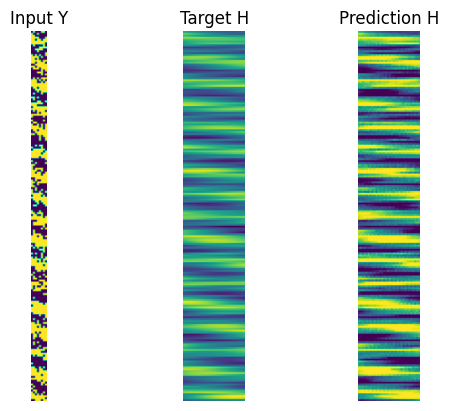

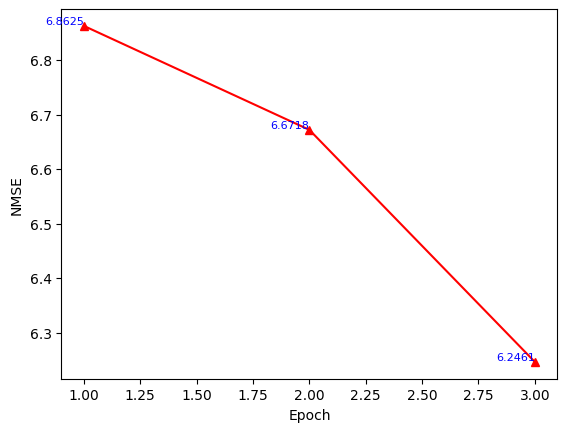

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 13.6154995 , Discriminator loss: 0.50853765 , time: 0:10:11.033546
B/E: 103 / 3 , Generator loss: 12.339497 , Discriminator loss: 0.2567801 , time: 0:10:23.784346
B/E: 206 / 3 , Generator loss: 21.773487 , Discriminator loss: 2.0522985 , time: 0:10:36.235596
B/E: 309 / 3 , Generator loss: 16.82818 , Discriminator loss: 0.054713897 , time: 0:10:48.911602
B/E: 412 / 3 , Generator loss: 16.33485 , Discriminator loss: 0.08549362 , time: 0:11:01.797821
B/E: 515 / 3 , Generator loss: 15.934851 , Discriminator loss: 1.0494326 , time: 0:11:14.959873
B/E: 618 / 3 , Generator loss: 17.622272 , Discriminator loss: 0.06984055 , time: 0:11:28.072149
B/E: 721 / 3 , Generator loss: 13.802282 , Discriminator loss: 0.32355058 , time: 0:11:41.217290
B/E: 824 / 3 , Generator loss: 17.473843 , Discriminator loss: 0.037685912 , time: 0:11:54.138890
B/E: 927 / 3 , Generator loss: 17.707209 , Discriminator loss: 0.0519192 , time: 0:12:08.352099
B/E: 1030 / 3 , Gene

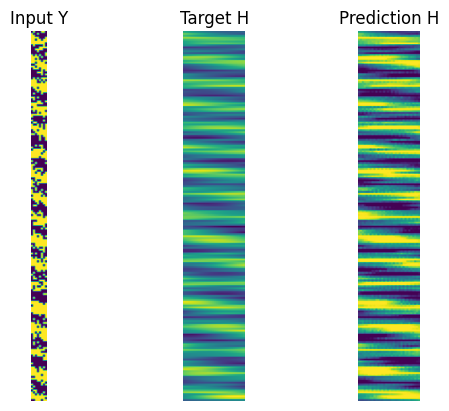

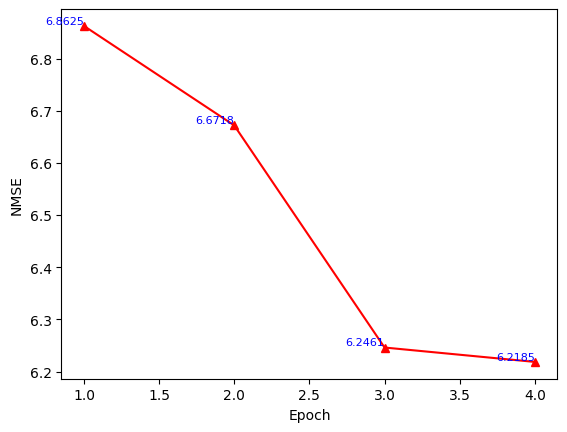

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 16.394077 , Discriminator loss: 0.14515565 , time: 0:13:31.492846
B/E: 103 / 4 , Generator loss: 13.748945 , Discriminator loss: 0.32182613 , time: 0:13:44.323201
B/E: 206 / 4 , Generator loss: 15.323628 , Discriminator loss: 0.060959786 , time: 0:13:56.913812
B/E: 309 / 4 , Generator loss: 14.200944 , Discriminator loss: 0.14652261 , time: 0:14:09.552079
B/E: 412 / 4 , Generator loss: 16.522987 , Discriminator loss: 0.09936111 , time: 0:14:23.892871
B/E: 515 / 4 , Generator loss: 16.087166 , Discriminator loss: 0.0651535 , time: 0:14:36.849867
B/E: 618 / 4 , Generator loss: 16.885975 , Discriminator loss: 0.012204425 , time: 0:14:49.962328
B/E: 721 / 4 , Generator loss: 23.915686 , Discriminator loss: 1.8087953 , time: 0:15:02.883654
B/E: 824 / 4 , Generator loss: 20.454706 , Discriminator loss: 0.30154186 , time: 0:15:15.763053
B/E: 927 / 4 , Generator loss: 16.728703 , Discriminator loss: 0.0849141 , time: 0:15:28.480838
B/E: 1030 / 4 , Ge

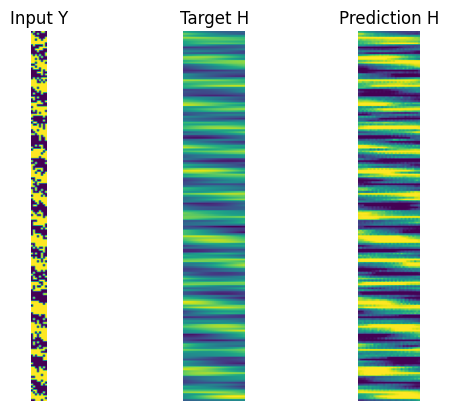

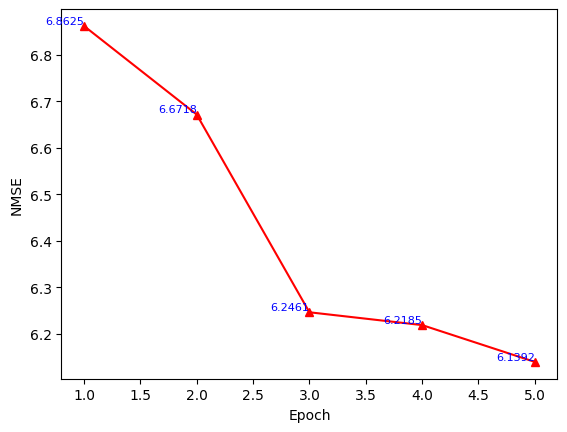

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 15.529373 , Discriminator loss: 0.09594455 , time: 0:16:56.317781
B/E: 103 / 5 , Generator loss: 17.263683 , Discriminator loss: 0.100437865 , time: 0:17:09.285962
B/E: 206 / 5 , Generator loss: 18.940691 , Discriminator loss: 0.073724106 , time: 0:17:22.264244
B/E: 309 / 5 , Generator loss: 15.192863 , Discriminator loss: 0.14905088 , time: 0:17:35.137903
B/E: 412 / 5 , Generator loss: 18.06714 , Discriminator loss: 0.43453458 , time: 0:17:48.054889
B/E: 515 / 5 , Generator loss: 16.668655 , Discriminator loss: 0.061913475 , time: 0:18:00.363765
B/E: 618 / 5 , Generator loss: 16.997288 , Discriminator loss: 0.019704033 , time: 0:18:12.702288
B/E: 721 / 5 , Generator loss: 15.610512 , Discriminator loss: 0.32098094 , time: 0:18:25.663671
B/E: 824 / 5 , Generator loss: 18.437002 , Discriminator loss: 0.01954222 , time: 0:18:38.597388
B/E: 927 / 5 , Generator loss: 17.675797 , Discriminator loss: 0.01979385 , time: 0:18:51.258747
B/E: 1030 / 5 

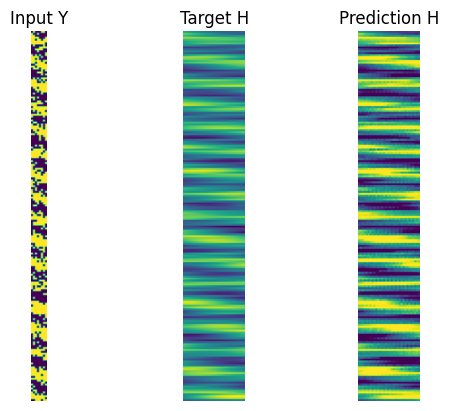

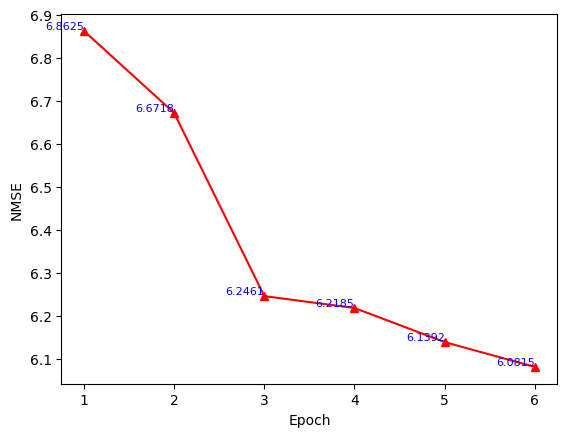

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 13.297646 , Discriminator loss: 0.6098165 , time: 0:20:17.134616
B/E: 103 / 6 , Generator loss: 16.241648 , Discriminator loss: 0.5947736 , time: 0:20:29.809576
B/E: 206 / 6 , Generator loss: 14.041824 , Discriminator loss: 0.3504774 , time: 0:20:42.444990
B/E: 309 / 6 , Generator loss: 14.811756 , Discriminator loss: 0.05993516 , time: 0:20:55.157902
B/E: 412 / 6 , Generator loss: 15.228027 , Discriminator loss: 0.07858274 , time: 0:21:08.052993
B/E: 515 / 6 , Generator loss: 18.304543 , Discriminator loss: 0.01482974 , time: 0:21:22.592971
B/E: 618 / 6 , Generator loss: 24.454527 , Discriminator loss: 0.6945414 , time: 0:21:35.821971
B/E: 721 / 6 , Generator loss: 11.83412 , Discriminator loss: 2.0758164 , time: 0:21:48.869181
B/E: 824 / 6 , Generator loss: 15.455943 , Discriminator loss: 0.33851382 , time: 0:22:01.829519
B/E: 927 / 6 , Generator loss: 12.080324 , Discriminator loss: 1.1589146 , time: 0:22:14.915415
B/E: 1030 / 6 , Generato

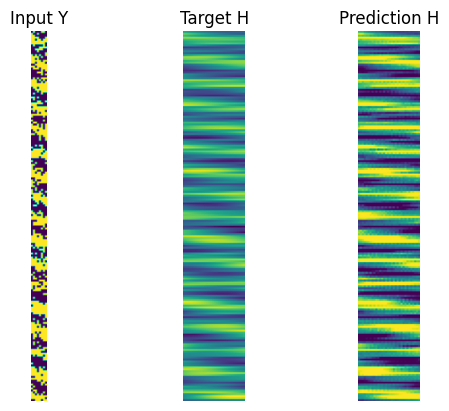

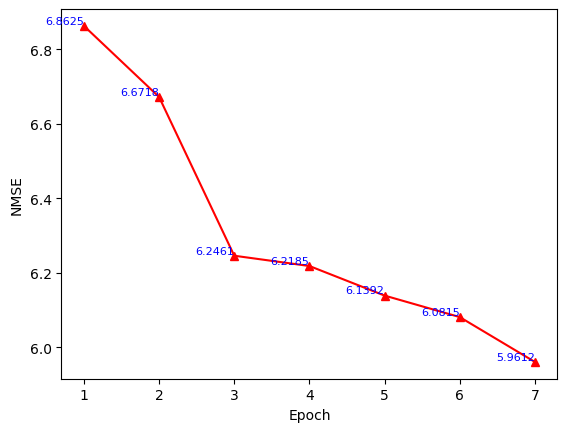

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 20.388184 , Discriminator loss: 0.017029922 , time: 0:00:07.725714
B/E: 103 / 0 , Generator loss: 16.002506 , Discriminator loss: 0.0636213 , time: 0:00:20.669085
B/E: 206 / 0 , Generator loss: 19.276642 , Discriminator loss: 0.0072520548 , time: 0:00:33.647142
B/E: 309 / 0 , Generator loss: 18.32772 , Discriminator loss: 0.014144334 , time: 0:00:46.456698
B/E: 412 / 0 , Generator loss: 20.480495 , Discriminator loss: 0.031420834 , time: 0:00:59.103189
B/E: 515 / 0 , Generator loss: 20.19154 , Discriminator loss: 0.17345533 , time: 0:01:11.761275
B/E: 618 / 0 , Generator loss: 18.761635 , Discriminator loss: 0.011100752 , time: 0:01:24.451819
B/E: 721 / 0 , Generator loss: 18.600842 , Discriminator loss: 0.051805627 , time: 0:01:37.017622
B/E: 824 / 0 , Generator loss: 13.755768 , Discriminator loss: 0.40212935 , time: 0:01:49.652822
B/E: 927 / 0 , Generator loss: 21.334614 , Discriminator loss: 0.05813738 , time: 0:02:02.312163
B/E: 1030 / 0

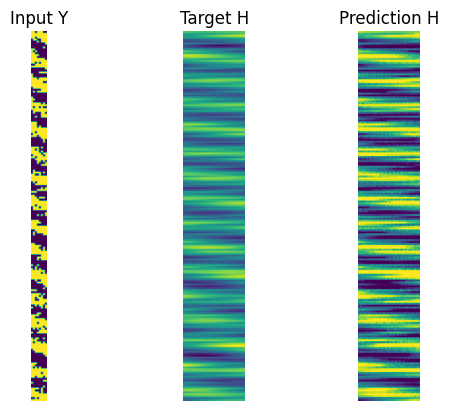

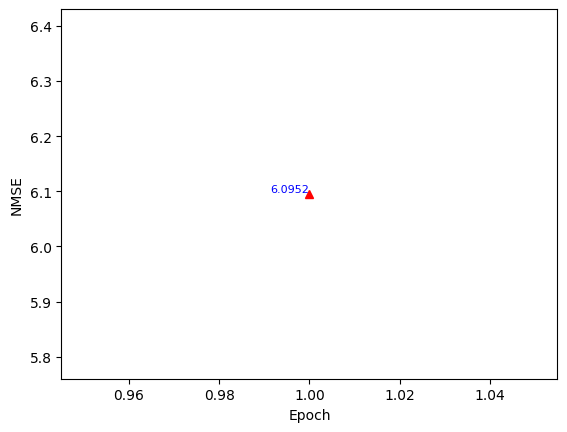

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 17.425726 , Discriminator loss: 0.016568266 , time: 0:03:29.215642
B/E: 103 / 1 , Generator loss: 13.82031 , Discriminator loss: 0.20302358 , time: 0:03:42.112628
B/E: 206 / 1 , Generator loss: 19.94587 , Discriminator loss: 0.024712035 , time: 0:03:55.222322
B/E: 309 / 1 , Generator loss: 18.918816 , Discriminator loss: 0.007880285 , time: 0:04:08.226590
B/E: 412 / 1 , Generator loss: 16.902832 , Discriminator loss: 0.20840017 , time: 0:04:21.198082
B/E: 515 / 1 , Generator loss: 18.032354 , Discriminator loss: 0.013862954 , time: 0:04:34.015037
B/E: 618 / 1 , Generator loss: 14.325449 , Discriminator loss: 0.16148776 , time: 0:04:48.025762
B/E: 721 / 1 , Generator loss: 20.016418 , Discriminator loss: 1.5711287 , time: 0:05:01.287859
B/E: 824 / 1 , Generator loss: 16.84011 , Discriminator loss: 0.021767044 , time: 0:05:14.506473
B/E: 927 / 1 , Generator loss: 18.690271 , Discriminator loss: 0.0071457187 , time: 0:05:27.653143
B/E: 1030 / 1 

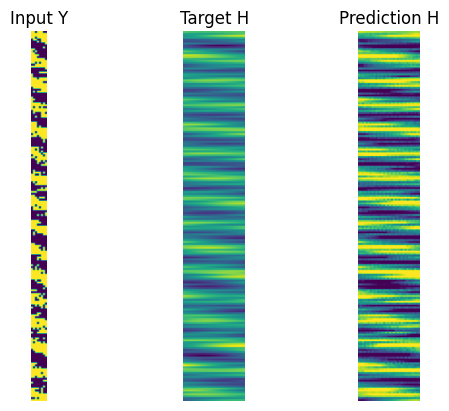

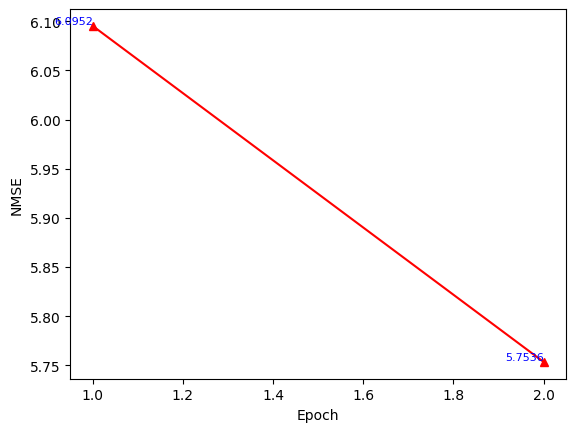

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 17.289839 , Discriminator loss: 0.04593099 , time: 0:06:53.360701
B/E: 103 / 2 , Generator loss: 15.908799 , Discriminator loss: 0.017978592 , time: 0:07:07.983280
B/E: 206 / 2 , Generator loss: 14.431429 , Discriminator loss: 0.16054142 , time: 0:07:21.098187
B/E: 309 / 2 , Generator loss: 14.341537 , Discriminator loss: 0.8906147 , time: 0:07:34.334189
B/E: 412 / 2 , Generator loss: 15.557949 , Discriminator loss: 0.10115908 , time: 0:07:47.697927
B/E: 515 / 2 , Generator loss: 18.20884 , Discriminator loss: 0.010095816 , time: 0:08:00.941725
B/E: 618 / 2 , Generator loss: 20.06284 , Discriminator loss: 0.018870305 , time: 0:08:14.185436
B/E: 721 / 2 , Generator loss: 18.432056 , Discriminator loss: 0.14438221 , time: 0:08:27.356868
B/E: 824 / 2 , Generator loss: 18.587986 , Discriminator loss: 0.002488751 , time: 0:08:40.344930
B/E: 927 / 2 , Generator loss: 18.443815 , Discriminator loss: 0.019911285 , time: 0:08:53.289877
B/E: 1030 / 2 ,

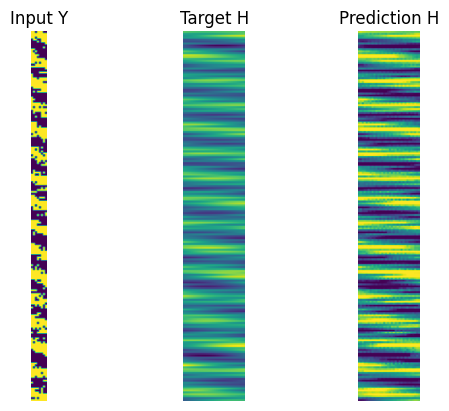

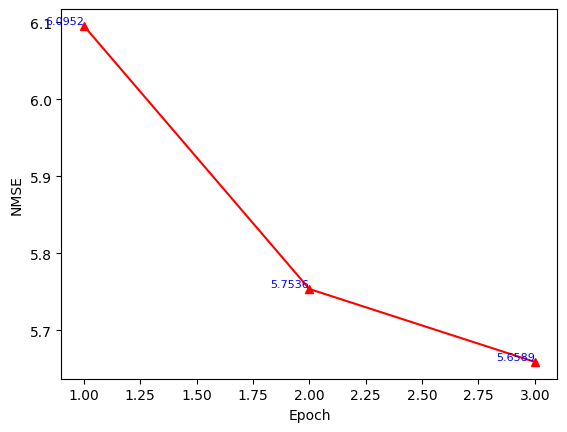

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 17.97126 , Discriminator loss: 0.0060806507 , time: 0:10:18.966746
B/E: 103 / 3 , Generator loss: 18.463646 , Discriminator loss: 0.004913969 , time: 0:10:32.131841
B/E: 206 / 3 , Generator loss: 23.799702 , Discriminator loss: 3.1755772 , time: 0:10:45.237147
B/E: 309 / 3 , Generator loss: 17.991442 , Discriminator loss: 0.008663125 , time: 0:10:58.103386
B/E: 412 / 3 , Generator loss: 16.966167 , Discriminator loss: 0.04173294 , time: 0:11:11.000849
B/E: 515 / 3 , Generator loss: 15.73818 , Discriminator loss: 0.20142347 , time: 0:11:24.033989
B/E: 618 / 3 , Generator loss: 20.799362 , Discriminator loss: 0.2256574 , time: 0:11:38.400463
B/E: 721 / 3 , Generator loss: 20.586714 , Discriminator loss: 0.003532847 , time: 0:11:50.807531
B/E: 824 / 3 , Generator loss: 19.13088 , Discriminator loss: 0.025140606 , time: 0:12:03.379439
B/E: 927 / 3 , Generator loss: 14.282108 , Discriminator loss: 0.09049868 , time: 0:12:16.027987
B/E: 1030 / 3 , 

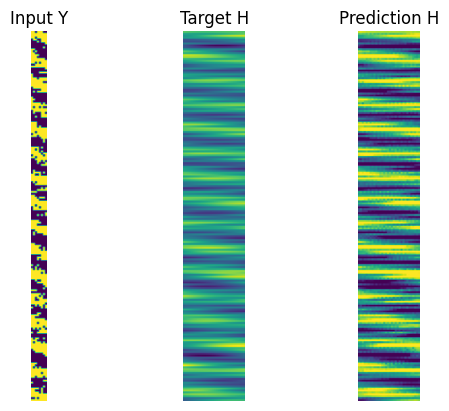

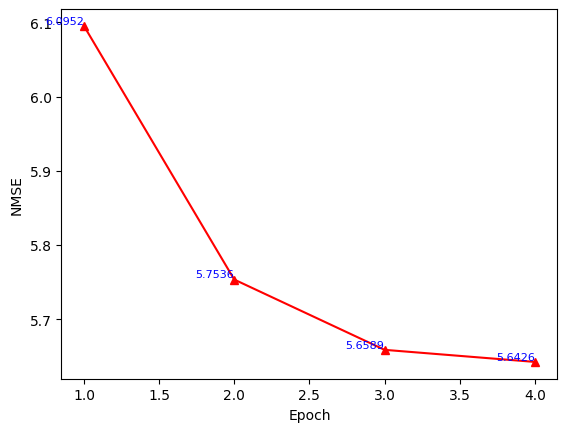

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 18.098843 , Discriminator loss: 0.0041540046 , time: 0:13:42.817672
B/E: 103 / 4 , Generator loss: 18.457386 , Discriminator loss: 0.10311263 , time: 0:13:57.237907
B/E: 206 / 4 , Generator loss: 21.958042 , Discriminator loss: 2.880285 , time: 0:14:09.897949
B/E: 309 / 4 , Generator loss: 16.082214 , Discriminator loss: 0.015639227 , time: 0:14:22.382967
B/E: 412 / 4 , Generator loss: 16.636076 , Discriminator loss: 0.0041873255 , time: 0:14:35.387391
B/E: 515 / 4 , Generator loss: 16.033089 , Discriminator loss: 0.054278906 , time: 0:14:48.255633
B/E: 618 / 4 , Generator loss: 18.760324 , Discriminator loss: 0.002985288 , time: 0:15:01.006956
B/E: 721 / 4 , Generator loss: 16.852932 , Discriminator loss: 0.0058306484 , time: 0:15:13.899136
B/E: 824 / 4 , Generator loss: 16.886736 , Discriminator loss: 0.14224775 , time: 0:15:27.175449
B/E: 927 / 4 , Generator loss: 15.826294 , Discriminator loss: 0.09454635 , time: 0:15:40.326434
B/E: 1030 

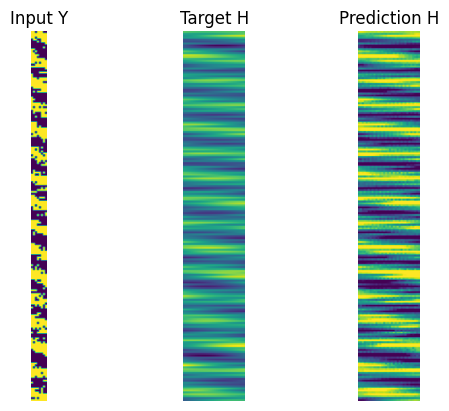

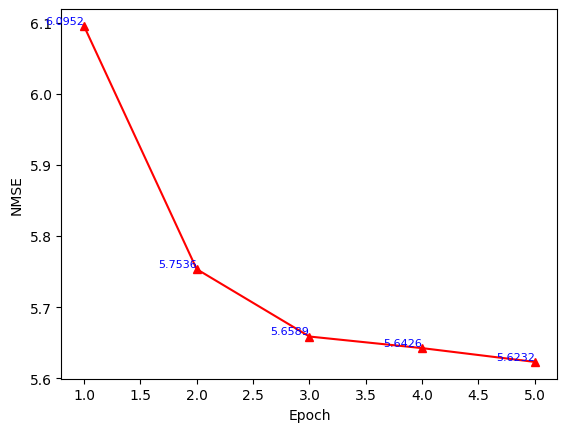

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 17.867123 , Discriminator loss: 0.009700628 , time: 0:17:07.656328
B/E: 103 / 5 , Generator loss: 15.430517 , Discriminator loss: 0.12282347 , time: 0:17:20.592260
B/E: 206 / 5 , Generator loss: 18.662066 , Discriminator loss: 0.024098577 , time: 0:17:33.766830
B/E: 309 / 5 , Generator loss: 16.993847 , Discriminator loss: 0.023829699 , time: 0:17:46.834702
B/E: 412 / 5 , Generator loss: 17.71299 , Discriminator loss: 0.0482312 , time: 0:17:59.911562
B/E: 515 / 5 , Generator loss: 18.770285 , Discriminator loss: 0.002150929 , time: 0:18:13.052538
B/E: 618 / 5 , Generator loss: 17.928974 , Discriminator loss: 0.01896618 , time: 0:18:26.800977
B/E: 721 / 5 , Generator loss: 13.793231 , Discriminator loss: 0.09813755 , time: 0:18:40.509543
B/E: 824 / 5 , Generator loss: 19.096462 , Discriminator loss: 0.011722296 , time: 0:18:53.653142
B/E: 927 / 5 , Generator loss: 24.050491 , Discriminator loss: 0.19221938 , time: 0:19:06.719119
B/E: 1030 / 5 

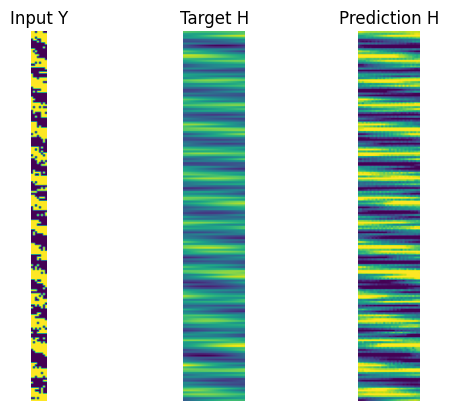

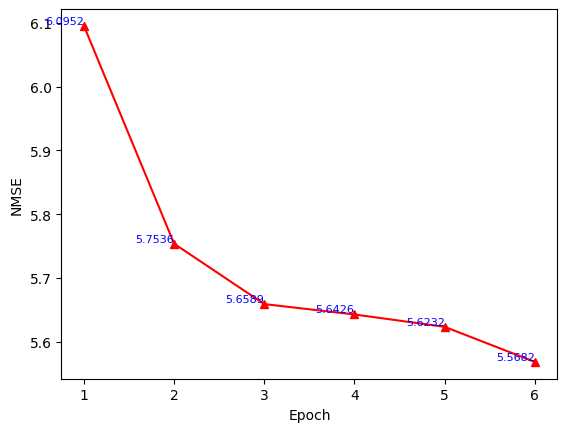

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 25.27087 , Discriminator loss: 0.31895623 , time: 0:20:32.175067
B/E: 103 / 6 , Generator loss: 19.299543 , Discriminator loss: 0.0019060248 , time: 0:20:46.433534
B/E: 206 / 6 , Generator loss: 17.245533 , Discriminator loss: 0.020240337 , time: 0:20:59.797287
B/E: 309 / 6 , Generator loss: 19.303577 , Discriminator loss: 0.0049363268 , time: 0:21:13.182969
B/E: 412 / 6 , Generator loss: 19.30153 , Discriminator loss: 0.045127414 , time: 0:21:26.530533
B/E: 515 / 6 , Generator loss: 17.202164 , Discriminator loss: 0.012337939 , time: 0:21:39.850708
B/E: 618 / 6 , Generator loss: 13.707086 , Discriminator loss: 0.30347368 , time: 0:21:52.847674
B/E: 721 / 6 , Generator loss: 15.255579 , Discriminator loss: 0.027070895 , time: 0:22:05.939055
B/E: 824 / 6 , Generator loss: 25.847546 , Discriminator loss: 2.0878685 , time: 0:22:18.990553
B/E: 927 / 6 , Generator loss: 19.329802 , Discriminator loss: 0.00438611 , time: 0:22:32.135941
B/E: 1030 / 

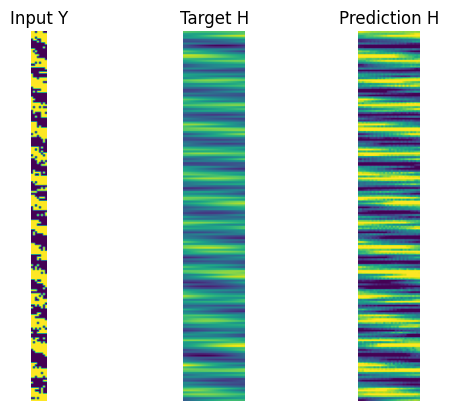

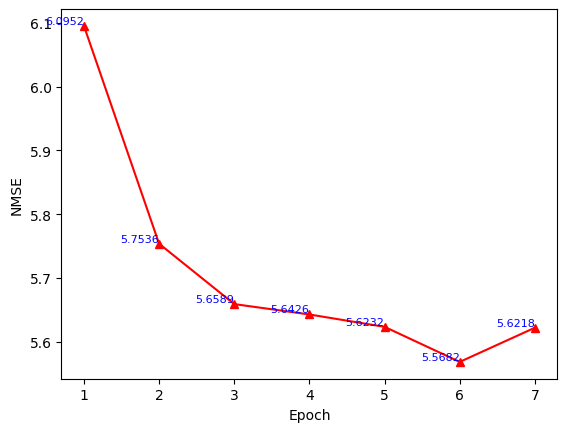

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 12.862816 , Discriminator loss: 6.473987 , time: 0:00:11.102222
B/E: 103 / 0 , Generator loss: 22.637325 , Discriminator loss: 0.0014788322 , time: 0:00:23.962073
B/E: 206 / 0 , Generator loss: 19.35176 , Discriminator loss: 0.0010673098 , time: 0:00:36.594296
B/E: 309 / 0 , Generator loss: 17.285746 , Discriminator loss: 0.012750858 , time: 0:00:49.461222
B/E: 412 / 0 , Generator loss: 20.428022 , Discriminator loss: 0.0009440505 , time: 0:01:02.387963
B/E: 515 / 0 , Generator loss: 18.550259 , Discriminator loss: 0.012859817 , time: 0:01:15.347660
B/E: 618 / 0 , Generator loss: 13.140259 , Discriminator loss: 1.0940078 , time: 0:01:29.270732
B/E: 721 / 0 , Generator loss: 17.450981 , Discriminator loss: 0.03679519 , time: 0:01:42.227358
B/E: 824 / 0 , Generator loss: 25.644066 , Discriminator loss: 0.24985172 , time: 0:01:54.572072
B/E: 927 / 0 , Generator loss: 20.522556 , Discriminator loss: 0.0008954393 , time: 0:02:07.496636
B/E: 1030 /

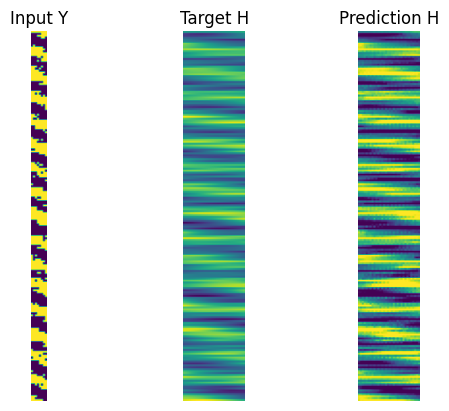

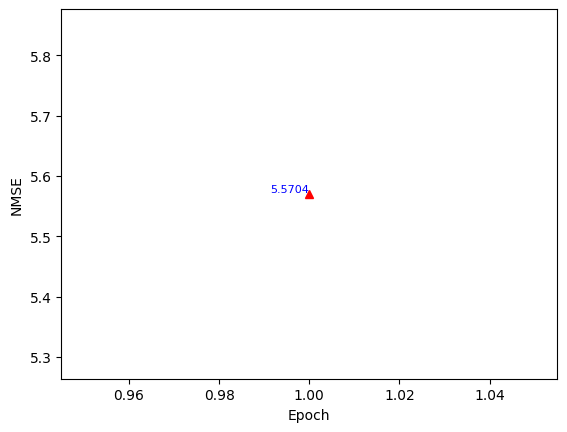

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 19.379913 , Discriminator loss: 0.011717415 , time: 0:03:35.228174
B/E: 103 / 1 , Generator loss: 16.153284 , Discriminator loss: 0.027045155 , time: 0:03:49.950310
B/E: 206 / 1 , Generator loss: 17.743565 , Discriminator loss: 0.003980771 , time: 0:04:03.150772
B/E: 309 / 1 , Generator loss: 15.908966 , Discriminator loss: 0.017296398 , time: 0:04:16.463672
B/E: 412 / 1 , Generator loss: 19.348154 , Discriminator loss: 0.0018322032 , time: 0:04:29.587352
B/E: 515 / 1 , Generator loss: 19.023731 , Discriminator loss: 0.003578797 , time: 0:04:42.768309
B/E: 618 / 1 , Generator loss: 21.180073 , Discriminator loss: 0.01211749 , time: 0:04:55.868344
B/E: 721 / 1 , Generator loss: 21.014278 , Discriminator loss: 0.0005857647 , time: 0:05:08.934503
B/E: 824 / 1 , Generator loss: 24.029278 , Discriminator loss: 0.0051164944 , time: 0:05:21.814165
B/E: 927 / 1 , Generator loss: 16.85667 , Discriminator loss: 0.014068696 , time: 0:05:34.176083
B/E: 1

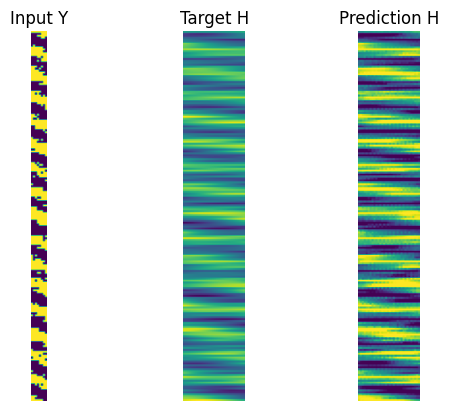

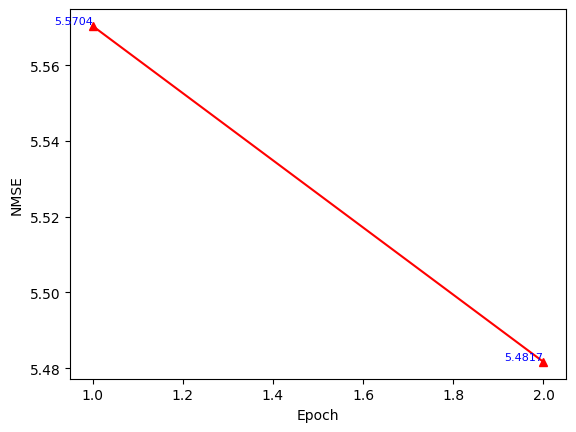

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 15.949679 , Discriminator loss: 0.03152607 , time: 0:06:59.867670
B/E: 103 / 2 , Generator loss: 20.245255 , Discriminator loss: 0.0016167022 , time: 0:07:13.026250
B/E: 206 / 2 , Generator loss: 14.339935 , Discriminator loss: 0.06671473 , time: 0:07:25.937759
B/E: 309 / 2 , Generator loss: 15.251966 , Discriminator loss: 0.111225225 , time: 0:07:38.749172
B/E: 412 / 2 , Generator loss: 19.284622 , Discriminator loss: 0.011195547 , time: 0:07:51.636866
B/E: 515 / 2 , Generator loss: 19.12689 , Discriminator loss: 0.09316764 , time: 0:08:04.172866
B/E: 618 / 2 , Generator loss: 17.785206 , Discriminator loss: 0.009153333 , time: 0:08:16.731484
B/E: 721 / 2 , Generator loss: 22.084602 , Discriminator loss: 0.00026666853 , time: 0:08:30.775901
B/E: 824 / 2 , Generator loss: 17.422438 , Discriminator loss: 0.004220847 , time: 0:08:43.518847
B/E: 927 / 2 , Generator loss: 11.361124 , Discriminator loss: 8.521708 , time: 0:08:56.459380
B/E: 1030 /

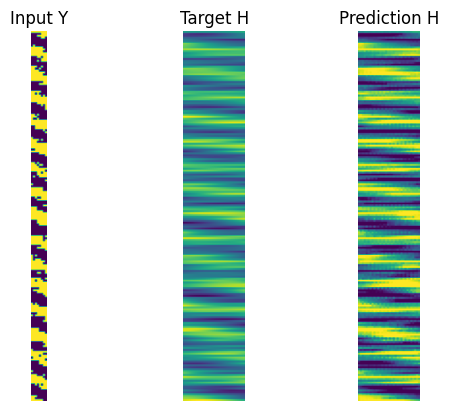

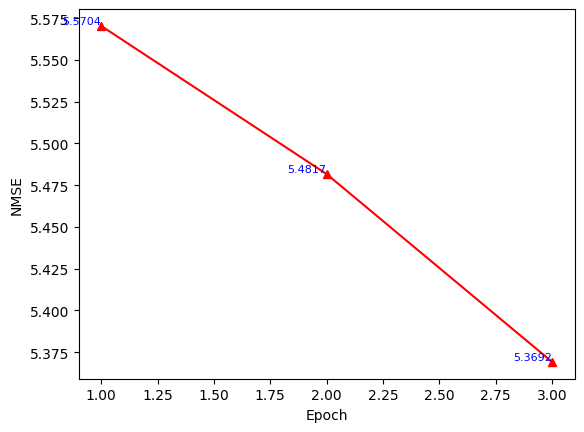

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 23.451412 , Discriminator loss: 0.0026867627 , time: 0:10:22.748772
B/E: 103 / 3 , Generator loss: 22.22183 , Discriminator loss: 0.037615933 , time: 0:10:35.607090
B/E: 206 / 3 , Generator loss: 18.15318 , Discriminator loss: 0.00712239 , time: 0:10:48.841143
B/E: 309 / 3 , Generator loss: 18.73088 , Discriminator loss: 0.030443108 , time: 0:11:01.160328
B/E: 412 / 3 , Generator loss: 20.15099 , Discriminator loss: 0.0009478753 , time: 0:11:13.701876
B/E: 515 / 3 , Generator loss: 20.231178 , Discriminator loss: 0.0015313274 , time: 0:11:26.401804
B/E: 618 / 3 , Generator loss: 21.96973 , Discriminator loss: 0.00031468738 , time: 0:11:38.957228
B/E: 721 / 3 , Generator loss: 18.91939 , Discriminator loss: 0.016047183 , time: 0:11:51.543993
B/E: 824 / 3 , Generator loss: 22.952568 , Discriminator loss: 0.23750341 , time: 0:12:04.080393
B/E: 927 / 3 , Generator loss: 20.733185 , Discriminator loss: 0.002194887 , time: 0:12:16.714723
B/E: 1030 

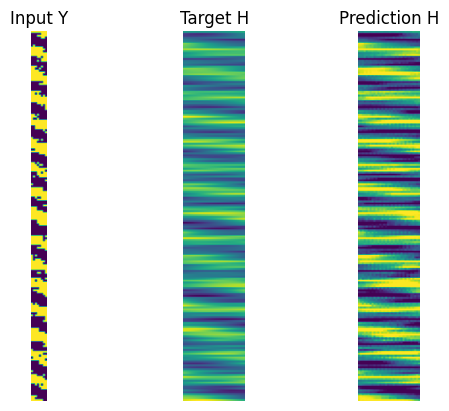

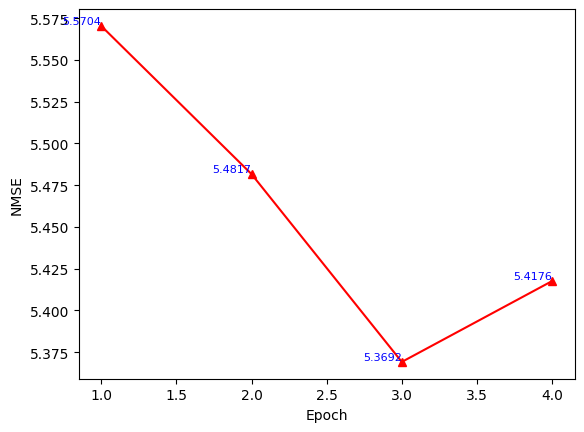

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 20.720592 , Discriminator loss: 0.0010497457 , time: 0:13:41.416447
B/E: 103 / 4 , Generator loss: 15.65144 , Discriminator loss: 0.027339993 , time: 0:13:54.639174
B/E: 206 / 4 , Generator loss: 21.313557 , Discriminator loss: 0.00041005402 , time: 0:14:07.538609
B/E: 309 / 4 , Generator loss: 20.771969 , Discriminator loss: 0.0005924907 , time: 0:14:20.495468
B/E: 412 / 4 , Generator loss: 20.83573 , Discriminator loss: 0.00041703662 , time: 0:14:33.070087
B/E: 515 / 4 , Generator loss: 23.474983 , Discriminator loss: 0.009043479 , time: 0:14:45.653476
B/E: 618 / 4 , Generator loss: 19.14031 , Discriminator loss: 0.0011526358 , time: 0:14:58.220238
B/E: 721 / 4 , Generator loss: 21.5139 , Discriminator loss: 0.0033945532 , time: 0:15:10.639495
B/E: 824 / 4 , Generator loss: 17.630817 , Discriminator loss: 0.0008769349 , time: 0:15:23.126246
B/E: 927 / 4 , Generator loss: 20.456356 , Discriminator loss: 0.018539075 , time: 0:15:36.902713
B/E

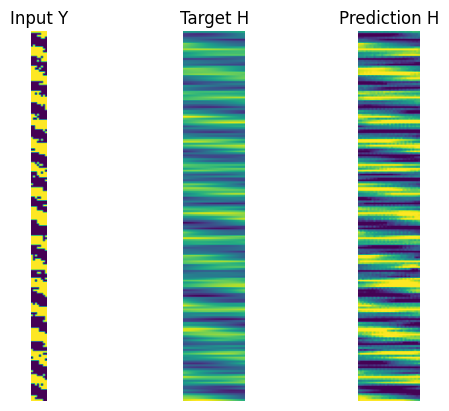

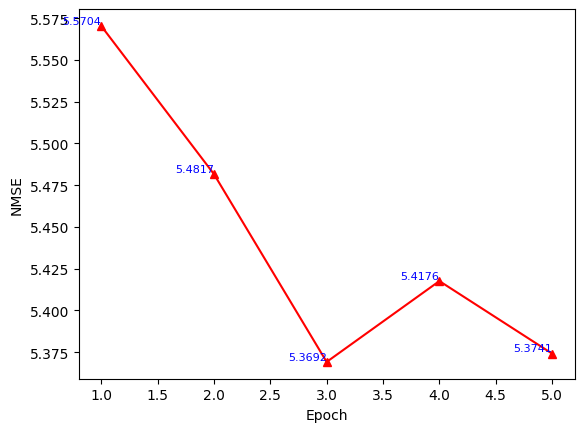

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 15.879616 , Discriminator loss: 0.1393978 , time: 0:17:02.780108
B/E: 103 / 5 , Generator loss: 19.420815 , Discriminator loss: 0.00057447556 , time: 0:17:16.119250
B/E: 206 / 5 , Generator loss: 21.589924 , Discriminator loss: 0.00024233916 , time: 0:17:29.241861
B/E: 309 / 5 , Generator loss: 19.752113 , Discriminator loss: 0.17541663 , time: 0:17:42.338261
B/E: 412 / 5 , Generator loss: 16.83928 , Discriminator loss: 0.023419717 , time: 0:17:56.789584
B/E: 515 / 5 , Generator loss: 18.317944 , Discriminator loss: 0.24964902 , time: 0:18:09.656671
B/E: 618 / 5 , Generator loss: 21.723003 , Discriminator loss: 0.0048117046 , time: 0:18:22.598677
B/E: 721 / 5 , Generator loss: 19.696783 , Discriminator loss: 0.00079055945 , time: 0:18:35.446887
B/E: 824 / 5 , Generator loss: 17.97244 , Discriminator loss: 0.042064033 , time: 0:18:48.492348
B/E: 927 / 5 , Generator loss: 21.148565 , Discriminator loss: 0.0013694519 , time: 0:19:01.342766
B/E: 

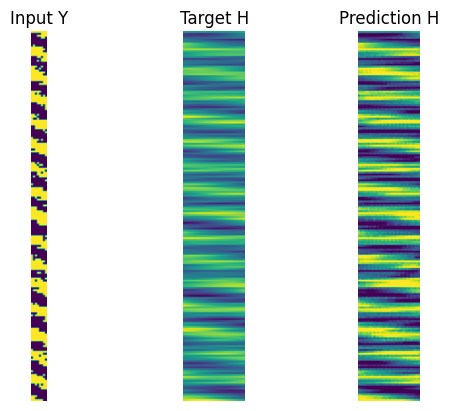

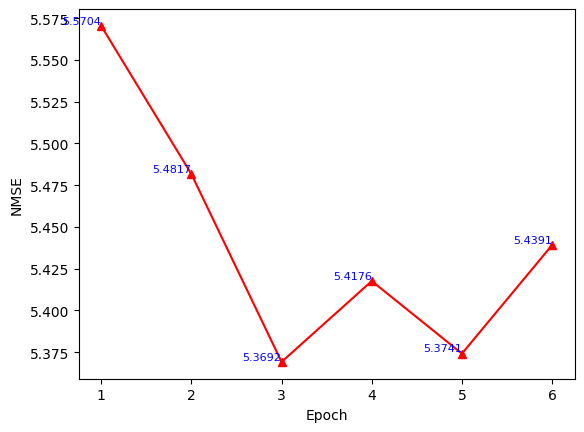

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 14.600727 , Discriminator loss: 0.19428828 , time: 0:20:28.056315
B/E: 103 / 6 , Generator loss: 21.004566 , Discriminator loss: 0.014155281 , time: 0:20:41.256563
B/E: 206 / 6 , Generator loss: 15.468841 , Discriminator loss: 0.14038952 , time: 0:20:54.469276
B/E: 309 / 6 , Generator loss: 19.856205 , Discriminator loss: 0.0017055636 , time: 0:21:07.302756
B/E: 412 / 6 , Generator loss: 15.621407 , Discriminator loss: 0.16350502 , time: 0:21:20.190900
B/E: 515 / 6 , Generator loss: 22.292036 , Discriminator loss: 0.012806448 , time: 0:21:32.977528
B/E: 618 / 6 , Generator loss: 20.640745 , Discriminator loss: 0.0007234408 , time: 0:21:45.577746
B/E: 721 / 6 , Generator loss: 17.564629 , Discriminator loss: 0.03487329 , time: 0:21:58.442368
B/E: 824 / 6 , Generator loss: 24.587852 , Discriminator loss: 0.36350924 , time: 0:22:11.315731
B/E: 927 / 6 , Generator loss: 18.336042 , Discriminator loss: 0.003783427 , time: 0:22:24.551514
B/E: 1030 

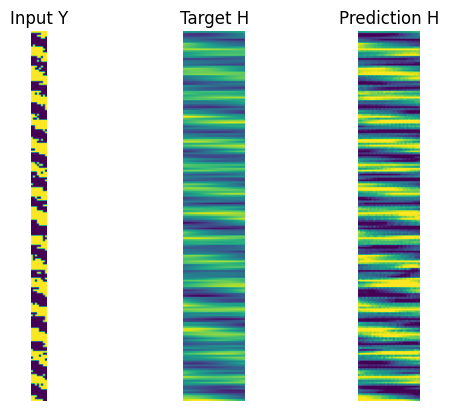

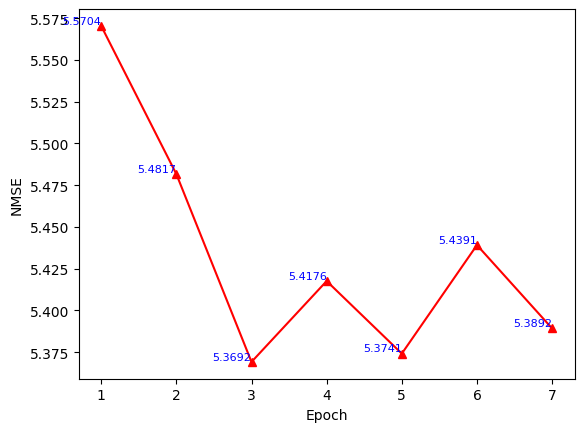

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 20.639889 , Discriminator loss: 0.04928475 , time: 0:00:07.316585
B/E: 103 / 0 , Generator loss: 19.720251 , Discriminator loss: 0.001237313 , time: 0:00:20.207726
B/E: 206 / 0 , Generator loss: 20.147104 , Discriminator loss: 0.0043932707 , time: 0:00:33.316005
B/E: 309 / 0 , Generator loss: 19.888908 , Discriminator loss: 0.001536218 , time: 0:00:46.326015
B/E: 412 / 0 , Generator loss: 25.18127 , Discriminator loss: 1.2080011 , time: 0:01:00.438438
B/E: 515 / 0 , Generator loss: 20.241093 , Discriminator loss: 0.022419013 , time: 0:01:13.735883
B/E: 618 / 0 , Generator loss: 21.832813 , Discriminator loss: 0.0004821507 , time: 0:01:27.062146
B/E: 721 / 0 , Generator loss: 20.0718 , Discriminator loss: 0.0016334067 , time: 0:01:40.346470
B/E: 824 / 0 , Generator loss: 22.864822 , Discriminator loss: 0.0017481304 , time: 0:01:53.134059
B/E: 927 / 0 , Generator loss: 21.286694 , Discriminator loss: 0.00063387677 , time: 0:02:05.587495
B/E: 10

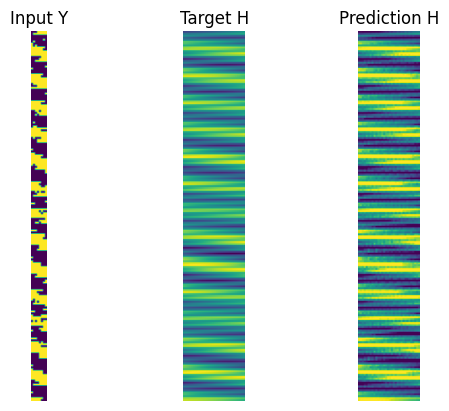

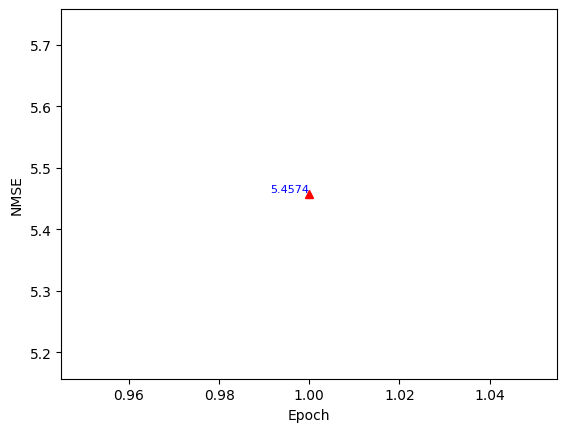

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 16.060392 , Discriminator loss: 0.05933589 , time: 0:03:31.241065
B/E: 103 / 1 , Generator loss: 21.712448 , Discriminator loss: 0.00037026606 , time: 0:03:44.697694
B/E: 206 / 1 , Generator loss: 16.26726 , Discriminator loss: 0.03524038 , time: 0:03:57.847563
B/E: 309 / 1 , Generator loss: 19.485798 , Discriminator loss: 0.0010834471 , time: 0:04:10.811593
B/E: 412 / 1 , Generator loss: 18.413174 , Discriminator loss: 0.003330686 , time: 0:04:23.958756
B/E: 515 / 1 , Generator loss: 17.090055 , Discriminator loss: 0.06599019 , time: 0:04:37.330902
B/E: 618 / 1 , Generator loss: 19.719355 , Discriminator loss: 0.0036449262 , time: 0:04:50.819050
B/E: 721 / 1 , Generator loss: 18.260601 , Discriminator loss: 0.019422881 , time: 0:05:04.087698
B/E: 824 / 1 , Generator loss: 19.806797 , Discriminator loss: 0.0017484555 , time: 0:05:17.452797
B/E: 927 / 1 , Generator loss: 21.093689 , Discriminator loss: 0.048570663 , time: 0:05:30.495732
B/E: 1

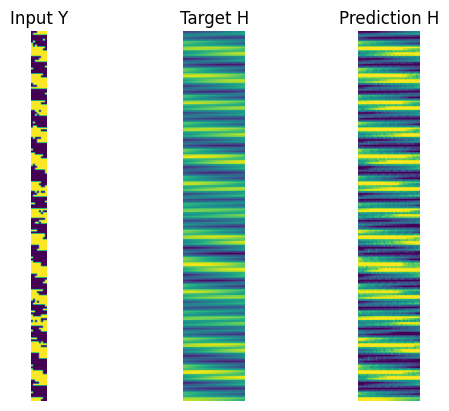

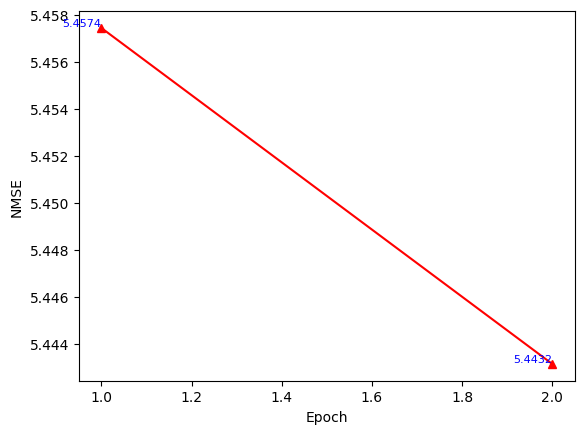

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 24.860552 , Discriminator loss: 0.012390666 , time: 0:06:55.974310
B/E: 103 / 2 , Generator loss: 16.355377 , Discriminator loss: 0.013797276 , time: 0:07:08.751700
B/E: 206 / 2 , Generator loss: 22.10737 , Discriminator loss: 0.00024065252 , time: 0:07:21.650907
B/E: 309 / 2 , Generator loss: 20.390331 , Discriminator loss: 0.00020031804 , time: 0:07:34.853105
B/E: 412 / 2 , Generator loss: 27.76426 , Discriminator loss: 2.0080988 , time: 0:07:47.751521
B/E: 515 / 2 , Generator loss: 19.802685 , Discriminator loss: 0.0007822348 , time: 0:08:01.197483
B/E: 618 / 2 , Generator loss: 22.143347 , Discriminator loss: 0.00024124162 , time: 0:08:13.743976
B/E: 721 / 2 , Generator loss: 19.556927 , Discriminator loss: 0.0012479876 , time: 0:08:26.322372
B/E: 824 / 2 , Generator loss: 15.810084 , Discriminator loss: 0.07668501 , time: 0:08:39.122325
B/E: 927 / 2 , Generator loss: 17.7168 , Discriminator loss: 0.02014522 , time: 0:08:52.008127
B/E: 10

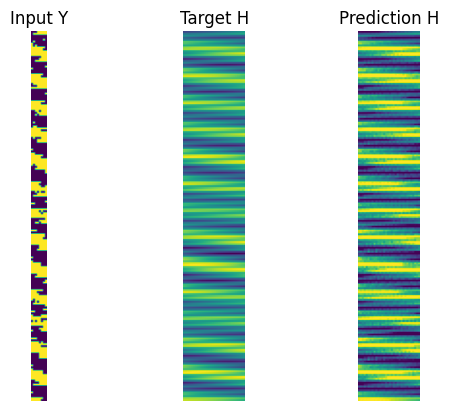

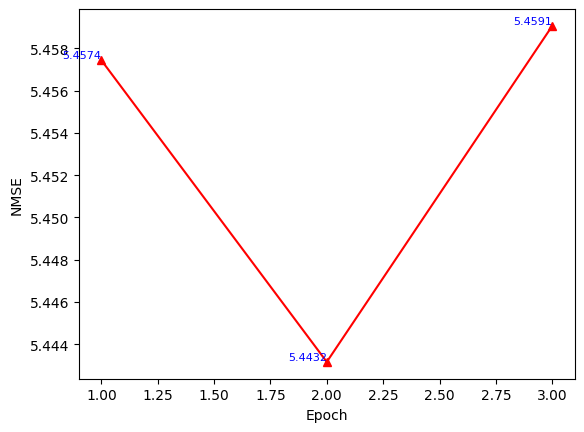

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 23.742271 , Discriminator loss: 0.00077814836 , time: 0:10:19.086707
B/E: 103 / 3 , Generator loss: 23.00392 , Discriminator loss: 0.0007574544 , time: 0:10:33.069054
B/E: 206 / 3 , Generator loss: 20.141834 , Discriminator loss: 0.0002996255 , time: 0:10:46.211006
B/E: 309 / 3 , Generator loss: 20.091331 , Discriminator loss: 0.031160265 , time: 0:10:59.370880
B/E: 412 / 3 , Generator loss: 18.107092 , Discriminator loss: 0.002480279 , time: 0:11:12.426561
B/E: 515 / 3 , Generator loss: 19.950832 , Discriminator loss: 0.006138926 , time: 0:11:25.517649
B/E: 618 / 3 , Generator loss: 17.373377 , Discriminator loss: 0.010826255 , time: 0:11:38.522443
B/E: 721 / 3 , Generator loss: 28.194004 , Discriminator loss: 0.13307159 , time: 0:11:51.689041
B/E: 824 / 3 , Generator loss: 17.66219 , Discriminator loss: 0.0060942373 , time: 0:12:04.527329
B/E: 927 / 3 , Generator loss: 20.799137 , Discriminator loss: 0.004167489 , time: 0:12:17.256527
B/E: 

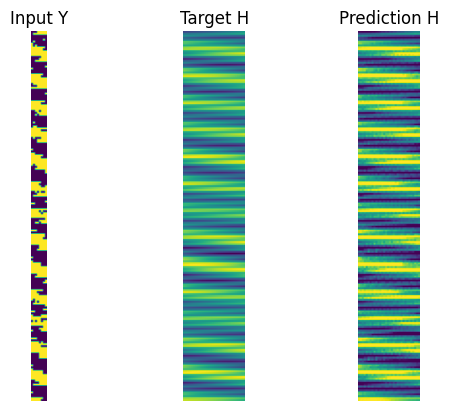

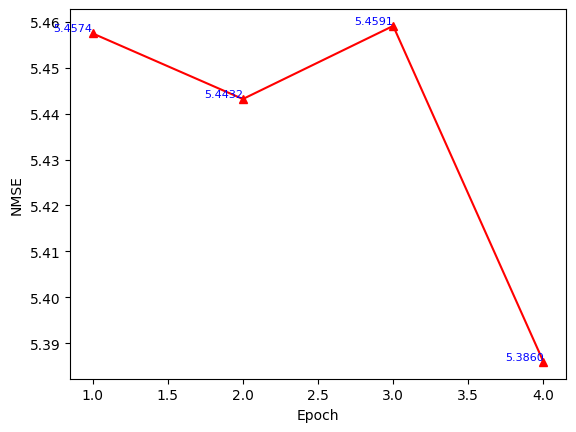

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 17.620964 , Discriminator loss: 0.027160082 , time: 0:13:43.572883
B/E: 103 / 4 , Generator loss: 17.881882 , Discriminator loss: 0.016776573 , time: 0:13:56.791443
B/E: 206 / 4 , Generator loss: 19.66212 , Discriminator loss: 0.001197491 , time: 0:14:09.826627
B/E: 309 / 4 , Generator loss: 19.709354 , Discriminator loss: 0.00088920793 , time: 0:14:23.071552
B/E: 412 / 4 , Generator loss: 19.77221 , Discriminator loss: 0.000516035 , time: 0:14:35.998432
B/E: 515 / 4 , Generator loss: 22.300995 , Discriminator loss: 0.00014227381 , time: 0:14:48.856072
B/E: 618 / 4 , Generator loss: 17.60571 , Discriminator loss: 0.044031605 , time: 0:15:02.243007
B/E: 721 / 4 , Generator loss: 19.342026 , Discriminator loss: 0.0025788434 , time: 0:15:16.629169
B/E: 824 / 4 , Generator loss: 17.727627 , Discriminator loss: 0.008853855 , time: 0:15:29.978986
B/E: 927 / 4 , Generator loss: 20.950695 , Discriminator loss: 0.0019366997 , time: 0:15:43.100927
B/E:

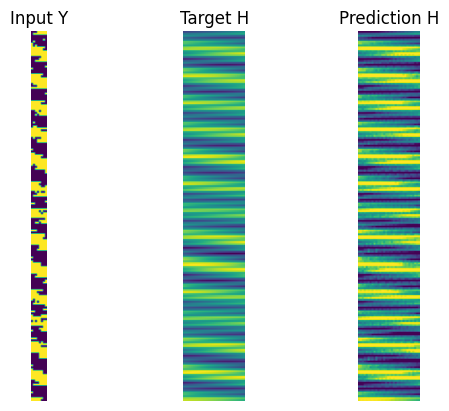

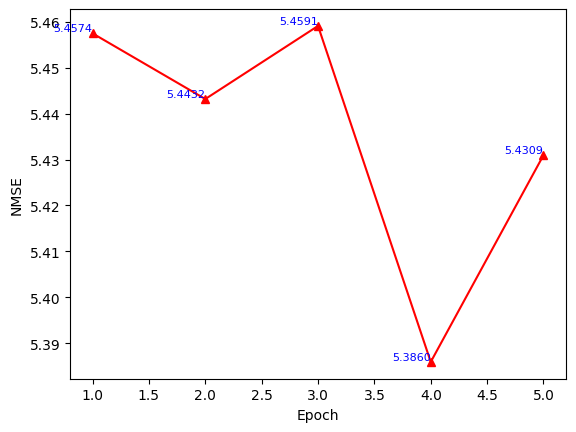

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 21.974434 , Discriminator loss: 0.00052155205 , time: 0:17:09.745818
B/E: 103 / 5 , Generator loss: 19.49081 , Discriminator loss: 0.0011588 , time: 0:17:23.189327
B/E: 206 / 5 , Generator loss: 17.761358 , Discriminator loss: 0.01124333 , time: 0:17:37.041165
B/E: 309 / 5 , Generator loss: 21.490875 , Discriminator loss: 0.0003408081 , time: 0:17:49.799714
B/E: 412 / 5 , Generator loss: 20.495892 , Discriminator loss: 0.00065065385 , time: 0:18:02.593756
B/E: 515 / 5 , Generator loss: 19.686966 , Discriminator loss: 0.0021291 , time: 0:18:15.365976
B/E: 618 / 5 , Generator loss: 20.245916 , Discriminator loss: 0.042680565 , time: 0:18:28.388911
B/E: 721 / 5 , Generator loss: 20.756046 , Discriminator loss: 0.00084188825 , time: 0:18:41.315455
B/E: 824 / 5 , Generator loss: 18.521587 , Discriminator loss: 0.12184145 , time: 0:18:54.039621
B/E: 927 / 5 , Generator loss: 22.394943 , Discriminator loss: 0.0018290466 , time: 0:19:06.606443
B/E: 1

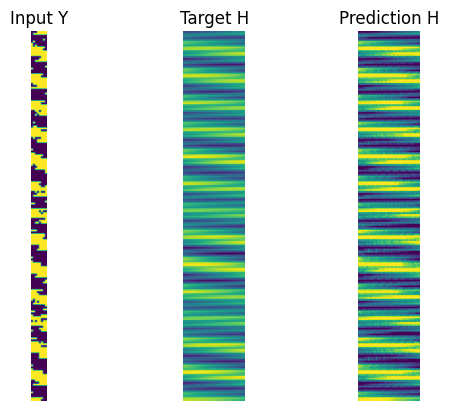

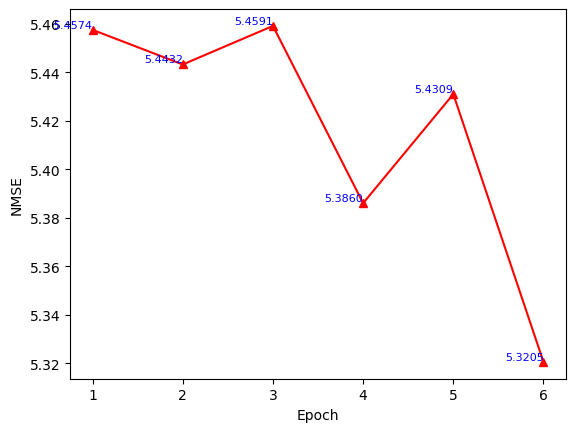

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 22.437479 , Discriminator loss: 0.0015673285 , time: 0:20:32.993441
B/E: 103 / 6 , Generator loss: 17.196327 , Discriminator loss: 0.034793593 , time: 0:20:45.842640
B/E: 206 / 6 , Generator loss: 19.728449 , Discriminator loss: 0.0004356691 , time: 0:20:58.963606
B/E: 309 / 6 , Generator loss: 20.089945 , Discriminator loss: 0.0030544382 , time: 0:21:11.894952
B/E: 412 / 6 , Generator loss: 22.68718 , Discriminator loss: 0.002390352 , time: 0:21:24.648130
B/E: 515 / 6 , Generator loss: 19.168892 , Discriminator loss: 0.002381367 , time: 0:21:37.410073
B/E: 618 / 6 , Generator loss: 30.75645 , Discriminator loss: 2.3067865 , time: 0:21:50.109430
B/E: 721 / 6 , Generator loss: 20.501158 , Discriminator loss: 0.0015758174 , time: 0:22:03.109245
B/E: 824 / 6 , Generator loss: 20.722551 , Discriminator loss: 0.0029812388 , time: 0:22:16.868276
B/E: 927 / 6 , Generator loss: 21.166056 , Discriminator loss: 0.00047960636 , time: 0:22:29.635673
B/E:

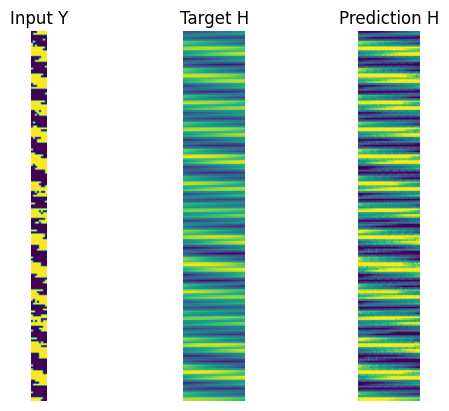

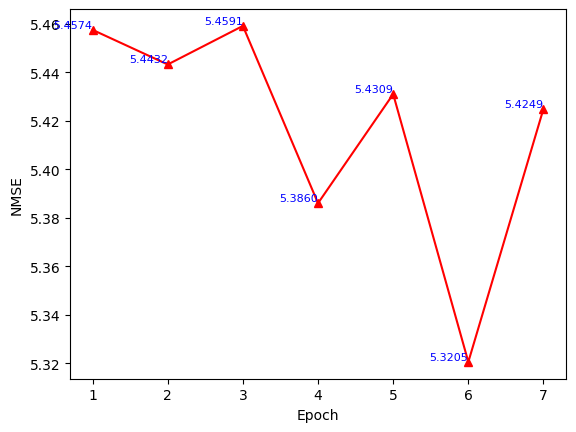

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 28.32368 , Discriminator loss: 0.13031016 , time: 0:00:10.672323
B/E: 103 / 0 , Generator loss: 21.247196 , Discriminator loss: 0.004945041 , time: 0:00:24.016220
B/E: 206 / 0 , Generator loss: 18.792559 , Discriminator loss: 0.005849116 , time: 0:00:37.893177
B/E: 309 / 0 , Generator loss: 21.622385 , Discriminator loss: 0.012479698 , time: 0:00:51.235924
B/E: 412 / 0 , Generator loss: 24.479168 , Discriminator loss: 0.0001339995 , time: 0:01:04.023317
B/E: 515 / 0 , Generator loss: 23.36467 , Discriminator loss: 0.00045691247 , time: 0:01:17.035753
B/E: 618 / 0 , Generator loss: 18.066933 , Discriminator loss: 0.0026069013 , time: 0:01:30.072755
B/E: 721 / 0 , Generator loss: 20.862064 , Discriminator loss: 0.000313035 , time: 0:01:43.173633
B/E: 824 / 0 , Generator loss: 20.554138 , Discriminator loss: 0.0017119797 , time: 0:01:56.015990
B/E: 927 / 0 , Generator loss: 21.139305 , Discriminator loss: 0.00046337748 , time: 0:02:08.686888
B/E

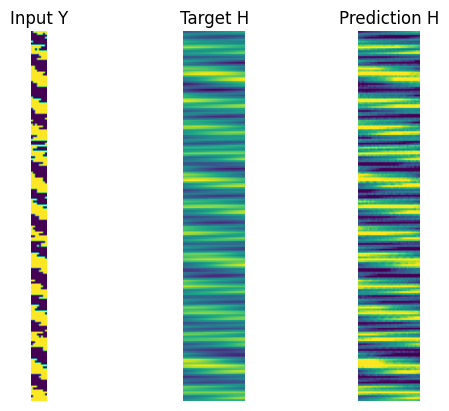

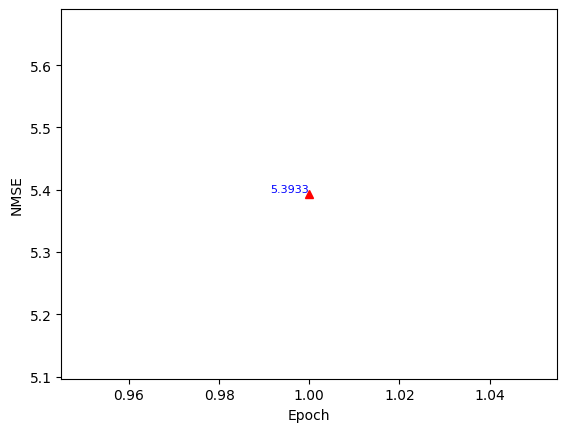

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 21.904278 , Discriminator loss: 0.00021453148 , time: 0:03:33.334255
B/E: 103 / 1 , Generator loss: 20.99899 , Discriminator loss: 0.00020539589 , time: 0:03:45.797925
B/E: 206 / 1 , Generator loss: 22.548817 , Discriminator loss: 0.0011658495 , time: 0:03:58.042508
B/E: 309 / 1 , Generator loss: 21.635078 , Discriminator loss: 0.005815838 , time: 0:04:10.609868
B/E: 412 / 1 , Generator loss: 21.39101 , Discriminator loss: 0.001851089 , time: 0:04:23.118099
B/E: 515 / 1 , Generator loss: 18.614956 , Discriminator loss: 0.010449571 , time: 0:04:35.098932
B/E: 618 / 1 , Generator loss: 19.86728 , Discriminator loss: 0.0008291767 , time: 0:04:47.297448
B/E: 721 / 1 , Generator loss: 20.509354 , Discriminator loss: 0.0007272882 , time: 0:04:59.702148
B/E: 824 / 1 , Generator loss: 18.71758 , Discriminator loss: 0.24209863 , time: 0:05:12.274906
B/E: 927 / 1 , Generator loss: 23.59976 , Discriminator loss: 0.13497487 , time: 0:05:25.742642
B/E: 10

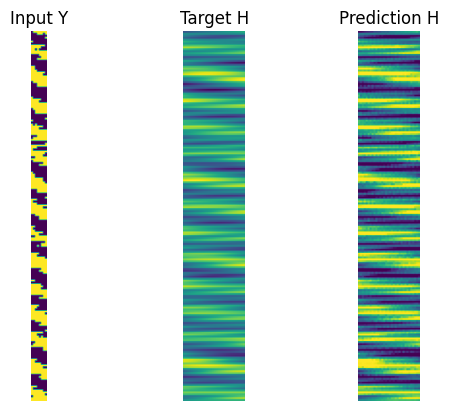

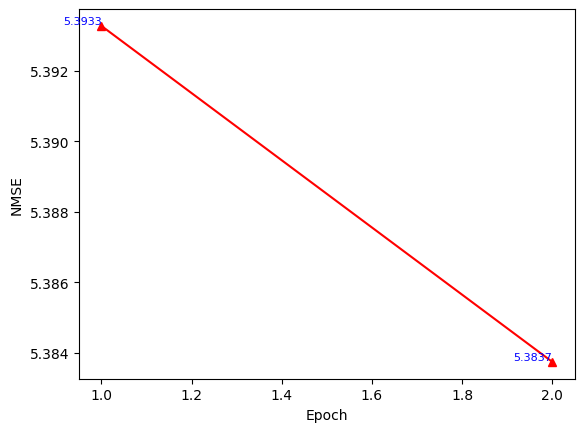

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 21.501286 , Discriminator loss: 0.00076277304 , time: 0:06:52.525815
B/E: 103 / 2 , Generator loss: 21.24134 , Discriminator loss: 0.00046313592 , time: 0:07:05.901825
B/E: 206 / 2 , Generator loss: 21.515684 , Discriminator loss: 0.00042745034 , time: 0:07:19.134590
B/E: 309 / 2 , Generator loss: 18.268736 , Discriminator loss: 0.006968312 , time: 0:07:31.314776
B/E: 412 / 2 , Generator loss: 20.038624 , Discriminator loss: 0.00045527235 , time: 0:07:45.645489
B/E: 515 / 2 , Generator loss: 22.916786 , Discriminator loss: 0.00010106794 , time: 0:07:58.873289
B/E: 618 / 2 , Generator loss: 20.246288 , Discriminator loss: 0.00016807497 , time: 0:08:12.320259
B/E: 721 / 2 , Generator loss: 21.929527 , Discriminator loss: 0.00080898026 , time: 0:08:25.364093
B/E: 824 / 2 , Generator loss: 22.633785 , Discriminator loss: 0.009882218 , time: 0:08:38.485543
B/E: 927 / 2 , Generator loss: 26.990055 , Discriminator loss: 0.0012313736 , time: 0:08:51.

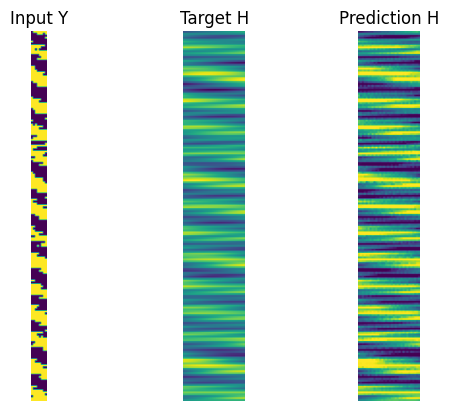

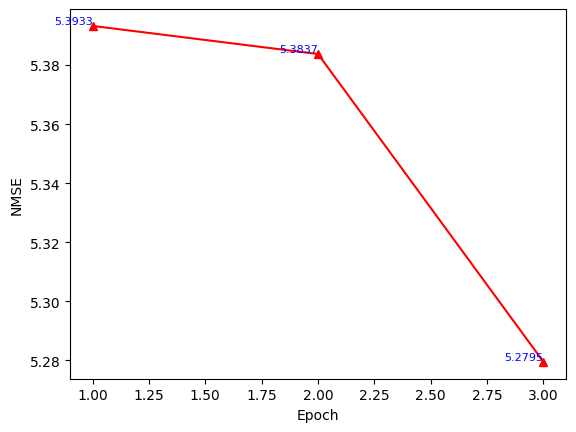

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 22.068954 , Discriminator loss: 0.00017398619 , time: 0:10:19.509404
B/E: 103 / 3 , Generator loss: 18.145458 , Discriminator loss: 0.0049126577 , time: 0:10:32.912381
B/E: 206 / 3 , Generator loss: 15.354579 , Discriminator loss: 0.04409228 , time: 0:10:46.660561
B/E: 309 / 3 , Generator loss: 22.265919 , Discriminator loss: 9.115569e-05 , time: 0:10:59.264036
B/E: 412 / 3 , Generator loss: 12.726102 , Discriminator loss: 1.8220007 , time: 0:11:12.787908
B/E: 515 / 3 , Generator loss: 21.392551 , Discriminator loss: 0.00029931747 , time: 0:11:25.985490
B/E: 618 / 3 , Generator loss: 28.54937 , Discriminator loss: 2.3988514 , time: 0:11:39.039709
B/E: 721 / 3 , Generator loss: 17.61344 , Discriminator loss: 0.022376029 , time: 0:11:51.465512
B/E: 824 / 3 , Generator loss: 21.528149 , Discriminator loss: 0.0013667409 , time: 0:12:03.873213
B/E: 927 / 3 , Generator loss: 14.77779 , Discriminator loss: 0.045318514 , time: 0:12:16.602841
B/E: 103

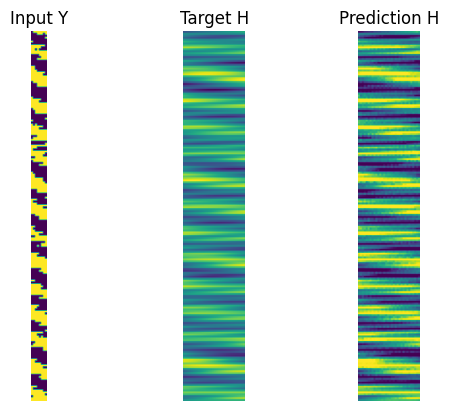

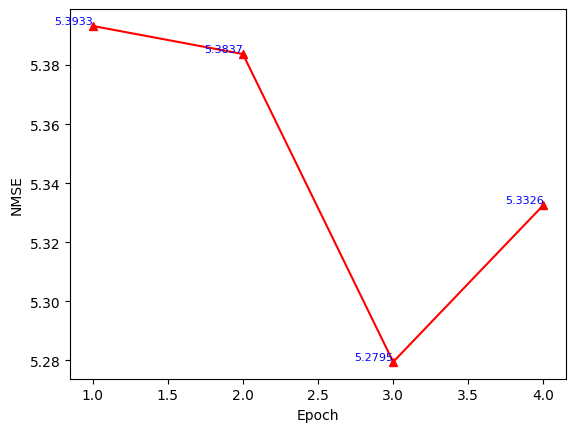

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 22.636715 , Discriminator loss: 0.00023946376 , time: 0:13:42.636038
B/E: 103 / 4 , Generator loss: 21.195446 , Discriminator loss: 0.00038527156 , time: 0:13:55.464207
B/E: 206 / 4 , Generator loss: 19.833067 , Discriminator loss: 0.0014052283 , time: 0:14:08.162835
B/E: 309 / 4 , Generator loss: 16.848684 , Discriminator loss: 0.025543196 , time: 0:14:21.434409
B/E: 412 / 4 , Generator loss: 23.655582 , Discriminator loss: 0.00010924942 , time: 0:14:34.732190
B/E: 515 / 4 , Generator loss: 16.009693 , Discriminator loss: 0.07456114 , time: 0:14:48.421409
B/E: 618 / 4 , Generator loss: 20.361523 , Discriminator loss: 0.0038616192 , time: 0:15:01.509269
B/E: 721 / 4 , Generator loss: 13.654565 , Discriminator loss: 0.4953285 , time: 0:15:14.221782
B/E: 824 / 4 , Generator loss: 20.025574 , Discriminator loss: 0.000471505 , time: 0:15:26.780142
B/E: 927 / 4 , Generator loss: 19.99419 , Discriminator loss: 0.00075172103 , time: 0:15:39.275873
B

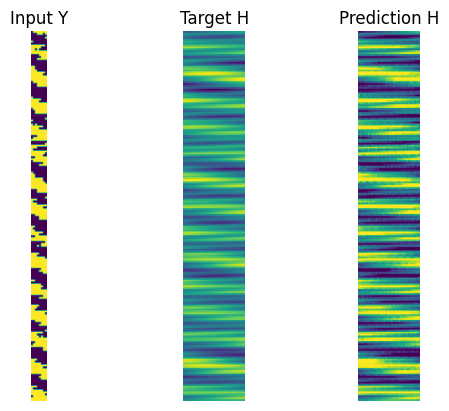

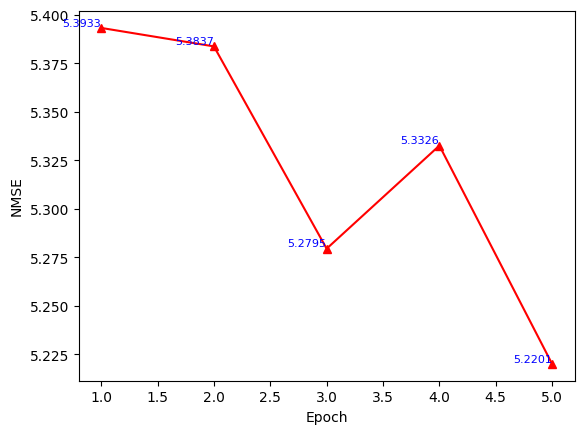

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 23.997684 , Discriminator loss: 0.009160795 , time: 0:17:02.409765
B/E: 103 / 5 , Generator loss: 19.622684 , Discriminator loss: 0.0029288474 , time: 0:17:15.859280
B/E: 206 / 5 , Generator loss: 17.157778 , Discriminator loss: 0.016079487 , time: 0:17:28.264781
B/E: 309 / 5 , Generator loss: 18.72315 , Discriminator loss: 0.004517532 , time: 0:17:40.564628
B/E: 412 / 5 , Generator loss: 19.19885 , Discriminator loss: 0.0015211834 , time: 0:17:53.110231
B/E: 515 / 5 , Generator loss: 20.124214 , Discriminator loss: 0.003515649 , time: 0:18:05.447645
B/E: 618 / 5 , Generator loss: 22.168743 , Discriminator loss: 0.00015720284 , time: 0:18:17.723028
B/E: 721 / 5 , Generator loss: 22.415302 , Discriminator loss: 0.00013511427 , time: 0:18:30.099106
B/E: 824 / 5 , Generator loss: 20.491888 , Discriminator loss: 0.013191689 , time: 0:18:42.513887
B/E: 927 / 5 , Generator loss: 20.16535 , Discriminator loss: 0.0019670357 , time: 0:18:55.167630
B/E

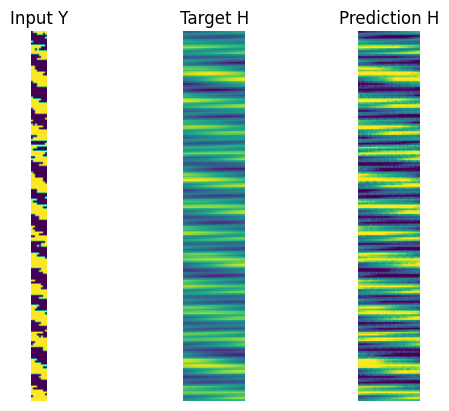

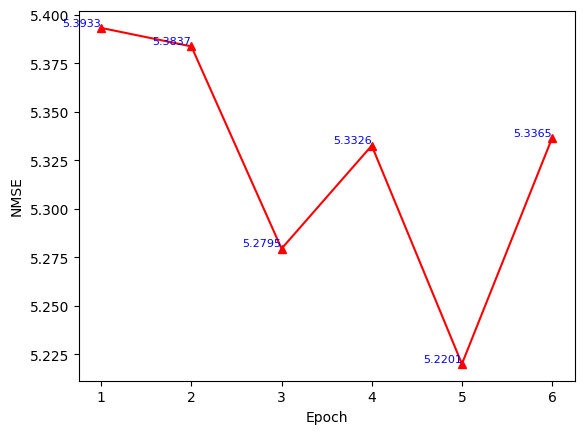

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 18.375713 , Discriminator loss: 0.0063107694 , time: 0:20:19.222612
B/E: 103 / 6 , Generator loss: 24.31076 , Discriminator loss: 0.52925014 , time: 0:20:32.337940
B/E: 206 / 6 , Generator loss: 25.082504 , Discriminator loss: 0.0056187757 , time: 0:20:45.290144
B/E: 309 / 6 , Generator loss: 13.814001 , Discriminator loss: 0.9776058 , time: 0:20:58.406052
B/E: 412 / 6 , Generator loss: 23.279922 , Discriminator loss: 0.00022745677 , time: 0:21:11.413433
B/E: 515 / 6 , Generator loss: 21.289928 , Discriminator loss: 0.0009314016 , time: 0:21:24.373569
B/E: 618 / 6 , Generator loss: 20.196407 , Discriminator loss: 0.00044104204 , time: 0:21:37.325531
B/E: 721 / 6 , Generator loss: 20.726826 , Discriminator loss: 0.021253124 , time: 0:21:49.824250
B/E: 824 / 6 , Generator loss: 20.913174 , Discriminator loss: 0.0006568113 , time: 0:22:04.029642
B/E: 927 / 6 , Generator loss: 21.11241 , Discriminator loss: 0.00026505266 , time: 0:22:16.229121
B/

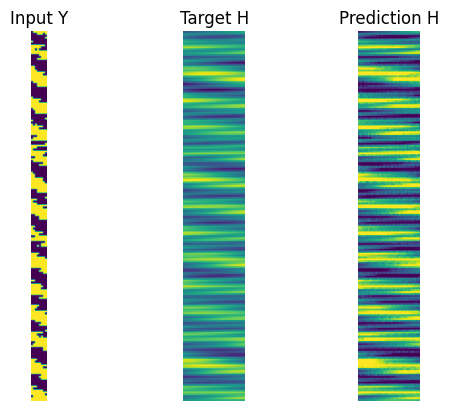

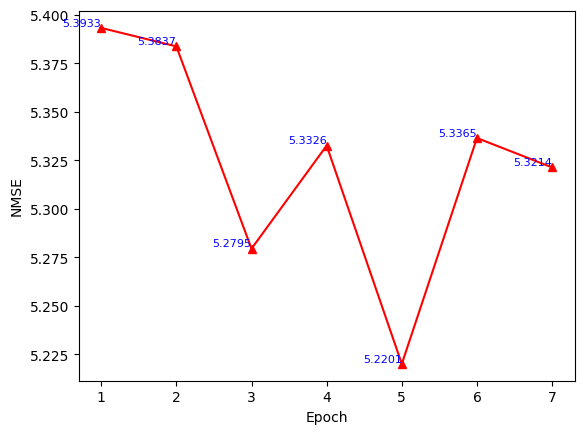

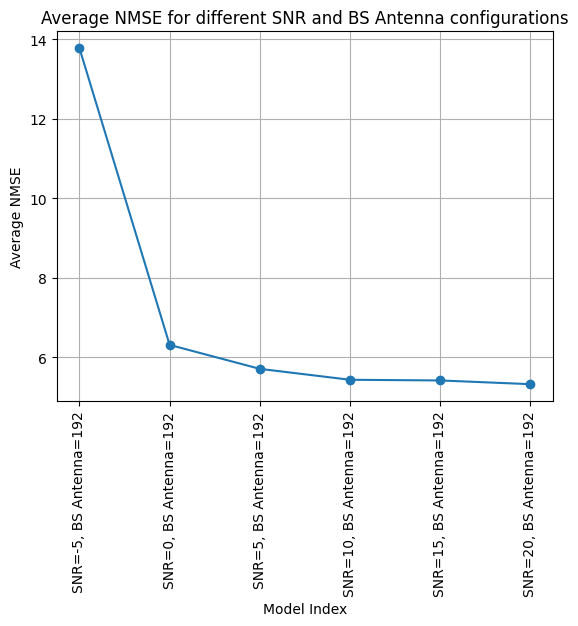

In [ ]:
if __name__ == "__main__":
    snr_list = [-5, 0, 5, 10, 15, 20]
    bs_ant_list = [192]
    avg_nmse = train(epochs=7, snr_list=snr_list, bs_ant_list=bs_ant_list)

    plt.plot(avg_nmse, marker='o')
    plt.xlabel('Model Index')
    plt.ylabel('Average NMSE')
    plt.title('Average NMSE for different SNR and BS Antenna configurations')
    plt.xticks(ticks=range(len(avg_nmse)), labels=[f'SNR={snr}, BS Antenna={bs_ant}' for snr in snr_list for bs_ant in bs_ant_list])
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()

##Main Function

For 256 antennas at the Base Station(BS)

For each set of antennas, we vary the SNR ranging from -5 to 20. We can test over higher SNR values too.

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 59.7477 , Discriminator loss: 1.3838346 , time: 0:00:03.632013
B/E: 103 / 0 , Generator loss: 34.78308 , Discriminator loss: 1.3850904 , time: 0:00:18.980247
B/E: 206 / 0 , Generator loss: 34.474445 , Discriminator loss: 1.2282276 , time: 0:00:31.729552
B/E: 309 / 0 , Generator loss: 34.44059 , Discriminator loss: 0.11853556 , time: 0:00:44.490137
B/E: 412 / 0 , Generator loss: 38.81523 , Discriminator loss: 0.2958981 , time: 0:00:57.315058
B/E: 515 / 0 , Generator loss: 38.78002 , Discriminator loss: 0.101875514 , time: 0:01:10.563840
B/E: 618 / 0 , Generator loss: 34.960262 , Discriminator loss: 1.720561 , time: 0:01:23.393149
B/E: 721 / 0 , Generator loss: 35.56197 , Discriminator loss: 0.24105364 , time: 0:01:36.613548
B/E: 824 / 0 , Generator loss: 34.905285 , Discriminator loss: 0.9942221 , time: 0:01:49.243669
B/E: 927 / 0 , Generator loss: 37.128258 , Discriminator loss: 0.4303204 , time: 0:02:02.861815
B/E: 1030 / 0 , Generator loss:

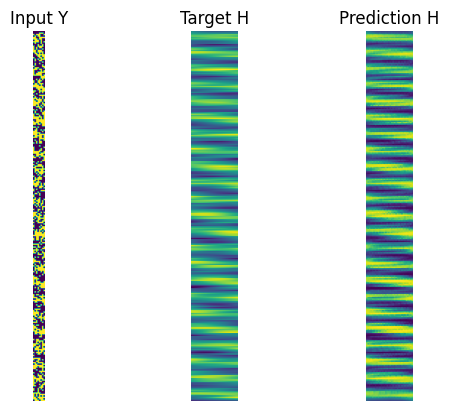

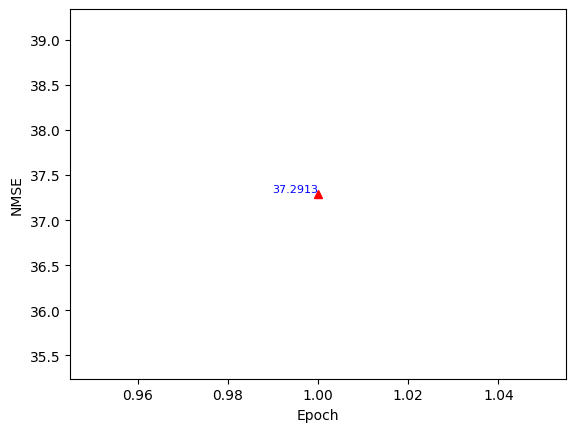

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 37.95667 , Discriminator loss: 0.4929883 , time: 0:03:28.846951
B/E: 103 / 1 , Generator loss: 33.5666 , Discriminator loss: 0.2789381 , time: 0:03:41.594061
B/E: 206 / 1 , Generator loss: 33.184566 , Discriminator loss: 0.44725585 , time: 0:03:54.312612
B/E: 309 / 1 , Generator loss: 36.15765 , Discriminator loss: 0.993256 , time: 0:04:06.978599
B/E: 412 / 1 , Generator loss: 25.21119 , Discriminator loss: 1.9239111 , time: 0:04:19.693928
B/E: 515 / 1 , Generator loss: 23.184958 , Discriminator loss: 0.8782716 , time: 0:04:32.394172
B/E: 618 / 1 , Generator loss: 23.916084 , Discriminator loss: 0.6772118 , time: 0:04:44.868162
B/E: 721 / 1 , Generator loss: 28.031656 , Discriminator loss: 0.6047729 , time: 0:04:57.192668
B/E: 824 / 1 , Generator loss: 24.578629 , Discriminator loss: 0.51945806 , time: 0:05:09.596664
B/E: 927 / 1 , Generator loss: 24.528082 , Discriminator loss: 0.8779207 , time: 0:05:22.027852
B/E: 1030 / 1 , Generator loss:

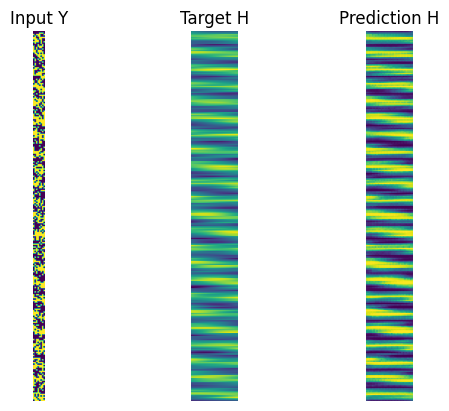

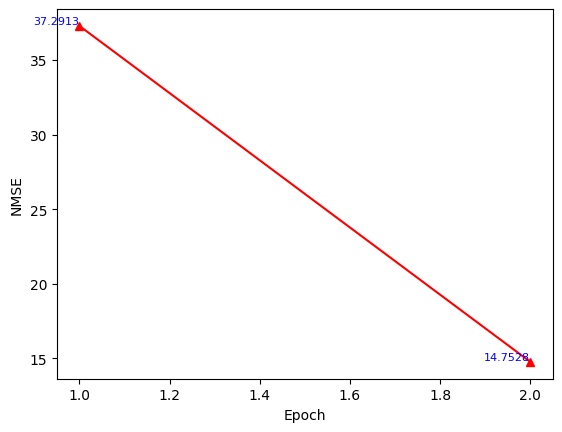

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 22.53282 , Discriminator loss: 1.1819271 , time: 0:06:49.430835
B/E: 103 / 2 , Generator loss: 21.472363 , Discriminator loss: 1.0643679 , time: 0:07:02.350403
B/E: 206 / 2 , Generator loss: 24.928268 , Discriminator loss: 0.6154005 , time: 0:07:15.002463
B/E: 309 / 2 , Generator loss: 25.097313 , Discriminator loss: 0.7820219 , time: 0:07:27.485587
B/E: 412 / 2 , Generator loss: 19.935846 , Discriminator loss: 0.47707647 , time: 0:07:39.846782
B/E: 515 / 2 , Generator loss: 23.468184 , Discriminator loss: 0.78144497 , time: 0:07:52.201637
B/E: 618 / 2 , Generator loss: 16.050419 , Discriminator loss: 0.50918114 , time: 0:08:04.842576
B/E: 721 / 2 , Generator loss: 22.577446 , Discriminator loss: 0.51058626 , time: 0:08:17.571551
B/E: 824 / 2 , Generator loss: 21.39455 , Discriminator loss: 0.34781533 , time: 0:08:30.273996
B/E: 927 / 2 , Generator loss: 24.712587 , Discriminator loss: 1.0713569 , time: 0:08:43.014747
B/E: 1030 / 2 , Generato

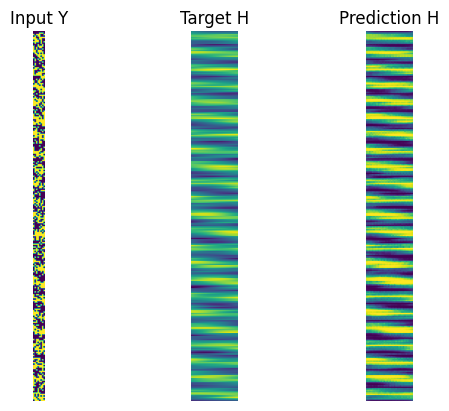

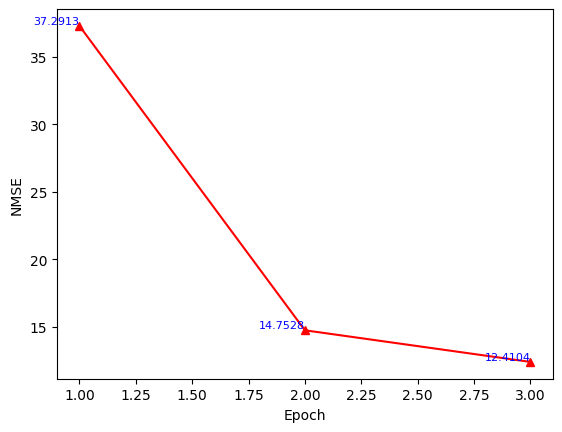

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 24.06296 , Discriminator loss: 0.5192169 , time: 0:10:09.991013
B/E: 103 / 3 , Generator loss: 22.657053 , Discriminator loss: 0.79773706 , time: 0:10:22.574979
B/E: 206 / 3 , Generator loss: 22.970848 , Discriminator loss: 0.3344111 , time: 0:10:35.024800
B/E: 309 / 3 , Generator loss: 20.472687 , Discriminator loss: 0.9109311 , time: 0:10:47.467848
B/E: 412 / 3 , Generator loss: 19.599184 , Discriminator loss: 0.31378952 , time: 0:11:00.375206
B/E: 515 / 3 , Generator loss: 22.753323 , Discriminator loss: 0.75823593 , time: 0:11:13.088877
B/E: 618 / 3 , Generator loss: 21.473309 , Discriminator loss: 0.74931717 , time: 0:11:25.662348
B/E: 721 / 3 , Generator loss: 19.053802 , Discriminator loss: 0.41206753 , time: 0:11:38.411066
B/E: 824 / 3 , Generator loss: 17.968882 , Discriminator loss: 0.31175762 , time: 0:11:51.016776
B/E: 927 / 3 , Generator loss: 19.678946 , Discriminator loss: 0.6565662 , time: 0:12:03.746097
B/E: 1030 / 3 , Genera

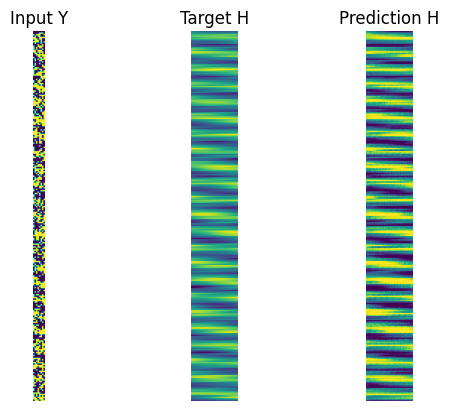

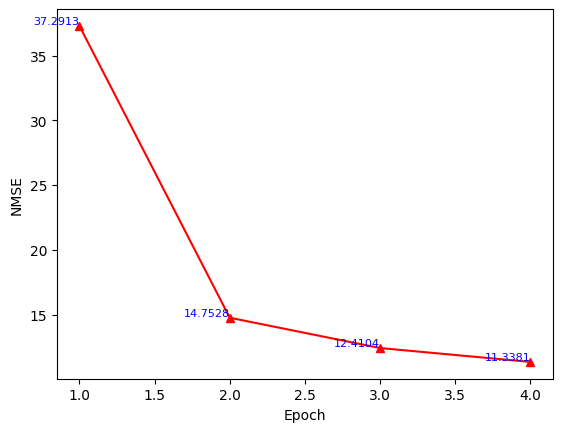

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 17.247551 , Discriminator loss: 0.4517425 , time: 0:13:30.545279
B/E: 103 / 4 , Generator loss: 16.152882 , Discriminator loss: 0.49053967 , time: 0:13:43.127972
B/E: 206 / 4 , Generator loss: 22.942225 , Discriminator loss: 1.0042741 , time: 0:13:55.836421
B/E: 309 / 4 , Generator loss: 18.921425 , Discriminator loss: 0.39309335 , time: 0:14:08.635921
B/E: 412 / 4 , Generator loss: 22.708935 , Discriminator loss: 1.119493 , time: 0:14:21.400039
B/E: 515 / 4 , Generator loss: 19.023466 , Discriminator loss: 0.24345571 , time: 0:14:34.080446
B/E: 618 / 4 , Generator loss: 19.55598 , Discriminator loss: 0.50684077 , time: 0:14:46.717960
B/E: 721 / 4 , Generator loss: 17.278622 , Discriminator loss: 1.7155676 , time: 0:14:59.436848
B/E: 824 / 4 , Generator loss: 18.709541 , Discriminator loss: 0.38554546 , time: 0:15:12.211619
B/E: 927 / 4 , Generator loss: 18.594498 , Discriminator loss: 0.28488225 , time: 0:15:24.811588
B/E: 1030 / 4 , Generat

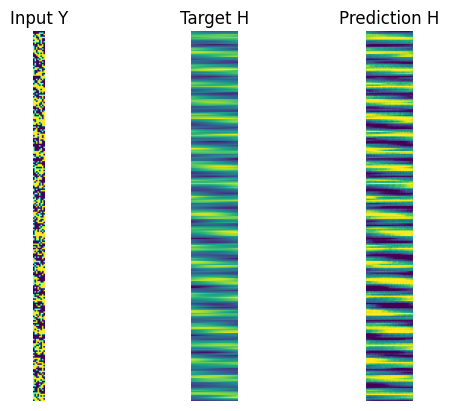

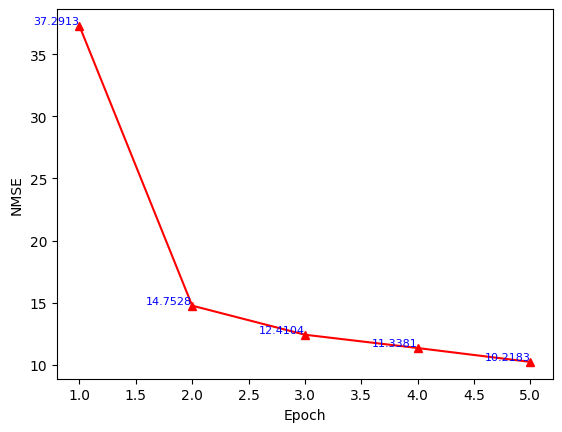

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 18.67473 , Discriminator loss: 0.44060662 , time: 0:16:50.904413
B/E: 103 / 5 , Generator loss: 18.422434 , Discriminator loss: 0.27535975 , time: 0:17:03.789563
B/E: 206 / 5 , Generator loss: 18.791735 , Discriminator loss: 0.35472363 , time: 0:17:16.465007
B/E: 309 / 5 , Generator loss: 19.866615 , Discriminator loss: 0.30209133 , time: 0:17:28.974071
B/E: 412 / 5 , Generator loss: 15.403099 , Discriminator loss: 1.0757009 , time: 0:17:41.648989
B/E: 515 / 5 , Generator loss: 24.121815 , Discriminator loss: 1.8538309 , time: 0:17:54.289943
B/E: 618 / 5 , Generator loss: 20.78237 , Discriminator loss: 0.16156153 , time: 0:18:06.884688
B/E: 721 / 5 , Generator loss: 21.759724 , Discriminator loss: 0.25479233 , time: 0:18:19.463275
B/E: 824 / 5 , Generator loss: 19.991558 , Discriminator loss: 0.2166146 , time: 0:18:32.105843
B/E: 927 / 5 , Generator loss: 19.69137 , Discriminator loss: 0.38266397 , time: 0:18:44.708054
B/E: 1030 / 5 , Generat

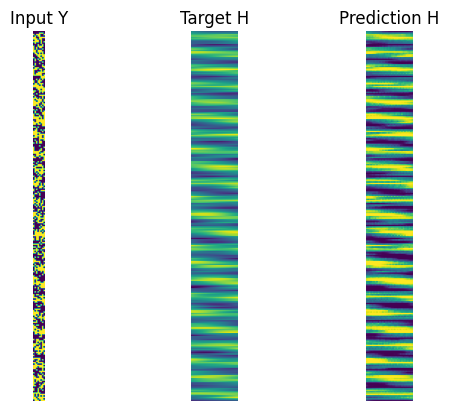

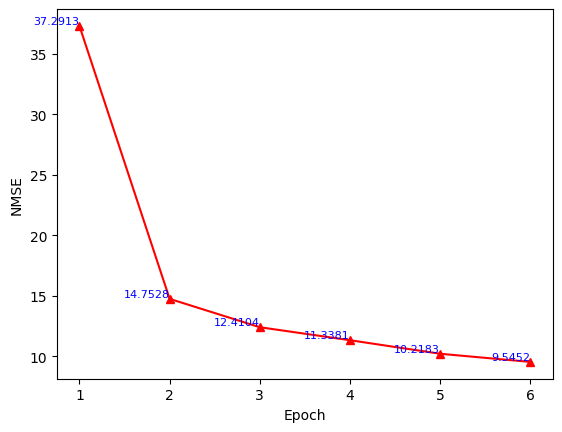

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 19.328712 , Discriminator loss: 0.20583054 , time: 0:20:10.461193
B/E: 103 / 6 , Generator loss: 19.856054 , Discriminator loss: 0.28096163 , time: 0:20:23.294482
B/E: 206 / 6 , Generator loss: 17.714762 , Discriminator loss: 1.7255793 , time: 0:20:36.008450
B/E: 309 / 6 , Generator loss: 15.203773 , Discriminator loss: 0.064948335 , time: 0:20:48.644995
B/E: 412 / 6 , Generator loss: 18.668795 , Discriminator loss: 0.4125427 , time: 0:21:01.293279
B/E: 515 / 6 , Generator loss: 16.00112 , Discriminator loss: 0.40051055 , time: 0:21:14.059554
B/E: 618 / 6 , Generator loss: 20.181734 , Discriminator loss: 0.18248442 , time: 0:21:26.503562
B/E: 721 / 6 , Generator loss: 16.821459 , Discriminator loss: 0.6437773 , time: 0:21:38.868681
B/E: 824 / 6 , Generator loss: 18.737043 , Discriminator loss: 0.12805703 , time: 0:21:51.264508
B/E: 927 / 6 , Generator loss: 19.0236 , Discriminator loss: 0.080200166 , time: 0:22:03.826023
B/E: 1030 / 6 , Gener

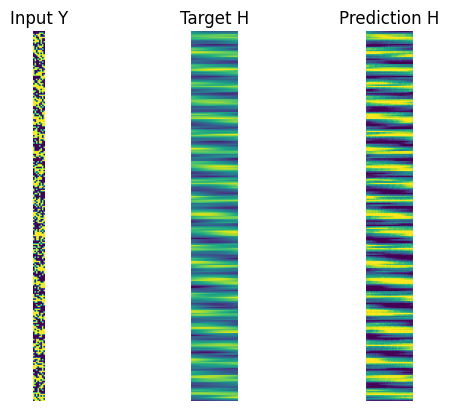

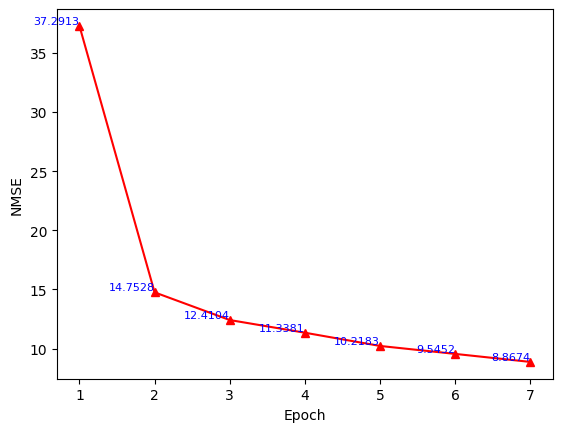

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 19.911625 , Discriminator loss: 0.13389234 , time: 0:00:05.312973
B/E: 103 / 0 , Generator loss: 19.383093 , Discriminator loss: 0.21951455 , time: 0:00:19.433087
B/E: 206 / 0 , Generator loss: 14.345809 , Discriminator loss: 0.51128954 , time: 0:00:32.011068
B/E: 309 / 0 , Generator loss: 19.77266 , Discriminator loss: 0.33454752 , time: 0:00:44.571027
B/E: 412 / 0 , Generator loss: 18.058372 , Discriminator loss: 0.7186015 , time: 0:00:56.698991
B/E: 515 / 0 , Generator loss: 19.873661 , Discriminator loss: 0.17490035 , time: 0:01:08.919701
B/E: 618 / 0 , Generator loss: 16.518068 , Discriminator loss: 0.8548262 , time: 0:01:21.257933
B/E: 721 / 0 , Generator loss: 21.420105 , Discriminator loss: 0.29717362 , time: 0:01:33.884877
B/E: 824 / 0 , Generator loss: 19.777708 , Discriminator loss: 0.14800672 , time: 0:01:46.426856
B/E: 927 / 0 , Generator loss: 16.69586 , Discriminator loss: 0.054868676 , time: 0:01:59.207312
B/E: 1030 / 0 , Gene

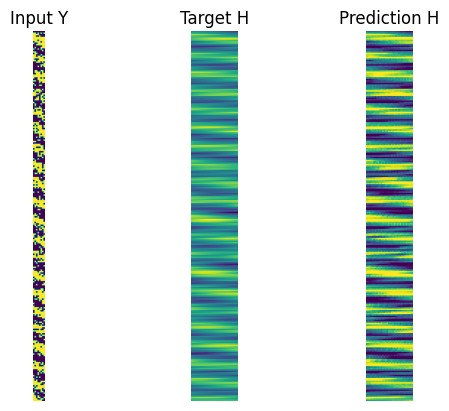

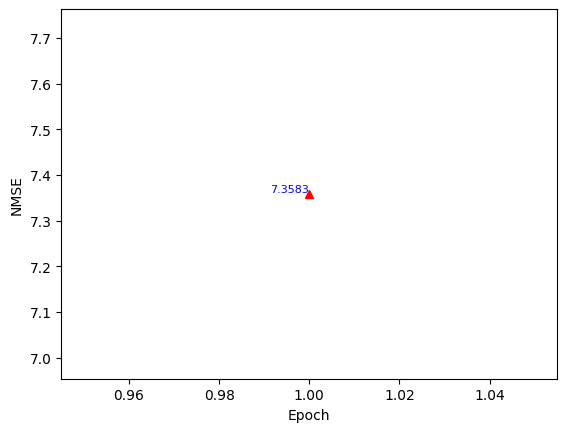

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 16.66577 , Discriminator loss: 0.025315534 , time: 0:03:26.565282
B/E: 103 / 1 , Generator loss: 20.463774 , Discriminator loss: 0.7557541 , time: 0:03:39.188239
B/E: 206 / 1 , Generator loss: 18.16841 , Discriminator loss: 0.106144935 , time: 0:03:51.765083
B/E: 309 / 1 , Generator loss: 16.38578 , Discriminator loss: 0.10885823 , time: 0:04:05.541884
B/E: 412 / 1 , Generator loss: 17.988144 , Discriminator loss: 0.11821069 , time: 0:04:18.212646
B/E: 515 / 1 , Generator loss: 17.496515 , Discriminator loss: 0.06185285 , time: 0:04:30.874236
B/E: 618 / 1 , Generator loss: 19.7697 , Discriminator loss: 0.22231649 , time: 0:04:43.496471
B/E: 721 / 1 , Generator loss: 17.994734 , Discriminator loss: 0.20753565 , time: 0:04:56.188072
B/E: 824 / 1 , Generator loss: 16.702353 , Discriminator loss: 0.50188744 , time: 0:05:08.862205
B/E: 927 / 1 , Generator loss: 19.335323 , Discriminator loss: 0.08117809 , time: 0:05:21.437843
B/E: 1030 / 1 , Gener

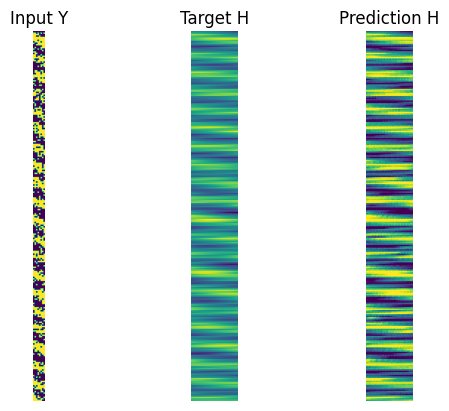

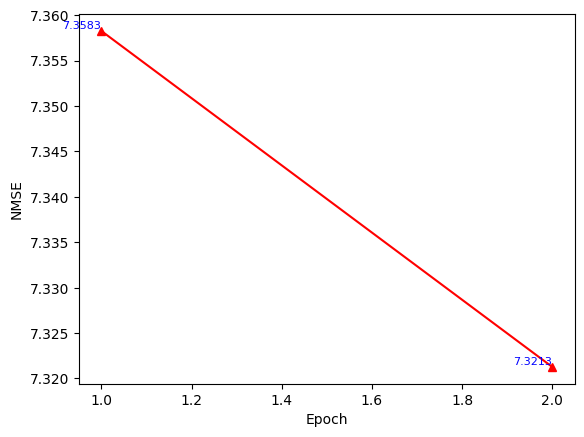

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 19.59443 , Discriminator loss: 0.08519447 , time: 0:06:46.346829
B/E: 103 / 2 , Generator loss: 17.365812 , Discriminator loss: 0.22716933 , time: 0:06:59.281484
B/E: 206 / 2 , Generator loss: 15.662352 , Discriminator loss: 0.17944694 , time: 0:07:11.994446
B/E: 309 / 2 , Generator loss: 18.001377 , Discriminator loss: 0.2935018 , time: 0:07:24.772704
B/E: 412 / 2 , Generator loss: 17.6274 , Discriminator loss: 0.0353496 , time: 0:07:37.478122
B/E: 515 / 2 , Generator loss: 17.288391 , Discriminator loss: 0.03061202 , time: 0:07:51.295810
B/E: 618 / 2 , Generator loss: 16.441414 , Discriminator loss: 0.055512026 , time: 0:08:03.925106
B/E: 721 / 2 , Generator loss: 17.397285 , Discriminator loss: 0.14493434 , time: 0:08:16.613637
B/E: 824 / 2 , Generator loss: 20.068462 , Discriminator loss: 0.09241833 , time: 0:08:29.357239
B/E: 927 / 2 , Generator loss: 15.827753 , Discriminator loss: 0.09458533 , time: 0:08:42.007398
B/E: 1030 / 2 , Gener

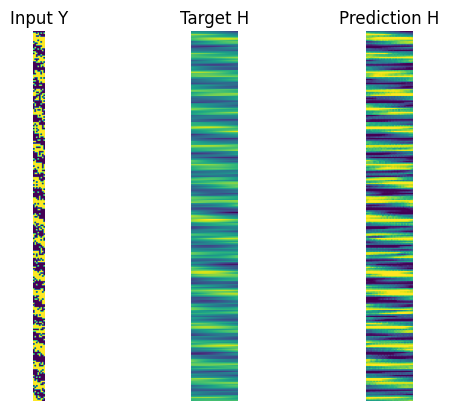

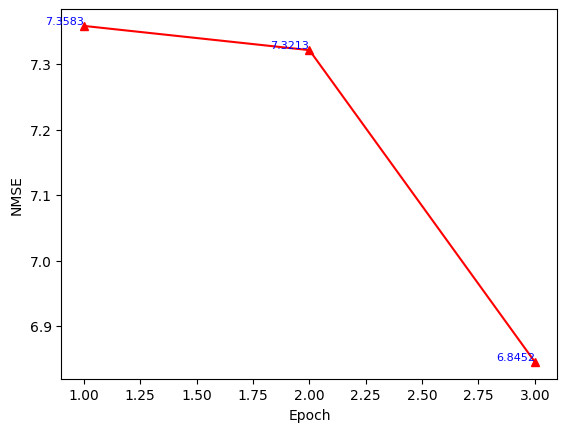

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 17.189005 , Discriminator loss: 0.058407344 , time: 0:10:06.962915
B/E: 103 / 3 , Generator loss: 15.28196 , Discriminator loss: 0.41531932 , time: 0:10:19.686086
B/E: 206 / 3 , Generator loss: 16.012455 , Discriminator loss: 0.5218574 , time: 0:10:32.385447
B/E: 309 / 3 , Generator loss: 17.285297 , Discriminator loss: 0.01396689 , time: 0:10:45.050823
B/E: 412 / 3 , Generator loss: 17.21269 , Discriminator loss: 0.018096257 , time: 0:10:57.827964
B/E: 515 / 3 , Generator loss: 14.395596 , Discriminator loss: 0.47129077 , time: 0:11:10.434798
B/E: 618 / 3 , Generator loss: 17.349136 , Discriminator loss: 0.057358492 , time: 0:11:22.677602
B/E: 721 / 3 , Generator loss: 14.788471 , Discriminator loss: 0.10211405 , time: 0:11:36.457989
B/E: 824 / 3 , Generator loss: 17.031414 , Discriminator loss: 0.025462689 , time: 0:11:48.769082
B/E: 927 / 3 , Generator loss: 16.786285 , Discriminator loss: 0.051752813 , time: 0:12:01.209132
B/E: 1030 / 3 ,

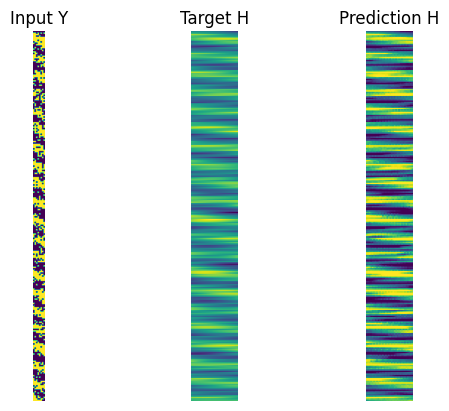

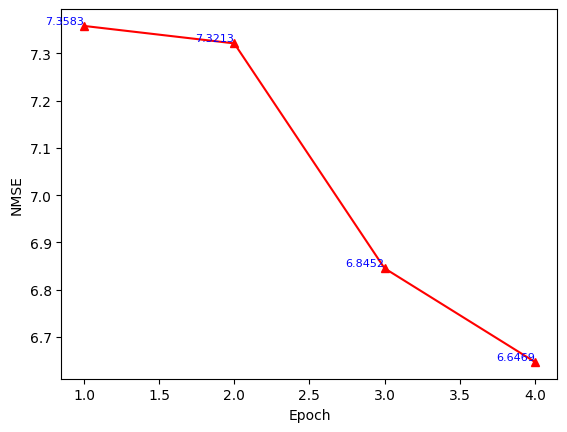

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 17.157732 , Discriminator loss: 0.022185922 , time: 0:13:27.469054
B/E: 103 / 4 , Generator loss: 16.59982 , Discriminator loss: 0.008964134 , time: 0:13:40.361834
B/E: 206 / 4 , Generator loss: 20.95073 , Discriminator loss: 1.7819426 , time: 0:13:52.937663
B/E: 309 / 4 , Generator loss: 12.463701 , Discriminator loss: 1.2781014 , time: 0:14:05.380689
B/E: 412 / 4 , Generator loss: 17.988874 , Discriminator loss: 0.07767505 , time: 0:14:17.685854
B/E: 515 / 4 , Generator loss: 16.33207 , Discriminator loss: 0.02141615 , time: 0:14:30.184971
B/E: 618 / 4 , Generator loss: 16.876957 , Discriminator loss: 0.26444754 , time: 0:14:42.923698
B/E: 721 / 4 , Generator loss: 14.3543005 , Discriminator loss: 0.19718497 , time: 0:14:55.553253
B/E: 824 / 4 , Generator loss: 22.554276 , Discriminator loss: 5.5533032 , time: 0:15:08.159568
B/E: 927 / 4 , Generator loss: 19.62276 , Discriminator loss: 0.013263463 , time: 0:15:21.971561
B/E: 1030 / 4 , Gene

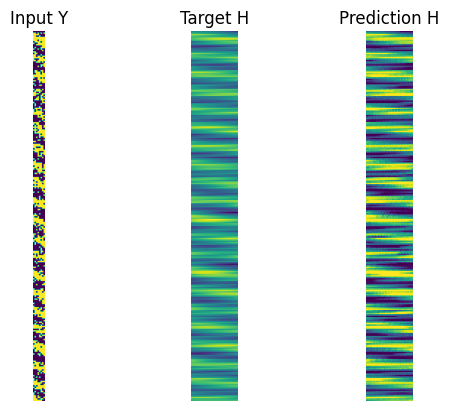

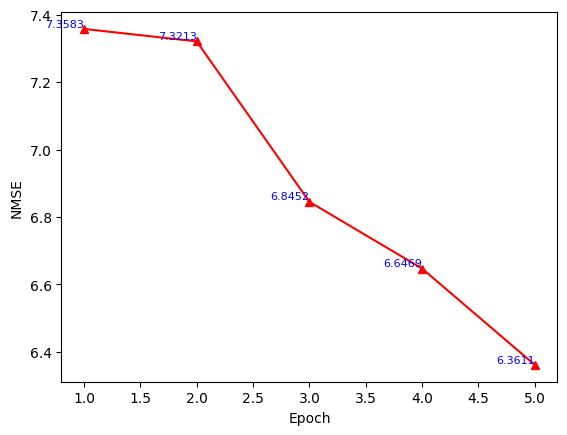

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 16.29271 , Discriminator loss: 0.036867313 , time: 0:16:47.345477
B/E: 103 / 5 , Generator loss: 16.273348 , Discriminator loss: 0.021323372 , time: 0:17:00.171647
B/E: 206 / 5 , Generator loss: 16.601326 , Discriminator loss: 0.08822647 , time: 0:17:12.988051
B/E: 309 / 5 , Generator loss: 16.327694 , Discriminator loss: 0.00983806 , time: 0:17:25.683076
B/E: 412 / 5 , Generator loss: 14.60784 , Discriminator loss: 0.10412857 , time: 0:17:38.542467
B/E: 515 / 5 , Generator loss: 14.0583725 , Discriminator loss: 0.0416257 , time: 0:17:51.433154
B/E: 618 / 5 , Generator loss: 16.322535 , Discriminator loss: 0.051931806 , time: 0:18:04.107536
B/E: 721 / 5 , Generator loss: 14.154646 , Discriminator loss: 0.39377686 , time: 0:18:16.895750
B/E: 824 / 5 , Generator loss: 17.03614 , Discriminator loss: 0.026162341 , time: 0:18:29.670119
B/E: 927 / 5 , Generator loss: 14.695423 , Discriminator loss: 0.16692224 , time: 0:18:42.440996
B/E: 1030 / 5 , 

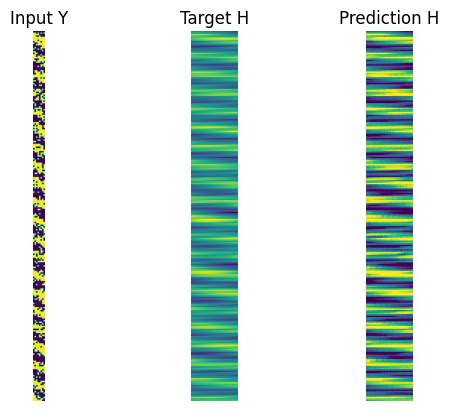

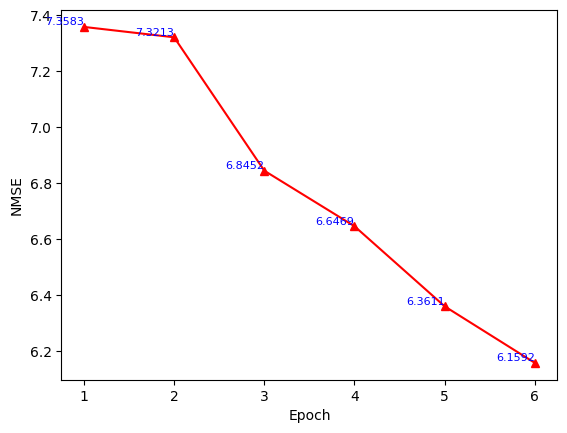

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 13.717487 , Discriminator loss: 0.09296365 , time: 0:20:08.600148
B/E: 103 / 6 , Generator loss: 20.368887 , Discriminator loss: 1.0007311 , time: 0:20:21.387951
B/E: 206 / 6 , Generator loss: 16.663387 , Discriminator loss: 0.09759463 , time: 0:20:34.091150
B/E: 309 / 6 , Generator loss: 18.529694 , Discriminator loss: 0.008264155 , time: 0:20:46.827506
B/E: 412 / 6 , Generator loss: 18.184559 , Discriminator loss: 0.11611232 , time: 0:20:59.584191
B/E: 515 / 6 , Generator loss: 14.143343 , Discriminator loss: 0.16696447 , time: 0:21:12.358935
B/E: 618 / 6 , Generator loss: 16.464554 , Discriminator loss: 0.008300934 , time: 0:21:24.934277
B/E: 721 / 6 , Generator loss: 15.549728 , Discriminator loss: 0.04103214 , time: 0:21:37.816580
B/E: 824 / 6 , Generator loss: 17.100584 , Discriminator loss: 0.10863538 , time: 0:21:50.495413
B/E: 927 / 6 , Generator loss: 12.581521 , Discriminator loss: 0.86549443 , time: 0:22:03.083534
B/E: 1030 / 6 , 

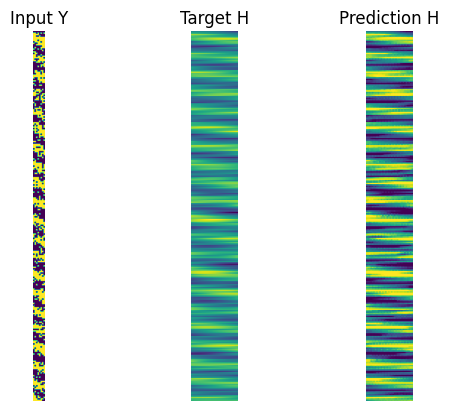

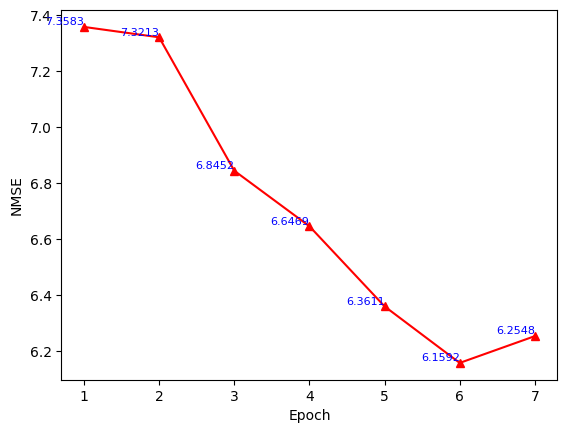

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 20.247902 , Discriminator loss: 0.019858472 , time: 0:00:03.794573
B/E: 103 / 0 , Generator loss: 20.697767 , Discriminator loss: 0.008836219 , time: 0:00:16.909239
B/E: 206 / 0 , Generator loss: 19.211842 , Discriminator loss: 0.054941487 , time: 0:00:29.676475
B/E: 309 / 0 , Generator loss: 18.40482 , Discriminator loss: 0.018676123 , time: 0:00:42.494881
B/E: 412 / 0 , Generator loss: 15.995989 , Discriminator loss: 0.21409233 , time: 0:00:55.189591
B/E: 515 / 0 , Generator loss: 18.445066 , Discriminator loss: 0.006499156 , time: 0:01:07.859006
B/E: 618 / 0 , Generator loss: 26.299852 , Discriminator loss: 1.9027367 , time: 0:01:20.619983
B/E: 721 / 0 , Generator loss: 21.043858 , Discriminator loss: 0.0536299 , time: 0:01:32.933651
B/E: 824 / 0 , Generator loss: 19.217838 , Discriminator loss: 0.02307143 , time: 0:01:45.301990
B/E: 927 / 0 , Generator loss: 18.513884 , Discriminator loss: 0.027273584 , time: 0:01:57.528756
B/E: 1030 / 0 

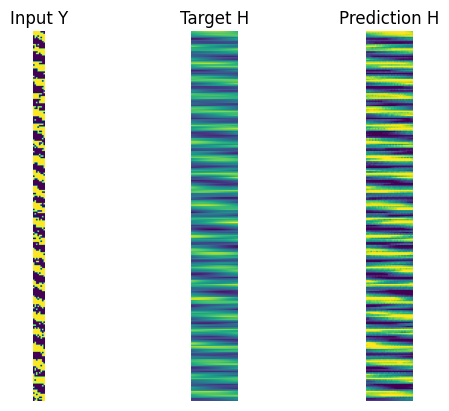

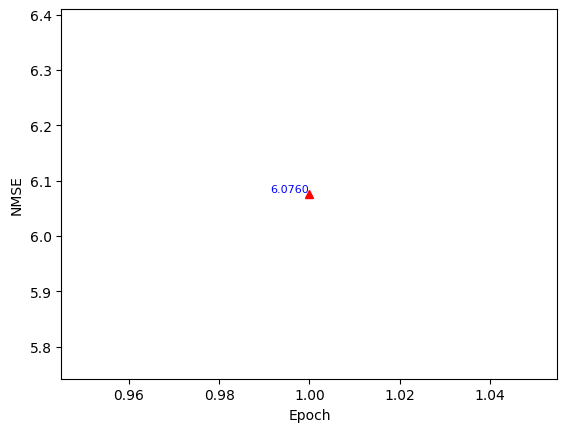

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 18.382774 , Discriminator loss: 0.22022705 , time: 0:03:25.799473
B/E: 103 / 1 , Generator loss: 15.005119 , Discriminator loss: 0.13342452 , time: 0:03:38.798161
B/E: 206 / 1 , Generator loss: 15.113943 , Discriminator loss: 0.71572447 , time: 0:03:51.452371
B/E: 309 / 1 , Generator loss: 17.793463 , Discriminator loss: 0.32375592 , time: 0:04:03.918042
B/E: 412 / 1 , Generator loss: 21.72847 , Discriminator loss: 0.2504713 , time: 0:04:16.347482
B/E: 515 / 1 , Generator loss: 18.531895 , Discriminator loss: 0.01477428 , time: 0:04:28.739951
B/E: 618 / 1 , Generator loss: 18.442432 , Discriminator loss: 0.23660983 , time: 0:04:41.361328
B/E: 721 / 1 , Generator loss: 17.559715 , Discriminator loss: 0.032486074 , time: 0:04:54.129310
B/E: 824 / 1 , Generator loss: 18.002468 , Discriminator loss: 0.022614334 , time: 0:05:06.831714
B/E: 927 / 1 , Generator loss: 13.161768 , Discriminator loss: 1.0795811 , time: 0:05:19.651413
B/E: 1030 / 1 , Ge

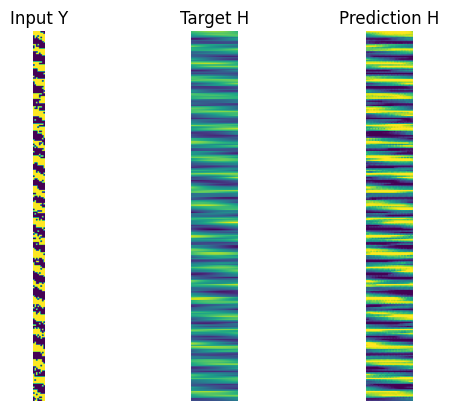

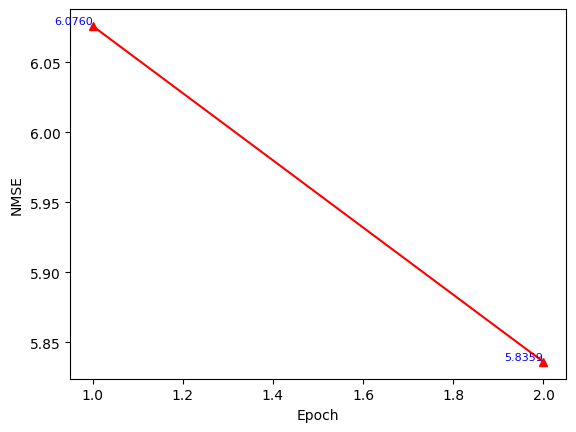

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 13.547762 , Discriminator loss: 0.21937557 , time: 0:06:45.378126
B/E: 103 / 2 , Generator loss: 14.956798 , Discriminator loss: 0.087636665 , time: 0:06:59.396953
B/E: 206 / 2 , Generator loss: 20.705467 , Discriminator loss: 0.008789863 , time: 0:07:12.031204
B/E: 309 / 2 , Generator loss: 16.393364 , Discriminator loss: 0.05977237 , time: 0:07:24.790647
B/E: 412 / 2 , Generator loss: 17.795036 , Discriminator loss: 0.009015208 , time: 0:07:37.620147
B/E: 515 / 2 , Generator loss: 17.15796 , Discriminator loss: 0.13776535 , time: 0:07:50.430310
B/E: 618 / 2 , Generator loss: 18.937872 , Discriminator loss: 0.1065859 , time: 0:08:03.105639
B/E: 721 / 2 , Generator loss: 14.458209 , Discriminator loss: 0.112535246 , time: 0:08:15.920684
B/E: 824 / 2 , Generator loss: 15.916913 , Discriminator loss: 0.0741928 , time: 0:08:28.784639
B/E: 927 / 2 , Generator loss: 16.738428 , Discriminator loss: 0.011751228 , time: 0:08:41.510378
B/E: 1030 / 2 ,

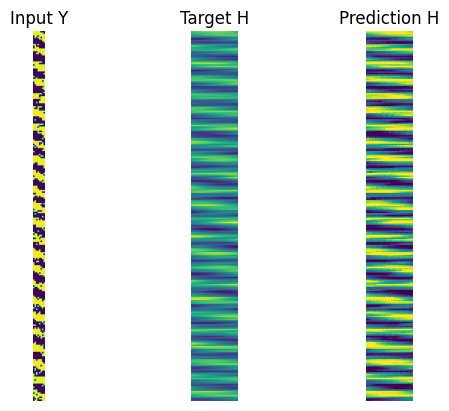

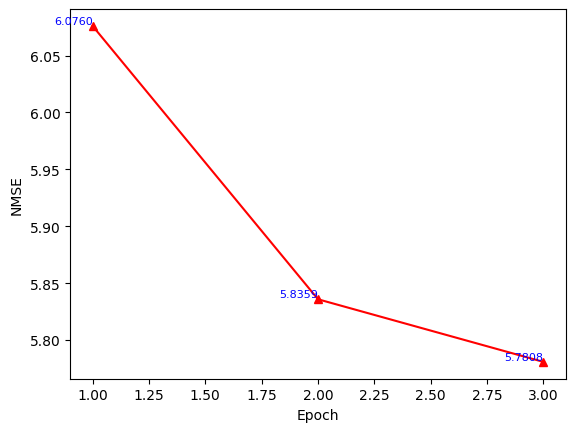

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 19.821486 , Discriminator loss: 0.108535424 , time: 0:10:06.691644
B/E: 103 / 3 , Generator loss: 18.143415 , Discriminator loss: 0.02014681 , time: 0:10:19.642762
B/E: 206 / 3 , Generator loss: 17.322237 , Discriminator loss: 0.014674589 , time: 0:10:32.378184
B/E: 309 / 3 , Generator loss: 15.377241 , Discriminator loss: 0.17422388 , time: 0:10:46.321558
B/E: 412 / 3 , Generator loss: 24.456818 , Discriminator loss: 0.6433569 , time: 0:10:59.106553
B/E: 515 / 3 , Generator loss: 17.963202 , Discriminator loss: 0.007667613 , time: 0:11:11.891011
B/E: 618 / 3 , Generator loss: 17.300802 , Discriminator loss: 0.013145544 , time: 0:11:24.714454
B/E: 721 / 3 , Generator loss: 21.0113 , Discriminator loss: 0.041306652 , time: 0:11:37.652932
B/E: 824 / 3 , Generator loss: 19.05146 , Discriminator loss: 0.0056699747 , time: 0:11:50.455435
B/E: 927 / 3 , Generator loss: 11.771972 , Discriminator loss: 2.2637815 , time: 0:12:03.324992
B/E: 1030 / 3 ,

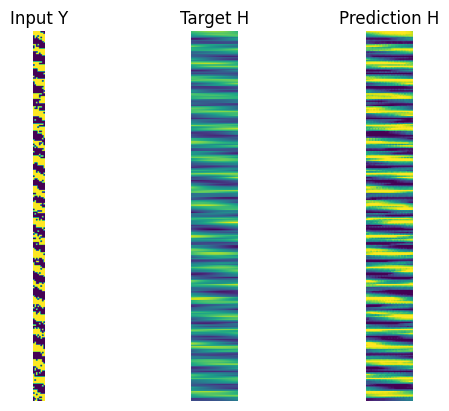

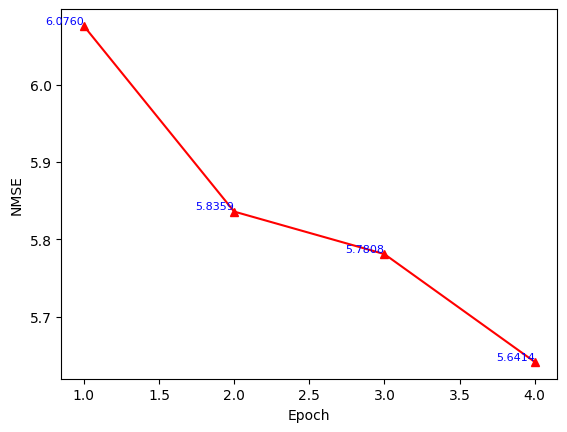

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 15.515129 , Discriminator loss: 0.06531362 , time: 0:13:29.225196
B/E: 103 / 4 , Generator loss: 11.063257 , Discriminator loss: 1.0028791 , time: 0:13:42.057289
B/E: 206 / 4 , Generator loss: 20.200974 , Discriminator loss: 0.01620792 , time: 0:13:54.687586
B/E: 309 / 4 , Generator loss: 16.678455 , Discriminator loss: 0.020321526 , time: 0:14:07.344585
B/E: 412 / 4 , Generator loss: 12.612904 , Discriminator loss: 1.5075454 , time: 0:14:20.038683
B/E: 515 / 4 , Generator loss: 17.028101 , Discriminator loss: 0.025670143 , time: 0:14:32.860574
B/E: 618 / 4 , Generator loss: 18.945724 , Discriminator loss: 0.074898735 , time: 0:14:46.903373
B/E: 721 / 4 , Generator loss: 11.561845 , Discriminator loss: 2.8560328 , time: 0:14:59.659580
B/E: 824 / 4 , Generator loss: 20.474243 , Discriminator loss: 0.018743135 , time: 0:15:12.438259
B/E: 927 / 4 , Generator loss: 16.067629 , Discriminator loss: 0.012278163 , time: 0:15:24.928380
B/E: 1030 / 4 ,

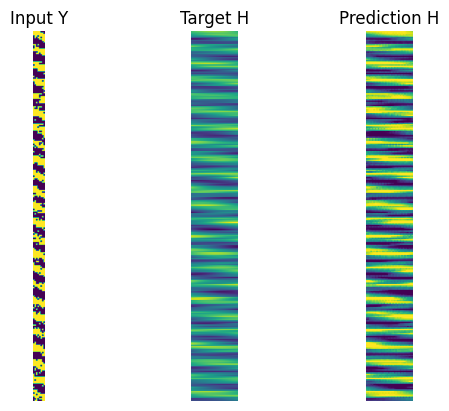

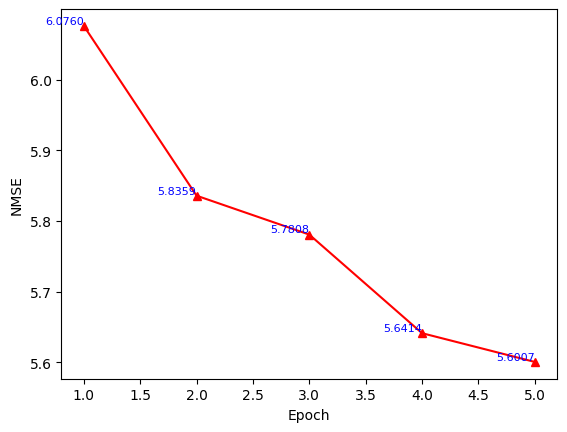

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 16.009607 , Discriminator loss: 0.10253577 , time: 0:16:50.921582
B/E: 103 / 5 , Generator loss: 14.798025 , Discriminator loss: 0.09095166 , time: 0:17:03.816193
B/E: 206 / 5 , Generator loss: 18.430855 , Discriminator loss: 0.34685865 , time: 0:17:16.736402
B/E: 309 / 5 , Generator loss: 15.641476 , Discriminator loss: 0.305395 , time: 0:17:29.749844
B/E: 412 / 5 , Generator loss: 14.872502 , Discriminator loss: 0.05738832 , time: 0:17:42.495971
B/E: 515 / 5 , Generator loss: 17.607437 , Discriminator loss: 0.008907389 , time: 0:17:55.152697
B/E: 618 / 5 , Generator loss: 12.731716 , Discriminator loss: 0.41822097 , time: 0:18:07.560544
B/E: 721 / 5 , Generator loss: 18.674034 , Discriminator loss: 0.007864249 , time: 0:18:20.183127
B/E: 824 / 5 , Generator loss: 19.705368 , Discriminator loss: 0.006453441 , time: 0:18:34.401803
B/E: 927 / 5 , Generator loss: 20.043436 , Discriminator loss: 0.039132826 , time: 0:18:46.917441
B/E: 1030 / 5 ,

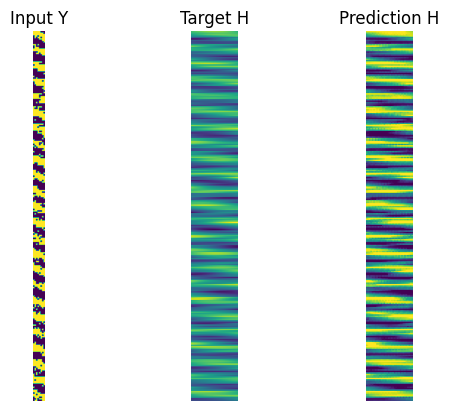

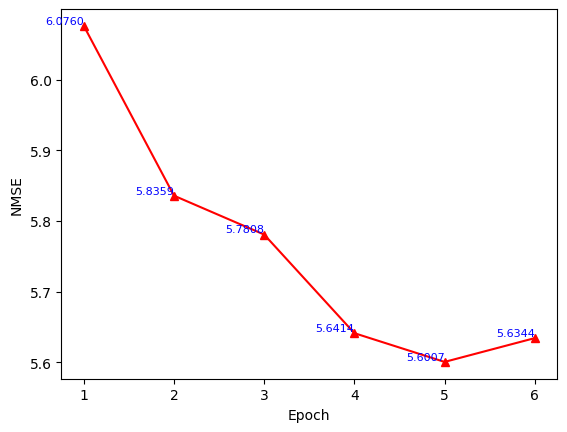

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 13.809781 , Discriminator loss: 0.4647257 , time: 0:20:13.834544
B/E: 103 / 6 , Generator loss: 19.995079 , Discriminator loss: 0.015109814 , time: 0:20:26.823243
B/E: 206 / 6 , Generator loss: 19.9721 , Discriminator loss: 0.0032880406 , time: 0:20:39.590184
B/E: 309 / 6 , Generator loss: 14.490889 , Discriminator loss: 0.15790063 , time: 0:20:52.214621
B/E: 412 / 6 , Generator loss: 17.603518 , Discriminator loss: 0.0013941078 , time: 0:21:04.547277
B/E: 515 / 6 , Generator loss: 16.393814 , Discriminator loss: 0.033260677 , time: 0:21:17.200343
B/E: 618 / 6 , Generator loss: 15.58799 , Discriminator loss: 0.028738555 , time: 0:21:29.701977
B/E: 721 / 6 , Generator loss: 18.359776 , Discriminator loss: 0.00534819 , time: 0:21:42.583765
B/E: 824 / 6 , Generator loss: 17.387667 , Discriminator loss: 0.012836776 , time: 0:21:55.458557
B/E: 927 / 6 , Generator loss: 14.542437 , Discriminator loss: 0.52485174 , time: 0:22:08.575408
B/E: 1030 / 6

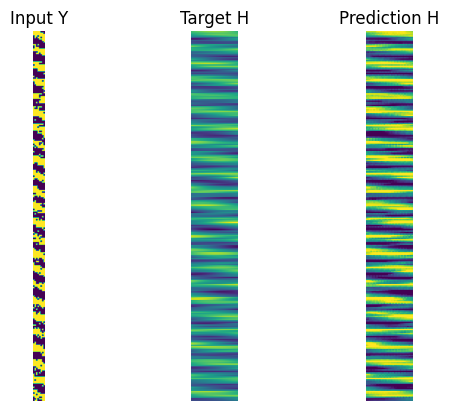

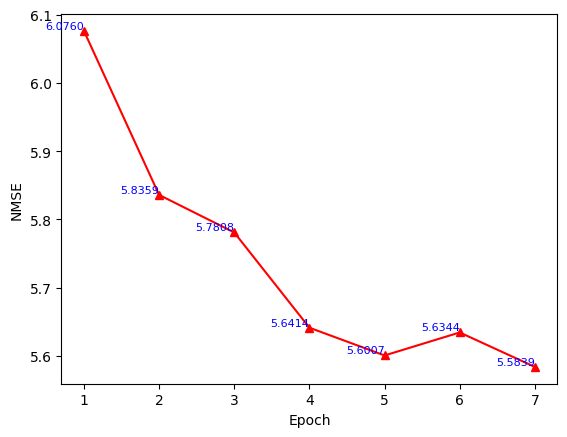

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 20.33249 , Discriminator loss: 0.00086435943 , time: 0:00:04.932926
B/E: 103 / 0 , Generator loss: 19.615967 , Discriminator loss: 0.0013463828 , time: 0:00:17.926144
B/E: 206 / 0 , Generator loss: 23.69371 , Discriminator loss: 0.14777929 , time: 0:00:30.376404
B/E: 309 / 0 , Generator loss: 16.761444 , Discriminator loss: 0.054186493 , time: 0:00:42.904285
B/E: 412 / 0 , Generator loss: 19.86436 , Discriminator loss: 0.0036903846 , time: 0:00:55.412369
B/E: 515 / 0 , Generator loss: 13.449995 , Discriminator loss: 1.0360292 , time: 0:01:08.166856
B/E: 618 / 0 , Generator loss: 16.803656 , Discriminator loss: 0.02050027 , time: 0:01:20.974399
B/E: 721 / 0 , Generator loss: 25.577131 , Discriminator loss: 0.3222559 , time: 0:01:33.951183
B/E: 824 / 0 , Generator loss: 18.212471 , Discriminator loss: 0.04888076 , time: 0:01:46.933308
B/E: 927 / 0 , Generator loss: 19.357397 , Discriminator loss: 0.0015492694 , time: 0:01:59.823655
B/E: 1030 / 

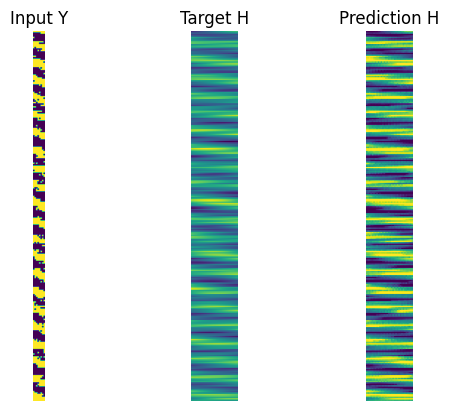

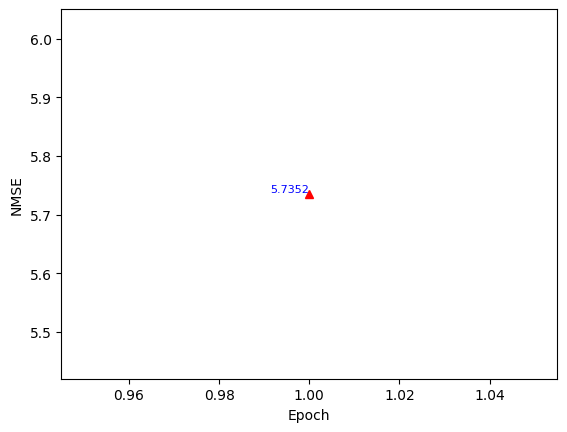

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 19.068727 , Discriminator loss: 0.021107228 , time: 0:03:28.017420
B/E: 103 / 1 , Generator loss: 18.409798 , Discriminator loss: 0.0048599066 , time: 0:03:40.812391
B/E: 206 / 1 , Generator loss: 19.53525 , Discriminator loss: 0.0030593397 , time: 0:03:53.611760
B/E: 309 / 1 , Generator loss: 15.74438 , Discriminator loss: 0.1374237 , time: 0:04:06.450716
B/E: 412 / 1 , Generator loss: 19.622923 , Discriminator loss: 0.006178982 , time: 0:04:19.230924
B/E: 515 / 1 , Generator loss: 17.887474 , Discriminator loss: 0.008829801 , time: 0:04:31.960072
B/E: 618 / 1 , Generator loss: 19.189926 , Discriminator loss: 0.000785876 , time: 0:04:44.873493
B/E: 721 / 1 , Generator loss: 16.94045 , Discriminator loss: 0.22414257 , time: 0:04:57.696211
B/E: 824 / 1 , Generator loss: 19.44373 , Discriminator loss: 0.0031268168 , time: 0:05:10.694045
B/E: 927 / 1 , Generator loss: 18.680656 , Discriminator loss: 0.0075720595 , time: 0:05:23.315881
B/E: 1030 

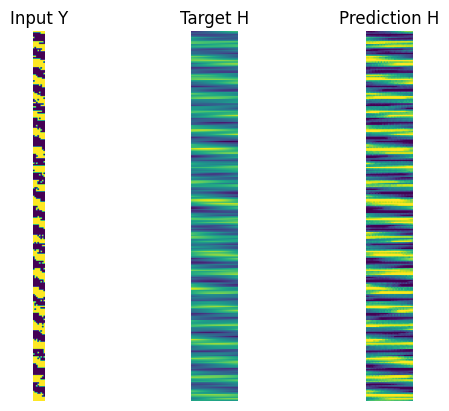

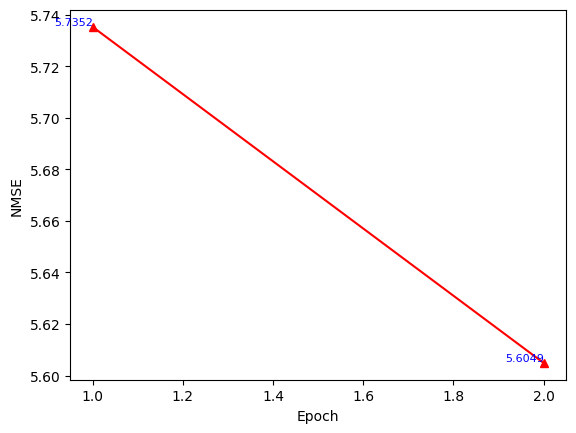

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 20.464025 , Discriminator loss: 0.0020651587 , time: 0:06:49.946477
B/E: 103 / 2 , Generator loss: 18.73309 , Discriminator loss: 0.0060379244 , time: 0:07:03.044064
B/E: 206 / 2 , Generator loss: 17.65421 , Discriminator loss: 0.014274332 , time: 0:07:15.852185
B/E: 309 / 2 , Generator loss: 19.342419 , Discriminator loss: 0.0029569832 , time: 0:07:28.518888
B/E: 412 / 2 , Generator loss: 20.42312 , Discriminator loss: 0.00644908 , time: 0:07:41.418865
B/E: 515 / 2 , Generator loss: 17.111715 , Discriminator loss: 0.014607301 , time: 0:07:54.075326
B/E: 618 / 2 , Generator loss: 16.034578 , Discriminator loss: 0.2953724 , time: 0:08:06.986569
B/E: 721 / 2 , Generator loss: 17.737335 , Discriminator loss: 0.19062087 , time: 0:08:19.730948
B/E: 824 / 2 , Generator loss: 21.82396 , Discriminator loss: 0.5533305 , time: 0:08:32.498710
B/E: 927 / 2 , Generator loss: 19.762749 , Discriminator loss: 0.0015905427 , time: 0:08:45.312335
B/E: 1030 / 2

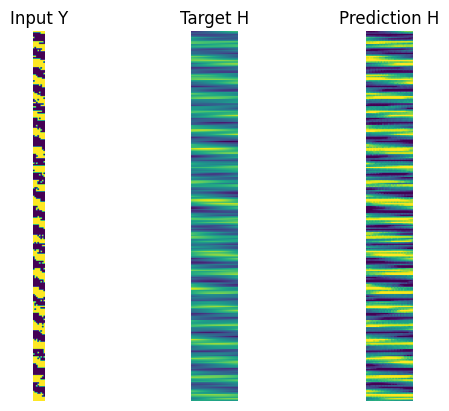

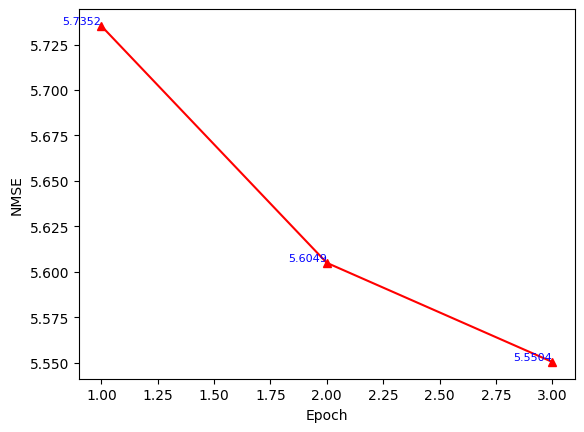

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 19.312235 , Discriminator loss: 0.0034158812 , time: 0:10:10.969278
B/E: 103 / 3 , Generator loss: 19.229544 , Discriminator loss: 0.011199685 , time: 0:10:23.974023
B/E: 206 / 3 , Generator loss: 13.098869 , Discriminator loss: 1.9319932 , time: 0:10:37.070912
B/E: 309 / 3 , Generator loss: 19.247099 , Discriminator loss: 0.013422698 , time: 0:10:51.088123
B/E: 412 / 3 , Generator loss: 17.88556 , Discriminator loss: 0.008768366 , time: 0:11:04.002762
B/E: 515 / 3 , Generator loss: 24.934616 , Discriminator loss: 0.49050787 , time: 0:11:16.821785
B/E: 618 / 3 , Generator loss: 15.455173 , Discriminator loss: 0.05570907 , time: 0:11:29.614196
B/E: 721 / 3 , Generator loss: 19.020885 , Discriminator loss: 0.00044116695 , time: 0:11:42.491549
B/E: 824 / 3 , Generator loss: 20.243519 , Discriminator loss: 0.0024555242 , time: 0:11:55.410208
B/E: 927 / 3 , Generator loss: 19.942005 , Discriminator loss: 0.0034797336 , time: 0:12:08.157661
B/E: 10

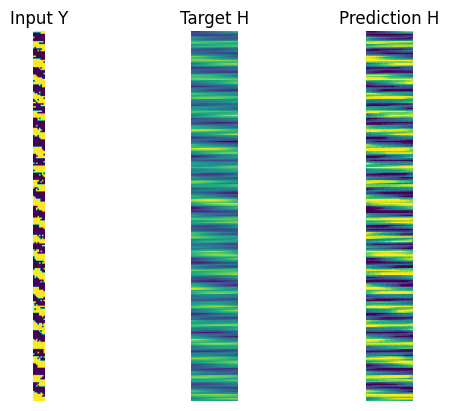

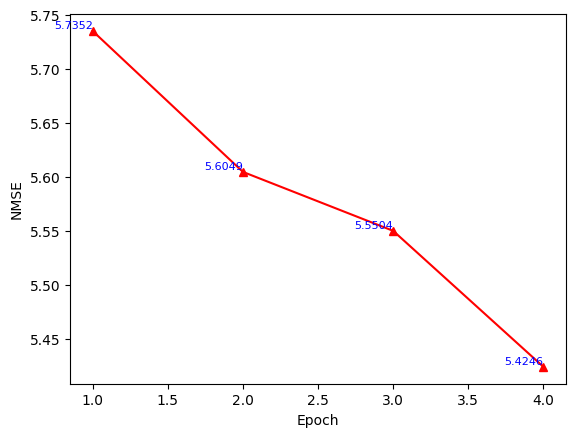

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 16.96411 , Discriminator loss: 0.0117164785 , time: 0:13:34.550069
B/E: 103 / 4 , Generator loss: 14.766379 , Discriminator loss: 0.023021227 , time: 0:13:47.541260
B/E: 206 / 4 , Generator loss: 17.25645 , Discriminator loss: 0.0045227977 , time: 0:14:00.502204
B/E: 309 / 4 , Generator loss: 16.53543 , Discriminator loss: 0.030501466 , time: 0:14:13.344157
B/E: 412 / 4 , Generator loss: 18.0339 , Discriminator loss: 0.009055929 , time: 0:14:26.190510
B/E: 515 / 4 , Generator loss: 18.046175 , Discriminator loss: 0.019198798 , time: 0:14:39.121732
B/E: 618 / 4 , Generator loss: 17.071974 , Discriminator loss: 0.016843831 , time: 0:14:53.218533
B/E: 721 / 4 , Generator loss: 19.939789 , Discriminator loss: 0.00171118 , time: 0:15:06.206056
B/E: 824 / 4 , Generator loss: 19.332287 , Discriminator loss: 0.002629518 , time: 0:15:18.854036
B/E: 927 / 4 , Generator loss: 17.99585 , Discriminator loss: 0.04509302 , time: 0:15:31.434845
B/E: 1030 / 4

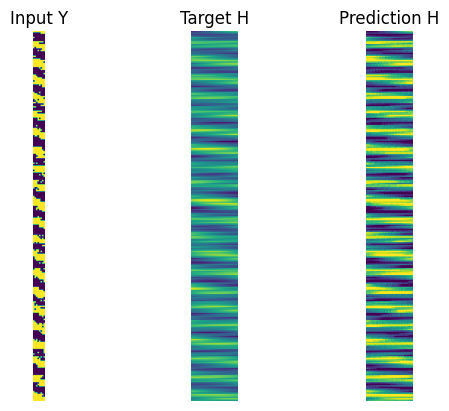

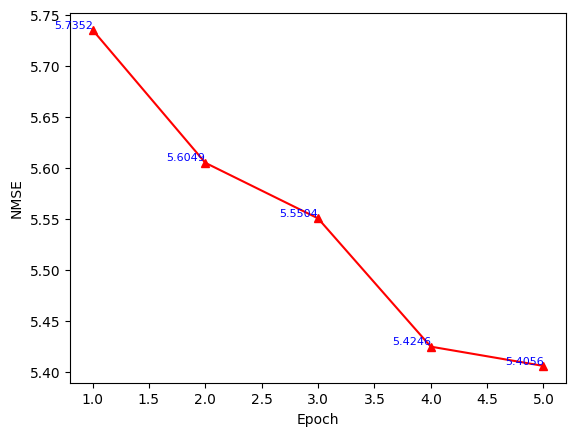

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 18.831541 , Discriminator loss: 0.0009837586 , time: 0:16:58.791153
B/E: 103 / 5 , Generator loss: 19.814972 , Discriminator loss: 0.0020929202 , time: 0:17:11.950634
B/E: 206 / 5 , Generator loss: 18.268948 , Discriminator loss: 0.0013564419 , time: 0:17:25.006190
B/E: 309 / 5 , Generator loss: 14.656375 , Discriminator loss: 0.12820128 , time: 0:17:37.942332
B/E: 412 / 5 , Generator loss: 18.730839 , Discriminator loss: 0.0020550685 , time: 0:17:50.788608
B/E: 515 / 5 , Generator loss: 13.793901 , Discriminator loss: 0.28204462 , time: 0:18:03.581627
B/E: 618 / 5 , Generator loss: 17.050745 , Discriminator loss: 0.0034939216 , time: 0:18:16.124999
B/E: 721 / 5 , Generator loss: 11.157406 , Discriminator loss: 1.9080482 , time: 0:18:28.677132
B/E: 824 / 5 , Generator loss: 17.80364 , Discriminator loss: 0.0031744328 , time: 0:18:41.561521
B/E: 927 / 5 , Generator loss: 17.628283 , Discriminator loss: 0.02771432 , time: 0:18:55.694963
B/E: 10

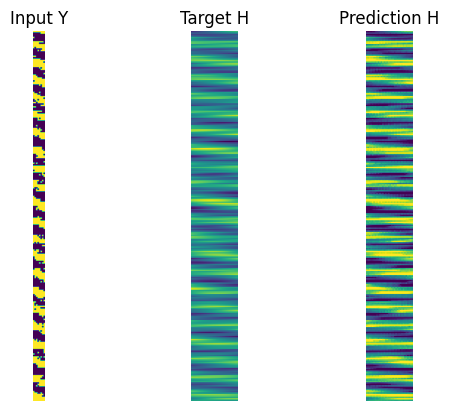

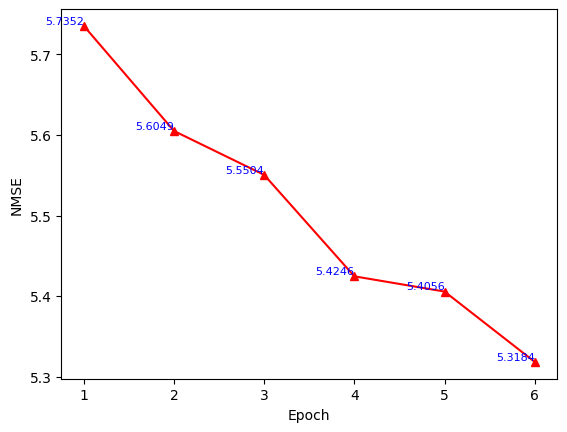

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 19.14164 , Discriminator loss: 0.0041628447 , time: 0:20:24.327056
B/E: 103 / 6 , Generator loss: 18.259539 , Discriminator loss: 0.0023815096 , time: 0:20:37.761588
B/E: 206 / 6 , Generator loss: 16.314617 , Discriminator loss: 0.018216135 , time: 0:20:50.844266
B/E: 309 / 6 , Generator loss: 17.97896 , Discriminator loss: 0.017331347 , time: 0:21:03.856924
B/E: 412 / 6 , Generator loss: 16.213955 , Discriminator loss: 0.02205955 , time: 0:21:16.582920
B/E: 515 / 6 , Generator loss: 18.067852 , Discriminator loss: 0.020409094 , time: 0:21:29.043461
B/E: 618 / 6 , Generator loss: 18.12533 , Discriminator loss: 0.005886339 , time: 0:21:41.676915
B/E: 721 / 6 , Generator loss: 15.763319 , Discriminator loss: 0.008744072 , time: 0:21:54.531418
B/E: 824 / 6 , Generator loss: 17.742855 , Discriminator loss: 0.031751845 , time: 0:22:07.433469
B/E: 927 / 6 , Generator loss: 16.965961 , Discriminator loss: 0.004049212 , time: 0:22:20.316658
B/E: 1030

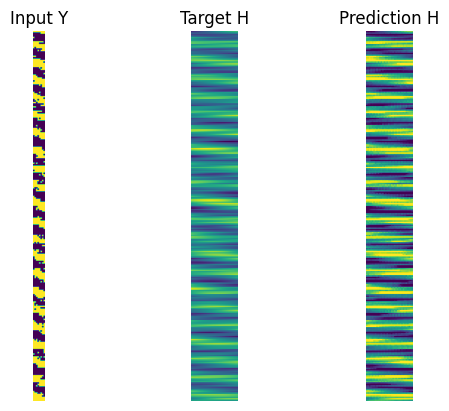

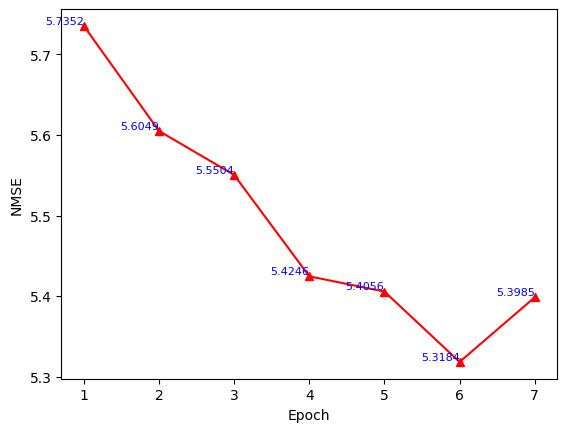

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 19.883495 , Discriminator loss: 0.009782353 , time: 0:00:04.498555
B/E: 103 / 0 , Generator loss: 18.600739 , Discriminator loss: 0.0126650315 , time: 0:00:17.540732
B/E: 206 / 0 , Generator loss: 22.040619 , Discriminator loss: 0.00086935353 , time: 0:00:30.387510
B/E: 309 / 0 , Generator loss: 17.667414 , Discriminator loss: 0.44313505 , time: 0:00:43.188053
B/E: 412 / 0 , Generator loss: 18.42464 , Discriminator loss: 0.0031870445 , time: 0:00:56.344781
B/E: 515 / 0 , Generator loss: 18.5024 , Discriminator loss: 0.0014697462 , time: 0:01:09.380038
B/E: 618 / 0 , Generator loss: 21.502144 , Discriminator loss: 0.0020533798 , time: 0:01:22.356425
B/E: 721 / 0 , Generator loss: 18.097694 , Discriminator loss: 0.008247856 , time: 0:01:34.756010
B/E: 824 / 0 , Generator loss: 20.889008 , Discriminator loss: 0.00080001436 , time: 0:01:47.616915
B/E: 927 / 0 , Generator loss: 18.59712 , Discriminator loss: 0.002984005 , time: 0:02:00.687853
B/E:

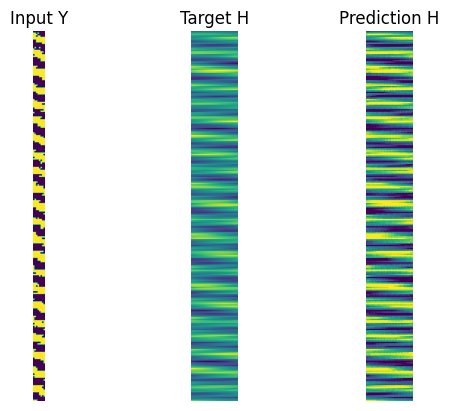

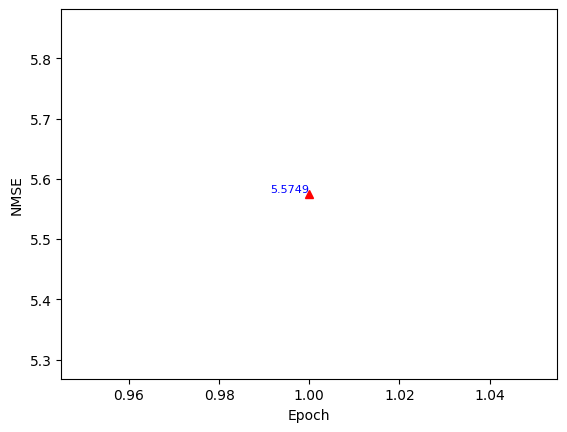

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 19.955633 , Discriminator loss: 0.0008647893 , time: 0:03:30.543786
B/E: 103 / 1 , Generator loss: 19.948204 , Discriminator loss: 0.0009551345 , time: 0:03:43.730126
B/E: 206 / 1 , Generator loss: 15.6855955 , Discriminator loss: 0.1066914 , time: 0:03:56.817750
B/E: 309 / 1 , Generator loss: 20.242275 , Discriminator loss: 0.008857909 , time: 0:04:09.837454
B/E: 412 / 1 , Generator loss: 17.506783 , Discriminator loss: 0.028865958 , time: 0:04:22.799959
B/E: 515 / 1 , Generator loss: 19.726337 , Discriminator loss: 0.00056020165 , time: 0:04:35.618955
B/E: 618 / 1 , Generator loss: 22.804438 , Discriminator loss: 0.03260671 , time: 0:04:48.505631
B/E: 721 / 1 , Generator loss: 19.955997 , Discriminator loss: 0.0013344672 , time: 0:05:01.089247
B/E: 824 / 1 , Generator loss: 18.440447 , Discriminator loss: 0.0059668836 , time: 0:05:13.516109
B/E: 927 / 1 , Generator loss: 20.993176 , Discriminator loss: 0.0013311415 , time: 0:05:26.176724
B/

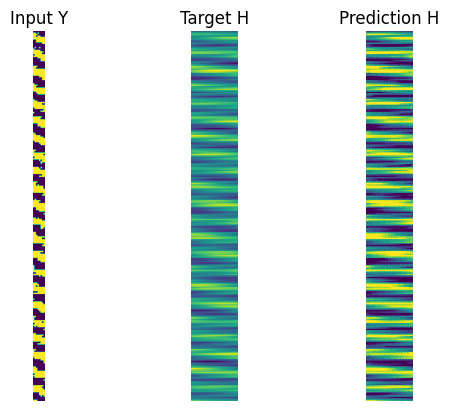

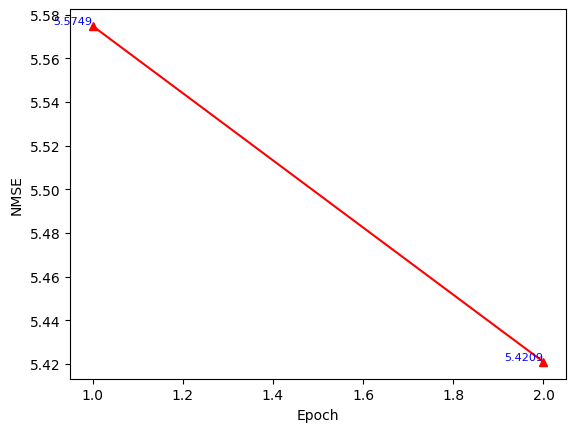

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 19.624516 , Discriminator loss: 0.03838766 , time: 0:06:52.852530
B/E: 103 / 2 , Generator loss: 19.300533 , Discriminator loss: 0.0002960329 , time: 0:07:06.572395
B/E: 206 / 2 , Generator loss: 18.809978 , Discriminator loss: 0.0021057578 , time: 0:07:20.089091
B/E: 309 / 2 , Generator loss: 19.754286 , Discriminator loss: 0.0005086169 , time: 0:07:32.922578
B/E: 412 / 2 , Generator loss: 18.502262 , Discriminator loss: 0.0047280723 , time: 0:07:45.341693
B/E: 515 / 2 , Generator loss: 17.513489 , Discriminator loss: 0.15458697 , time: 0:07:58.079695
B/E: 618 / 2 , Generator loss: 17.889175 , Discriminator loss: 0.10633544 , time: 0:08:10.528366
B/E: 721 / 2 , Generator loss: 19.839706 , Discriminator loss: 0.0030981568 , time: 0:08:23.380769
B/E: 824 / 2 , Generator loss: 18.921865 , Discriminator loss: 0.0018669176 , time: 0:08:36.196456
B/E: 927 / 2 , Generator loss: 15.802334 , Discriminator loss: 0.09163118 , time: 0:08:49.025849
B/E: 

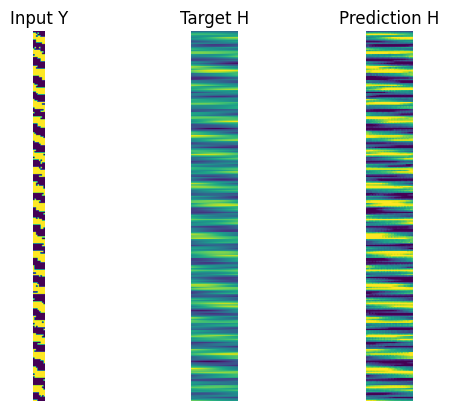

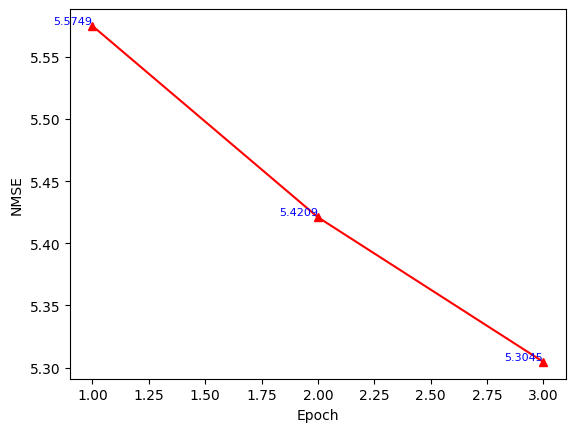

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 26.667587 , Discriminator loss: 0.7644384 , time: 0:10:16.914964
B/E: 103 / 3 , Generator loss: 17.031261 , Discriminator loss: 0.024910746 , time: 0:10:29.853232
B/E: 206 / 3 , Generator loss: 22.101036 , Discriminator loss: 0.1558207 , time: 0:10:42.238477
B/E: 309 / 3 , Generator loss: 23.97897 , Discriminator loss: 0.09538698 , time: 0:10:54.833546
B/E: 412 / 3 , Generator loss: 18.471804 , Discriminator loss: 0.009920463 , time: 0:11:08.503177
B/E: 515 / 3 , Generator loss: 16.637493 , Discriminator loss: 0.012573001 , time: 0:11:21.943944
B/E: 618 / 3 , Generator loss: 24.540188 , Discriminator loss: 0.047636345 , time: 0:11:34.603820
B/E: 721 / 3 , Generator loss: 18.651695 , Discriminator loss: 0.002208036 , time: 0:11:47.346564
B/E: 824 / 3 , Generator loss: 16.845596 , Discriminator loss: 0.017976286 , time: 0:12:00.190734
B/E: 927 / 3 , Generator loss: 16.494244 , Discriminator loss: 0.020925185 , time: 0:12:13.018015
B/E: 1030 / 3

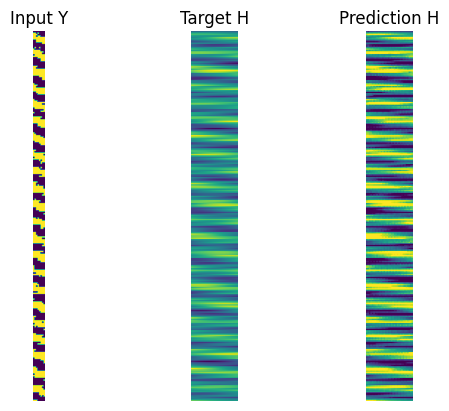

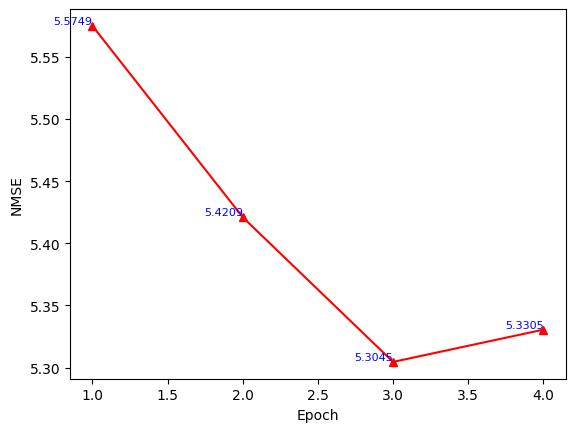

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 12.31393 , Discriminator loss: 2.783753 , time: 0:13:39.496147
B/E: 103 / 4 , Generator loss: 20.580109 , Discriminator loss: 0.0008857603 , time: 0:13:52.619385
B/E: 206 / 4 , Generator loss: 15.781685 , Discriminator loss: 0.06410616 , time: 0:14:05.591779
B/E: 309 / 4 , Generator loss: 20.61465 , Discriminator loss: 0.0003763625 , time: 0:14:18.565312
B/E: 412 / 4 , Generator loss: 27.921818 , Discriminator loss: 1.3007277 , time: 0:14:31.568996
B/E: 515 / 4 , Generator loss: 16.112759 , Discriminator loss: 0.015041452 , time: 0:14:44.511926
B/E: 618 / 4 , Generator loss: 18.144232 , Discriminator loss: 0.002993195 , time: 0:14:57.474634
B/E: 721 / 4 , Generator loss: 18.026316 , Discriminator loss: 0.007327908 , time: 0:15:10.359005
B/E: 824 / 4 , Generator loss: 16.379961 , Discriminator loss: 0.013019143 , time: 0:15:24.333802
B/E: 927 / 4 , Generator loss: 16.020735 , Discriminator loss: 0.01995996 , time: 0:15:37.083242
B/E: 1030 / 4 

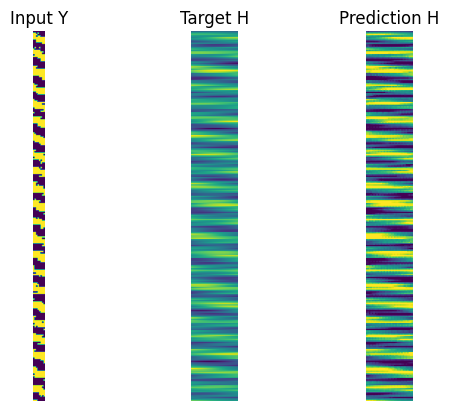

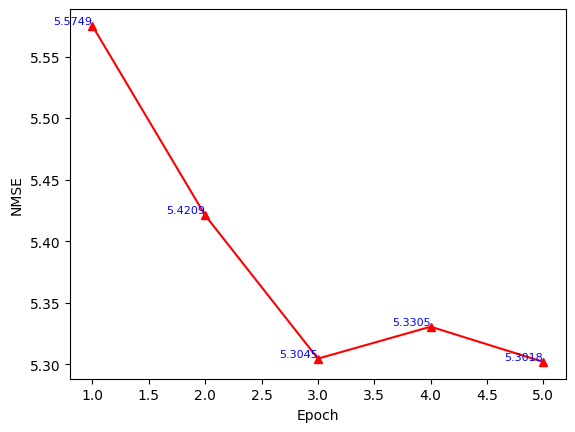

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 15.903804 , Discriminator loss: 0.043690234 , time: 0:17:04.045297
B/E: 103 / 5 , Generator loss: 23.25431 , Discriminator loss: 0.015138701 , time: 0:17:17.032251
B/E: 206 / 5 , Generator loss: 14.04576 , Discriminator loss: 0.08313368 , time: 0:17:30.086145
B/E: 309 / 5 , Generator loss: 21.336185 , Discriminator loss: 0.001077801 , time: 0:17:42.931522
B/E: 412 / 5 , Generator loss: 21.148443 , Discriminator loss: 0.0027060315 , time: 0:17:56.013667
B/E: 515 / 5 , Generator loss: 16.36831 , Discriminator loss: 0.01918776 , time: 0:18:09.082096
B/E: 618 / 5 , Generator loss: 20.284613 , Discriminator loss: 0.055372767 , time: 0:18:22.001137
B/E: 721 / 5 , Generator loss: 19.238564 , Discriminator loss: 0.0011441858 , time: 0:18:34.817678
B/E: 824 / 5 , Generator loss: 21.888485 , Discriminator loss: 0.0017379895 , time: 0:18:47.427179
B/E: 927 / 5 , Generator loss: 19.9294 , Discriminator loss: 0.0328291 , time: 0:19:00.200139
B/E: 1030 / 5

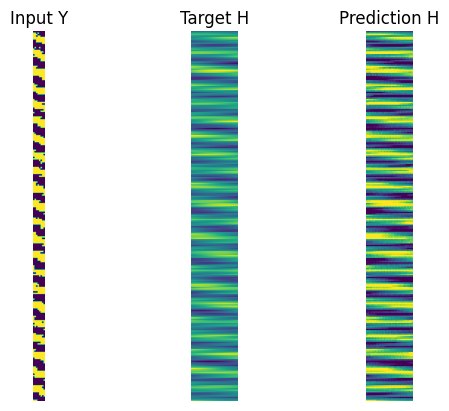

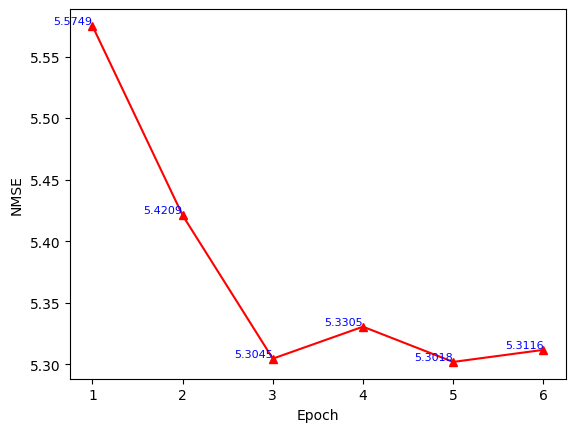

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 15.073188 , Discriminator loss: 0.082571276 , time: 0:20:26.986266
B/E: 103 / 6 , Generator loss: 16.506268 , Discriminator loss: 0.11705628 , time: 0:20:39.830763
B/E: 206 / 6 , Generator loss: 16.09287 , Discriminator loss: 0.019109858 , time: 0:20:52.688600
B/E: 309 / 6 , Generator loss: 18.425499 , Discriminator loss: 0.0031444968 , time: 0:21:05.477273
B/E: 412 / 6 , Generator loss: 19.761246 , Discriminator loss: 0.0029374466 , time: 0:21:18.257608
B/E: 515 / 6 , Generator loss: 17.360594 , Discriminator loss: 0.0042976346 , time: 0:21:31.167817
B/E: 618 / 6 , Generator loss: 20.04675 , Discriminator loss: 0.0054506278 , time: 0:21:44.026096
B/E: 721 / 6 , Generator loss: 16.103603 , Discriminator loss: 0.23323132 , time: 0:21:56.864226
B/E: 824 / 6 , Generator loss: 19.693203 , Discriminator loss: 0.0016413875 , time: 0:22:09.695104
B/E: 927 / 6 , Generator loss: 24.977867 , Discriminator loss: 0.23519881 , time: 0:22:22.462045
B/E: 10

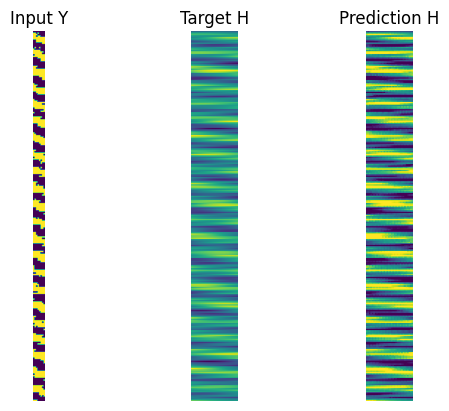

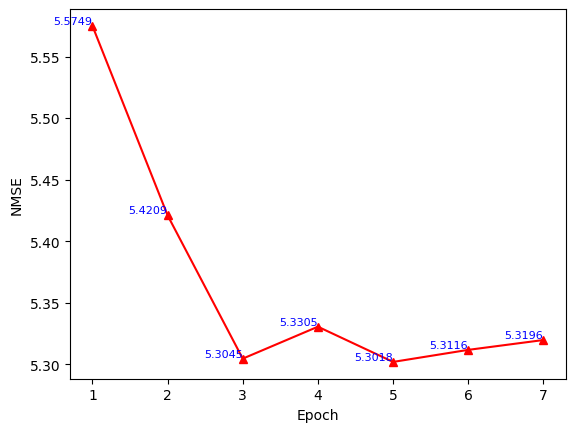

-----
EPOCH: 0
B/E: 0 / 0 , Generator loss: 21.330624 , Discriminator loss: 0.00019095403 , time: 0:00:04.749441
B/E: 103 / 0 , Generator loss: 21.292618 , Discriminator loss: 0.030320916 , time: 0:00:17.810307
B/E: 206 / 0 , Generator loss: 17.854755 , Discriminator loss: 0.00955306 , time: 0:00:30.606125
B/E: 309 / 0 , Generator loss: 19.981085 , Discriminator loss: 0.00078029523 , time: 0:00:43.295492
B/E: 412 / 0 , Generator loss: 23.232403 , Discriminator loss: 0.00037272228 , time: 0:00:55.995087
B/E: 515 / 0 , Generator loss: 23.126091 , Discriminator loss: 0.00038021072 , time: 0:01:08.774318
B/E: 618 / 0 , Generator loss: 17.63236 , Discriminator loss: 0.004427452 , time: 0:01:21.605625
B/E: 721 / 0 , Generator loss: 17.72707 , Discriminator loss: 0.0070475168 , time: 0:01:34.403438
B/E: 824 / 0 , Generator loss: 19.833782 , Discriminator loss: 0.0021617445 , time: 0:01:47.111275
B/E: 927 / 0 , Generator loss: 19.291187 , Discriminator loss: 0.0013528771 , time: 0:01:59.358707

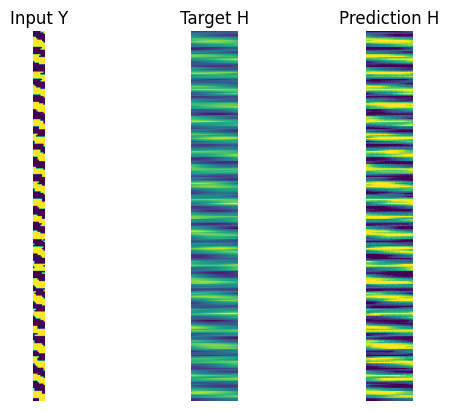

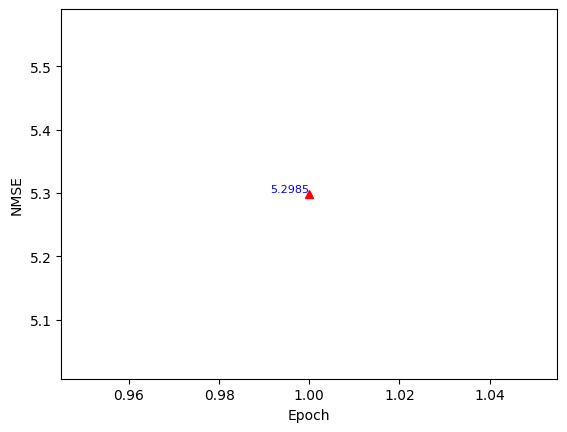

-----
EPOCH: 1
B/E: 0 / 1 , Generator loss: 16.169048 , Discriminator loss: 0.017391987 , time: 0:03:25.437294
B/E: 103 / 1 , Generator loss: 16.62421 , Discriminator loss: 0.011093967 , time: 0:03:39.688002
B/E: 206 / 1 , Generator loss: 19.372522 , Discriminator loss: 0.0006485489 , time: 0:03:52.492855
B/E: 309 / 1 , Generator loss: 22.649506 , Discriminator loss: 0.0057635023 , time: 0:04:05.050627
B/E: 412 / 1 , Generator loss: 19.816532 , Discriminator loss: 0.0019727354 , time: 0:04:17.556043
B/E: 515 / 1 , Generator loss: 21.478474 , Discriminator loss: 0.00042451973 , time: 0:04:30.116443
B/E: 618 / 1 , Generator loss: 24.00013 , Discriminator loss: 0.10076977 , time: 0:04:42.788888
B/E: 721 / 1 , Generator loss: 28.62144 , Discriminator loss: 4.3125553 , time: 0:04:55.663509
B/E: 824 / 1 , Generator loss: 17.052395 , Discriminator loss: 0.014884675 , time: 0:05:08.397415
B/E: 927 / 1 , Generator loss: 21.595245 , Discriminator loss: 0.003191695 , time: 0:05:21.153258
B/E: 103

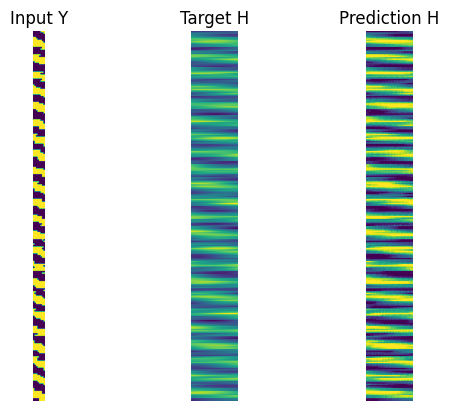

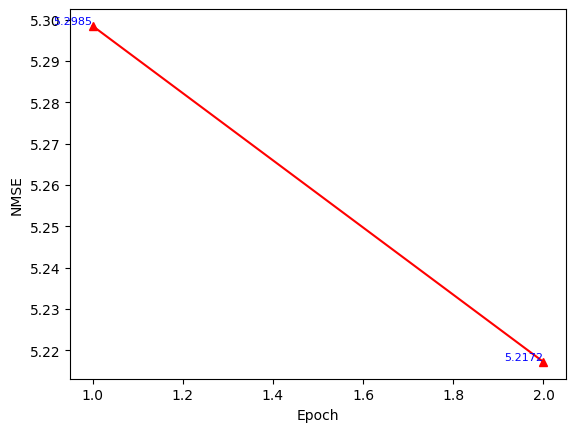

-----
EPOCH: 2
B/E: 0 / 2 , Generator loss: 17.501806 , Discriminator loss: 0.008382601 , time: 0:06:48.163839
B/E: 103 / 2 , Generator loss: 16.592968 , Discriminator loss: 0.10557581 , time: 0:07:00.946209
B/E: 206 / 2 , Generator loss: 19.627285 , Discriminator loss: 0.0017981587 , time: 0:07:13.514268
B/E: 309 / 2 , Generator loss: 21.636988 , Discriminator loss: 0.0010887319 , time: 0:07:26.353115
B/E: 412 / 2 , Generator loss: 22.419407 , Discriminator loss: 0.0005398516 , time: 0:07:40.190777
B/E: 515 / 2 , Generator loss: 21.065151 , Discriminator loss: 0.0062310593 , time: 0:07:53.039082
B/E: 618 / 2 , Generator loss: 18.085701 , Discriminator loss: 0.0040494767 , time: 0:08:05.837318
B/E: 721 / 2 , Generator loss: 20.646969 , Discriminator loss: 0.00043469114 , time: 0:08:18.778264
B/E: 824 / 2 , Generator loss: 21.03188 , Discriminator loss: 0.00032510274 , time: 0:08:31.779757
B/E: 927 / 2 , Generator loss: 21.206402 , Discriminator loss: 0.020559732 , time: 0:08:44.701305


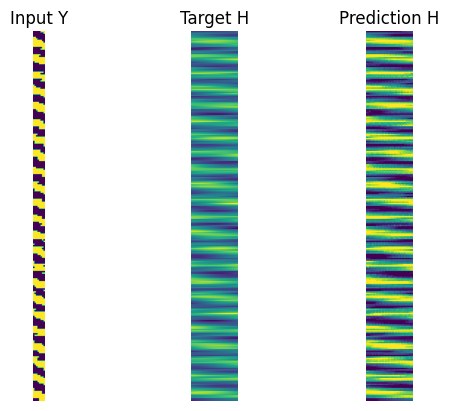

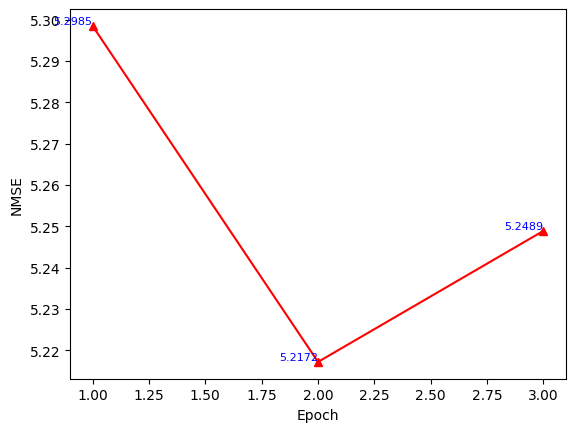

-----
EPOCH: 3
B/E: 0 / 3 , Generator loss: 16.820227 , Discriminator loss: 0.013247053 , time: 0:10:11.629567
B/E: 103 / 3 , Generator loss: 18.703468 , Discriminator loss: 0.0017464026 , time: 0:10:24.506638
B/E: 206 / 3 , Generator loss: 17.196207 , Discriminator loss: 0.007512008 , time: 0:10:37.275935
B/E: 309 / 3 , Generator loss: 20.472414 , Discriminator loss: 0.0007124726 , time: 0:10:50.125097
B/E: 412 / 3 , Generator loss: 25.87854 , Discriminator loss: 0.009839871 , time: 0:11:02.967354
B/E: 515 / 3 , Generator loss: 21.728477 , Discriminator loss: 0.0039671017 , time: 0:11:15.790864
B/E: 618 / 3 , Generator loss: 20.67992 , Discriminator loss: 0.00030909802 , time: 0:11:28.664864
B/E: 721 / 3 , Generator loss: 19.571367 , Discriminator loss: 0.0012730005 , time: 0:11:42.431512
B/E: 824 / 3 , Generator loss: 23.618214 , Discriminator loss: 0.00021087051 , time: 0:11:55.430704
B/E: 927 / 3 , Generator loss: 19.42744 , Discriminator loss: 0.06927704 , time: 0:12:08.154569
B/E

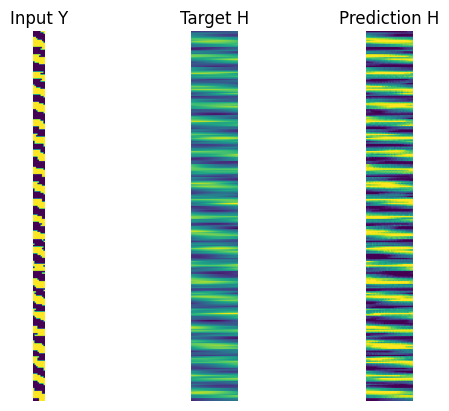

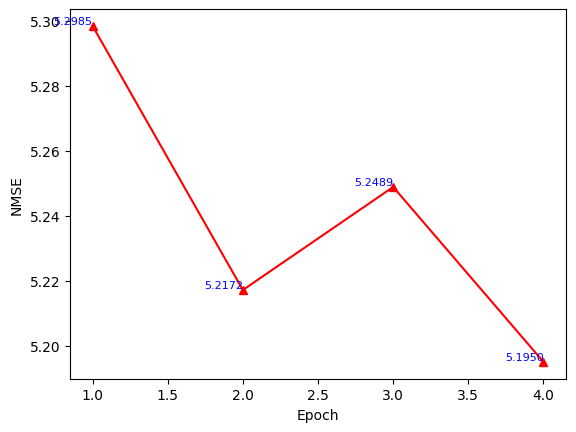

-----
EPOCH: 4
B/E: 0 / 4 , Generator loss: 22.077616 , Discriminator loss: 0.00024332386 , time: 0:13:35.511223
B/E: 103 / 4 , Generator loss: 20.919025 , Discriminator loss: 0.00061497017 , time: 0:13:48.733427
B/E: 206 / 4 , Generator loss: 18.563763 , Discriminator loss: 0.0013236791 , time: 0:14:01.694847
B/E: 309 / 4 , Generator loss: 19.040173 , Discriminator loss: 0.019847766 , time: 0:14:14.774756
B/E: 412 / 4 , Generator loss: 22.973042 , Discriminator loss: 0.00021346466 , time: 0:14:27.649834
B/E: 515 / 4 , Generator loss: 28.768764 , Discriminator loss: 1.1413856 , time: 0:14:40.695145
B/E: 618 / 4 , Generator loss: 20.67088 , Discriminator loss: 0.00034845472 , time: 0:14:53.500856
B/E: 721 / 4 , Generator loss: 16.039024 , Discriminator loss: 0.007156889 , time: 0:15:06.434208
B/E: 824 / 4 , Generator loss: 12.022857 , Discriminator loss: 4.7840695 , time: 0:15:19.249672
B/E: 927 / 4 , Generator loss: 19.201323 , Discriminator loss: 0.0019267516 , time: 0:15:32.400450
B/

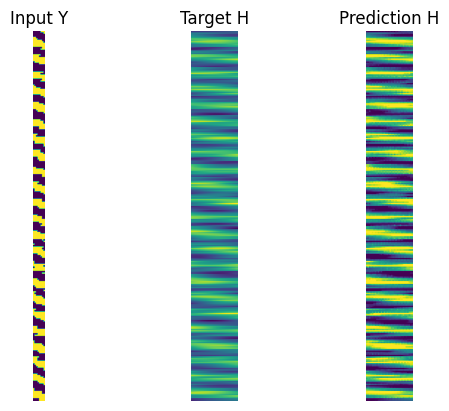

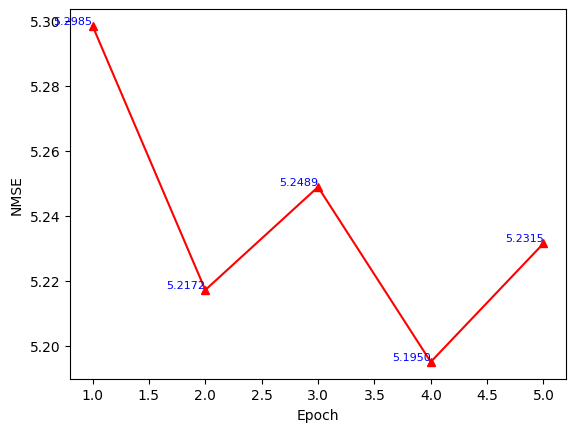

-----
EPOCH: 5
B/E: 0 / 5 , Generator loss: 21.131123 , Discriminator loss: 0.0008809142 , time: 0:17:00.217415
B/E: 103 / 5 , Generator loss: 19.562035 , Discriminator loss: 0.0003870325 , time: 0:17:13.361838
B/E: 206 / 5 , Generator loss: 20.360662 , Discriminator loss: 0.0018410424 , time: 0:17:26.237381
B/E: 309 / 5 , Generator loss: 21.599651 , Discriminator loss: 0.009237694 , time: 0:17:39.098724
B/E: 412 / 5 , Generator loss: 20.939434 , Discriminator loss: 0.0005316147 , time: 0:17:52.115468
B/E: 515 / 5 , Generator loss: 17.778687 , Discriminator loss: 0.004089944 , time: 0:18:04.967139
B/E: 618 / 5 , Generator loss: 18.79853 , Discriminator loss: 0.014652947 , time: 0:18:17.798636
B/E: 721 / 5 , Generator loss: 18.361324 , Discriminator loss: 0.0019382316 , time: 0:18:30.804546
B/E: 824 / 5 , Generator loss: 22.017036 , Discriminator loss: 0.00071687857 , time: 0:18:43.704777
B/E: 927 / 5 , Generator loss: 21.91589 , Discriminator loss: 0.00015787993 , time: 0:18:56.587758


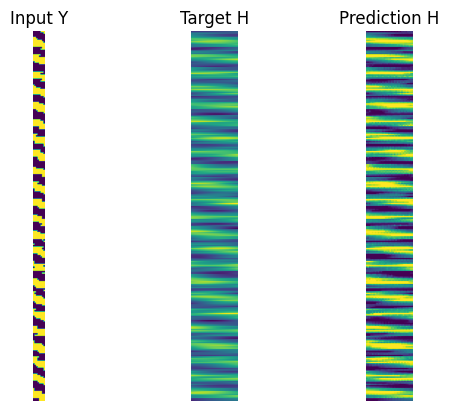

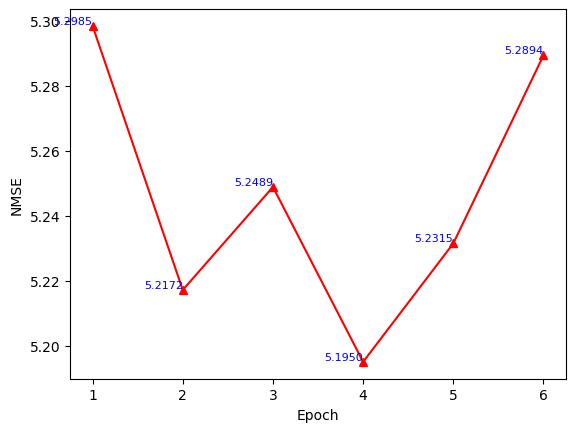

-----
EPOCH: 6
B/E: 0 / 6 , Generator loss: 20.441933 , Discriminator loss: 0.00035706183 , time: 0:20:24.777945
B/E: 103 / 6 , Generator loss: 20.13566 , Discriminator loss: 0.0011636713 , time: 0:20:37.846389
B/E: 206 / 6 , Generator loss: 20.291712 , Discriminator loss: 0.0015250792 , time: 0:20:50.691207
B/E: 309 / 6 , Generator loss: 20.98283 , Discriminator loss: 0.08862774 , time: 0:21:03.610683
B/E: 412 / 6 , Generator loss: 14.899324 , Discriminator loss: 0.09579956 , time: 0:21:16.623482
B/E: 515 / 6 , Generator loss: 22.061356 , Discriminator loss: 0.0017231411 , time: 0:21:29.600535
B/E: 618 / 6 , Generator loss: 21.02518 , Discriminator loss: 0.00042324583 , time: 0:21:42.467676
B/E: 721 / 6 , Generator loss: 22.469173 , Discriminator loss: 0.00010397349 , time: 0:21:55.344807
B/E: 824 / 6 , Generator loss: 21.330578 , Discriminator loss: 0.09666288 , time: 0:22:08.326508
B/E: 927 / 6 , Generator loss: 16.95846 , Discriminator loss: 0.060353346 , time: 0:22:21.123546
B/E: 

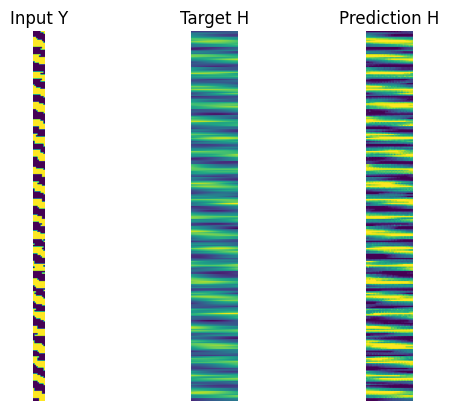

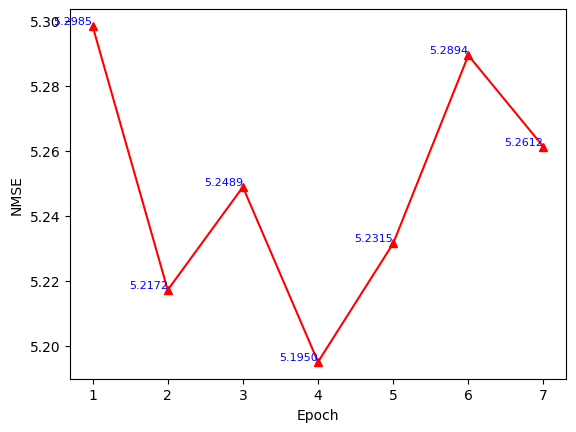

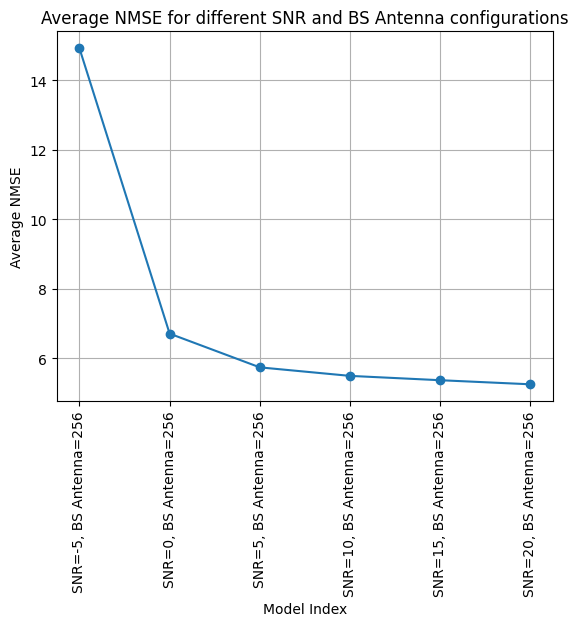

In [ ]:
if __name__ == "__main__":
    snr_list = [-5, 0, 5, 10, 15, 20]
    bs_ant_list = [256]
    avg_nmse = train(epochs=7, snr_list=snr_list, bs_ant_list=bs_ant_list)

    plt.plot(avg_nmse, marker='o')
    plt.xlabel('Model Index')
    plt.ylabel('Average NMSE')
    plt.title('Average NMSE for different SNR and BS Antenna configurations')
    plt.xticks(ticks=range(len(avg_nmse)), labels=[f'SNR={snr}, BS Antenna={bs_ant}' for snr in snr_list for bs_ant in bs_ant_list])
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()

##Visualization of the results obtained

Calculated avergae of all epochs for one particular SNR value for each set of antennas and plotted it on a single graph. Also calculated average so that one can compare which set works better at which SNR

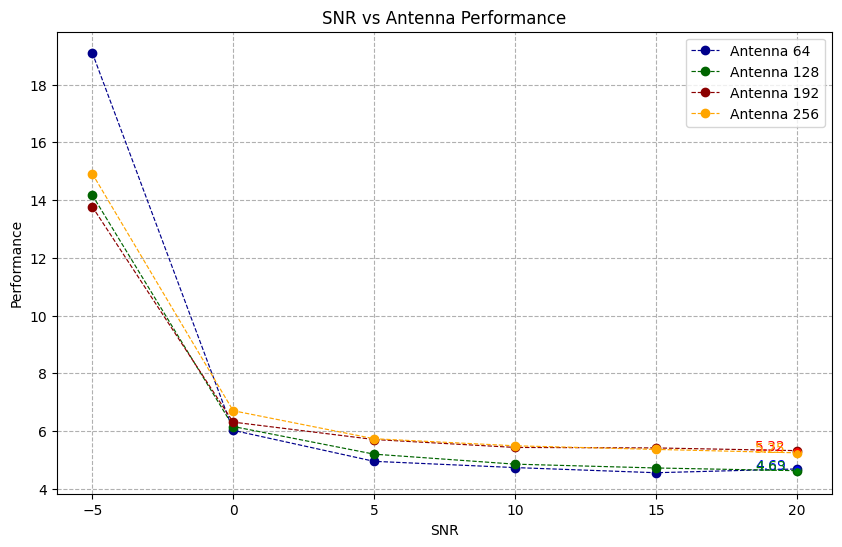

In [1]:
import matplotlib.pyplot as plt

# SNR values
snr = [-5, 0, 5, 10, 15, 20]

# Antenna data
ant64 = [19.10332, 6.02724, 4.95328, 4.73725, 4.55894, 4.68934]
ant128 = [14.17412, 6.15945, 5.20181, 4.85582, 4.72350, 4.62978]
ant192 = [13.77270, 6.31154, 5.70907, 5.43447, 5.41742, 5.32387]
ant256 = [14.91764, 6.70654, 5.73615, 5.49108, 5.36625, 5.24881]

# Function to annotate y axis value for every 5th SNR value for each antenna
def annotate_y_axis(ax, x, y, color):
    for i, (ex, ey) in enumerate(zip(x, y)):
        if (i + 1) % 6 == 0:
            ax.annotate(f'{ey:.2f}', xy=(ex, ey), xytext=(-30, 0), textcoords='offset points', fontsize=10, color=color)
            ax.scatter(ex, ey, color=color, s=15, zorder=5)  # Add small markers

# Plot
plt.figure(figsize=(10, 6))

# Plot each antenna data
plt.plot(snr, ant64, label='Antenna 64', marker='o', color='darkblue', linestyle='--', linewidth=0.85)
plt.plot(snr, ant128, label='Antenna 128', marker='o', color='darkgreen', linestyle='--', linewidth=0.85)
plt.plot(snr, ant192, label='Antenna 192', marker='o', color='darkred', linestyle='--', linewidth=0.85)
plt.plot(snr, ant256, label='Antenna 256', marker='o', color='orange', linestyle='--', linewidth=0.85)

# Add labels and title
plt.title('SNR vs Antenna Performance')
plt.xlabel('SNR')
plt.ylabel('Performance')
# plt.yscale('log')
plt.legend()
plt.grid(True, linestyle='--')

# Annotate every 5th SNR value for each antenna
annotate_y_axis(plt.gca(), snr, ant64, 'blue')
annotate_y_axis(plt.gca(), snr, ant128, 'green')
annotate_y_axis(plt.gca(), snr, ant192, 'red')
annotate_y_axis(plt.gca(), snr, ant256, 'orange')

# Show plot
plt.show()


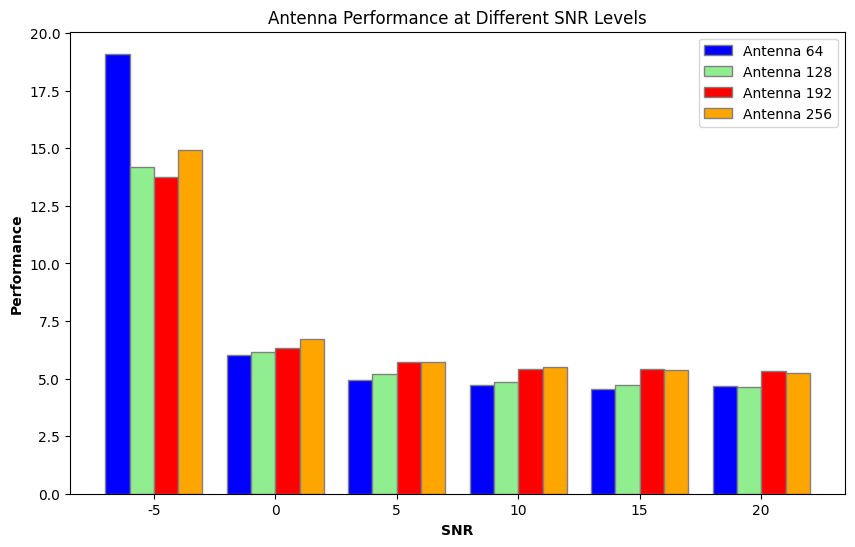

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# SNR values
snr = [-5, 0, 5, 10, 15, 20]

# Antenna data
ant64 = [19.10332, 6.02724, 4.95328, 4.73725, 4.55894, 4.68934]
ant128 = [14.17412, 6.15945, 5.20181, 4.85582, 4.72350, 4.62978]
ant192 = [13.77270, 6.31154, 5.70907, 5.43447, 5.41742, 5.32387]
ant256 = [14.91764, 6.70654, 5.73615, 5.49108, 5.36625, 5.24881]

# Set the width of the bars
bar_width = 0.2

# Set the positions of the bars on the x-axis
r1 = np.arange(len(snr))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]
r4 = [x + bar_width for x in r3]

# Plot
plt.figure(figsize=(10, 6))

plt.bar(r1, ant64, color='blue', width=bar_width, edgecolor='grey', label='Antenna 64')
plt.bar(r2, ant128, color='lightgreen', width=bar_width, edgecolor='grey', label='Antenna 128')
plt.bar(r3, ant192, color='red', width=bar_width, edgecolor='grey', label='Antenna 192')
plt.bar(r4, ant256, color='orange', width=bar_width, edgecolor='grey', label='Antenna 256')

# Add xticks on the middle of the group bars
plt.xlabel('SNR', fontweight='bold')
plt.ylabel('Performance', fontweight='bold')
plt.xticks([r + bar_width * 1.5 for r in range(len(snr))], snr)

# Add a legend
plt.legend()

# Show plot
plt.title('Antenna Performance at Different SNR Levels')
plt.show()


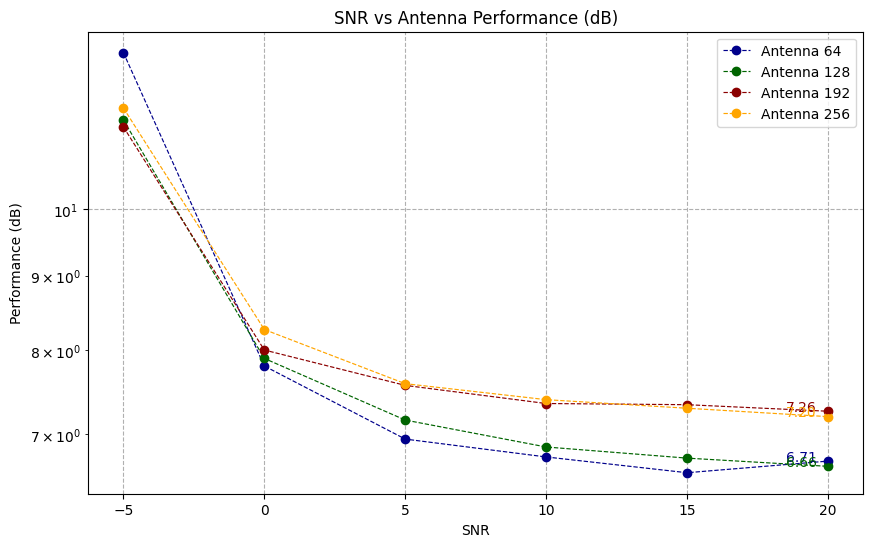

In [3]:
import matplotlib.pyplot as plt
import numpy as np

# Function to convert values to dB scale
def convert_to_db(values):
    return [10 * np.log10(value) for value in values]

# SNR values
snr = [-5, 0, 5, 10, 15, 20]

# Antenna data
ant64 = convert_to_db([19.10332, 6.02724, 4.95328, 4.73725, 4.55894, 4.68934])
ant128 = convert_to_db([14.17412, 6.15945, 5.20181, 4.85582, 4.72350, 4.62978])
ant192 = convert_to_db([13.77270, 6.31154, 5.70907, 5.43447, 5.41742, 5.32387])
ant256 = convert_to_db([14.91764, 6.70654, 5.73615, 5.49108, 5.36625, 5.24881])

# Function to annotate y axis value for every 5th SNR value for each antenna
def annotate_y_axis(ax, x, y, color):
    for i, (ex, ey) in enumerate(zip(x, y)):
        if (i + 1) % 6 == 0:
            ax.annotate(f'{ey:.2f}', xy=(ex, ey), xytext=(-30, 0), textcoords='offset points', fontsize=10, color=color)
            ax.scatter(ex, ey, color=color, s=15, zorder=5)  # Add small markers

# Plot
plt.figure(figsize=(10, 6))

# Plot each antenna data
plt.plot(snr, ant64, label='Antenna 64', marker='o', color='darkblue', linestyle='--', linewidth=0.85)
plt.plot(snr, ant128, label='Antenna 128', marker='o', color='darkgreen', linestyle='--', linewidth=0.85)
plt.plot(snr, ant192, label='Antenna 192', marker='o', color='darkred', linestyle='--', linewidth=0.85)
plt.plot(snr, ant256, label='Antenna 256', marker='o', color='orange', linestyle='--', linewidth=0.85)

# Add labels and title
plt.title('SNR vs Antenna Performance (dB)')
plt.xlabel('SNR')
plt.ylabel('Performance (dB)')
plt.yscale('log')
plt.legend()
plt.grid(True, linestyle='--')

# Annotate every 5th SNR value for each antenna
annotate_y_axis(plt.gca(), snr, ant64, 'darkblue')
annotate_y_axis(plt.gca(), snr, ant128, 'darkgreen')
annotate_y_axis(plt.gca(), snr, ant192, 'darkred')
annotate_y_axis(plt.gca(), snr, ant256, 'orange')

# Show plot
plt.show()


In [4]:
import plotly.graph_objects as go
import numpy as np

# Function to convert values to dB scale
def convert_to_db(values):
    return [10 * np.log10(value) for value in values]

# SNR values
snr = [-5, 0, 5, 10, 15, 20]

# Antenna data
ant64 = convert_to_db([19.10332, 6.02724, 4.95328, 4.73725, 4.55894, 4.68934])
ant128 = convert_to_db([14.17412, 6.15945, 5.20181, 4.85582, 4.72350, 4.62978])
ant192 = convert_to_db([13.77270, 6.31154, 5.70907, 5.43447, 5.41742, 5.32387])
ant256 = convert_to_db([14.91764, 6.70654, 5.73615, 5.49108, 5.36625, 5.24881])

# Plot each antenna data
fig = go.Figure()

fig.add_trace(go.Scatter(x=snr, y=ant64, mode='lines+markers', name='Antenna 64', line=dict(color='darkblue', width=1.5)))
fig.add_trace(go.Scatter(x=snr, y=ant128, mode='lines+markers', name='Antenna 128', line=dict(color='darkgreen', width=1.5)))
fig.add_trace(go.Scatter(x=snr, y=ant192, mode='lines+markers', name='Antenna 192', line=dict(color='darkred', width=1.5)))
fig.add_trace(go.Scatter(x=snr, y=ant256, mode='lines+markers', name='Antenna 256', line=dict(color='orange', width=1.5)))

# Define a callback for hover events
def update_trace(hover_data):
    if hover_data:
        hover_index = hover_data['points'][0]['curveNumber']
        for i, trace in enumerate(fig.data):
            if i == hover_index:
                trace.visible = True
            else:
                trace.visible = False

# Add labels and title
fig.update_layout(
    title='SNR vs Antenna Performance (dB)',
    xaxis=dict(title='SNR'),
    yaxis=dict(title='Performance (dB)'),
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode='closest'
)

# Assign the callback function to the plot
fig.update_traces(hoverinfo='skip', hovertemplate=None, visible=True)
fig.for_each_trace(lambda trace: trace.on_hover(update_trace))

# Show plot
fig.show()


In [5]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd

# Function to convert values to dB scale
def convert_to_db(values):
    return [10 * np.log10(value) for value in values]

# SNR values
snr = [-5, 0, 5, 10, 15, 20]

# Antenna data
ant64 = convert_to_db([19.10332, 6.02724, 4.95328, 4.73725, 4.55894, 4.68934])
ant128 = convert_to_db([14.17412, 6.15945, 5.20181, 4.85582, 4.72350, 4.62978])
ant192 = convert_to_db([13.77270, 6.31154, 5.70907, 5.43447, 5.41742, 5.32387])
ant256 = convert_to_db([14.91764, 6.70654, 5.73615, 5.49108, 5.36625, 5.24881])

# Calculate average performance and confidence interval
ant_values = [ant64, ant128, ant192, ant256]
ant_labels = ['Antenna 64', 'Antenna 128', 'Antenna 192', 'Antenna 256']
average_values = np.mean(ant_values, axis=0)

# Create dataframe for easier manipulation
data = {'SNR': snr, 'Average Performance': average_values}
df = pd.DataFrame(data)

# Plotly figures for each antenna
for ant_label, ant_value in zip(ant_labels, ant_values):
    fig = go.Figure()

    # Add absolute antenna value line
    fig.add_trace(go.Scatter(x=snr, y=ant_value, mode='lines', name=ant_label, line=dict(width=2)))

    # Add common average line
    fig.add_trace(go.Scatter(x=snr, y=average_values, mode='lines', name='Average', line=dict(color='black', width=2, dash='dash')))

    # Update layout
    fig.update_layout(title=f'SNR vs {ant_label} Performance',
                      xaxis_title='SNR',
                      yaxis_title='Performance (dB)',
                      hovermode='closest',
                      plot_bgcolor='white',
                      width=800,  # Square figure size
                      height=500)

    # Show plot
    fig.show()


In [6]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd

# Function to convert values to dB scale
def convert_to_db(values):
    return [10 * np.log10(value) for value in values]

# SNR values
snr = [-5, 0, 5, 10, 15, 20]

# Antenna data
ant64 = convert_to_db([19.10332, 6.02724, 4.95328, 4.73725, 4.55894, 4.68934])
ant128 = convert_to_db([14.17412, 6.15945, 5.20181, 4.85582, 4.72350, 4.62978])
ant192 = convert_to_db([13.77270, 6.31154, 5.70907, 5.43447, 5.41742, 5.32387])
ant256 = convert_to_db([14.91764, 6.70654, 5.73615, 5.49108, 5.36625, 5.24881])

# Calculate average performance and confidence interval
ant_values = [ant64, ant128, ant192, ant256]
ant_labels = ['Antenna 64', 'Antenna 128', 'Antenna 192', 'Antenna 256']
average_values = np.mean(ant_values, axis=0)

# Create dataframe for easier manipulation
data = {'SNR': snr, 'Average Performance': average_values}
df = pd.DataFrame(data)

# Plotly figures for each antenna
for ant_label, ant_value in zip(ant_labels, ant_values):
    fig = go.Figure()

    # Add absolute antenna value line
    fig.add_trace(go.Scatter(x=snr, y=ant_value, mode='lines', name=ant_label, line=dict(width=2, color='navy' if ant_label == 'Antenna 64' else 'green' if ant_label == 'Antenna 128' else 'red' if ant_label == 'Antenna 192' else 'orange')))

    # Add common average line
    fig.add_trace(go.Scatter(x=snr, y=average_values, mode='lines', name='Average', line=dict(color='black', width=2, dash='dash')))

    # Annotate each point on the absolute plot
    for x, y in zip(snr, ant_value):
        fig.add_annotation(x=x, y=y, text=f'{y:.2f}', showarrow=False)

    # Update layout
    fig.update_layout(title=f'SNR vs {ant_label} Performance',
                      xaxis_title='SNR',
                      yaxis_title='Performance (dB)',
                      hovermode='closest',
                      plot_bgcolor='white',
                      width=750,  # Square figure size
                      height=500,
                      legend=dict(x=0.01, y=0.99),
                      xaxis=dict(showgrid=True),
                      yaxis=dict(showgrid=True))

    # Show plot
    fig.show()


In [1]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd

# Function to convert values to dB scale
def convert_to_db(values):
    return [10 * np.log10(value) for value in values]

# SNR values
snr = [-5, 0, 5, 10, 15, 20]

# Antenna data
ant64 = convert_to_db([19.10332, 6.02724, 4.95328, 4.73725, 4.55894, 4.68934])
ant128 = convert_to_db([14.17412, 6.15945, 5.20181, 4.85582, 4.72350, 4.62978])
ant192 = convert_to_db([13.77270, 6.31154, 5.70907, 5.43447, 5.41742, 5.32387])
ant256 = convert_to_db([14.91764, 6.70654, 5.73615, 5.49108, 5.36625, 5.24881])

# Calculate average performance and confidence interval
ant_values = [ant64, ant128, ant192, ant256]
ant_labels = ['64 Antennas', '128 Antennas', '192 Antennas', '256 Antennas']
average_values = np.mean(ant_values, axis=0)

# Create dataframe for easier manipulation
data = {'SNR': snr, 'Average Performance': average_values}
df = pd.DataFrame(data)

# Plotly figures for each antenna
for ant_label, ant_value in zip(ant_labels, ant_values):
    fig = go.Figure()

    # Add absolute antenna value line with markers
    fig.add_trace(go.Scatter(x=snr, y=ant_value, mode='lines+markers', name=ant_label, line=dict(width=2, color='darkblue' if ant_label == '64 Antennas' else 'darkgreen' if ant_label == '128 Antennas' else 'darkred' if ant_label == '192 Antennas' else 'orange'), marker=dict(symbol='circle', size=8)))

    # Add common average line
    fig.add_trace(go.Scatter(x=snr, y=average_values, mode='lines', name='Average', line=dict(color='black', width=2, dash='dash')))

    # Annotate each point on the absolute plot
    for x, y in zip(snr, ant_value):
        fig.add_annotation(x=x, y=y, text=f'{y:.2f}', showarrow=False)

    # Update layout
    fig.update_layout(title=f'SNR vs {ant_label} Performance',
                      xaxis_title='SNR',
                      yaxis_title='Average NMSE (dB)',
                      hovermode='closest',
                      plot_bgcolor='white',
                      width=750,  # Square figure size
                      height=500,
                      legend=dict(x=0.99, y=0.99, xanchor='right', yanchor='top'),
                      xaxis=dict(showgrid=True, gridcolor='lightgrey'),
                      yaxis=dict(showgrid=True, gridcolor='lightgrey'))

    # Show plot
    fig.show()
